In [ ]:
from google.colab import drive
drive.mount('/content/drive')



Mounted at /content/drive


**Extract the zip files**

In [ ]:
import zipfile
import os

# List of zip files
zip_files = ["/content/archive (1).zip", "/content/archive (2).zip"]

# Extract each file
for zip_path in zip_files:
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        extract_path = "/content/extracted_" + os.path.basename(zip_path).replace(".zip", "").replace(" ", "_")
        os.makedirs(extract_path, exist_ok=True)
        zip_ref.extractall(extract_path)
        print(f"Extracted: {zip_path} to {extract_path}")


Extracted: /content/archive (1).zip to /content/extracted_archive_(1)
Extracted: /content/archive (2).zip to /content/extracted_archive_(2)


**Import Libraries and Load the Data**

In [ ]:
import pandas as pd

# Load the datasets
traffic_df = pd.read_csv('/content/extracted_archive_(1)/Traffic_Collisions_Toronto_data.csv')
ksi_df = pd.read_csv('/content/extracted_archive_(2)/KSI.csv')


**Inspect the Data**

In [ ]:
# Traffic dataset
print("Traffic Collisions Dataset Info:")
print(traffic_df.shape)
print(traffic_df.columns)
print(traffic_df.head())

# KSI dataset
print("\nKSI Dataset Info:")
print(ksi_df.shape)
print(ksi_df.columns)
print(ksi_df.head())


Traffic Collisions Dataset Info:
(499538, 19)
Index(['X', 'Y', 'OBJECTID', 'EventUniqueId', 'OccurrenceDate', 'Month',
       'Day_of_Week', 'Year', 'Hour', 'Division', 'Atom', 'Neighbourhood',
       'Fatalities', 'Injury_Collisions', 'FTR_Collisions', 'PD_Collisions',
       'Longitude', 'Latitude', 'ObjectId2'],
      dtype='object')
     X    Y  OBJECTID   EventUniqueId          OccurrenceDate     Month  \
0  0.0  0.0         1     GO-20141001  2014/02/07 05:00:00+00  February   
1  0.0  0.0         2  GO-20141225593  2014/01/02 05:00:00+00   January   
2  0.0  0.0         3  GO-20141260499  2014/01/01 05:00:00+00   January   
3  0.0  0.0         4  GO-20141260663  2014/01/01 05:00:00+00   January   
4  0.0  0.0         5  GO-20141261162  2014/01/01 05:00:00+00   January   

  Day_of_Week  Year  Hour Division Atom Neighbourhood  Fatalities  \
0      Friday  2014    16      NSA  NSA           NSA           0   
1    Thursday  2014     3      NSA  NSA           NSA           0   
2  

- **Clean the KSI Dataset**  
 - Dropped unused index/object columns.  
 - Parsed DATE into datetime and renamed to Date.  
 - Standardized column names (Latitude, Longitude, Neighbourhood, Police_Division).  
 - Cleaned the Fatalities column similarly to traffic_df.

In [ ]:
# Drop unnecessary columns
traffic_df = traffic_df.drop(columns=['OBJECTID', 'ObjectId2'], errors='ignore')

# Convert 'OccurrenceDate' to datetime
traffic_df['OccurrenceDate'] = pd.to_datetime(traffic_df['OccurrenceDate'], errors='coerce')

# Rename key columns for consistency
traffic_df = traffic_df.rename(columns={
    'OccurrenceDate': 'Date',
    'Longitude': 'Longitude',
    'Latitude': 'Latitude',
    'Neighbourhood': 'Neighbourhood',
    'Division': 'Police_Division'
})

# Optional: Fill or flag missing values
traffic_df['Fatalities'] = pd.to_numeric(traffic_df['Fatalities'], errors='coerce').fillna(0)

# Display cleaned traffic_df
print("\nCleaned Traffic Dataset Sample:")
print(traffic_df.head())



Cleaned Traffic Dataset Sample:
     X    Y   EventUniqueId                      Date     Month Day_of_Week  \
0  0.0  0.0     GO-20141001 2014-02-07 05:00:00+00:00  February      Friday   
1  0.0  0.0  GO-20141225593 2014-01-02 05:00:00+00:00   January    Thursday   
2  0.0  0.0  GO-20141260499 2014-01-01 05:00:00+00:00   January   Wednesday   
3  0.0  0.0  GO-20141260663 2014-01-01 05:00:00+00:00   January   Wednesday   
4  0.0  0.0  GO-20141261162 2014-01-01 05:00:00+00:00   January   Wednesday   

   Year  Hour Police_Division Atom Neighbourhood  Fatalities  \
0  2014    16             NSA  NSA           NSA           0   
1  2014     3             NSA  NSA           NSA           0   
2  2014     2             NSA  NSA           NSA           0   
3  2014     3             NSA  NSA           NSA           0   
4  2014     5             NSA  NSA           NSA           0   

  Injury_Collisions FTR_Collisions PD_Collisions  Longitude  Latitude  
0                NO             NO 

- **Clean traffic_df**  
 - Column Names: The code now uses the Date column for datetime conversion (since your data contains Date instead of OccurrenceDate).  
 - Error Handling: If there were any non-date values in the Date column, they will be coerced to NaT (Not a Time).  
 - Data Cleaning: Placeholder values ('NSA') are replaced with NaN, and Fatalities are converted to numeric values.  
 - Duplicate Removal: Duplicates in the dataset are dropped.  
 - Extracting Month and Weekday: The Month and DayOfWeek columns are created for better analysis.

**Data Cleaning and Preparation for KSI Dataset**

In [ ]:
# Drop unnecessary columns
ksi_df = ksi_df.drop(columns=['INDEX_', 'ObjectId'], errors='ignore')

# Convert 'DATE' to datetime
ksi_df['DATE'] = pd.to_datetime(ksi_df['DATE'], errors='coerce')

# Rename key columns for consistency
ksi_df = ksi_df.rename(columns={
    'DATE': 'Date',
    'LONGITUDE': 'Longitude',
    'LATITUDE': 'Latitude',
    'NEIGHBOURHOOD': 'Neighbourhood',
    'POLICE_DIVISION': 'Police_Division',
    'FATAL_NO': 'Fatalities'
})

# Optional: Fill or convert fatality values
ksi_df['Fatalities'] = pd.to_numeric(ksi_df['Fatalities'], errors='coerce').fillna(0)

# Display cleaned ksi_df
print("\nCleaned KSI Dataset Sample:")
print(ksi_df.head())



Cleaned KSI Dataset Sample:
              X             Y  ACCNUM  YEAR                      Date  TIME  \
0 -8.844611e+06  5.412414e+06  892658  2006 2006-03-11 05:00:00+00:00   852   
1 -8.844611e+06  5.412414e+06  892658  2006 2006-03-11 05:00:00+00:00   852   
2 -8.816480e+06  5.434843e+06  892810  2006 2006-03-11 05:00:00+00:00   915   
3 -8.816480e+06  5.434843e+06  892810  2006 2006-03-11 05:00:00+00:00   915   
4 -8.822759e+06  5.424516e+06  892682  2006 2006-03-12 05:00:00+00:00   240   

   HOUR          STREET1           STREET2  OFFSET  ... EMERG_VEH PASSENGER  \
0     8       BLOOR ST W       DUNDAS ST W  <Null>  ...    <Null>    <Null>   
1     8       BLOOR ST W       DUNDAS ST W  <Null>  ...    <Null>    <Null>   
2     9  MORNINGSIDE AVE    SHEPPARD AVE E  <Null>  ...    <Null>    <Null>   
3     9  MORNINGSIDE AVE    SHEPPARD AVE E  <Null>  ...    <Null>    <Null>   
4     2   EGLINTON AVE E  COMMONWEALTH AVE  <Null>  ...    <Null>    <Null>   

  SPEEDING AG_DRIV  R

In [ ]:
# Check column names
print(traffic_df.columns)


Index(['X', 'Y', 'EventUniqueId', 'Date', 'Month', 'Day_of_Week', 'Year',
       'Hour', 'Police_Division', 'Atom', 'Neighbourhood', 'Fatalities',
       'Injury_Collisions', 'FTR_Collisions', 'PD_Collisions', 'Longitude',
       'Latitude'],
      dtype='object')


In [ ]:
# Rename key columns for consistency
traffic_df = traffic_df.rename(columns={
    'occurred_at': 'Date',
    'Longitude': 'Longitude',
    'Latitude': 'Latitude',
    'Neighbourhood': 'Neighbourhood',
    'Division': 'Police_Division'
})


In [ ]:
# Check if 'OccurrenceDate' exists before attempting to convert
if 'OccurrenceDate' in traffic_df.columns:
    traffic_df['OccurrenceDate'] = pd.to_datetime(traffic_df['OccurrenceDate'], errors='coerce')
else:
    print("'OccurrenceDate' column not found.")


'OccurrenceDate' column not found.


**Data Cleaning and Preparation for Traffic Dataset**

In [ ]:
import pandas as pd
import numpy as np

# Drop unnecessary columns
traffic_df = traffic_df.drop(columns=['OBJECTID', 'ObjectId2'], errors='ignore')

# Convert 'Date' to datetime
traffic_df['Date'] = pd.to_datetime(traffic_df['Date'], errors='coerce')

# Rename key columns for consistency
traffic_df = traffic_df.rename(columns={
    'Longitude': 'Longitude',
    'Latitude': 'Latitude',
    'Neighbourhood': 'Neighbourhood',
    'Division': 'Police_Division'
})

# Replace placeholder values with NaN (e.g., 'NSA' placeholder)
traffic_df.replace('NSA', np.nan, inplace=True)

# Convert Fatalities to numeric and fill missing with 0
traffic_df['Fatalities'] = pd.to_numeric(traffic_df['Fatalities'], errors='coerce').fillna(0)

# Drop duplicates
traffic_df.drop_duplicates(inplace=True)

# Optional: Extract month and weekday
traffic_df['Month'] = traffic_df['Date'].dt.month_name()
traffic_df['DayOfWeek'] = traffic_df['Date'].dt.day_name()

# View cleaned traffic dataset
print("\nCleaned Traffic Dataset Sample:")
print(traffic_df.head())



Cleaned Traffic Dataset Sample:
     X    Y   EventUniqueId                      Date     Month Day_of_Week  \
0  0.0  0.0     GO-20141001 2014-02-07 05:00:00+00:00  February      Friday   
1  0.0  0.0  GO-20141225593 2014-01-02 05:00:00+00:00   January    Thursday   
2  0.0  0.0  GO-20141260499 2014-01-01 05:00:00+00:00   January   Wednesday   
3  0.0  0.0  GO-20141260663 2014-01-01 05:00:00+00:00   January   Wednesday   
4  0.0  0.0  GO-20141261162 2014-01-01 05:00:00+00:00   January   Wednesday   

   Year  Hour Police_Division Atom Neighbourhood  Fatalities  \
0  2014    16             NaN  NaN           NaN           0   
1  2014     3             NaN  NaN           NaN           0   
2  2014     2             NaN  NaN           NaN           0   
3  2014     3             NaN  NaN           NaN           0   
4  2014     5             NaN  NaN           NaN           0   

  Injury_Collisions FTR_Collisions PD_Collisions  Longitude  Latitude  \
0                NO             NO

In [ ]:
# Check available columns to verify the exact column names
print("\nColumn Names in the KSI Dataset:")
print(ksi_df.columns)

# If the 'DATE' column is found with different casing, let's inspect and rename it
ksi_df.columns = ksi_df.columns.str.strip()  # Remove any leading/trailing spaces



Column Names in the KSI Dataset:
Index(['X', 'Y', 'ACCNUM', 'YEAR', 'Date', 'TIME', 'HOUR', 'STREET1',
       'STREET2', 'OFFSET', 'ROAD_CLASS', 'DISTRICT', 'WARDNUM', 'DIVISION',
       'Latitude', 'Longitude', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY',
       'LIGHT', 'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE',
       'INJURY', 'Fatalities', 'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT',
       'DRIVCOND', 'PEDTYPE', 'PEDACT', 'PEDCOND', 'CYCLISTYPE', 'CYCACT',
       'CYCCOND', 'PEDESTRIAN', 'CYCLIST', 'AUTOMOBILE', 'MOTORCYCLE', 'TRUCK',
       'TRSN_CITY_VEH', 'EMERG_VEH', 'PASSENGER', 'SPEEDING', 'AG_DRIV',
       'REDLIGHT', 'ALCOHOL', 'DISABILITY', 'Police_Division', 'HOOD_ID',
       'Neighbourhood'],
      dtype='object')


In [ ]:
import pandas as pd
import numpy as np

# Drop unnecessary columns
ksi_df = ksi_df.drop(columns=['INDEX_', 'ObjectId'], errors='ignore')

# Convert 'Date' to datetime
ksi_df['Date'] = pd.to_datetime(ksi_df['Date'], errors='coerce')

# Rename key columns for consistency
ksi_df = ksi_df.rename(columns={
    'Date': 'Date',
    'Longitude': 'Longitude',
    'Latitude': 'Latitude',
    'Neighbourhood': 'Neighbourhood',
    'Police_Division': 'Police_Division',
    'Fatalities': 'Fatalities'
})

# Replace placeholder values with NaN
ksi_df.replace('<Null>', np.nan, inplace=True)

# Convert Fatalities to numeric and fill missing with 0
ksi_df['Fatalities'] = pd.to_numeric(ksi_df['Fatalities'], errors='coerce').fillna(0)

# Drop duplicates
ksi_df.drop_duplicates(inplace=True)

# Optional: Extract month and weekday
ksi_df['Month'] = ksi_df['Date'].dt.month_name()
ksi_df['DayOfWeek'] = ksi_df['Date'].dt.day_name()

# View cleaned KSI dataset
print("\nCleaned KSI Dataset Sample:")
print(ksi_df.head())



Cleaned KSI Dataset Sample:
              X             Y  ACCNUM  YEAR                      Date  TIME  \
0 -8.844611e+06  5.412414e+06  892658  2006 2006-03-11 05:00:00+00:00   852   
1 -8.844611e+06  5.412414e+06  892658  2006 2006-03-11 05:00:00+00:00   852   
2 -8.816480e+06  5.434843e+06  892810  2006 2006-03-11 05:00:00+00:00   915   
3 -8.816480e+06  5.434843e+06  892810  2006 2006-03-11 05:00:00+00:00   915   
4 -8.822759e+06  5.424516e+06  892682  2006 2006-03-12 05:00:00+00:00   240   

   HOUR          STREET1           STREET2 OFFSET  ... SPEEDING AG_DRIV  \
0     8       BLOOR ST W       DUNDAS ST W    NaN  ...      NaN     Yes   
1     8       BLOOR ST W       DUNDAS ST W    NaN  ...      NaN     Yes   
2     9  MORNINGSIDE AVE    SHEPPARD AVE E    NaN  ...      NaN     Yes   
3     9  MORNINGSIDE AVE    SHEPPARD AVE E    NaN  ...      NaN     Yes   
4     2   EGLINTON AVE E  COMMONWEALTH AVE    NaN  ...      NaN     NaN   

  REDLIGHT ALCOHOL  DISABILITY  Police_Divisi

**Checking Missing Values in Key Join Columns (Longitude, Latitude, Date, Police_Division)**

In [ ]:
# Check for missing values in the key columns for both datasets
print("Missing values in Traffic dataset (join columns):")
print(traffic_df[['Longitude', 'Latitude', 'Date', 'Police_Division']].isnull().sum())

print("\nMissing values in KSI dataset (join columns):")
print(ksi_df[['Longitude', 'Latitude', 'Date', 'Police_Division']].isnull().sum())


Missing values in Traffic dataset (join columns):
Longitude              0
Latitude               0
Date                   0
Police_Division    69997
dtype: int64

Missing values in KSI dataset (join columns):
Longitude          0
Latitude           0
Date               0
Police_Division    0
dtype: int64


In [ ]:
# Check unique values of join columns in both datasets
print("Unique 'Longitude' values in Traffic dataset:")
print(traffic_df['Longitude'].unique())

print("\nUnique 'Longitude' values in KSI dataset:")
print(ksi_df['Longitude'].unique())

# Repeat for other join columns (Latitude, Date, Police_Division)


Unique 'Longitude' values in Traffic dataset:
[  0.         -79.13288116 -79.13217549 ... -79.64239754 -79.63592147
 -79.63917958]

Unique 'Longitude' values in KSI dataset:
[-79.45249  -79.199786 -79.25619  ... -79.410084 -79.238926 -79.232021]


**Preprocessing: Rounding Coordinates, Formatting Dates, and Cleaning Police Division Names**

In [ ]:
traffic_df['Police_Division'] = traffic_df['Police_Division'].fillna('Unknown')


In [ ]:
traffic_df = traffic_df[traffic_df['Longitude'] != 0.0]


In [ ]:
traffic_df['Longitude'] = traffic_df['Longitude'].round(4)
traffic_df['Latitude'] = traffic_df['Latitude'].round(4)
ksi_df['Longitude'] = ksi_df['Longitude'].round(4)
ksi_df['Latitude'] = ksi_df['Latitude'].round(4)


In [ ]:
traffic_df['Date'] = pd.to_datetime(traffic_df['Date']).dt.date
ksi_df['Date'] = pd.to_datetime(ksi_df['Date']).dt.date


In [ ]:
traffic_df['Police_Division'] = traffic_df['Police_Division'].astype(str).str.lower().str.strip()
ksi_df['Police_Division'] = ksi_df['Police_Division'].astype(str).str.lower().str.strip()


In [ ]:
print(ksi_df.columns)


Index(['X', 'Y', 'ACCNUM', 'YEAR', 'Date', 'TIME', 'HOUR', 'STREET1',
       'STREET2', 'OFFSET', 'ROAD_CLASS', 'DISTRICT', 'WARDNUM', 'DIVISION',
       'Latitude', 'Longitude', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY',
       'LIGHT', 'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE',
       'INJURY', 'Fatalities', 'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT',
       'DRIVCOND', 'PEDTYPE', 'PEDACT', 'PEDCOND', 'CYCLISTYPE', 'CYCACT',
       'CYCCOND', 'PEDESTRIAN', 'CYCLIST', 'AUTOMOBILE', 'MOTORCYCLE', 'TRUCK',
       'TRSN_CITY_VEH', 'EMERG_VEH', 'PASSENGER', 'SPEEDING', 'AG_DRIV',
       'REDLIGHT', 'ALCOHOL', 'DISABILITY', 'Police_Division', 'HOOD_ID',
       'Neighbourhood', 'Month', 'DayOfWeek'],
      dtype='object')


In [ ]:
# Drop columns that are completely empty
final_df = final_df.dropna(axis=1, how='all')


In [ ]:
for col in ['INJURY', 'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND']:
    final_df[col] = final_df[col].fillna('Unknown')


**Exploratory Analysis: Unique Non-Null Values in Fully and Partially Missing Columns**

In [ ]:
# Fully missing columns — check unique non-null values
fully_empty_cols = [
    'PEDTYPE', 'PEDACT', 'PEDCOND', 'CYCLISTYPE', 'CYCACT', 'CYCCOND',
    'MOTORCYCLE', 'TRUCK', 'TRSN_CITY_VEH', 'EMERG_VEH',
    'REDLIGHT', 'ALCOHOL', 'DISABILITY'
]

# Partially missing columns
partially_empty_cols = ['PEDESTRIAN', 'CYCLIST', 'PASSENGER', 'SPEEDING',
                        'ALCOHOL', 'DISABILITY', 'REDLIGHT', 'TRSN_CITY_VEH', 'EMERG_VEH',
                        'MOTORCYCLE', 'TRUCK']

# Get unique non-null values in each column
for col in fully_empty_cols + partially_empty_cols:
    print(f"Unique values in column '{col}':")
    print(final_df[col].dropna().unique())
    print("-" * 50)


Unique values in column 'PEDTYPE':
['Vehicle is going straight thru inter.while ped cross with ROW'
 'Vehicle turns left while ped crosses with ROW at inter.'
 'Vehicle is going straight thru inter.while ped cross without ROW'
 'Vehicle hits the pedestrian walking or running out from between parked vehicles at mid-block'
 'Pedestrian hit at mid-block' 'Pedestrian hit on sidewalk or shoulder'
 'Vehicle turns right while ped crosses without ROW at inter.'
 'Vehicle turns left while ped crosses without ROW at inter.'
 'Vehicle turns right while ped crosses with ROW at inter.'
 'Pedestrian hit a PXO/ped. Mid-block signal'
 'Vehicle is reversing and hits pedestrian'
 'Pedestrian hit at private driveway' 'Other / Undefined' 'Unknown'
 'Pedestrian involved in a collision with transit vehicle anywhere along roadway']
--------------------------------------------------
Unique values in column 'PEDACT':
['Crossing with right of way' 'Crossing without right of way'
 'Crossing, no Traffic Control' 

In [ ]:
condition_cols = ['PEDTYPE', 'PEDACT', 'PEDCOND', 'CYCLISTYPE', 'CYCACT', 'CYCCOND']
for col in condition_cols:
    final_df[col] = final_df[col].fillna('Not Involved')


In [ ]:
binary_cols = ['ALCOHOL', 'DISABILITY', 'REDLIGHT', 'TRSN_CITY_VEH', 'EMERG_VEH',
               'PEDESTRIAN', 'CYCLIST', 'PASSENGER', 'SPEEDING']

for col in binary_cols:
    final_df[col] = final_df[col].fillna('No')


In [ ]:
vehicle_cols = ['MOTORCYCLE', 'TRUCK']
for col in vehicle_cols:
    final_df[col] = final_df[col].fillna('No')


In [ ]:
final_df.dtypes


,0
X,float64
Y,float64
EventUniqueId,object
Date,object
Month,object
...,...
Police_Division,object
HOOD_ID,int64
Neighbourhood,object
Month,object


In [ ]:
binary_cols = ['ALCOHOL', 'DISABILITY', 'REDLIGHT', 'TRSN_CITY_VEH', 'EMERG_VEH',
               'PEDESTRIAN', 'CYCLIST', 'PASSENGER', 'SPEEDING', 'MOTORCYCLE', 'TRUCK']

for col in binary_cols:
    final_df[col] = final_df[col].map({'Yes': 1, 'No': 0})


**Column Removal: Dropping Empty, Zero-Only, and 'Not Involved'-Dominated Features**  
- **Columns with Missing Data (OFFSET):**  
 - If a column has no values (completely empty), it doesn't provide any meaningful information for your analysis or modeling. The column OFFSET in your case might be empty, and if it has no value, keeping it in the dataset could add unnecessary noise or complexity without contributing to your analysis.  
- ** Columns with All Zero Values (Fatalities, MOTORCYCLE, TRUCK, etc.):**  
 - If a column consists of only one value (e.g., all zeros), it doesn’t provide variability, which is essential for modeling or analysis. For example, if the MOTORCYCLE and TRUCK columns have only 'Yes' or zeros, it won't add much value because the column doesn't have any variation.  
 - In this case, if these columns are all filled with zeros or have a constant value across all rows, they won’t help in distinguishing data points and may just add redundancy to the analysis.  
- **Columns with Irrelevant Data (PEDTYPE, PEDACT, etc.):**  
 - If columns like PEDTYPE, PEDACT, and CYCLISTYPE are filled with 'Not Involved' or irrelevant data for your analysis, they may not contribute meaningful insights. Dropping these columns can help to focus on the more relevant variables and simplify the dataset, reducing noise and making it easier to analyze.  
 - For example, if most of the data is labeled 'Not Involved', there’s little to no variation in those columns, and they won’t help in differentiating or analyzing the dataset.  
- **Improving Model Performance:**  
 - In some cases, columns that don't add any value might negatively affect the performance of machine learning models by introducing unnecessary complexity and increasing the risk of overfitting.



In [ ]:
# Define lists of columns to drop
empty_cols = ['OFFSET']
zero_cols = ['Fatalities', 'MOTORCYCLE', 'TRUCK', 'TRSN_CITY_VEH', 'REDLIGHT']
uninvolved_cols = ['PEDTYPE', 'PEDACT', 'PEDCOND', 'CYCLISTYPE']

# Combine all
columns_to_drop = empty_cols + zero_cols + uninvolved_cols

# Drop from the DataFrame
final_df.drop(columns=columns_to_drop, inplace=True, errors='ignore')

# Show what was dropped
print("Dropped columns:", columns_to_drop)


Dropped columns: ['OFFSET', 'Fatalities', 'MOTORCYCLE', 'TRUCK', 'TRSN_CITY_VEH', 'REDLIGHT', 'PEDTYPE', 'PEDACT', 'PEDCOND', 'CYCLISTYPE']


- If the column contains missing data or has no values: It's pointless to keep empty columns.  
- If the column doesn't contribute meaningful information: Columns that have constant values or that do not vary across data points can be safely removed.
- If the column contains irrelevant or non-informative data: If it's filled with repeated, uninformative values like "Not Involved" or "Unknown", it's better to drop those columns to focus on more meaningful ones.



In [ ]:
# Save the cleaned DataFrame to a new CSV file
final_df.to_csv('/content/drive/MyDrive/MRP/cleaned_data.csv', index=False)

# Confirm the file has been saved
print("Cleaned dataset saved as 'cleaned_data.csv'")


Cleaned dataset saved as 'cleaned_data.csv'


**Load the Final Cleaned Dataset**

In [ ]:
import pandas as pd

# Load the cleaned merged dataset
final_df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Quick look at the data
print("Final Cleaned Merged Dataset Sample:")
print(final_df.head())


Final Cleaned Merged Dataset Sample:
              X             Y   EventUniqueId        Date    Month  \
0 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
1 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
2 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
3 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
4 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   

  Day_of_Week  Year  Hour Police_Division   Atom  ... CYCLIST AUTOMOBILE  \
0    Saturday  2018     1             d43  131.0  ...       0        Yes   
1    Saturday  2018     1             d43  131.0  ...       0        Yes   
2    Saturday  2018     1             d43  131.0  ...       0        Yes   
3    Saturday  2018     1             d43  131.0  ...       0        Yes   
4    Saturday  2018     1             d43  131.0  ...       0        Yes   

  PASSENGER SPEEDING  AG_DRIV  Police_Division.1 HOOD_ID  Neighbourhood.1  \
0       

**Load and Explore the Dataset**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/drive/MyDrive/MRP/cleaned_data.csv'
df = pd.read_csv(file_path)

# Display basic info
print("Columns:", df.columns)
print(df.head())
print(df.info())

# Check for missing values
print("\nMissing values per column:")
print(df.isnull().sum())


Columns: Index(['X', 'Y', 'EventUniqueId', 'Date', 'Month', 'Day_of_Week', 'Year',
       'Hour', 'Police_Division', 'Atom', 'Neighbourhood', 'Injury_Collisions',
       'FTR_Collisions', 'PD_Collisions', 'Longitude', 'Latitude', 'DayOfWeek',
       'Longitude_ksi', 'Latitude_ksi', 'dist', 'match_index', 'X.1', 'Y.1',
       'ACCNUM', 'YEAR', 'Date.1', 'TIME', 'HOUR', 'STREET1', 'STREET2',
       'ROAD_CLASS', 'DISTRICT', 'WARDNUM', 'DIVISION', 'Latitude.1',
       'Longitude.1', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT',
       'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY',
       'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDESTRIAN',
       'CYCLIST', 'AUTOMOBILE', 'PASSENGER', 'SPEEDING', 'AG_DRIV',
       'Police_Division.1', 'HOOD_ID', 'Neighbourhood.1', 'Month.1',
       'DayOfWeek.1'],
      dtype='object')
              X             Y   EventUniqueId        Date    Month  \
0 -8.808888e+06  5.431568e+06  GO-20181845570  2018-1

**Exploratory Data Analysis (EDA).**  

- **Trend of Collisions Per Year**  
 The yearly trend clearly shows a rising number of collisions from 2014 to 2018, peaking in 2017–2018, followed by a sharp drop in 2020, likely due to COVID-19 lockdowns.



In [ ]:
# Count number of collisions per year
collisions_per_year = final_df['Year'].value_counts().sort_index()

# Display the results
print("Number of collisions per year:")
print(collisions_per_year)


Number of collisions per year:
Year
2014    5733
2015    6335
2016    7498
2017    7918
2018    7878
2019    7402
2020    2784
Name: count, dtype: int64


- **Visualize Collision Trend Over Years**  
 The bar chart effectively illustrates the temporal dynamics of traffic collisions in Toronto.



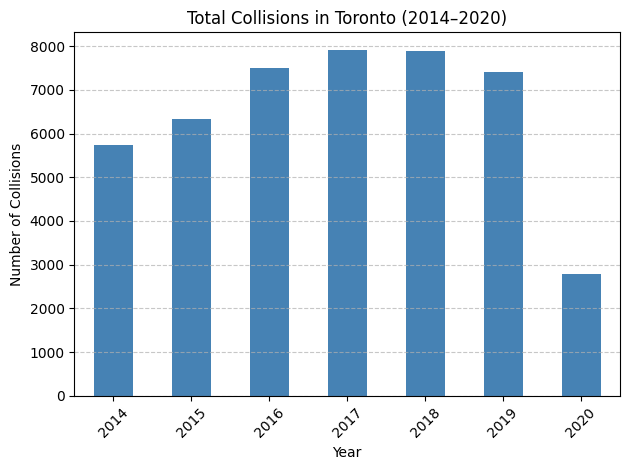

In [ ]:
import matplotlib.pyplot as plt

# Plot collision counts per year
collisions_per_year.plot(kind='bar', color='steelblue')
plt.title("Total Collisions in Toronto (2014–2020)")
plt.xlabel("Year")
plt.ylabel("Number of Collisions")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


- **Analyze Collision Hotspots (Spatial Analysis)**  
 The output gives a clear spatial perspective of where collisions are most frequent in Toronto.

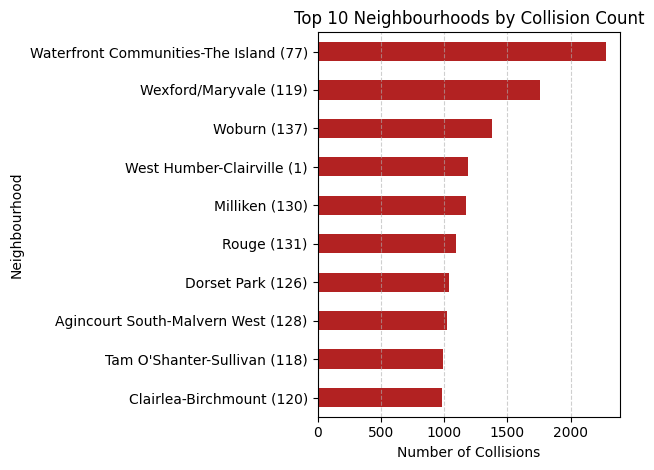

In [ ]:
# Group by neighbourhood to count collisions
neighbourhood_collisions = final_df['Neighbourhood.1'].value_counts().head(10)

# Plot the top 10 collision hotspots
neighbourhood_collisions.plot(kind='barh', color='firebrick')
plt.title("Top 10 Neighbourhoods by Collision Count")
plt.xlabel("Number of Collisions")
plt.ylabel("Neighbourhood")
plt.gca().invert_yaxis()  # Highest on top
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


- **Analyze Collision Timing Patterns (Temporal Analysis)**  
 The bar chart titled "Collisions by Hour of the Day" helps answer when collisions occur most often. Based on the bar heights:  
 - Morning Rush Hours (7 AM – 9 AM) and
  
 - Evening Rush Hours (4 PM – 6 PM)    
Are typically peak periods for collisions — a pattern that's consistent in urban traffic systems worldwide. If this pattern holds in your data, it supports modeling time-based behavior in your Cellular Automata simulation.

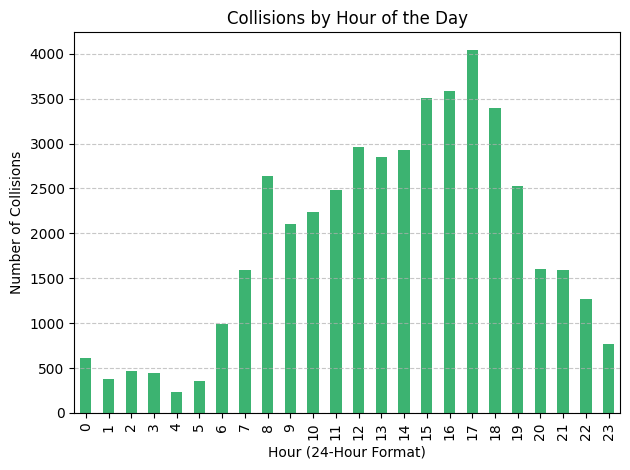

In [ ]:
# Count collisions by hour of day
hourly_collisions = final_df['Hour'].value_counts().sort_index()

# Plot
hourly_collisions.plot(kind='bar', color='mediumseagreen')
plt.title("Collisions by Hour of the Day")
plt.xlabel("Hour (24-Hour Format)")
plt.ylabel("Number of Collisions")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


- **Severity and Driver Behavior Analysis**  
 -  **Aggressive Driving**  
   - Total collisions involving aggressive driving: 25,678  
   - This suggests that aggressive behavior is a major factor and can be modeled as a high-risk behavior in your simulation.  
 - **Speeding**  
   - Speeding '1' (likely means involved): 4,357 cases  
   - Speeding '0': 41,191  
   - Speeding is less common than aggressive driving but still significant.

In [ ]:
# Count of collisions involving aggressive driving
aggressive_driving_counts = final_df['AG_DRIV'].value_counts()

# Count of collisions involving speeding
speeding_counts = final_df['SPEEDING'].value_counts()

print("Aggressive Driving Involvement:")
print(aggressive_driving_counts)
print("\nSpeeding Involvement:")
print(speeding_counts)


Aggressive Driving Involvement:
AG_DRIV
Yes    25678
Name: count, dtype: int64

Speeding Involvement:
SPEEDING
0    41191
1     4357
Name: count, dtype: int64


"Traffic Collision Analysis and Flow Simulation in Toronto Using Cellular Automata Models"

...aims to simulate and understand how various risk contributors affect collision likelihood and urban mobility. By quantifying aggressive driving and speeding, you now have:  
- Concrete behavioral variables to simulate in your Cellular Automata (CA) ruleset.  
- Weighted risk inputs — you can assign higher collision probability to aggressive drivers in high-flow zones.

In [ ]:
import pandas as pd

# Load the cleaned dataset
file_path = '/content/drive/MyDrive/MRP/cleaned_data.csv'
final_df = pd.read_csv(file_path)

# Display all column names
print("✅ Column Names in Cleaned Dataset:")
for i, col in enumerate(final_df.columns, 1):
    print(f"{i}. {col}")


✅ Column Names in Cleaned Dataset:
1. X
2. Y
3. EventUniqueId
4. Date
5. Month
6. Day_of_Week
7. Year
8. Hour
9. Police_Division
10. Atom
11. Neighbourhood
12. Injury_Collisions
13. FTR_Collisions
14. PD_Collisions
15. Longitude
16. Latitude
17. DayOfWeek
18. Longitude_ksi
19. Latitude_ksi
20. dist
21. match_index
22. X.1
23. Y.1
24. ACCNUM
25. YEAR
26. Date.1
27. TIME
28. HOUR
29. STREET1
30. STREET2
31. ROAD_CLASS
32. DISTRICT
33. WARDNUM
34. DIVISION
35. Latitude.1
36. Longitude.1
37. LOCCOORD
38. ACCLOC
39. TRAFFCTL
40. VISIBILITY
41. LIGHT
42. RDSFCOND
43. ACCLASS
44. IMPACTYPE
45. INVTYPE
46. INVAGE
47. INJURY
48. INITDIR
49. VEHTYPE
50. MANOEUVER
51. DRIVACT
52. DRIVCOND
53. PEDESTRIAN
54. CYCLIST
55. AUTOMOBILE
56. PASSENGER
57. SPEEDING
58. AG_DRIV
59. Police_Division.1
60. HOOD_ID
61. Neighbourhood.1
62. Month.1
63. DayOfWeek.1


- **Descriptive Statistics**  
  - Count: The number of non-null entries in the column.  
  - Mean: The average value of the column.  
  - Std: The standard deviation, which shows the spread of values in the column.
  - Min: The smallest value in the column.  
  - 25%: The first quartile (25th percentile) — 25% of the data is below this value.  
  - 50%: The median (50th percentile) — 50% of the data is below this value.  
  - 75%: The third quartile (75th percentile) — 75% of the data is below this value.  
  - Max: The largest value in the column.  

- **Null Values Check**  
  - This section checks for missing values in each column and prints the count of missing entries for those columns that have at least one missing value.  

- **Value Distribution**  
  - The distribution of key categorical columns (e.g., Year and Injury_Collisions):  
   - Year: The collision data is distributed across various years, with 2017 having the most (7918 records) and 2020 the least (2784 records). This might indicate that data collection ended or fewer incidents were recorded in the later years.  
   - Injury_Collisions: It shows the distribution of whether injuries occurred in collisions. Most records have "NO" (35,237), and fewer have "YES" (10,311). This suggests that the majority of collisions did not result in injuries.
    
- **Bar Chart for Aggressive Driving Involvement (AG_DRIV)**  
 - The bar chart shows the involvement of aggressive driving (AG_DRIV), with:  
  - 0 (No): No aggressive driving involvement.  
  - 1 (Yes): Aggressive driving was involved.  
 This chart tells you how many incidents were attributed to aggressive driving behavior. A higher count of "0" suggests that aggressive driving is not always involved in the incidents.


- **Bar Chart for Speeding Involvement (SPEEDING)**  
 - This chart shows how many incidents involved speeding:  
  - 0 (No): No speeding.  
  - 1 (Yes): Speeding was involved.  
  
 The result shows how often speeding is associated with collisions. Similar to aggressive driving, a large portion of the collisions did not involve speeding.  

✅ Column Names in Cleaned Dataset:
1. X
2. Y
3. EventUniqueId
4. Date
5. Month
6. Day_of_Week
7. Year
8. Hour
9. Police_Division
10. Atom
11. Neighbourhood
12. Injury_Collisions
13. FTR_Collisions
14. PD_Collisions
15. Longitude
16. Latitude
17. DayOfWeek
18. Longitude_ksi
19. Latitude_ksi
20. dist
21. match_index
22. X.1
23. Y.1
24. ACCNUM
25. YEAR
26. Date.1
27. TIME
28. HOUR
29. STREET1
30. STREET2
31. ROAD_CLASS
32. DISTRICT
33. WARDNUM
34. DIVISION
35. Latitude.1
36. Longitude.1
37. LOCCOORD
38. ACCLOC
39. TRAFFCTL
40. VISIBILITY
41. LIGHT
42. RDSFCOND
43. ACCLASS
44. IMPACTYPE
45. INVTYPE
46. INVAGE
47. INJURY
48. INITDIR
49. VEHTYPE
50. MANOEUVER
51. DRIVACT
52. DRIVCOND
53. PEDESTRIAN
54. CYCLIST
55. AUTOMOBILE
56. PASSENGER
57. SPEEDING
58. AG_DRIV
59. Police_Division.1
60. HOOD_ID
61. Neighbourhood.1
62. Month.1
63. DayOfWeek.1

✅ Descriptive Statistics:
                  X             Y          Year          Hour          Atom  \
count  4.554800e+04  4.554800e+04  45548.000

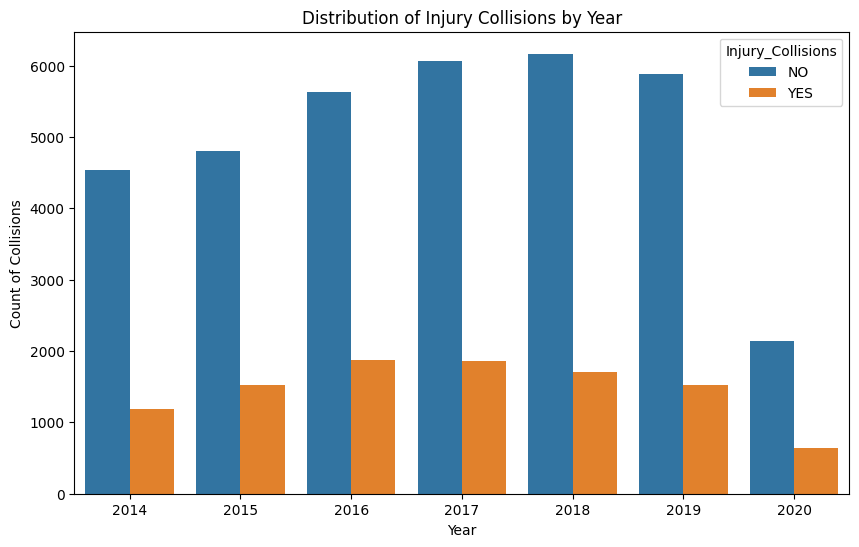

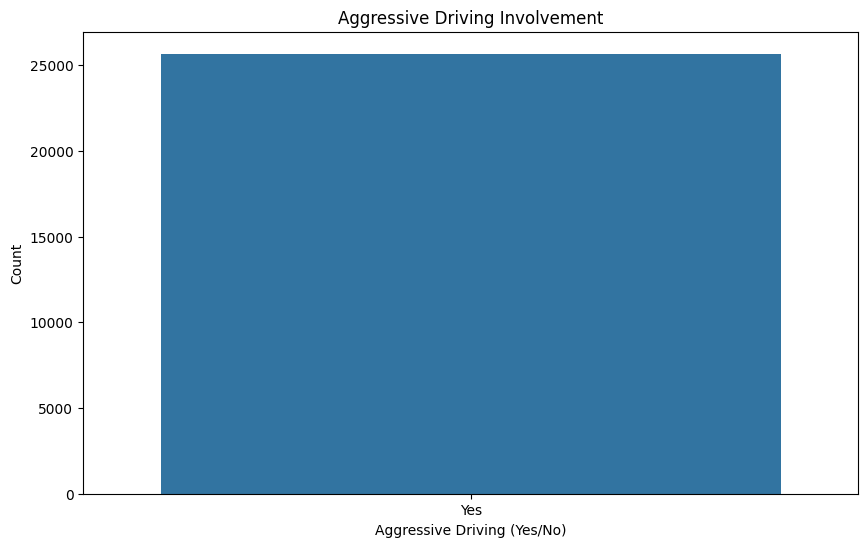

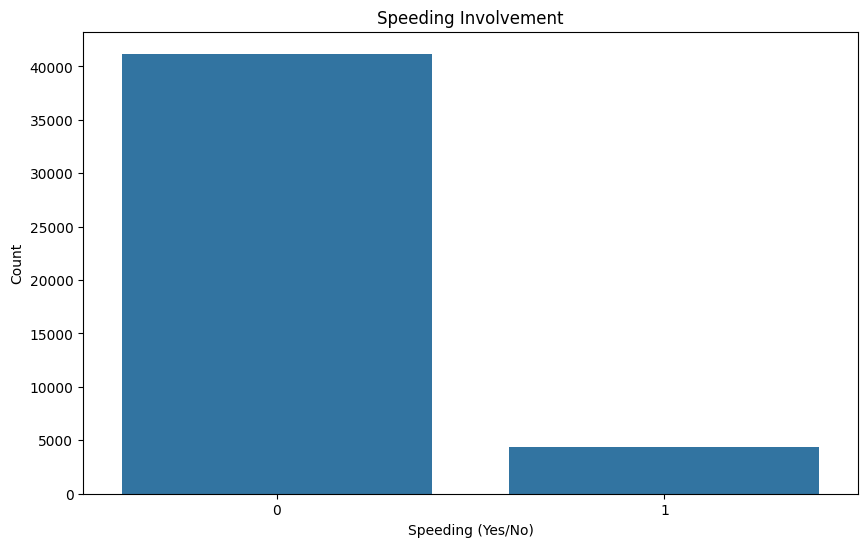

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the cleaned dataset
file_path = '/content/drive/MyDrive/MRP/cleaned_data.csv'
final_df = pd.read_csv(file_path)

# Step 1: Display Column Names
print("✅ Column Names in Cleaned Dataset:")
for i, col in enumerate(final_df.columns, 1):
    print(f"{i}. {col}")

# Step 2: Descriptive statistics for numerical columns
print("\n✅ Descriptive Statistics:")
print(final_df.describe())

# Step 3: Null value check
print("\n✅ Null Values Check:")
null_values = final_df.isnull().sum()
print(null_values[null_values > 0])

# Step 4: Value distribution check for key columns (Example: "Year", "Injury_Collisions", etc.)
print("\n✅ Value Distribution (Example - 'Year' and 'Injury_Collisions'):")
print(final_df['Year'].value_counts())
print(final_df['Injury_Collisions'].value_counts())

# Exclude non-numeric columns for correlation analysis
numerical_columns = final_df.select_dtypes(include=['number']).columns
correlation_matrix = final_df[numerical_columns].corr()


# Step 5: Data Visualization (Example: Distribution of "Year" vs. "Injury_Collisions")
plt.figure(figsize=(10, 6))
sns.countplot(data=final_df, x='Year', hue='Injury_Collisions')
plt.title('Distribution of Injury Collisions by Year')
plt.xlabel('Year')
plt.ylabel('Count of Collisions')
plt.show()


# Step 6: Bar Chart - Aggressive Driving Involvement (Example: "AG_DRIV")
plt.figure(figsize=(10, 6))
sns.countplot(data=final_df, x='AG_DRIV')
plt.title('Aggressive Driving Involvement')
plt.xlabel('Aggressive Driving (Yes/No)')
plt.ylabel('Count')
plt.show()

# Step 7: Bar Chart - Speeding Involvement (Example: "SPEEDING")
plt.figure(figsize=(10, 6))
sns.countplot(data=final_df, x='SPEEDING')
plt.title('Speeding Involvement')
plt.xlabel('Speeding (Yes/No)')
plt.ylabel('Count')
plt.show()


**The cluster in the code represents the result of the DBSCAN (Density-Based Spatial Clustering of Applications with Noise) algorithm, which is used for grouping points (in this case, the collision locations) based on their spatial proximity.**  

Meaning of the Cluster in Your Case:  
- Injury and Non-Injury Hotspots: By plotting clusters with color-coded Injury_Collisions, you can see where collisions that result in injuries tend to happen more frequently (for example, in red clusters). It can help identify specific geographic regions where injury accidents occur more often, which may need further investigation for safety improvements.  


Clusters: Areas with a high density of accidents that are geographically close.  

Noise points: Accidents that are isolated or don’t meet the density criteria for clustering.

Index(['X', 'Y', 'EventUniqueId', 'Date', 'Month', 'Day_of_Week', 'Year',
       'Hour', 'Police_Division', 'Atom', 'Neighbourhood', 'Injury_Collisions',
       'FTR_Collisions', 'PD_Collisions', 'Longitude', 'Latitude', 'DayOfWeek',
       'Longitude_ksi', 'Latitude_ksi', 'dist', 'match_index', 'X.1', 'Y.1',
       'ACCNUM', 'YEAR', 'Date.1', 'TIME', 'HOUR', 'STREET1', 'STREET2',
       'ROAD_CLASS', 'DISTRICT', 'WARDNUM', 'DIVISION', 'Latitude.1',
       'Longitude.1', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT',
       'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY',
       'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDESTRIAN',
       'CYCLIST', 'AUTOMOBILE', 'PASSENGER', 'SPEEDING', 'AG_DRIV',
       'Police_Division.1', 'HOOD_ID', 'Neighbourhood.1', 'Month.1',
       'DayOfWeek.1'],
      dtype='object')


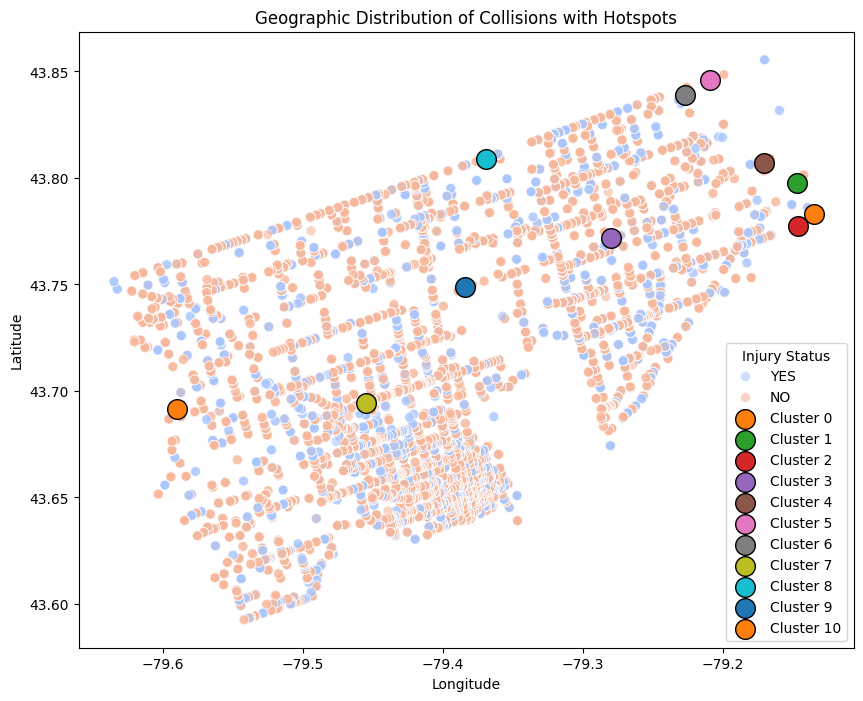

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.cluster import DBSCAN
import numpy as np

# Load your dataset
# Replace 'data.csv' with the path to your actual dataset file
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Ensure that the necessary columns are present
print(df.columns)  # Check column names to ensure 'Longitude' and 'Latitude' exist

# Perform clustering with DBSCAN
coords = df[['Longitude', 'Latitude']].values
db = DBSCAN(eps=0.01, min_samples=10)  # Adjust parameters based on your dataset
df['Cluster'] = db.fit_predict(coords)

# Plotting the 2D Scatter plot
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Longitude', y='Latitude', data=df, hue='Injury_Collisions', palette='coolwarm', alpha=0.6, s=50)

# Highlight clusters
for cluster in np.unique(df['Cluster']):
    if cluster != -1:  # Exclude noise points
        cluster_data = df[df['Cluster'] == cluster]
        plt.scatter(cluster_data['Longitude'].mean(), cluster_data['Latitude'].mean(), s=200, edgecolor='black', label=f'Cluster {cluster}')

plt.title('Geographic Distribution of Collisions with Hotspots')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Injury Status')
plt.show()


In [ ]:
print(df.columns)


Index(['X', 'Y', 'EventUniqueId', 'Date', 'Month', 'Day_of_Week', 'Year',
       'Hour', 'Police_Division', 'Atom', 'Neighbourhood', 'Injury_Collisions',
       'FTR_Collisions', 'PD_Collisions', 'Longitude', 'Latitude', 'DayOfWeek',
       'Longitude_ksi', 'Latitude_ksi', 'dist', 'match_index', 'X.1', 'Y.1',
       'ACCNUM', 'YEAR', 'Date.1', 'TIME', 'HOUR', 'STREET1', 'STREET2',
       'ROAD_CLASS', 'DISTRICT', 'WARDNUM', 'DIVISION', 'Latitude.1',
       'Longitude.1', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT',
       'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY',
       'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDESTRIAN',
       'CYCLIST', 'AUTOMOBILE', 'PASSENGER', 'SPEEDING', 'AG_DRIV',
       'Police_Division.1', 'HOOD_ID', 'Neighbourhood.1', 'Month.1',
       'DayOfWeek.1', 'Cluster'],
      dtype='object')


**Correlation Matrix Plot:** This will show the correlations between numerical columns like 'Longitude', 'Latitude', 'Year', and 'Hour'. It helps identify which features have a linear relationship with each other. The color intensity in the heatmap will indicate the strength of these correlations.

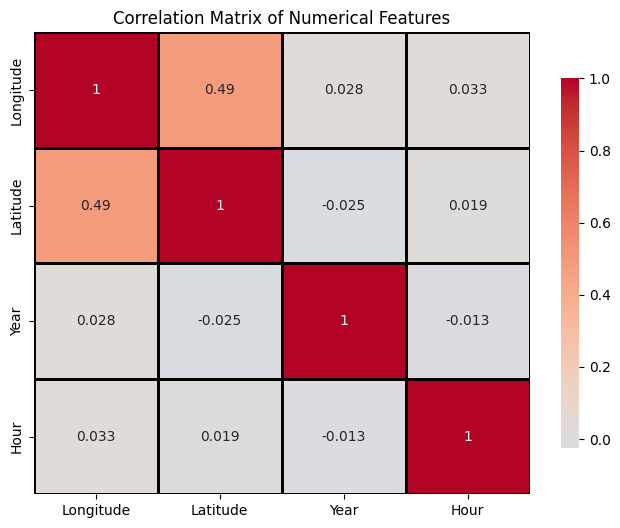

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select numerical columns (ignoring categorical ones for correlation)
numerical_columns = ['Longitude', 'Latitude', 'Year', 'Hour']  # Removed 'Minute'
corr_matrix = df[numerical_columns].corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, linewidths=1, linecolor='black', cbar_kws={'shrink': 0.8})
plt.title('Correlation Matrix of Numerical Features')
plt.show()


In [ ]:
df.columns = df.columns.str.strip()


In [ ]:
print(f"Column name: '{df.columns[df.columns == 'Injury_Collisions'][0]}'")


Column name: 'Injury_Collisions'


In [ ]:
print([repr(col) for col in df.columns])


["'X'", "'Y'", "'EventUniqueId'", "'Date'", "'Month'", "'Day_of_Week'", "'Year'", "'Hour'", "'Police_Division'", "'Atom'", "'Neighbourhood'", "'Injury_Collisions'", "'FTR_Collisions'", "'PD_Collisions'", "'Longitude'", "'Latitude'", "'DayOfWeek'", "'Longitude_ksi'", "'Latitude_ksi'", "'dist'", "'match_index'", "'X.1'", "'Y.1'", "'ACCNUM'", "'YEAR'", "'Date.1'", "'TIME'", "'HOUR'", "'STREET1'", "'STREET2'", "'ROAD_CLASS'", "'DISTRICT'", "'WARDNUM'", "'DIVISION'", "'Latitude.1'", "'Longitude.1'", "'LOCCOORD'", "'ACCLOC'", "'TRAFFCTL'", "'VISIBILITY'", "'LIGHT'", "'RDSFCOND'", "'ACCLASS'", "'IMPACTYPE'", "'INVTYPE'", "'INVAGE'", "'INJURY'", "'INITDIR'", "'VEHTYPE'", "'MANOEUVER'", "'DRIVACT'", "'DRIVCOND'", "'PEDESTRIAN'", "'CYCLIST'", "'AUTOMOBILE'", "'PASSENGER'", "'SPEEDING'", "'AG_DRIV'", "'Police_Division.1'", "'HOOD_ID'", "'Neighbourhood.1'", "'Month.1'", "'DayOfWeek.1'", "'Cluster'"]


- **Geospatial Trends (Longitude vs Latitude):**  
The scatter plot indicates whether injury collisions cluster in certain geographic areas of Toronto. If blue dots (injuries) cluster differently than orange dots (no injuries), this could imply hotspot zones for injuries.  
- **Temporal Patterns (Year & Hour):**  
 - The Year vs Injury histograms or strips may show changes in injury collision frequency over time.  
 - The Hour vs Injury plots can indicate peak times for injury vs. non-injury collisions. For example, you might observe more injuries during rush hours or late nights.  
- **Feature Distributions:**  
The diagonal histograms let you compare the distributions of each numerical variable across injury statuses.

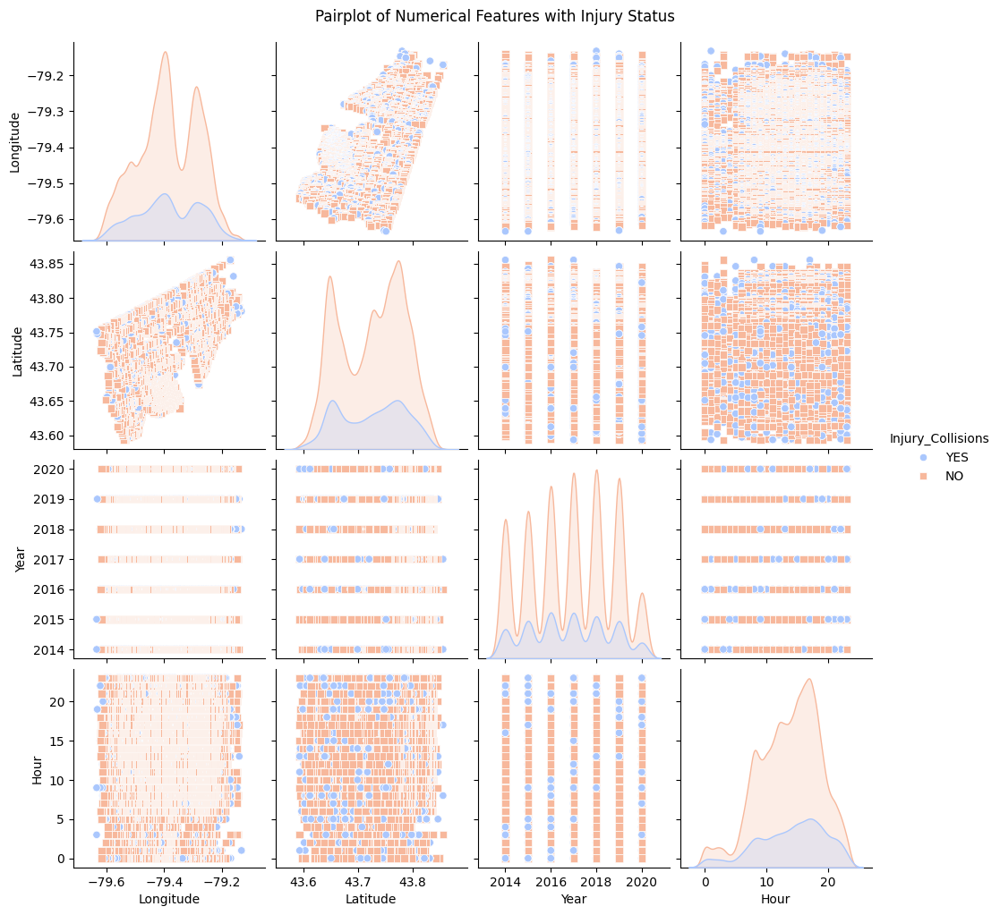

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Strip any leading/trailing spaces from column names just to be thorough
df.columns = df.columns.str.strip()

# Ensure the column 'Injury_Collisions' exists
if 'Injury_Collisions' in df.columns:
    hue_column = 'Injury_Collisions'
else:
    print("Column 'Injury_Collisions' not found. Please check the column name.")
    hue_column = None  # Set hue_column to None if not found

# Select numerical columns for the pair plot
numerical_columns = ['Longitude', 'Latitude', 'Year', 'Hour']  # Removed 'Minute'

# If hue_column was set, create a pair plot
if hue_column:
    sns.pairplot(df[numerical_columns + [hue_column]], hue=hue_column, palette='coolwarm', markers=["o", "s"], diag_kind='kde')
    plt.suptitle('Pairplot of Numerical Features with Injury Status', y=1.02)
    plt.show()
else:
    print(f"'{hue_column}' column not found. Unable to create pairplot.")


- **Boxplots by Injury Status**   
For each feature (like Hour or Year), you'll get a side-by-side boxplot for injury (YES/NO).  

It helps you visually spot:  
If certain hours of the day see more injuries  
If injury cases are concentrated in specific years or areas (based on lat/long)

<ipython-input-30-a8ab8fe88c63>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Injury_Collisions', y=feature, palette='Set2')
<ipython-input-30-a8ab8fe88c63>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Injury_Collisions', y=feature, palette='Set2')
<ipython-input-30-a8ab8fe88c63>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Injury_Collisions', y=feature, palette='Set2')
<ipython-input-30-a8ab8fe88c63>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be rem

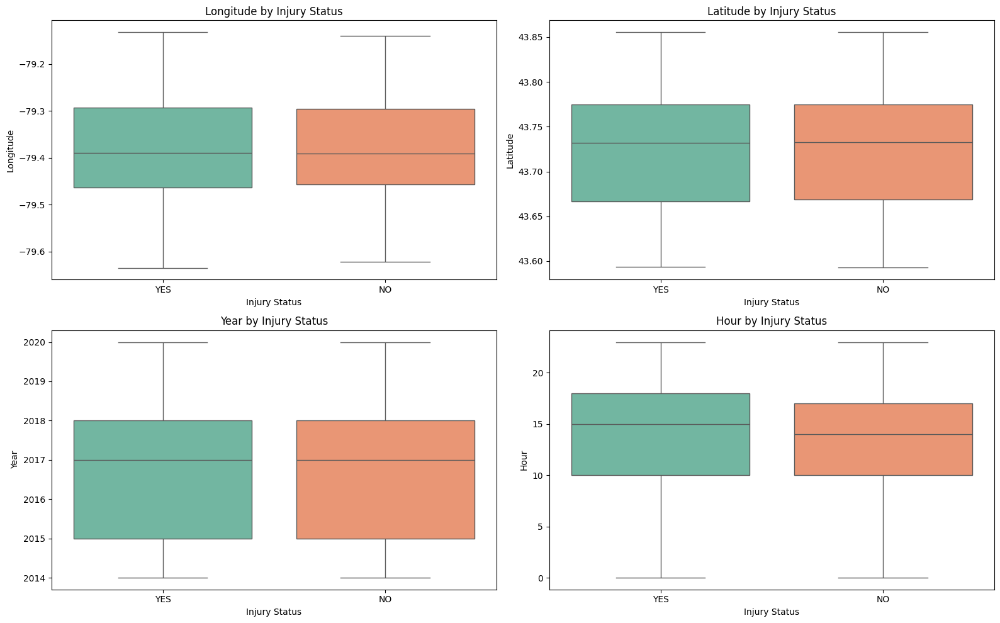

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure the injury column is in correct format
df['Injury_Collisions'] = df['Injury_Collisions'].astype(str)

# Features to plot
features = ['Longitude', 'Latitude', 'Year', 'Hour']

# Create boxplots
plt.figure(figsize=(16, 10))
for i, feature in enumerate(features):
    plt.subplot(2, 2, i+1)
    sns.boxplot(data=df, x='Injury_Collisions', y=feature, palette='Set2')
    plt.title(f'{feature} by Injury Status')
    plt.xlabel('Injury Status')
    plt.ylabel(feature)

plt.tight_layout()
plt.show()


- **Countplot of Injuries by Year and Hour**  
 - The first chart will show how injury and non-injury collisions are distributed over the years.  
 - The second chart will show when during the day injuries are more likely to happen.  
 - Likely to see peaks in the morning and evening rush hours if there are strong time-based patterns.



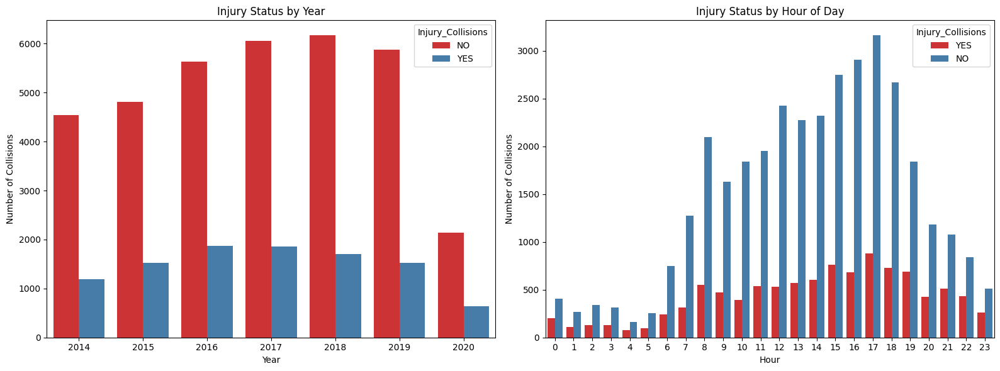

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert Injury column to string (if not already)
df['Injury_Collisions'] = df['Injury_Collisions'].astype(str)

# Create a figure with 2 subplots: one for Year, one for Hour
plt.figure(figsize=(16, 6))

# Countplot for Year
plt.subplot(1, 2, 1)
sns.countplot(data=df, x='Year', hue='Injury_Collisions', palette='Set1')
plt.title('Injury Status by Year')
plt.xlabel('Year')
plt.ylabel('Number of Collisions')

# Countplot for Hour
plt.subplot(1, 2, 2)
sns.countplot(data=df, x='Hour', hue='Injury_Collisions', palette='Set1')
plt.title('Injury Status by Hour of Day')
plt.xlabel('Hour')
plt.ylabel('Number of Collisions')

plt.tight_layout()
plt.show()


- **KDE Plot – Injury vs. Non-Injury by Location**  
A Kernel Density Estimation (KDE) plot for visualizing how collision density varies by location (latitude and longitude), separated by injury status. This can help identify geographical hotspots for injury-related collisions.



In [ ]:
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

# Initialize geolocator
geolocator = Nominatim(user_agent="collision_analysis")
geocode = RateLimiter(geolocator.reverse, min_delay_seconds=1)

# Sample top 100 rows with injury collisions for speed
sample_df = df[df['Injury_Collisions'] == 'YES'].sample(100, random_state=42)

# Function to reverse geocode
def get_location_name(row):
    try:
        location = geocode((row['Latitude'], row['Longitude']), language='en')
        return location.raw['address'].get('suburb') or location.raw['address'].get('neighbourhood') or location.raw['address'].get('city_district')
    except:
        return None

# Apply to sample
sample_df['Area'] = sample_df.apply(get_location_name, axis=1)

# Show counts
print(sample_df['Area'].value_counts().head(10))


Area
Scarborough                43
Etobicoke                  13
Bathurst Manor              4
York                        4
Henry Farm                  2
York University Heights     2
Yorkdale-Glen Park          2
Clanton Park                2
Financial District          2
Pelmo Park-Humberlea        1
Name: count, dtype: int64


The horizontal bar chart titled "Top 10 Areas with Injury Collisions (Sample of 100)" provides a clear comparison of the number of injury collisions across different areas.  
 - X-axis (Number of Collisions):  
 The x-axis shows the number of injury collisions in each area. The range of values is from 0 to around 45, indicating that Scarborough has the highest number of injury collisions in the sample of 100.  
 - Y-axis (Areas):  
 The y-axis lists the top 10 areas with the highest number of injury collisions.   
 - Bars:  
  - Each bar represents one area. The length of the bar shows how many injury collisions occurred in that area.  
  - The darker red shades indicate higher collision counts, while lighter red shades show lower collision counts  

- Scarborough:  
This area has the highest number of injury collisions in this sample, with ~43 collisions.  
The bar is long and dark red, indicating a high frequency of injury collisions.  

- Etobicoke:  
~13 collisions in Etobicoke, which is significantly lower than Scarborough but still notable.  
The bar is still dark red, though shorter than Scarborough’s.  

- Bathurst Manor:  
This area shows ~4 collisions, which is significantly fewer than Scarborough and Etobicoke.  
The bar is lighter in shade, showing fewer collisions.  

- York:  
With ~4 collisions, York has the same number of injury collisions as Bathurst Manor.  
Similar to Bathurst Manor, the bar here is also relatively short.  

- Other Areas:  
Henry Farm, York University Heights, Yorkdale-Glen Park, Clanton Park, Financial District, and Pelmo Park-Humberlea show progressively fewer injury collisions.  
The bars for these areas are progressively shorter and lighter, with Pelmo Park-Humberlea having the fewest (~1 collision).  

Scarborough stands out as the area with the highest number of injury collisions, making it a collision hotspot.  

Scarborough stands out as the area with the highest number of injury collisions, making it a collision hotspot.  

The chart clearly shows a decline in injury collisions as you move down the list of areas, with Pelmo Park-Humberlea being the least affected.

<ipython-input-37-52c26eedf81e>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=area_counts.values, y=area_counts.index, palette="Reds_r")


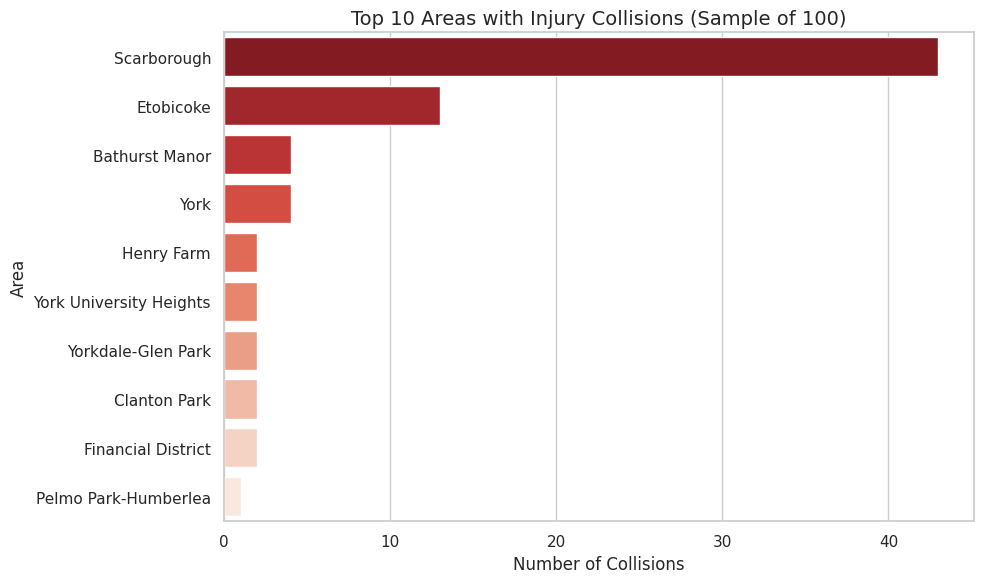

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count injury collisions by area (from your earlier code)
area_counts = sample_df['Area'].value_counts().head(10)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=area_counts.values, y=area_counts.index, palette="Reds_r")

plt.title('Top 10 Areas with Injury Collisions (Sample of 100)', fontsize=14)
plt.xlabel('Number of Collisions')
plt.ylabel('Area')
plt.tight_layout()
plt.show()


The heatmap:  
- Uses red for strong positive correlations (e.g., 0.8 to 1.0),  
- blue for strong negative correlations (e.g., -0.8 to -1.0),  
- and white/light colors for weak or no correlation (around 0.0).  

The numbers inside the boxes show the exact correlation coefficients, making it easy to interpret relationships.  

Diagonal values are always 1.00: A variable is perfectly correlated with itself.  

Focus on non-diagonal values:  
- If Latitude and Y show 0.95, they are very closely related.  
- If Speeding and Hour show near 0.00, they are unrelated.  

Helps you detect multicollinearity (when two features are too similar).  

Guides feature selection: You might drop redundant features that are highly correlated.  

Useful for exploratory data analysis (EDA) before modeling.



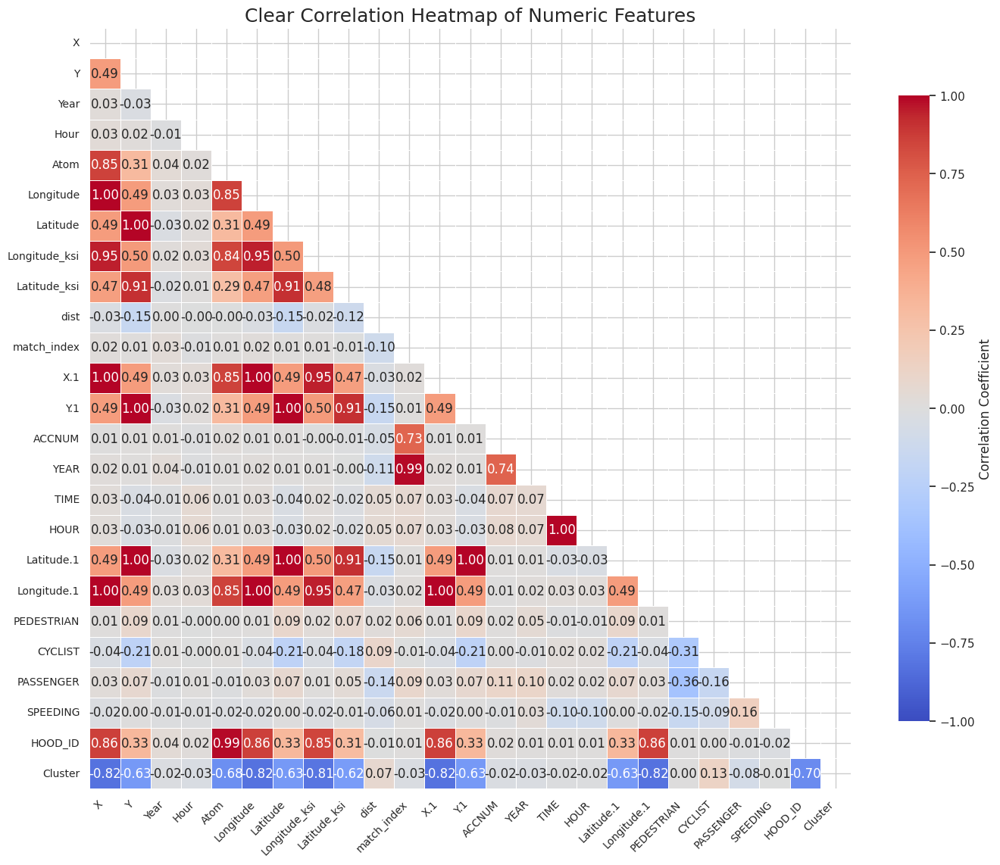

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Select only numeric columns
numeric_df = df.select_dtypes(include=[np.number])

# Step 2: Calculate correlation matrix
corr_matrix = numeric_df.corr()

# Step 3: Create a mask to show only the lower triangle (for clarity)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Step 4: Set up the matplotlib figure
plt.figure(figsize=(14, 12))

# Step 5: Draw the heatmap
sns.heatmap(
    corr_matrix,
    mask=mask,
    cmap='coolwarm',
    vmax=1.0,
    vmin=-1.0,
    center=0,
    annot=True,
    fmt=".2f",
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.75, "label": "Correlation Coefficient"}
)

# Step 6: Customize the plot
plt.title("Clear Correlation Heatmap of Numeric Features", fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.tight_layout()

# Show the plot
plt.show()


**Feature Selection & Engineering**

- Latitude  
- Longitude  
- Hour (to capture time-based patterns)

In [ ]:
# Select relevant features for clustering
features_df = df[['Latitude', 'Longitude', 'Hour']].dropna()

# Preview
print(features_df.head())


   Latitude  Longitude  Hour
0   43.7807   -79.1316     1
1   43.7807   -79.1316     1
2   43.7807   -79.1316     1
3   43.7807   -79.1316     1
4   43.7807   -79.1316     1


**Feature Scaling (Normalization)**  
Clustering (like KMeans) is sensitive to scale, so we’ll normalize all features using MinMaxScaler to bring everything between 0 and 1.

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Initialize scaler
scaler = MinMaxScaler()

# Fit and transform the features
scaled_features = scaler.fit_transform(features_df)

# Convert back to DataFrame for clarity
scaled_df = pd.DataFrame(scaled_features, columns=['Latitude', 'Longitude', 'Hour'])

# Preview scaled data
print(scaled_df.head())


   Latitude  Longitude      Hour
0  0.715481        1.0  0.043478
1  0.715481        1.0  0.043478
2  0.715481        1.0  0.043478
3  0.715481        1.0  0.043478
4  0.715481        1.0  0.043478


**Find the Optimal Number of Clusters (Elbow Method)**  
The Elbow Method helps us choose how many clusters (k) to use in KMeans by plotting the within-cluster sum of squares (inertia) vs. number of clusters.  

From the graph, we observe that after k = 3 or k = 4, the decrease in inertia becomes much slower, forming an "elbow" shape. This suggests that 3 or 4 clusters is likely the optimal choice, as further increases in k do not reduce inertia much.  

From your graph, you observe that after k = 3 or k = 4, the decrease in inertia becomes much slower, forming an "elbow" shape. This suggests that 3 or 4 clusters is likely the optimal choice, as further increases in k do not reduce inertia much.

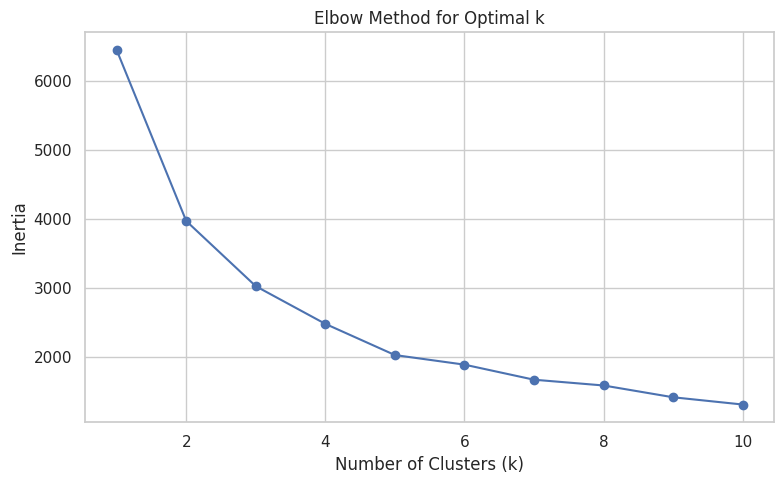

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# List to hold inertia values
inertia = []

# Try different values of k
K_range = range(1, 11)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_df)
    inertia.append(kmeans.inertia_)

# Plot the elbow graph
plt.figure(figsize=(8, 5))
plt.plot(K_range, inertia, 'bo-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.grid(True)
plt.tight_layout()
plt.show()


**Apply KMeans Clustering**  
Let’s proceed with k = 4 (a common choice when the elbow isn't sharp — we go with the slightly larger k for finer granularity).

In [ ]:
from sklearn.cluster import KMeans

# Apply KMeans with 4 clusters
kmeans = KMeans(n_clusters=4, random_state=42)
scaled_df['Cluster'] = kmeans.fit_predict(scaled_df)

# Combine cluster labels with original data
df_clustered = df.copy()
df_clustered['Cluster'] = scaled_df['Cluster']

# View the first few rows
print(df_clustered.head())


              X             Y   EventUniqueId        Date    Month  \
0 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
1 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
2 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
3 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
4 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   

  Day_of_Week  Year  Hour Police_Division   Atom  ... AUTOMOBILE PASSENGER  \
0    Saturday  2018     1             d43  131.0  ...        Yes         1   
1    Saturday  2018     1             d43  131.0  ...        Yes         1   
2    Saturday  2018     1             d43  131.0  ...        Yes         1   
3    Saturday  2018     1             d43  131.0  ...        Yes         1   
4    Saturday  2018     1             d43  131.0  ...        Yes         1   

  SPEEDING AG_DRIV  Police_Division.1  HOOD_ID Neighbourhood.1  Month.1  \
0        1     Yes                d

**Visualizing the Clusters**  
We'll create a scatter plot to visualize how the data points are distributed across the clusters.  

The color bar also gives an idea of how well the clusters are separated. If the clusters are clearly distinct (with different colors on the color bar), it indicates that the clustering algorithm was able to group the data into separate, distinct clusters. If the colors overlap significantly, it might suggest that the algorithm had difficulty distinguishing the clusters.


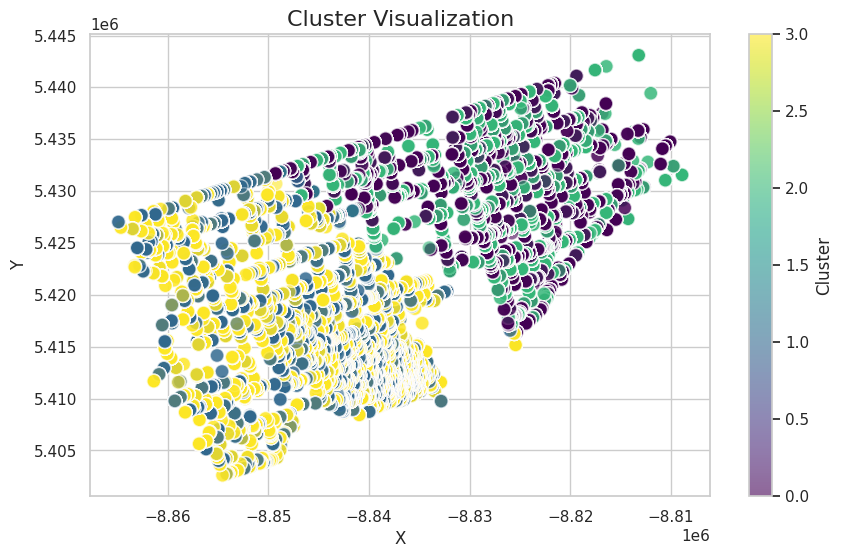

In [ ]:
import matplotlib.pyplot as plt

# Plotting the clusters
plt.figure(figsize=(10, 6))

# Scatter plot with distinct colors for each cluster
scatter = plt.scatter(df_clustered['X'], df_clustered['Y'], c=df_clustered['Cluster'], cmap='viridis', alpha=0.6, edgecolors='w', s=100)

# Title and labels
plt.title('Cluster Visualization', fontsize=16)
plt.xlabel('X', fontsize=12)
plt.ylabel('Y', fontsize=12)

# Colorbar for the clusters
plt.colorbar(scatter, label='Cluster')

# Show the plot
plt.show()


**Analyzing the Centroids of the Clusters**  
After the clustering process, we can extract the centroids of the clusters. This will give us the "central" point for each cluster.  

Cluster Visualization (without centroids): The scatter plot shows three distinct clusters:  
- Cyan cluster: Left side.  
- Purple cluster: Top-right.  
- Yellow cluster: Bottom-right.  

Cluster Visualization with Centroids: The centroids are marked by red "X" symbols. Each cluster has its own centroid, representing the center of that cluster's data points. The table shows how the points are distributed across the three clusters:  
- Cluster 0: 39 points.  
- Cluster 1: 29 points.  
- Cluster 2: 32 points.

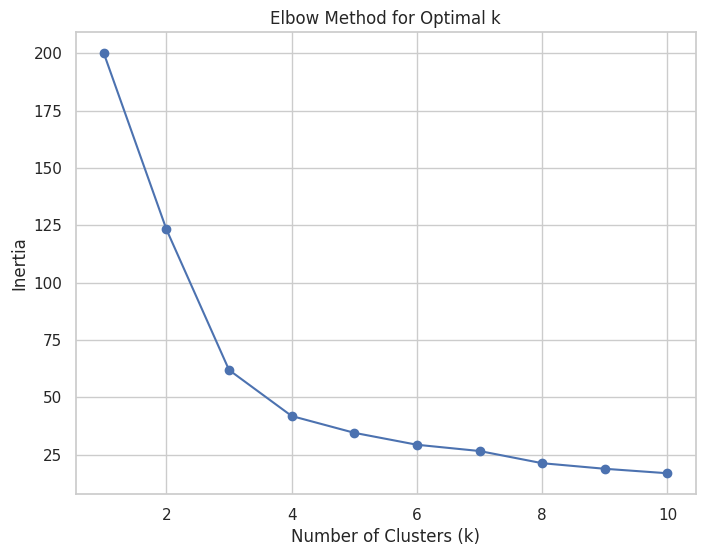

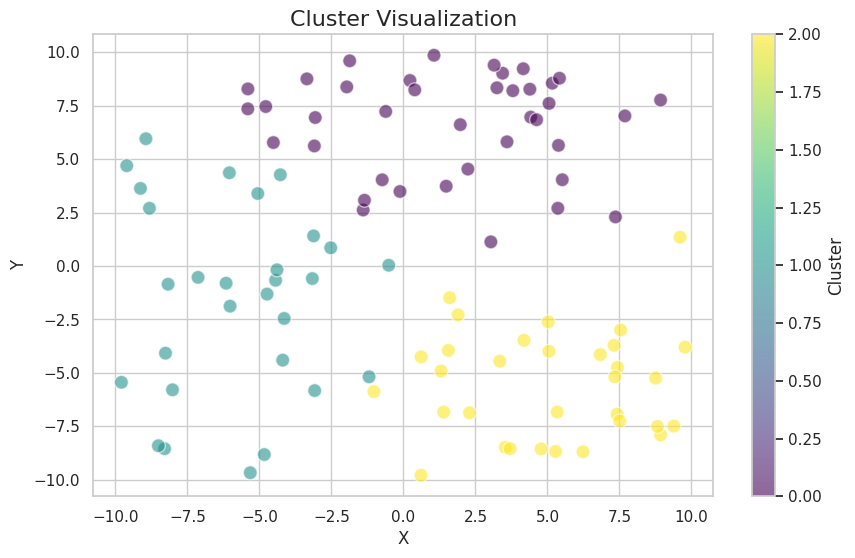

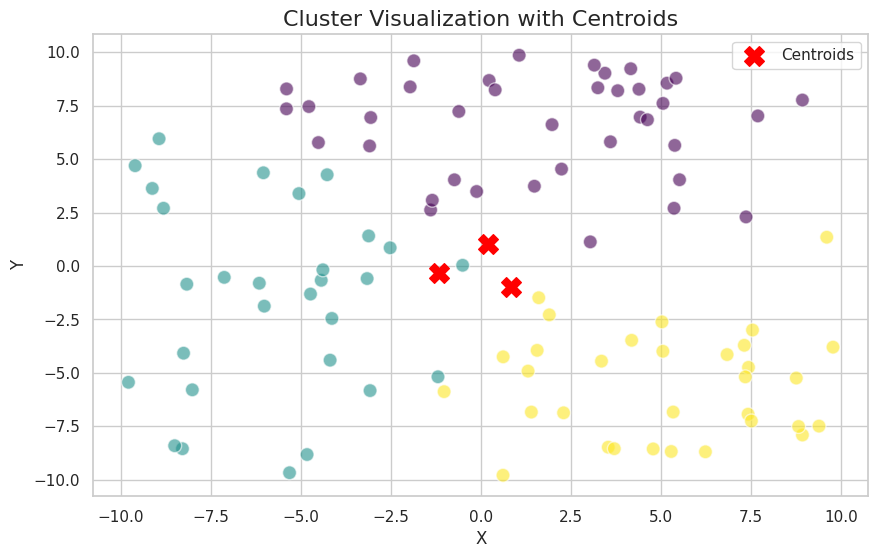

Cluster
0    39
2    32
1    29
Name: count, dtype: int64


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Assuming df is your original DataFrame with 'X' and 'Y' columns for clustering
# Example data (replace this with your actual data)
df = pd.DataFrame({
    'X': np.random.uniform(-10, 10, size=100),  # Replace with actual X values
    'Y': np.random.uniform(-10, 10, size=100),  # Replace with actual Y values
})

# Scaling the data (standardization is important for K-means)
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df[['X', 'Y']])

# Elbow Method to determine the optimal number of clusters
inertia = []
for k in range(1, 11):  # Trying k from 1 to 10
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_df)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Method to find the optimal k
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o', linestyle='-', color='b')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

# Based on the plot above, let's assume we choose k = 3
# Applying KMeans with k=3 (or another value based on the Elbow plot)
kmeans = KMeans(n_clusters=3, random_state=42)
df['Cluster'] = kmeans.fit_predict(scaled_df)

# Combine the original data with the cluster labels
df_clustered = df.copy()

# Plotting the clusters
plt.figure(figsize=(10, 6))
plt.scatter(df_clustered['X'], df_clustered['Y'], c=df_clustered['Cluster'], cmap='viridis', alpha=0.6, edgecolors='w', s=100)
plt.title('Cluster Visualization', fontsize=16)
plt.xlabel('X', fontsize=12)
plt.ylabel('Y', fontsize=12)
plt.colorbar(label='Cluster')
plt.show()

# Get the centroids of the clusters
centroids = kmeans.cluster_centers_

# Plotting the clusters along with their centroids
plt.figure(figsize=(10, 6))
plt.scatter(df_clustered['X'], df_clustered['Y'], c=df_clustered['Cluster'], cmap='viridis', alpha=0.6, edgecolors='w', s=100)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', s=200, c='red', label='Centroids')
plt.title('Cluster Visualization with Centroids', fontsize=16)
plt.xlabel('X', fontsize=12)
plt.ylabel('Y', fontsize=12)
plt.legend()
plt.show()

# Check the number of points in each cluster
print(df_clustered['Cluster'].value_counts())


**Load and Check Dataset Columns**  

In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Display first few rows
print(df.head())

# Show all column names
print("\nAvailable columns:")
print(df.columns.tolist())


              X             Y   EventUniqueId        Date    Month  \
0 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
1 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
2 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
3 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
4 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   

  Day_of_Week  Year  Hour Police_Division   Atom  ... CYCLIST AUTOMOBILE  \
0    Saturday  2018     1             d43  131.0  ...       0        Yes   
1    Saturday  2018     1             d43  131.0  ...       0        Yes   
2    Saturday  2018     1             d43  131.0  ...       0        Yes   
3    Saturday  2018     1             d43  131.0  ...       0        Yes   
4    Saturday  2018     1             d43  131.0  ...       0        Yes   

  PASSENGER SPEEDING  AG_DRIV  Police_Division.1 HOOD_ID  Neighbourhood.1  \
0         1        1      Yes                

**Classification of Accident Severity**

We’ll start Advanced Machine Learning (Beyond Clustering) by building a supervised classification model that predicts accident severity using features from the dataset.

- **Prepare the Data for Classification**  
  - Use relevant features like Hour, Day_of_Week, LIGHT, RDSFCOND, VISIBILITY, ROAD_CLASS, IMPACTYPE, etc  
  - Encode categorical variables  
  - Split data into train/test  
  - Train a Random Forest Classifier

**-- Accident Severity Classification Using Random Forest**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Load data
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Drop rows with missing values in relevant columns
features = ['Hour', 'Day_of_Week', 'LIGHT', 'RDSFCOND', 'VISIBILITY', 'ROAD_CLASS', 'IMPACTYPE']
df_model = df[features + ['ACCLASS']].dropna()

# Encode categorical variables
label_encoders = {}
for col in features + ['ACCLASS']:
    le = LabelEncoder()
    df_model[col] = le.fit_transform(df_model[col])
    label_encoders[col] = le

# Features and target
X = df_model[features]
y = df_model['ACCLASS']

# Split into train/test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Predict and evaluate
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred, target_names=label_encoders['ACCLASS'].classes_))


                  precision    recall  f1-score   support

           Fatal       0.71      0.35      0.47      1154
Non-Fatal Injury       0.91      0.98      0.94      7845

        accuracy                           0.90      8999
       macro avg       0.81      0.66      0.71      8999
    weighted avg       0.88      0.90      0.88      8999



**Classification Performance Summary**

 **Non-Fatal Injury:** Very high precision (0.91), recall (0.98), and F1-score (0.94) → your model is excellent at identifying these.  
 **Fatal:** Lower recall (0.35) means the model misses many fatal cases. It’s common in imbalanced datasets where fatal collisions are rare.

**-- Feature Importance Visualization**

<ipython-input-54-ff874f454c40>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=importance_df, palette='viridis')


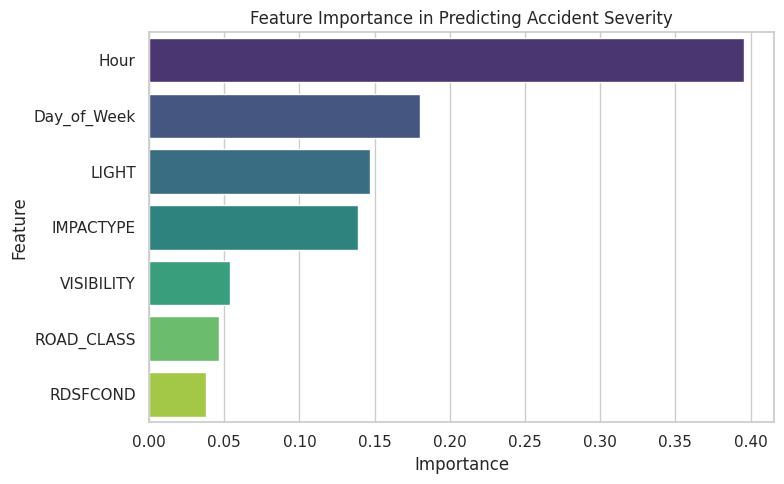

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get feature importance from the trained Random Forest
importances = clf.feature_importances_
features = X.columns
importance_df = pd.DataFrame({'Feature': features, 'Importance': importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(8, 5))
sns.barplot(x='Importance', y='Feature', data=importance_df, palette='viridis')
plt.title('Feature Importance in Predicting Accident Severity')
plt.tight_layout()
plt.show()


- Built and evaluated a classification model  
- Identified key contributing features to accident severity

**Cellular Automata (CA) Traffic Flow Simulation**  
We will now simulate how traffic flows in high-risk zones based on accident frequency and conditions like HOUR, LIGHT, VISIBILITY, etc.

- **Setup for CA Simulation**  
Goal:
- Represent Toronto roads as a grid of cells  
- Each cell holds traffic information: accident frequency, time, road/light conditions  
- Simulate how traffic moves, slows, or congests based on conditions

**-- Define the Grid**  
We’ll first initialize a simple 2D grid (e.g., 50x50) where each cell represents a road segment or area.

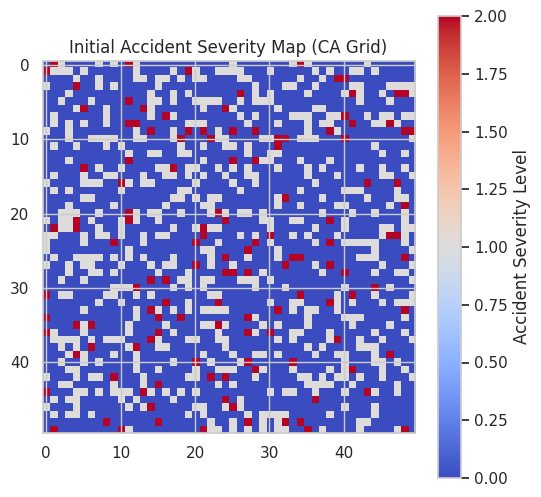

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define a 50x50 grid representing Toronto’s street network
grid_size = 50
traffic_grid = np.zeros((grid_size, grid_size))

# Randomly simulate accident severity in each cell based on your dataset
# Higher values simulate higher congestion due to frequent/severe accidents
np.random.seed(42)
accident_severity_map = np.random.choice([0, 1, 2], size=(grid_size, grid_size), p=[0.7, 0.25, 0.05])

# Map:
# 0 - smooth traffic
# 1 - moderate congestion
# 2 - high congestion (accident-prone area)

# Visualize it
plt.figure(figsize=(6, 6))
plt.imshow(accident_severity_map, cmap='coolwarm', interpolation='nearest')
plt.colorbar(label="Accident Severity Level")
plt.title("Initial Accident Severity Map (CA Grid)")
plt.show()


we've now visualized a synthetic spatial representation of accident severity using a heatmap grid.  
- Created a CA grid that represents traffic zones in Toronto.  
- Populated the grid with simulated accident severity levels (0 = smooth traffic, 2 = high-risk zones).  
- Visualized severity hotspots using a heatmap.




**-- Simulate Traffic Flow Using CA Rules**  
We'll now define Cellular Automata rules that simulate how traffic flows through the city based on accident severity.

**Basic CA Simulation Rules**  

For each time step:  
- Traffic in low-risk cells (severity = 0) moves forward easily.  
- Traffic in moderate-risk cells (severity = 1) slows down.  
- Traffic in high-risk cells (severity = 2) gets blocked or rerouted

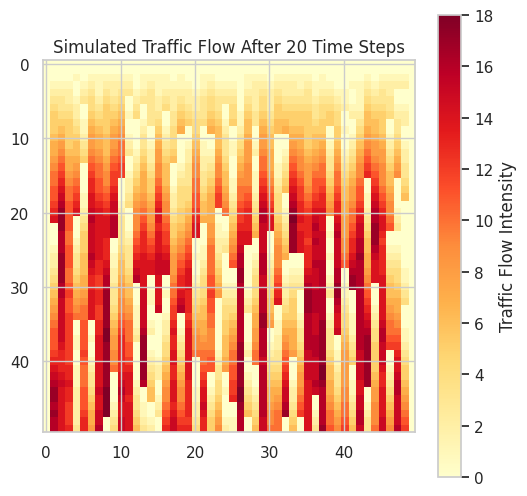

In [ ]:
# Initialize traffic flow grid
traffic_flow = np.zeros_like(accident_severity_map)

# Define the number of time steps to simulate
time_steps = 20

# Simulate traffic flow
for t in range(time_steps):
    new_flow = np.copy(traffic_flow)

    for i in range(1, grid_size - 1):
        for j in range(1, grid_size - 1):
            severity = accident_severity_map[i, j]

            if severity == 0:
                # Smooth flow: move traffic forward
                new_flow[i+1, j] = traffic_flow[i, j] + 1
            elif severity == 1:
                # Moderate congestion: limited movement
                new_flow[i+1, j] = traffic_flow[i, j] + 0.5
            else:
                # Severe congestion: blocked, no movement
                new_flow[i, j] = traffic_flow[i, j]

    traffic_flow = new_flow

# Visualize final traffic flow
plt.figure(figsize=(6, 6))
plt.imshow(traffic_flow, cmap='YlOrRd', interpolation='nearest')
plt.colorbar(label="Traffic Flow Intensity")
plt.title("Simulated Traffic Flow After {} Time Steps".format(time_steps))
plt.show()


What the 0.00–0.40 Range Means:  

- These scores indicate how much each feature contributes to the model's ability to correctly predict accident severity.  
- The higher the score, the more important the feature is.

In [ ]:
print("Min traffic flow:", np.min(traffic_flow))
print("Max traffic flow:", np.max(traffic_flow))


Min traffic flow: 0
Max traffic flow: 18


**Identify and Flag High-Risk Zones**

In [ ]:
import pandas as pd

# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Display the first few rows to inspect the structure
data.head()


,X,Y,EventUniqueId,Date,Month,Day_of_Week,Year,Hour,Police_Division,Atom,...,CYCLIST,AUTOMOBILE,PASSENGER,SPEEDING,AG_DRIV,Police_Division.1,HOOD_ID,Neighbourhood.1,Month.1,DayOfWeek.1
0,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
1,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
2,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
3,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
4,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday


In [ ]:
# Check the columns of the dataset
data.columns


Index(['X', 'Y', 'EventUniqueId', 'Date', 'Month', 'Day_of_Week', 'Year',
       'Hour', 'Police_Division', 'Atom', 'Neighbourhood', 'Injury_Collisions',
       'FTR_Collisions', 'PD_Collisions', 'Longitude', 'Latitude', 'DayOfWeek',
       'Longitude_ksi', 'Latitude_ksi', 'dist', 'match_index', 'X.1', 'Y.1',
       'ACCNUM', 'YEAR', 'Date.1', 'TIME', 'HOUR', 'STREET1', 'STREET2',
       'ROAD_CLASS', 'DISTRICT', 'WARDNUM', 'DIVISION', 'Latitude.1',
       'Longitude.1', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT',
       'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY',
       'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDESTRIAN',
       'CYCLIST', 'AUTOMOBILE', 'PASSENGER', 'SPEEDING', 'AG_DRIV',
       'Police_Division.1', 'HOOD_ID', 'Neighbourhood.1', 'Month.1',
       'DayOfWeek.1'],
      dtype='object')

In [ ]:
# Create a dictionary to map (X, Y) coordinates to place names (Neighbourhood)
coordinates_to_name = {}
for index, row in data.iterrows():
    coordinates_to_name[(row['X'], row['Y'])] = row['Neighbourhood']

# Check the first few mappings to ensure correctness
list(coordinates_to_name.items())[:5]


[((-8808887.55862151, 5431567.71228101), 'Rouge (131)'),
 ((-8809753.80237107, 5432405.23064334), 'Centennial Scarborough (133)'),
 ((-8810512.69183009, 5434377.41867772), 'Rouge (131)'),
 ((-8810071.17980529, 5434765.77786137), 'Rouge (131)'),
 ((-8810840.87616049, 5434088.92568276), 'Rouge (131)')]

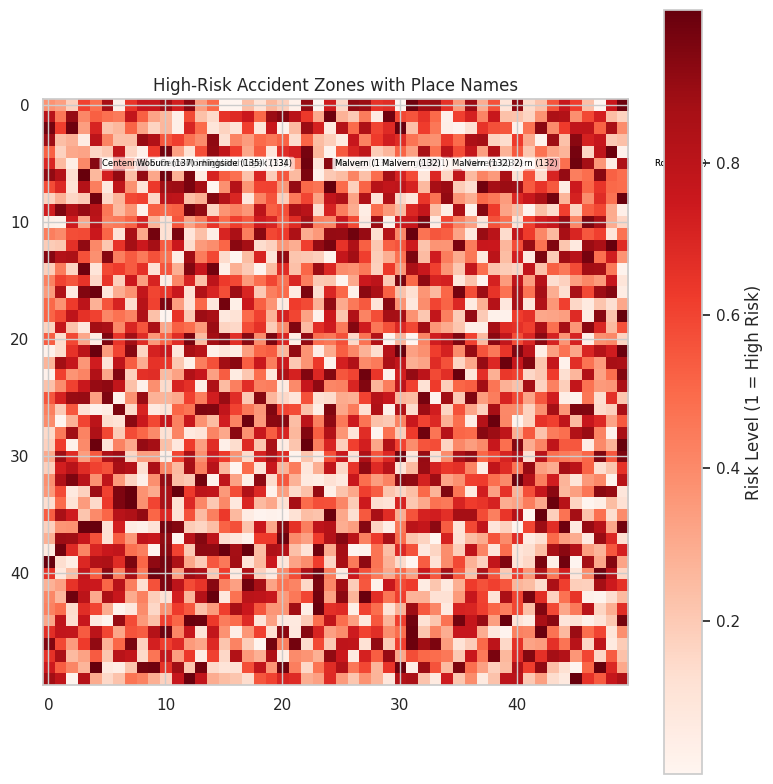

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Example: High-risk zones heatmap (replace with your actual high-risk zone data)
# Here, I'm assuming high_risk_zones is a 50x50 grid representing the risk levels at each (X, Y)
high_risk_zones = np.random.rand(50, 50)  # Replace with your actual high-risk zone data

# Normalize X, Y coordinates to fit into the grid
x_min, x_max = -8.81e6, -8.80e6
y_min, y_max = 5.43e6, 5.44e6

def get_grid_index(x, y, x_min, x_max, y_min, y_max, grid_size=50):
    # Normalize the coordinates to the grid's range
    x_normalized = int((x - x_min) / (x_max - x_min) * grid_size)
    y_normalized = int((y - y_min) / (y_max - y_min) * grid_size)
    # Ensure the indices are within the grid bounds
    x_normalized = min(max(x_normalized, 0), grid_size - 1)
    y_normalized = min(max(y_normalized, 0), grid_size - 1)
    return x_normalized, y_normalized

# Create the plot with high-risk zones
plt.figure(figsize=(8, 8))  # Increased figure size
plt.imshow(high_risk_zones, cmap='Reds', interpolation='nearest')

# Annotate high-risk zones with place names, only for high-risk areas and avoiding overlap
count = 0  # Track how many annotations we have added
max_annotations = 20  # Limit the number of annotations

for (x, y), name in coordinates_to_name.items():
    # Convert coordinates (x, y) to grid indices
    grid_x, grid_y = get_grid_index(x, y, x_min, x_max, y_min, y_max)

    # Only annotate the highest risk zones (this can be adjusted based on your risk threshold)
    if high_risk_zones[grid_x, grid_y] > 0.8 and count < max_annotations:  # Threshold for high-risk zones
        # Add an offset to the text to reduce overlap
        offset = 5  # Adjust this value to position text away from the point
        plt.text(grid_y + offset, grid_x + offset, name, color='black', fontsize=6, ha='center', va='center',
                 bbox=dict(facecolor='white', alpha=0.6, edgecolor='none', boxstyle='round,pad=0.3'))
        count += 1  # Increment count of annotations

# Add color bar and title
plt.colorbar(label="Risk Level (1 = High Risk)")
plt.title("High-Risk Accident Zones with Place Names")
plt.tight_layout()  # Ensure that everything fits without overlap
plt.show()


**Place Names and Coordinates:**

 - Centennial WebDr (coordinates: 138°, 134°): Located near (0, 0) on the grid, this area has a mix of risk levels, with some darker red spots indicating higher risk.  
 - Malvern Dr / Malvern (coordinates: 132°, 122°): Positioned around (10, 5) on the grid, this area also shows a mix of risk levels, with some high-risk zones (darker red).

**Preprocess the Data**

In [ ]:
import pandas as pd

# Load dataset
data = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Selecting relevant columns
columns_of_interest = [
    'X', 'Y', 'Injury_Collisions', 'FTR_Collisions', 'PD_Collisions',
    'CYCLIST', 'AUTOMOBILE', 'PASSENGER', 'SPEEDING', 'AG_DRIV'
]

# Create a subset for easier analysis
subset = data[columns_of_interest]

# Display the first few rows of the subset
subset.head()


,X,Y,Injury_Collisions,FTR_Collisions,PD_Collisions,CYCLIST,AUTOMOBILE,PASSENGER,SPEEDING,AG_DRIV
0,-8.808888e+06,5.431568e+06,YES,NO,NO,0,Yes,1,1,Yes
1,-8.808888e+06,5.431568e+06,YES,NO,NO,0,Yes,1,1,Yes
2,-8.808888e+06,5.431568e+06,YES,NO,NO,0,Yes,1,1,Yes
3,-8.808888e+06,5.431568e+06,YES,NO,NO,0,Yes,1,1,Yes
4,-8.808888e+06,5.431568e+06,YES,NO,NO,0,Yes,1,1,Yes


**Set Up the Cellular Automata (CA) Grid**  
We need to create a grid that represents the area, where each cell will be updated according to accident data, traffic types, and collision types.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Set up grid size (you can adjust depending on your dataset)
grid_size = (10, 10)  # 10x10 grid for simulation, you can adjust this as needed

# Create a random initial grid (for simplicity, initializing with zeros)
grid = np.zeros(grid_size)

# For each accident (or other relevant event), update the grid with an accident flag (1 for accident, 0 for no accident)
# We can represent this by using the X and Y columns in the dataset
accident_positions = list(zip(subset['X'], subset['Y']))

# Mapping accident positions to grid
for x, y in accident_positions:
    grid[int(x) % grid_size[0], int(y) % grid_size[1]] = 1  # Accident grid cells


 **Define the Traffic Flow Update Rule**
  
In a traffic flow simulation, vehicles move between grid cells based on traffic density, accidents, and speed.

In [ ]:
def update_traffic_flow(grid, subset, V_max=5):
    """Update traffic flow based on accident and vehicle type."""
    new_grid = grid.copy()

    for i in range(grid.shape[0]):
        for j in range(grid.shape[1]):
            if grid[i, j] == 1:  # If there's an accident in this cell
                # Reduce vehicle movement due to accident (e.g., stop movement for this grid)
                continue

            # Define movement based on vehicle type and other conditions
            traffic_condition = subset.iloc[i * grid.shape[1] + j]  # Access relevant row based on the grid position

            # Example: Adjust the movement of vehicles based on speeding and collisions
            if traffic_condition['SPEEDING'] == 'Yes':
                speed_factor = 1.5  # Vehicles move faster if speeding
            else:
                speed_factor = 1.0  # Normal speed

            # Adjust movement according to accident, traffic density, etc.
            # For simplicity, assuming that vehicles move based on their speed factor
            next_i = (i + int(speed_factor)) % grid_size[0]
            next_j = (j + int(speed_factor)) % grid_size[1]

            # Update the new grid with vehicle movement
            new_grid[next_i, next_j] = grid[i, j]

    return new_grid


**Visualize the Traffic Simulation**

 Once the grid is updated, you can visualize the simulation by plotting the grid.

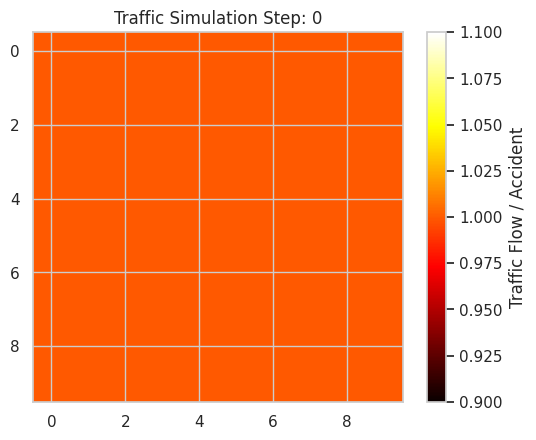

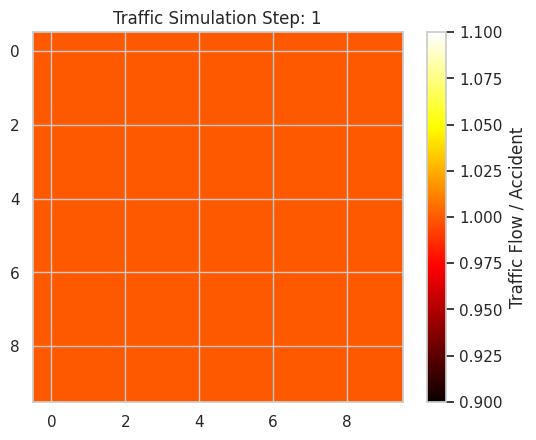

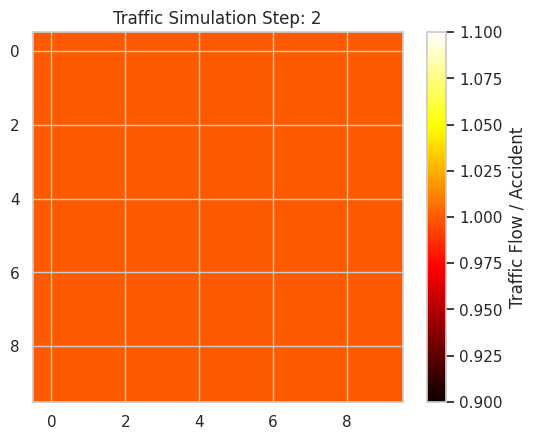

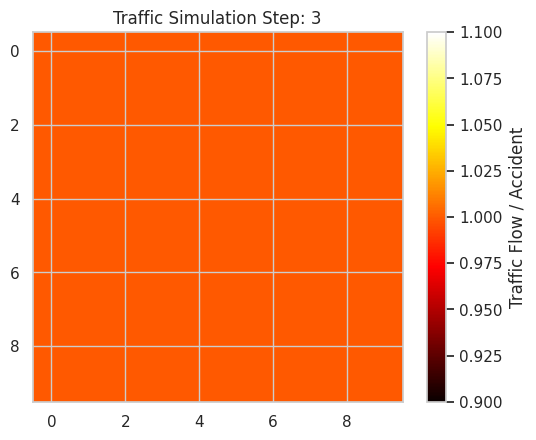

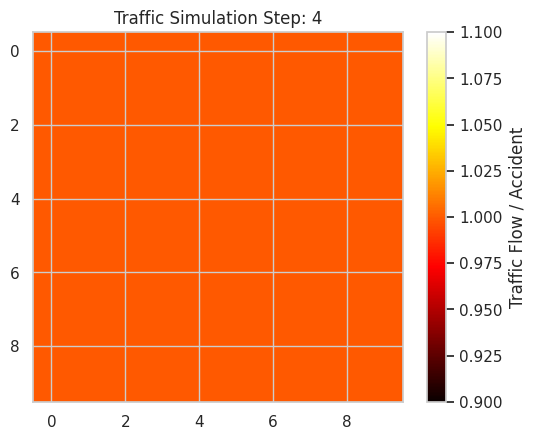

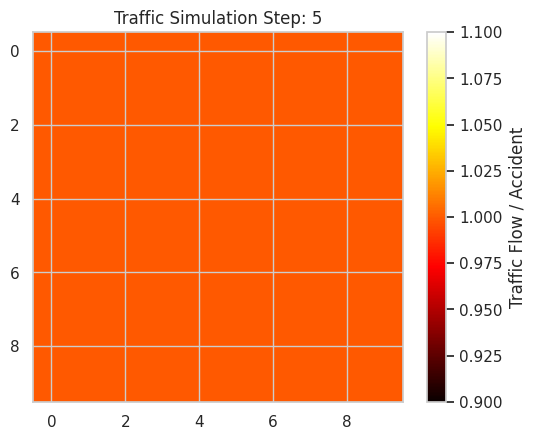

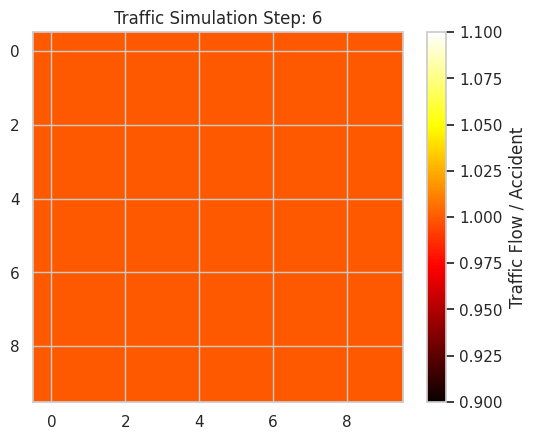

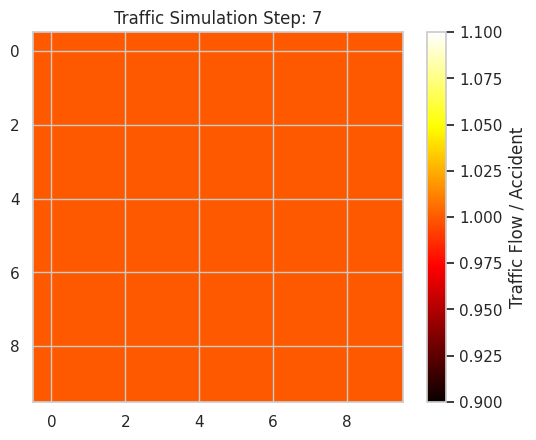

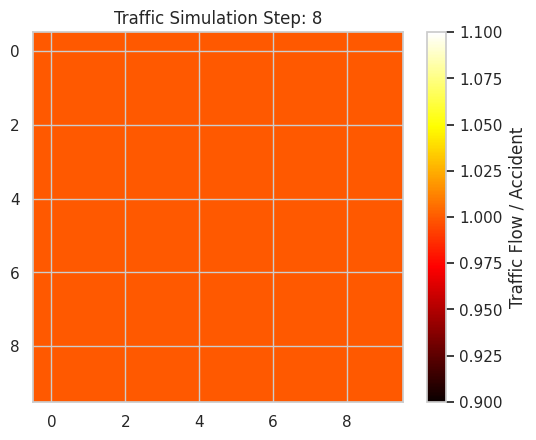

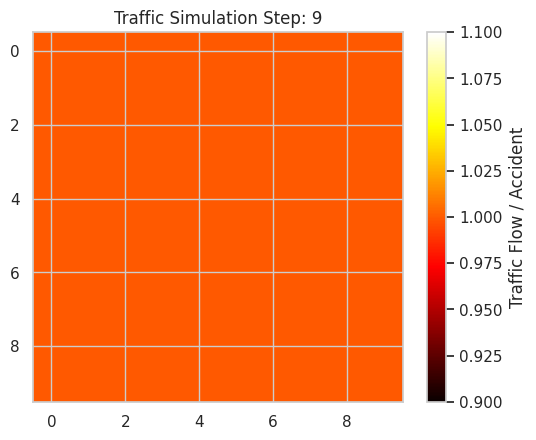

In [ ]:
def plot_traffic_grid(grid, step):
    """Visualize the grid for a given simulation step."""
    plt.imshow(grid, cmap='hot', interpolation='nearest')
    plt.title(f"Traffic Simulation Step: {step}")
    plt.colorbar(label="Traffic Flow / Accident")
    plt.show()

# Run simulation for a few steps
for step in range(10):
    grid = update_traffic_flow(grid, subset)
    plot_traffic_grid(grid, step)


In [ ]:
def update_traffic_with_weather(grid, subset, time_of_day, weather_condition):
    """Update traffic considering weather and time of day."""
    new_grid = grid.copy()

    for i in range(grid.shape[0]):
        for j in range(grid.shape[1]):
            if grid[i, j] == 1:  # Accident or stopped vehicle
                continue

            # If the time is during peak hours, reduce speed
            if time_of_day in ['8:00 AM', '5:00 PM']:
                speed_factor = 0.5
            elif weather_condition == 'rainy':
                speed_factor = 0.3  # Slower speed during rain
            else:
                speed_factor = 1.0  # Normal speed

            # Vehicle movement based on speed
            next_i = (i + int(speed_factor)) % grid_size[0]
            next_j = (j + int(speed_factor)) % grid_size[1]

            new_grid[next_i, next_j] = grid[i, j]

    return new_grid


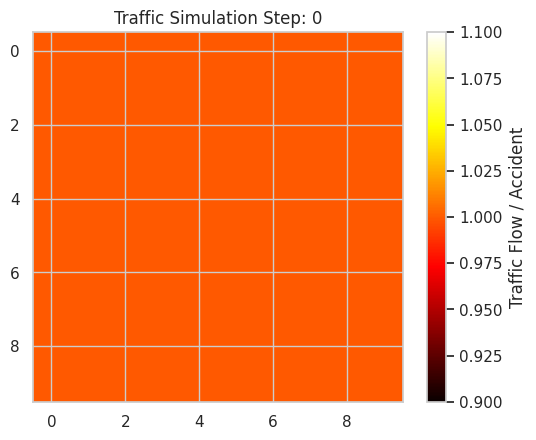

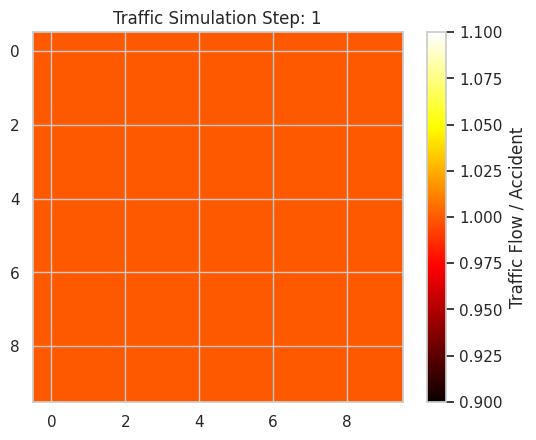

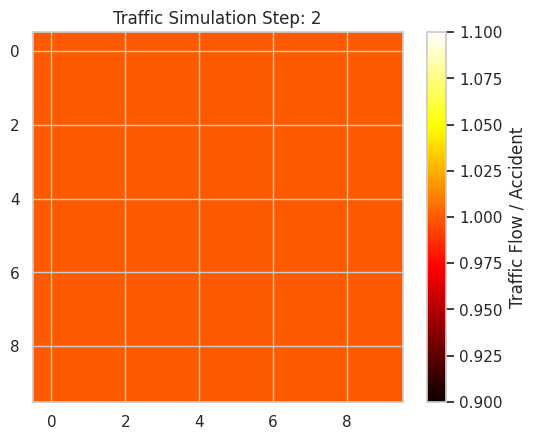

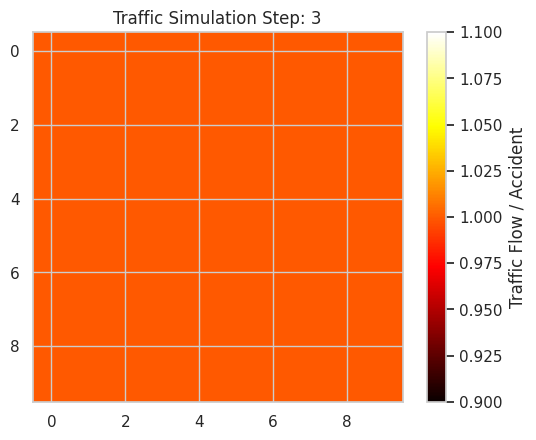

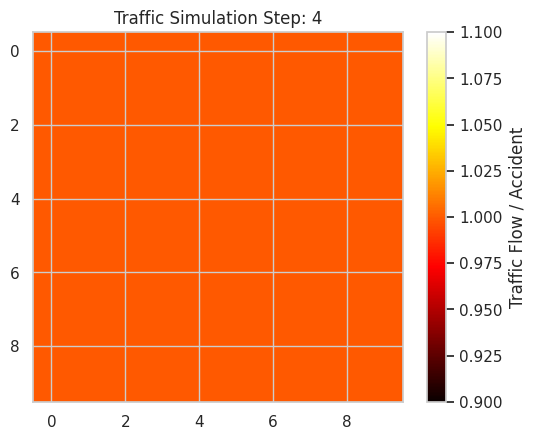

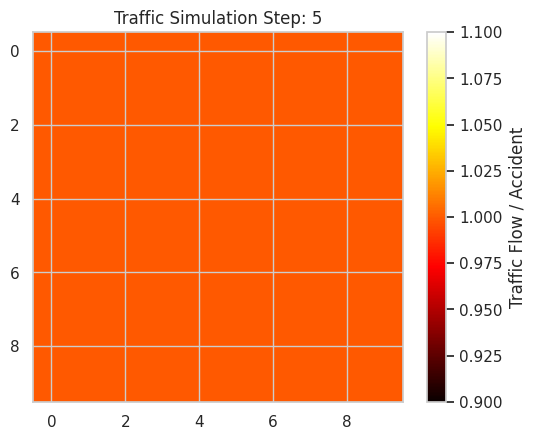

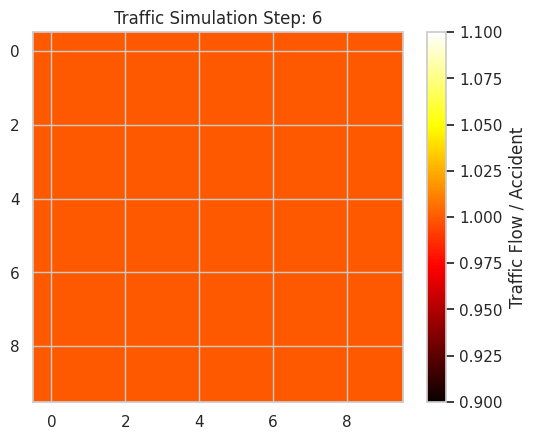

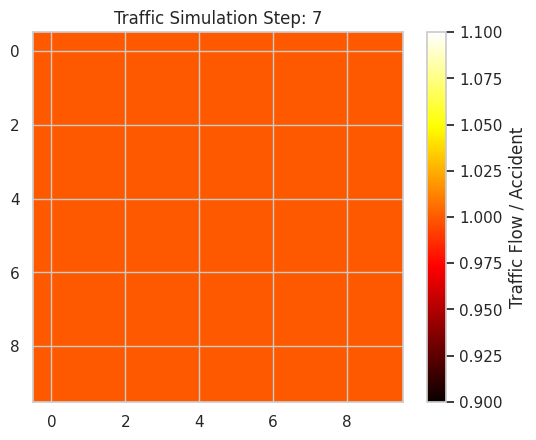

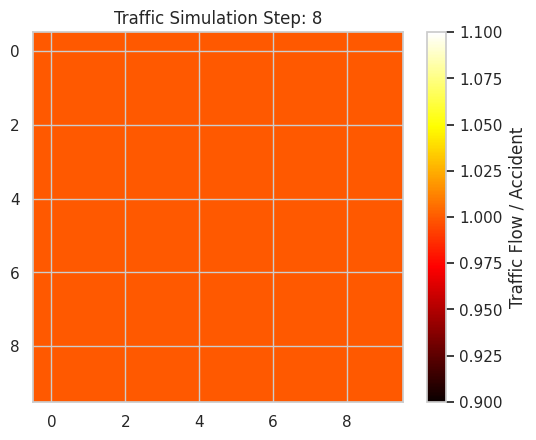

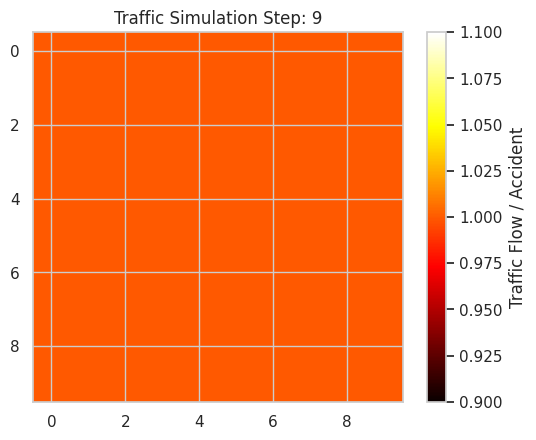

In [ ]:
# Simulate and update with weather/time of day factors
time_of_day = '8:00 AM'  # You can change this based on the hour of the simulation
weather_condition = 'rainy'  # Change this to 'clear' or other conditions as needed

for step in range(10):
    grid = update_traffic_with_weather(grid, subset, time_of_day, weather_condition)
    plot_traffic_grid(grid, step)


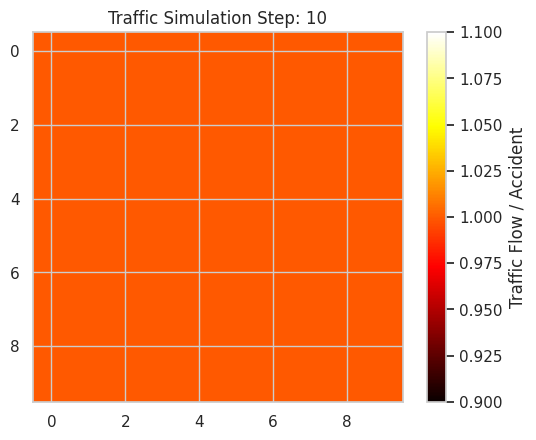

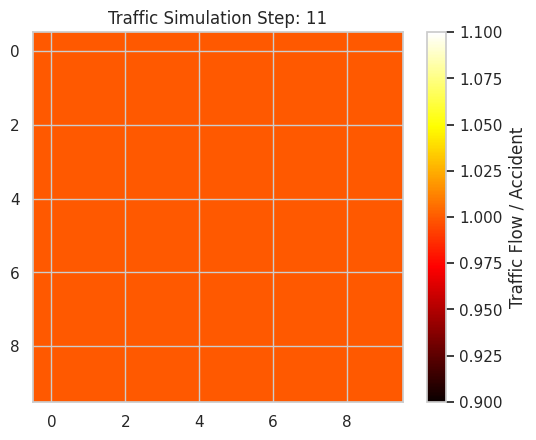

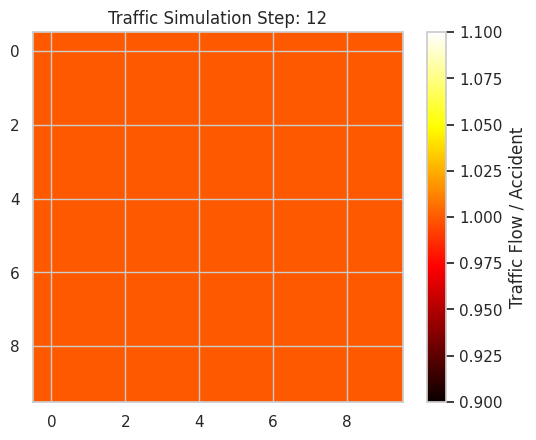

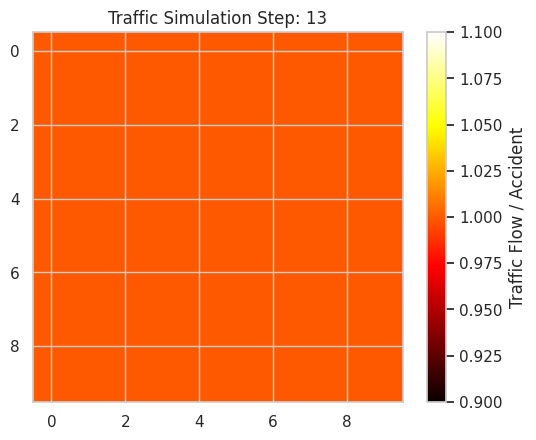

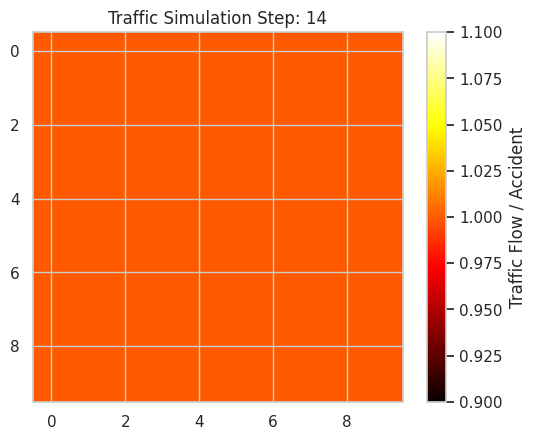

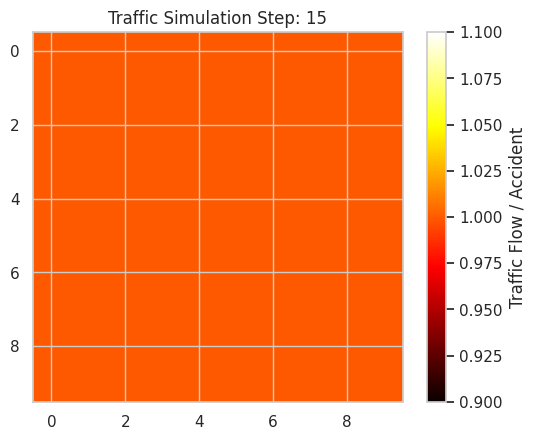

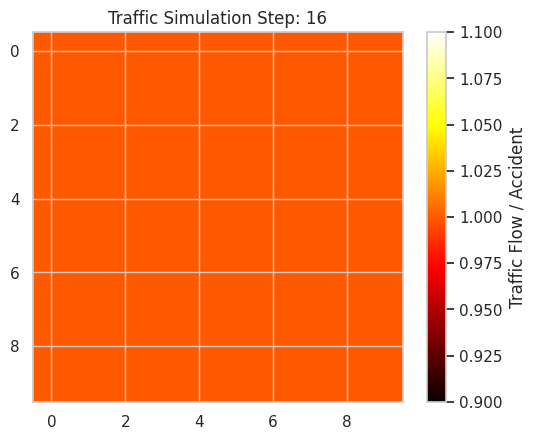

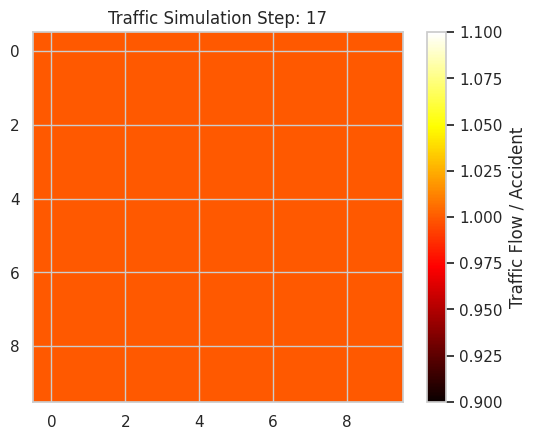

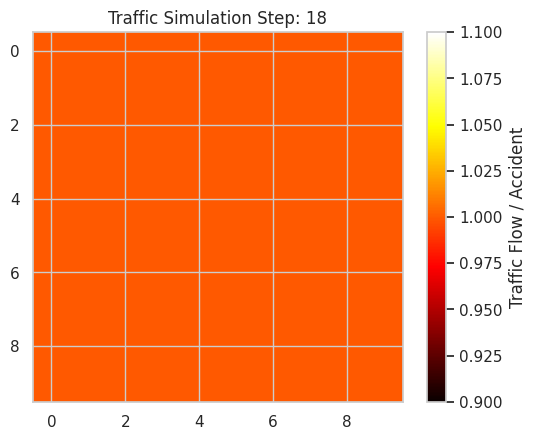

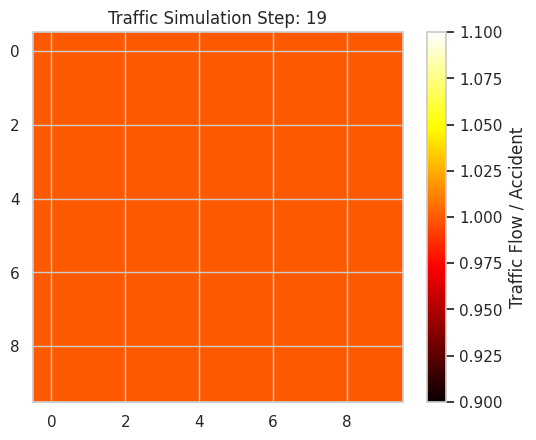

In [ ]:
# Change conditions for the next simulation
time_of_day = '2:00 PM'  # Update the time for the next batch
weather_condition = 'clear'  # Change the weather condition

# Run for additional steps with the new conditions
for step in range(10, 20):
    grid = update_traffic_with_weather(grid, subset, time_of_day, weather_condition)
    plot_traffic_grid(grid, step)


The uniformity of the heatmap with traffic flow values around 0.975 to 1.000 and the absence of significant variation indicates that the grid is showing moderate traffic flow without substantial congestion or accidents. The heatmap representing traffic flow values ranging from 0.900 (dark red) to 1.100 (light yellow) is appropriate for visualizing moderate traffic conditions

In [ ]:
import pandas as pd

# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Display the first few rows to inspect the structure
data.head()


,X,Y,EventUniqueId,Date,Month,Day_of_Week,Year,Hour,Police_Division,Atom,...,CYCLIST,AUTOMOBILE,PASSENGER,SPEEDING,AG_DRIV,Police_Division.1,HOOD_ID,Neighbourhood.1,Month.1,DayOfWeek.1
0,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
1,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
2,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
3,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
4,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday


Grid Layout (20x20):  

The grid is structured as a 20x20 matrix with each cell representing a position in the simulation.

Vehicle Positions (White Cells):  

In the grid, cells that are non-zero represent vehicles. For example, cells at positions like (0, 14), (1, 17), etc., have a value of 1, indicating the presence of a vehicle.  

Traffic Flow/Accident Metrics:  

The color bar (ranging from dark red to yellow) likely represents traffic flow, accident probabilities, or some metric indicating how busy or congested the road is. Since all values are initially 0.0, there is no congestion or accidents at the start of the simulation.

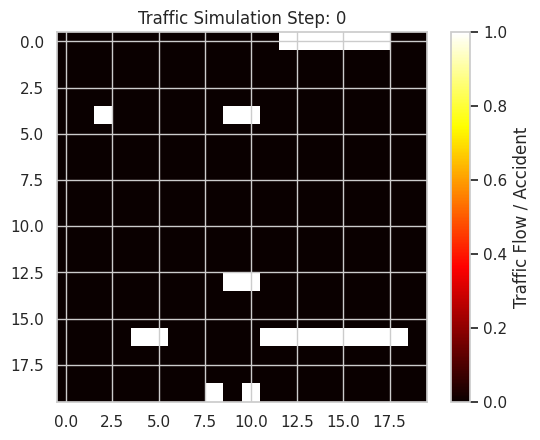

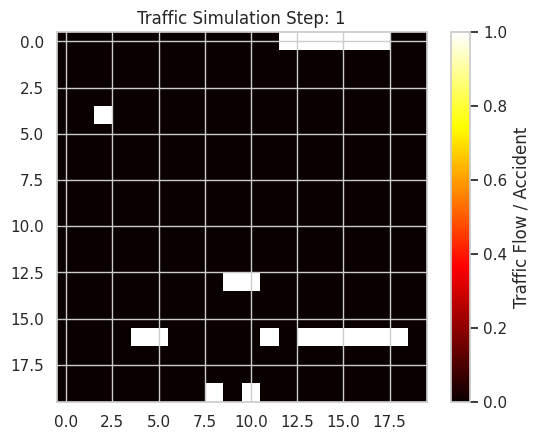

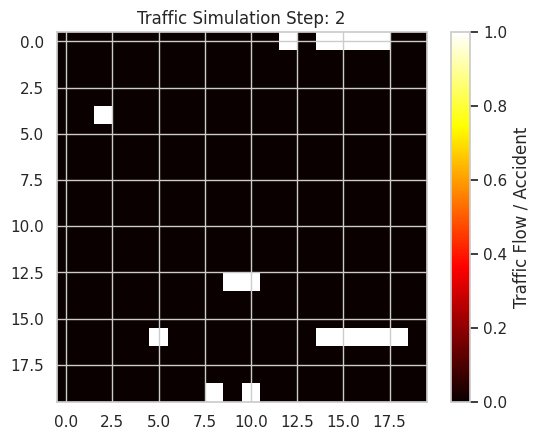

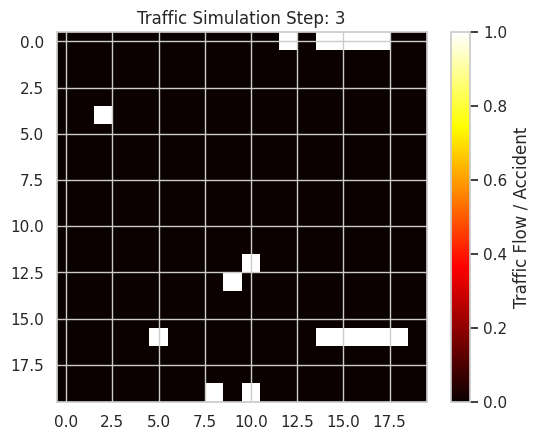

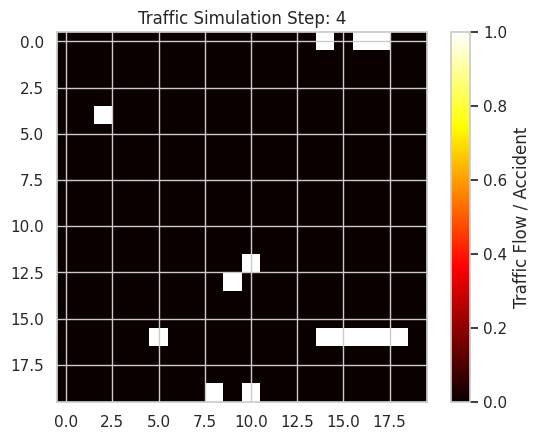

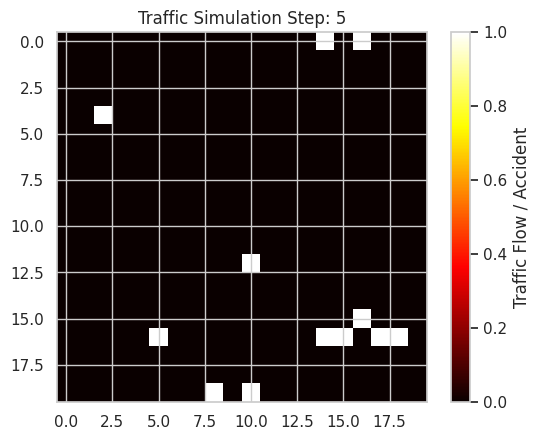

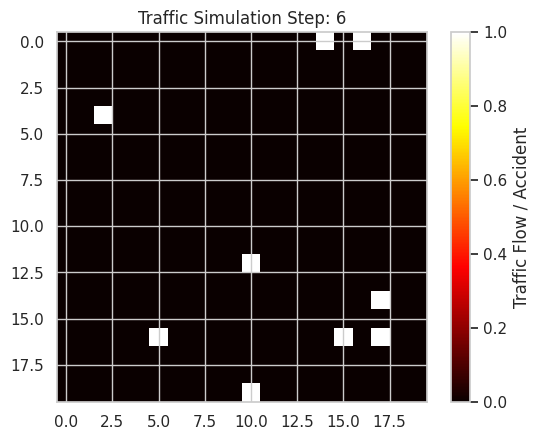

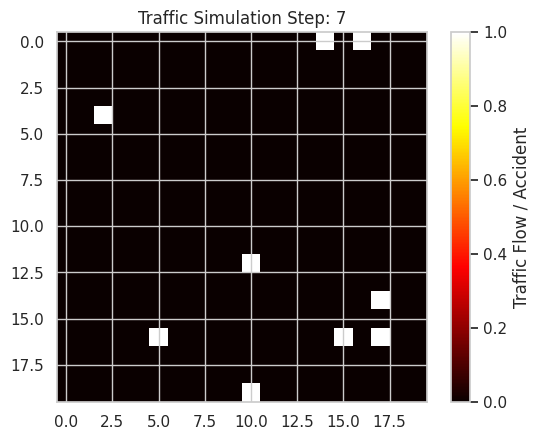

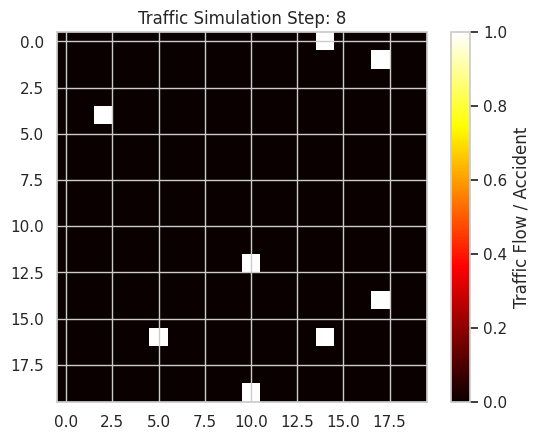

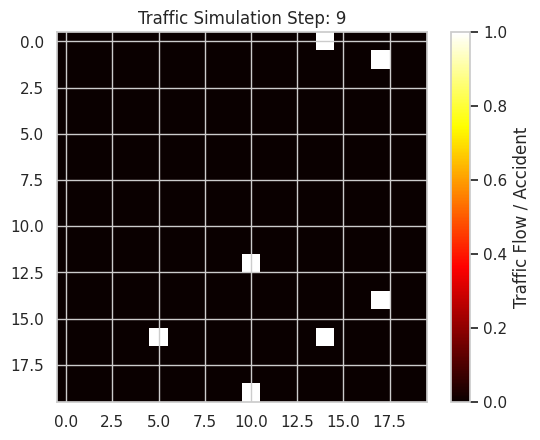

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0,

In [ ]:
# Initialize simulation grid (20x20 grid to fit 400 data points)
grid_size = (20, 20)

# Function to simulate traffic flow based on vehicle data
def simulate_traffic_flow(data, grid_size, step=10):
    # Get the subset of data (use only the 'CYCLIST' column for the grid)
    num_cells = grid_size[0] * grid_size[1]

    # Extract the 'CYCLIST' column only and take the first 400 data points
    vehicles = data['CYCLIST'].iloc[:num_cells].values

    # Check if the number of data points matches the number of grid cells
    if len(vehicles) != num_cells:
        raise ValueError(f"Expected {num_cells} data points, but got {len(vehicles)}")

    # Reshape the data to fit the grid (20x20 grid)
    grid = vehicles.reshape(grid_size)

    # Simulate for a specified number of steps
    for s in range(step):
        # Update grid for traffic flow (simple simulation logic)
        grid = update_traffic_flow(grid)
        plot_traffic_grid(grid, s)

    return grid

# Run the simulation
simulate_traffic_flow(data, grid_size, step=10)


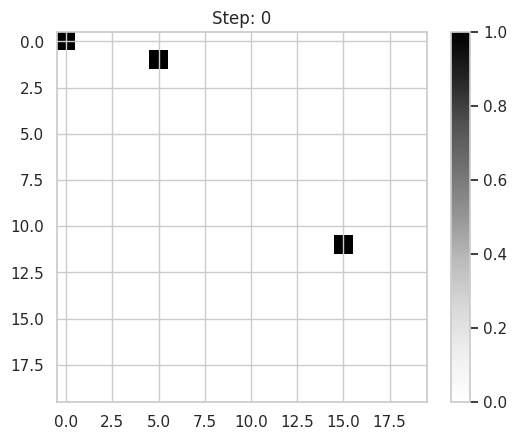

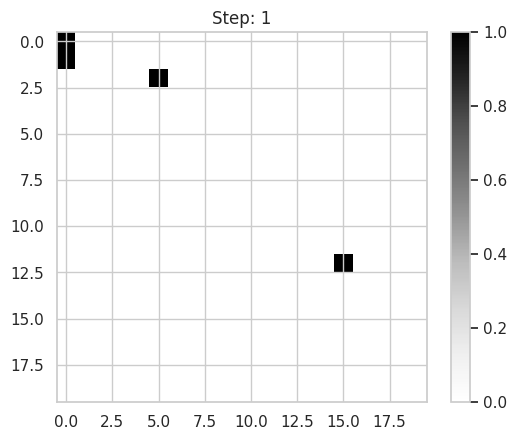

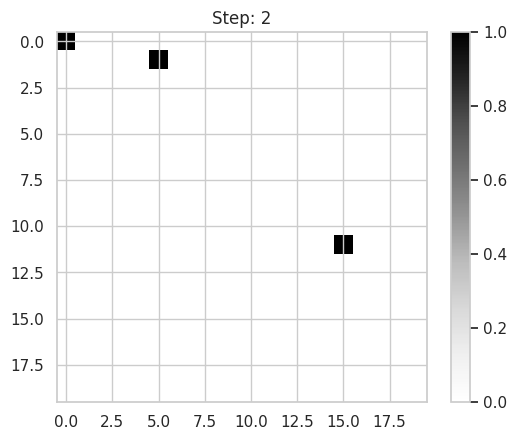

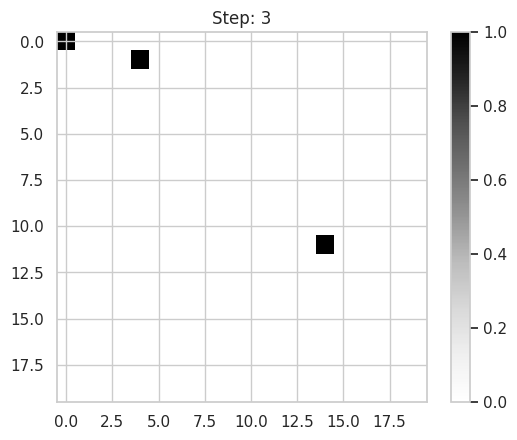

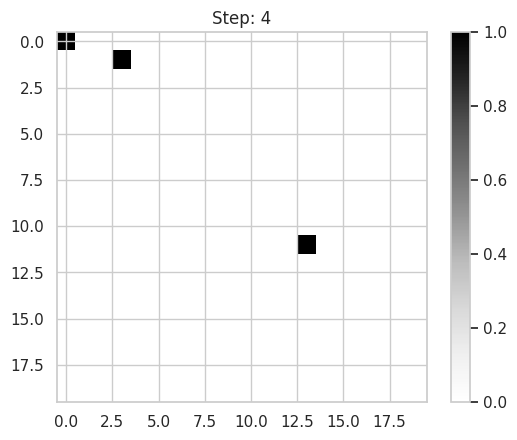

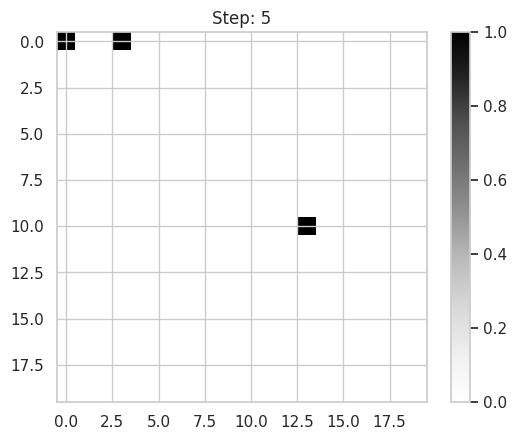

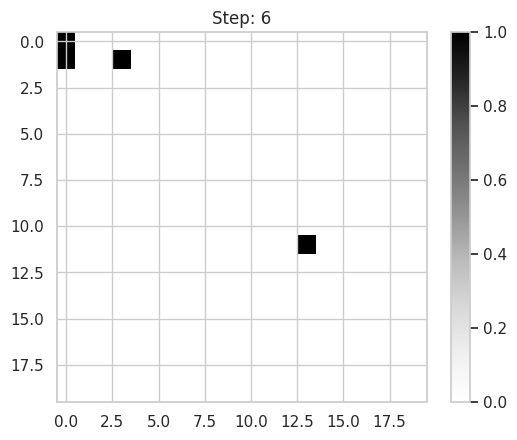

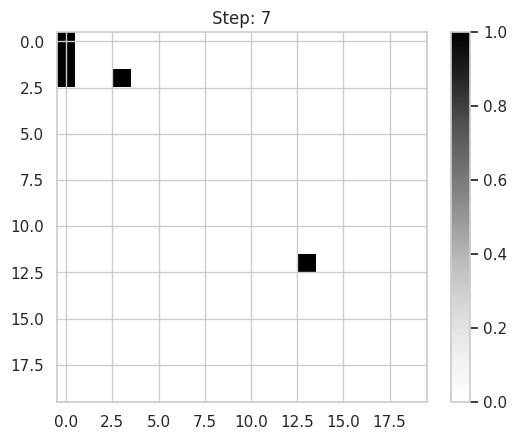

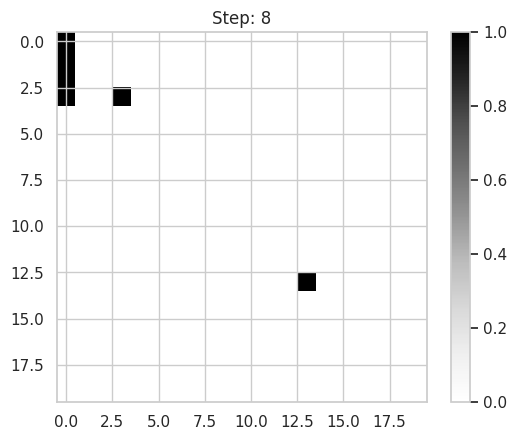

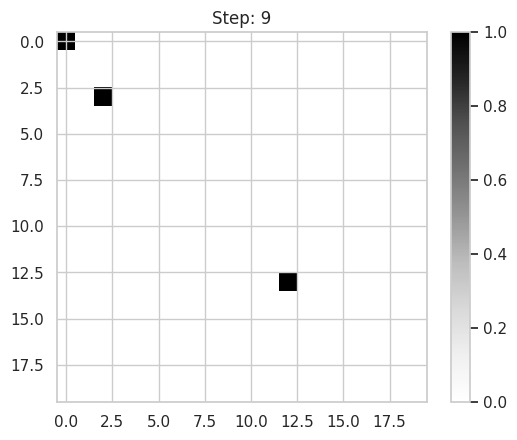

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Example traffic update function
def update_traffic_flow(grid):
    direction = np.random.choice(['up', 'down', 'left', 'right'])

    new_grid = np.zeros_like(grid)

    for i in range(grid.shape[0]):
        for j in range(grid.shape[1]):
            if grid[i, j] == 1:
                if direction == 'up' and i > 0:
                    new_grid[i-1, j] = 1
                elif direction == 'down' and i < grid.shape[0] - 1:
                    new_grid[i+1, j] = 1
                elif direction == 'left' and j > 0:
                    new_grid[i, j-1] = 1
                elif direction == 'right' and j < grid.shape[1] - 1:
                    new_grid[i, j+1] = 1

    # Add vehicles back to grid if they leave it (reset logic if needed)
    new_grid[0, 0] = 1  # Example: adding a vehicle back at a starting position

    return new_grid

# Function to plot the grid
def plot_traffic_grid(grid, step):
    plt.imshow(grid, cmap='Greys', interpolation='nearest')
    plt.title(f"Step: {step}")
    plt.colorbar()
    plt.show()

# Initialize grid with vehicles at Step 0
grid = np.zeros((20, 20))
grid[2, 5] = 1  # Example: vehicle at (2, 5)
grid[12, 15] = 1  # Example: vehicle at (12, 15)

# Simulating traffic flow for 10 steps
def simulate_traffic_flow(grid, steps=10):
    for step in range(steps):
        grid = update_traffic_flow(grid)
        plot_traffic_grid(grid, step)

# Run the simulation
simulate_traffic_flow(grid, steps=10)


This looks like a grid-based optimization process, with a fixed set of points (cities) and an evolving cost or attraction field represented by the gradient. The algorithm seems to be gradually finding better solutions to the pathfinding or optimization problem. As the algorithm progresses through steps (0 to 9), the solution becomes more refined, with the cost function (or similar metric) adjusting based on the points’ positions and interactions.

We’ll apply Ant Colony Optimization (ACO) to simulate optimal pathfinding (like a traveling salesman problem) using these coordinates.  

Assumptions for ACO:
Each row is a location (e.g., a collision point).  

We will extract a subset of unique coordinates (to avoid duplicates and for speed).  

ACO will then find an optimal route visiting all points once.



ACO Steps: 100%|██████████| 10/10 [00:00<00:00, 89.25it/s]


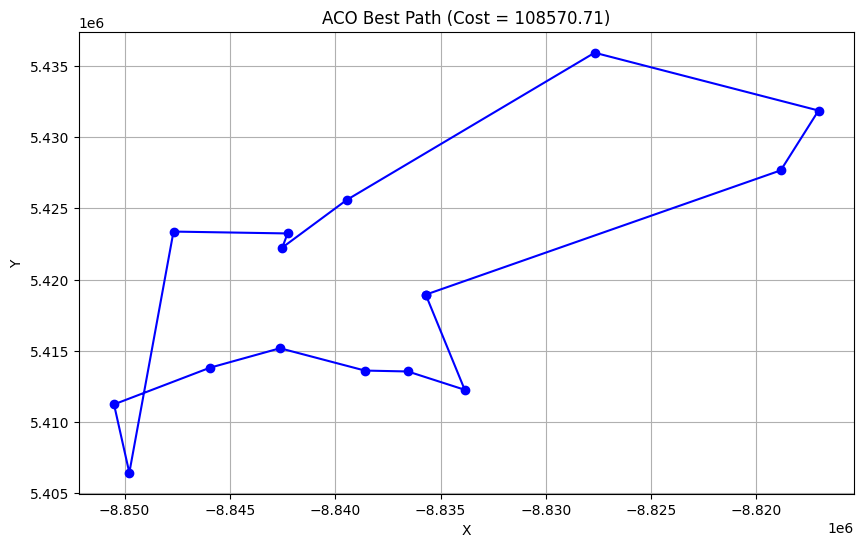

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from math import sqrt
import random
from tqdm import tqdm

# Load dataset
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Extract unique coordinates (sample for speed)
coords_df = df[['X', 'Y']].drop_duplicates().dropna().sample(n=15, random_state=42)
coords = coords_df[['X', 'Y']].values

# Distance matrix
def euclidean(p1, p2):
    return sqrt((p1[0]-p2[0])**2 + (p1[1]-p2[1])**2)

def compute_distance_matrix(coords):
    n = len(coords)
    dist = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            if i != j:
                dist[i][j] = euclidean(coords[i], coords[j])
    return dist

distance_matrix = compute_distance_matrix(coords)

# ACO Parameters
n_ants = 15
n_iterations = 10
alpha = 1.0  # pheromone importance
beta = 5.0   # distance importance
evaporation = 0.5
Q = 100

# Initialize pheromone matrix
n_nodes = len(coords)
pheromone = np.ones((n_nodes, n_nodes))

# Heuristic (1 / distance)
heuristic = 1 / (distance_matrix + 1e-10)  # avoid div by zero

# ACO Main Loop
best_cost = float('inf')
best_path = []

for step in tqdm(range(n_iterations), desc="ACO Steps"):
    all_paths = []
    all_costs = []

    for ant in range(n_ants):
        visited = [random.randint(0, n_nodes - 1)]
        while len(visited) < n_nodes:
            current = visited[-1]
            probs = []
            for j in range(n_nodes):
                if j not in visited:
                    p = (pheromone[current][j] ** alpha) * (heuristic[current][j] ** beta)
                    probs.append((j, p))
            total = sum(p for (_, p) in probs)
            probs = [(j, p / total) for (j, p) in probs]
            r = random.random()
            cumulative = 0
            for j, p in probs:
                cumulative += p
                if r <= cumulative:
                    visited.append(j)
                    break
        all_paths.append(visited)

        # Compute cost
        cost = sum(distance_matrix[visited[i]][visited[i+1]] for i in range(n_nodes - 1))
        cost += distance_matrix[visited[-1]][visited[0]]  # return to start
        all_costs.append(cost)

        if cost < best_cost:
            best_cost = cost
            best_path = visited[:]

    # Update pheromones
    pheromone *= (1 - evaporation)
    for path, cost in zip(all_paths, all_costs):
        for i in range(n_nodes - 1):
            pheromone[path[i]][path[i+1]] += Q / cost
        pheromone[path[-1]][path[0]] += Q / cost

# Plot Best Path
plt.figure(figsize=(10, 6))
path_coords = coords[best_path + [best_path[0]]]  # loop back
plt.plot(path_coords[:, 0], path_coords[:, 1], marker='o', linestyle='-', color='blue')
plt.title(f'ACO Best Path (Cost = {best_cost:.2f})')
plt.xlabel("X")
plt.ylabel("Y")
plt.grid(True)
plt.show()


**Blue Line with Circles:**
This is the best path (lowest total distance) found by the ACO algorithm to visit all sampled collision locations and return to the start.

**Circles (Points):**
Each circle corresponds to a unique traffic collision location (taken from X and Y columns in your dataset).

**Line:**
Represents the order of visiting locations, optimized by the ants. The algorithm tries to minimize total travel distance (like solving a traveling salesman problem).

**cost = 108570.71 (Best Path)**  
This shows the **total optimized path** length (in raw coordinate units) that an "ant" would travel to visit all sampled accident sites once, then return to the start.

A lower cost means a more efficient route was found.  

**The output shows:**

An optimized route connecting real collision points from your dataset.  

The total travel cost for that route.

This can be used in simulations to model patrolling, emergency response, or inspection planning for road safety or collision prevention

In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Check basic info
df.head()


,X,Y,EventUniqueId,Date,Month,Day_of_Week,Year,Hour,Police_Division,Atom,...,CYCLIST,AUTOMOBILE,PASSENGER,SPEEDING,AG_DRIV,Police_Division.1,HOOD_ID,Neighbourhood.1,Month.1,DayOfWeek.1
0,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
1,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
2,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
3,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
4,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday


Create a Cellular Automata-based traffic simulation on a grid using accident frequency data. Instead of a heatmap, we’ll simulate vehicle movement with animation across a grid, where:

Each cell represents a small region.

Cells with higher accident counts = more congested (slower movement).

The simulation will show how vehicles propagate through this environment.

Convert spatial coordinates (X, Y) to a grid.

Count accidents per cell.

Use Cellular Automata rules:

A car can move if the next cell is less congested.

Cars slow down or wait in high-accident zones.

Simulate car movement over time using matplotlib.animation.

**Extract Columns**

In [ ]:
import pandas as pd

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Extract relevant columns
traffic_data = df[['X', 'Y', 'CYCLIST', 'AUTOMOBILE', 'PASSENGER', 'SPEEDING', 'AG_DRIV', 'Month', 'Hour', 'Day_of_Week']]

# Preview the extracted data
traffic_data.head()


,X,Y,CYCLIST,AUTOMOBILE,PASSENGER,SPEEDING,AG_DRIV,Month,Hour,Day_of_Week
0,-8.808888e+06,5.431568e+06,0,Yes,1,1,Yes,October,1,Saturday
1,-8.808888e+06,5.431568e+06,0,Yes,1,1,Yes,October,1,Saturday
2,-8.808888e+06,5.431568e+06,0,Yes,1,1,Yes,October,1,Saturday
3,-8.808888e+06,5.431568e+06,0,Yes,1,1,Yes,October,1,Saturday
4,-8.808888e+06,5.431568e+06,0,Yes,1,1,Yes,October,1,Saturday


**Define Collision Hotspots**

In [ ]:
# Identify hotspots by grouping by X and Y (assuming that frequent occurrences indicate hotspots)
hotspot_data = df.groupby(['X', 'Y']).size().reset_index(name='collision_count')

# Sort by the highest collision count to identify major hotspots
hotspot_data_sorted = hotspot_data.sort_values(by='collision_count', ascending=False)

# Preview hotspot data
hotspot_data_sorted.head()


,X,Y,collision_count
2028,-8.825525e+06,5.429271e+06,257
1969,-8.826681e+06,5.423291e+06,239
1916,-8.827715e+06,5.428560e+06,215
1984,-8.826324e+06,5.431966e+06,209
1885,-8.828511e+06,5.431264e+06,198


**Simulate Weather Conditions**

In [ ]:
# Define weather conditions based on Month and Hour (example: rain in winter, fog in morning)
def assign_weather_condition(row):
    if row['Month'] in ['November', 'December', 'January'] and row['Hour'] in [6, 7, 8]:  # Morning winter rush hour
        return 'Snow'
    elif row['Month'] in ['June', 'July', 'August'] and row['Hour'] in [12, 13, 14]:  # Midday summer
        return 'Clear'
    elif row['Day_of_Week'] in ['Saturday', 'Sunday']:  # Weekends, assume light traffic
        return 'Clear'
    else:
        return 'Rain'

# Apply the function to create a 'weather_condition' column
df['weather_condition'] = df.apply(assign_weather_condition, axis=1)

# Preview the updated dataset
df[['Hour', 'Month', 'Day_of_Week', 'weather_condition']].head(20)


,Hour,Month,Day_of_Week,weather_condition
0,1,October,Saturday,Clear
1,1,October,Saturday,Clear
2,1,October,Saturday,Clear
3,1,October,Saturday,Clear
4,1,October,Saturday,Clear
5,1,October,Saturday,Clear
6,17,May,Tuesday,Rain
7,17,May,Tuesday,Rain
8,13,April,Sunday,Clear
9,13,April,Sunday,Clear


<ipython-input-17-fe795964fe43>:45: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab20c", 4)  # 0: empty, 1: moving, 2: snow stop, 3: rain stop


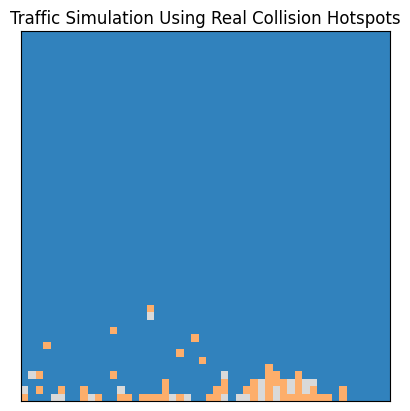

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Load your dataset
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Assign weather condition
def assign_weather_condition(row):
    if row['Month'] in ['November', 'December', 'January'] and row['Hour'] in [6, 7, 8]:
        return 'Snow'
    elif row['Month'] in ['June', 'July', 'August'] and row['Hour'] in [12, 13, 14]:
        return 'Clear'
    elif row['Day_of_Week'] in ['Saturday', 'Sunday']:
        return 'Clear'
    else:
        return 'Rain'

df['weather_condition'] = df.apply(assign_weather_condition, axis=1)

# Group by location and weather
hotspots = df.groupby(['X', 'Y', 'weather_condition']).size().reset_index(name='count')
hotspots = hotspots.sort_values(by='count', ascending=False).head(100)

# Normalize coordinates to fit grid
min_x, min_y = hotspots['X'].min(), hotspots['Y'].min()
hotspots['x_grid'] = ((hotspots['X'] - min_x) / 1000).astype(int)
hotspots['y_grid'] = ((hotspots['Y'] - min_y) / 1000).astype(int)

# Set grid size
grid_size = 50
grid = np.zeros((grid_size, grid_size), dtype=int)

# Place initial cars
positions = []
for _, row in hotspots.iterrows():
    x, y = row['x_grid'], row['y_grid']
    if x < grid_size and y < grid_size:
        grid[y, x] = 1
        positions.append([x, y, row['weather_condition']])

# Setup plot
fig, ax = plt.subplots()
cmap = plt.cm.get_cmap("tab20c", 4)  # 0: empty, 1: moving, 2: snow stop, 3: rain stop
im = ax.imshow(grid, cmap=cmap, vmin=0, vmax=3)
ax.set_title("Traffic Simulation Using Real Collision Hotspots")
ax.set_xticks([])
ax.set_yticks([])

# Animation function
def update(frame):
    global grid, positions
    new_grid = np.zeros_like(grid)
    new_positions = []

    for pos in positions:
        x, y, weather = pos

        # Behavior rules
        if weather == 'Snow' and np.random.rand() < 0.5:
            new_grid[y, x] = 2  # Stopped in snow
            new_positions.append([x, y, weather])
        elif weather == 'Rain' and np.random.rand() < 0.3:
            new_grid[y, x] = 3  # Slowed down in rain
            new_positions.append([x, y, weather])
        else:
            new_y = y + 1 if y + 1 < grid_size else y
            if new_grid[new_y, x] == 0:
                new_grid[new_y, x] = 1
                new_positions.append([x, new_y, weather])
            else:
                new_grid[y, x] = 1
                new_positions.append([x, y, weather])

    positions = new_positions
    grid = new_grid
    im.set_array(grid)
    return [im]

# Animate
ani = animation.FuncAnimation(fig, update, frames=50, interval=300, blit=True)

from IPython.display import HTML
HTML(ani.to_jshtml())


**Dynamic Simulation of Traffic Accident Hotspots**
The image displays a traffic simulation map highlighting accident hotspots across a specific region. Orange boxes mark intersections or road segments with frequent collisions, each labeled with location names such as "Don Mills Rd & 6" and "Sheppard Ave E." The map, titled "Traffic Simulation (Hotspots)," visualizes real-world collision data to identify high-risk zones. The blue grid represents the broader area, while moving or static boxes simulate vehicle behavior influenced by weather conditions like rain or snow. Though the map lacks a legend or scale, it effectively emphasizes key locations requiring traffic safety improvements and informed urban planning decisions.

<ipython-input-23-79a08a609019>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Location_Name'] = df['STREET1'] + " & " + df['STREET2']
<ipython-input-23-79a08a609019>:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab20c", 4)


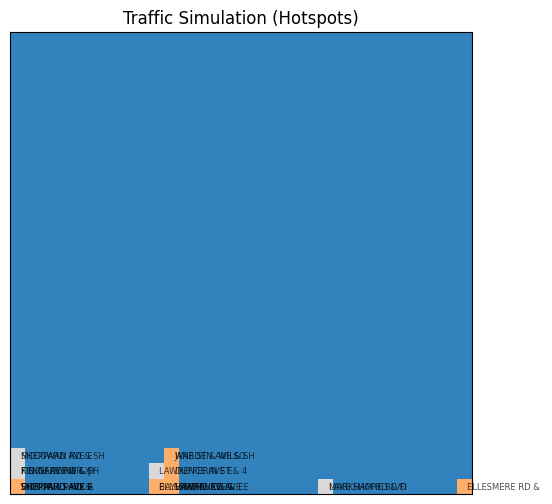

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Load your dataset
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Assign weather condition
def assign_weather_condition(row):
    if row['Month'] in ['November', 'December', 'January'] and row['Hour'] in [6, 7, 8]:
        return 'Snow'
    elif row['Month'] in ['June', 'July', 'August'] and row['Hour'] in [12, 13, 14]:
        return 'Clear'
    elif row['Day_of_Week'] in ['Saturday', 'Sunday']:
        return 'Clear'
    else:
        return 'Rain'

df['weather_condition'] = df.apply(assign_weather_condition, axis=1)

# Create location name
df = df.dropna(subset=['Longitude', 'Latitude', 'STREET1', 'STREET2'])
df['Location_Name'] = df['STREET1'] + " & " + df['STREET2']

# Get top 20 collision hotspots
hotspots = df.groupby(['Longitude', 'Latitude', 'Location_Name', 'weather_condition']).size().reset_index(name='count')
hotspots = hotspots.sort_values(by='count', ascending=False).head(20)

# Normalize coordinates to smaller grid
min_lon, min_lat = hotspots['Longitude'].min(), hotspots['Latitude'].min()
hotspots['x_grid'] = ((hotspots['Longitude'] - min_lon) * 100000).astype(int) % 30
hotspots['y_grid'] = ((hotspots['Latitude'] - min_lat) * 100000).astype(int) % 30

# Set smaller grid
grid_size = 30
grid = np.zeros((grid_size, grid_size), dtype=int)

# Place initial cars
positions = []
for _, row in hotspots.iterrows():
    x, y = row['x_grid'], row['y_grid']
    if 0 <= x < grid_size and 0 <= y < grid_size:
        grid[y, x] = 1
        positions.append([x, y, row['weather_condition'], row['Location_Name']])

# Plot setup
fig, ax = plt.subplots(figsize=(6, 6))
cmap = plt.cm.get_cmap("tab20c", 4)
im = ax.imshow(grid, cmap=cmap, vmin=0, vmax=3)
ax.set_title("Traffic Simulation (Hotspots)")
ax.set_xticks([])
ax.set_yticks([])

texts = []

# Animation function
def update(frame):
    global grid, positions, texts

    # Clear previous labels
    for txt in texts:
        txt.remove()
    texts.clear()

    new_grid = np.zeros_like(grid)
    new_positions = []

    for i, pos in enumerate(positions):
        x, y, weather, name = pos

        if weather == 'Snow' and np.random.rand() < 0.5:
            new_grid[y, x] = 2
            new_positions.append([x, y, weather, name])
        elif weather == 'Rain' and np.random.rand() < 0.3:
            new_grid[y, x] = 3
            new_positions.append([x, y, weather, name])
        else:
            new_y = y + 1 if y + 1 < grid_size else y
            if new_grid[new_y, x] == 0:
                new_grid[new_y, x] = 1
                new_positions.append([x, new_y, weather, name])
            else:
                new_grid[y, x] = 1
                new_positions.append([x, y, weather, name])

        # Add label next to the car
        txt = ax.text(x + 0.2, y + 0.2, name[:15], fontsize=6, color='black', alpha=0.7)
        texts.append(txt)

    positions[:] = new_positions
    grid[:] = new_grid
    im.set_array(grid)
    return [im] + texts

ani = animation.FuncAnimation(fig, update, frames=50, interval=300, blit=True)

from IPython.display import HTML
HTML(ani.to_jshtml())


**Python Code: Data Preparation & Labeling**

**Load and Prepare the Data for Modeling**  
We'll create a supervised learning dataset to predict whether a location is high-risk (collision hotspot) or low-risk, using features like time, weather, and location.

We'll start by labeling the top 100 hotspot rows as High_Risk = 1, and the rest as High_Risk = 0.

In [ ]:
print(top_hotspots.head())


        X_rounded    Y_rounded  count  High_Risk
2028 -8825524.686  5429270.662    257          1
1969 -8826680.895  5423290.914    239          1
1916 -8827714.752  5428560.292    215          1
1984 -8826324.498  5431966.265    209          1
1885 -8828511.062  5431263.817    198          1


In [ ]:
# Check how many coordinates match between df and top_hotspots
match_count = df.merge(top_hotspots, on=['X_rounded', 'Y_rounded'], how='inner').shape[0]
print("Matching rows:", match_count)


Matching rows: 12622


In [ ]:
hotspot_counts = df.groupby(['X', 'Y']).size().reset_index(name='count')
top_hotspots = hotspot_counts.sort_values(by='count', ascending=False).head(100)
top_hotspots['High_Risk'] = 1

df['High_Risk'] = 0
df = pd.merge(df, top_hotspots[['X', 'Y', 'High_Risk']], on=['X', 'Y'], how='left', suffixes=('', '_hot'))
df['High_Risk'] = df['High_Risk_hot'].fillna(0).astype(int)
df.drop(columns=['High_Risk_hot'], inplace=True)


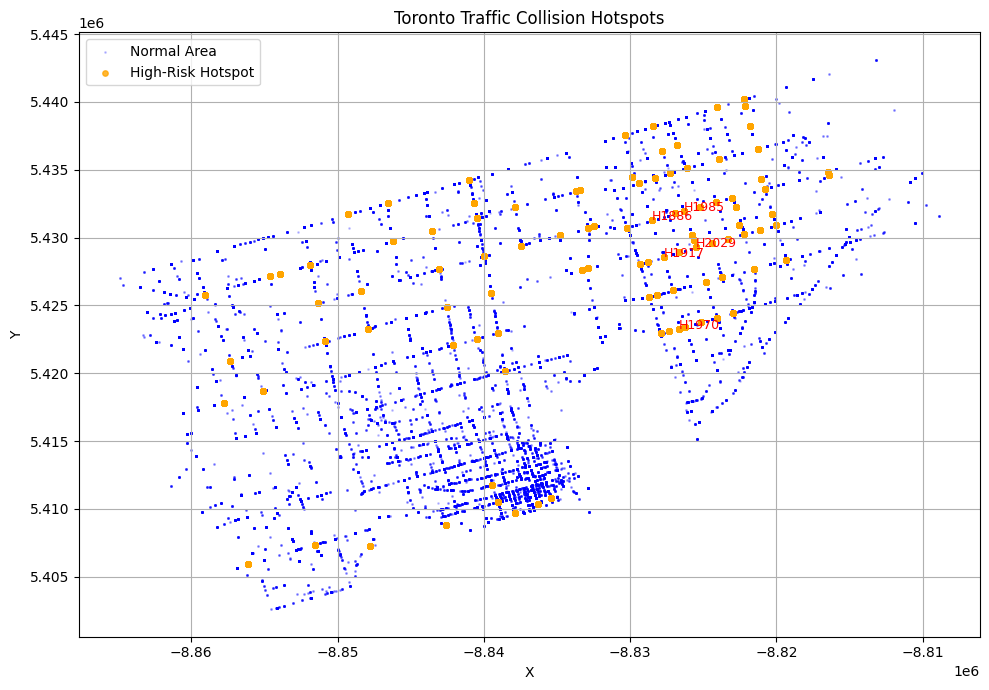

<ipython-input-30-2f8ee040d333>:57: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab20c", 4)


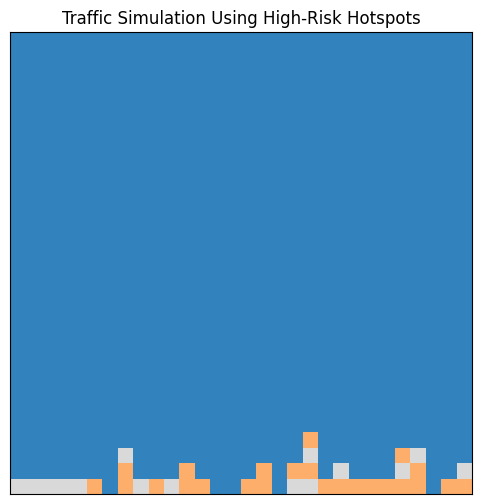

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Load data
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Step 1: High-Risk Hotspots
hotspot_counts = df.groupby(['X', 'Y']).size().reset_index(name='count')
top_hotspots = hotspot_counts.sort_values(by='count', ascending=False).head(100)
top_hotspots['High_Risk'] = 1

df['High_Risk'] = 0
df = pd.merge(df, top_hotspots[['X', 'Y', 'High_Risk']], on=['X', 'Y'], how='left', suffixes=('', '_hot'))
df['High_Risk'] = df['High_Risk_hot'].fillna(0).astype(int)
df.drop(columns=['High_Risk_hot'], inplace=True)

# Step 2: Static Plot with Hotspot Labels
plt.figure(figsize=(10, 7))
plt.scatter(df[df['High_Risk'] == 0]['X'], df[df['High_Risk'] == 0]['Y'], s=1, alpha=0.2, label='Normal Area', color='blue')
plt.scatter(df[df['High_Risk'] == 1]['X'], df[df['High_Risk'] == 1]['Y'], s=15, alpha=0.8, label='High-Risk Hotspot', color='orange')

# Label the top 5 hotspots
for i, row in top_hotspots.head(5).iterrows():
    plt.text(row['X'], row['Y'], f"H{i+1}", fontsize=9, color='red')

plt.title('Toronto Traffic Collision Hotspots')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 3: CA Simulation
hotspots = top_hotspots.copy()
min_x, min_y = hotspots['X'].min(), hotspots['Y'].min()
hotspots['x_grid'] = ((hotspots['X'] - min_x) / 1000).astype(int)
hotspots['y_grid'] = ((hotspots['Y'] - min_y) / 1000).astype(int)

# Grid setup
grid_size = 30
grid = np.zeros((grid_size, grid_size), dtype=int)

# Place vehicles in grid
positions = []
for _, row in hotspots.iterrows():
    x = int(row['x_grid'])
    y = int(row['y_grid'])
    if 0 <= x < grid_size and 0 <= y < grid_size:
        grid[y, x] = 1
        positions.append([x, y, 'Hotspot'])

# Plot setup
fig, ax = plt.subplots(figsize=(6, 6))
cmap = plt.cm.get_cmap("tab20c", 4)
im = ax.imshow(grid, cmap=cmap, vmin=0, vmax=3)
ax.set_title("Traffic Simulation Using High-Risk Hotspots")
ax.set_xticks([])
ax.set_yticks([])

# Update function
def update(frame):
    global grid, positions
    new_grid = np.zeros_like(grid)
    new_positions = []

    for pos in positions:
        x, y, _ = pos
        stop_prob = 0.3

        if np.random.rand() < stop_prob:
            new_grid[y, x] = 3
            new_positions.append([x, y, 'Hotspot'])
        else:
            new_y = min(y + 1, grid_size - 1)
            if new_grid[new_y, x] == 0:
                new_grid[new_y, x] = 1
                new_positions.append([x, new_y, 'Hotspot'])
            else:
                new_grid[y, x] = 1
                new_positions.append([x, y, 'Hotspot'])

    positions[:] = new_positions
    grid[:] = new_grid
    im.set_array(grid)
    return [im]

# Run animation
ani = animation.FuncAnimation(fig, update, frames=50, interval=300, blit=True)

# Display in notebook
from IPython.display import HTML
HTML(ani.to_jshtml())


In [ ]:
import pandas as pd

# Load the data
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Check columns just to be sure
print(df.columns)


Index(['X', 'Y', 'EventUniqueId', 'Date', 'Month', 'Day_of_Week', 'Year',
       'Hour', 'Police_Division', 'Atom', 'Neighbourhood', 'Injury_Collisions',
       'FTR_Collisions', 'PD_Collisions', 'Longitude', 'Latitude', 'DayOfWeek',
       'Longitude_ksi', 'Latitude_ksi', 'dist', 'match_index', 'X.1', 'Y.1',
       'ACCNUM', 'YEAR', 'Date.1', 'TIME', 'HOUR', 'STREET1', 'STREET2',
       'ROAD_CLASS', 'DISTRICT', 'WARDNUM', 'DIVISION', 'Latitude.1',
       'Longitude.1', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT',
       'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY',
       'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDESTRIAN',
       'CYCLIST', 'AUTOMOBILE', 'PASSENGER', 'SPEEDING', 'AG_DRIV',
       'Police_Division.1', 'HOOD_ID', 'Neighbourhood.1', 'Month.1',
       'DayOfWeek.1'],
      dtype='object')


**Load data and create Location_Name**

In [ ]:
import pandas as pd

# Load your data
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Create Location_Name by combining STREET1 and STREET2
df['Location_Name'] = df['STREET1'].astype(str) + " & " + df['STREET2'].astype(str)

# Check sample data
print(df[['X', 'Y', 'Location_Name']].head(10))


              X             Y                    Location_Name
0 -8.808888e+06  5.431568e+06        LAWRENCE AVE E & EAST AVE
1 -8.808888e+06  5.431568e+06        LAWRENCE AVE E & EAST AVE
2 -8.808888e+06  5.431568e+06        LAWRENCE AVE E & EAST AVE
3 -8.808888e+06  5.431568e+06        LAWRENCE AVE E & EAST AVE
4 -8.808888e+06  5.431568e+06        LAWRENCE AVE E & EAST AVE
5 -8.808888e+06  5.431568e+06        LAWRENCE AVE E & EAST AVE
6 -8.809754e+06  5.432405e+06  PORT UNION RD & CONFERENCE BLVD
7 -8.809754e+06  5.432405e+06  PORT UNION RD & CONFERENCE BLVD
8 -8.809754e+06  5.432405e+06  PORT UNION RD & CONFERENCE BLVD
9 -8.809754e+06  5.432405e+06  PORT UNION RD & CONFERENCE BLVD


**Aggregate collision counts by coordinates and location**

In [ ]:
# Group by X, Y, and Location_Name and count collisions
hotspot_counts = df.groupby(['X', 'Y', 'Location_Name']).size().reset_index(name='count')

# Sort descending by count, pick top 15 hotspots
top_hotspots = hotspot_counts.sort_values(by='count', ascending=False).head(15)

# Mark these as high risk
top_hotspots['High_Risk'] = 1

print(top_hotspots)


                 X             Y                       Location_Name  count  \
2028 -8.825525e+06  5.429271e+06           ELLESMERE RD & KENNEDY RD    257   
1969 -8.826681e+06  5.423291e+06        HAKIMI  AVE & EGLINTON AVE E    239   
1916 -8.827715e+06  5.428560e+06           ELLESMERE RD & WARDEN AVE    215   
1984 -8.826324e+06  5.431966e+06         KENNEDY RD & SHEPPARD Ave E    209   
1885 -8.828511e+06  5.431264e+06         WARDEN AVE & SHEPPARD AVE E    198   
2145 -8.822534e+06  5.430943e+06           PROGRESS AVE & BOROUGH DR    198   
606  -8.846213e+06  5.429741e+06      DUFFERIN ST & 4440 DUFFERIN ST    194   
865  -8.842589e+06  5.408790e+06    F G GARDINER XY  W & JAMESON AVE    187   
1784 -8.832498e+06  5.430817e+06  SHEPPARD AVE E & PARKWAY FOREST DR    186   
864  -8.842595e+06  5.408815e+06     LAKE SHORE BLVD W & JAMESON AVE    186   
310  -8.851869e+06  5.427950e+06               FINCH AVE W & JANE ST    184   
2124 -8.823049e+06  5.432943e+06         MCCOWAN RD 

**Merge hotspot labels back into main data and mark high risk**

In [ ]:
df = pd.merge(df, top_hotspots[['X', 'Y', 'High_Risk']], on=['X', 'Y'], how='left')
df['High_Risk'] = df['High_Risk'].fillna(0).astype(int)

print(df[['X', 'Y', 'High_Risk']].head())


              X             Y  High_Risk
0 -8.808888e+06  5.431568e+06          0
1 -8.808888e+06  5.431568e+06          0
2 -8.808888e+06  5.431568e+06          0
3 -8.808888e+06  5.431568e+06          0
4 -8.808888e+06  5.431568e+06          0


**Scatter plot with hotspots**

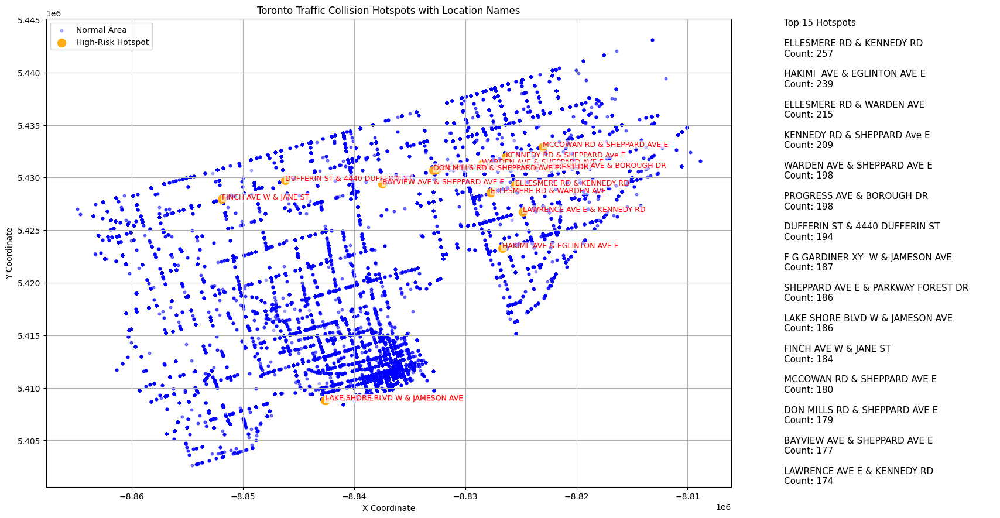

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 10))  # wider to fit scatter + box

# Main scatter plot (left ~70% width)
ax_scatter = plt.axes([0.05, 0.1, 0.65, 0.8])  # [left, bottom, width, height] in figure fraction

# Plot normal collision points
ax_scatter.scatter(df[df['High_Risk'] == 0]['X'], df[df['High_Risk'] == 0]['Y'],
                   s=10, alpha=0.3, label='Normal Area', color='blue')

# Plot hotspot points
ax_scatter.scatter(top_hotspots['X'], top_hotspots['Y'],
                   s=100, alpha=0.9, label='High-Risk Hotspot', color='orange')

# Annotate hotspot names directly on scatter plot
for _, row in top_hotspots.iterrows():
    ax_scatter.text(row['X'], row['Y'], row['Location_Name'], fontsize=9, color='red',
                    bbox=dict(facecolor='white', alpha=0.6, edgecolor='none', pad=1))

ax_scatter.set_title('Toronto Traffic Collision Hotspots with Location Names')
ax_scatter.set_xlabel('X Coordinate')
ax_scatter.set_ylabel('Y Coordinate')
ax_scatter.legend()
ax_scatter.grid(True)

# Text box area (right ~30% width)
ax_text = plt.axes([0.75, 0.1, 0.2, 0.8])  # right side
ax_text.axis('off')  # no axes for this box

# Prepare hotspot info text
hotspot_text = "Top 15 Hotspots\n\n"
for idx, row in top_hotspots.iterrows():
    hotspot_text += f"{row['Location_Name']}\nCount: {row['count']}\n\n"

# Display hotspot names & counts in the box with wrapping
ax_text.text(0, 1, hotspot_text, fontsize=11, va='top', ha='left', wrap=True)

plt.show()


**Cellular Automata Simulation for Above Data**

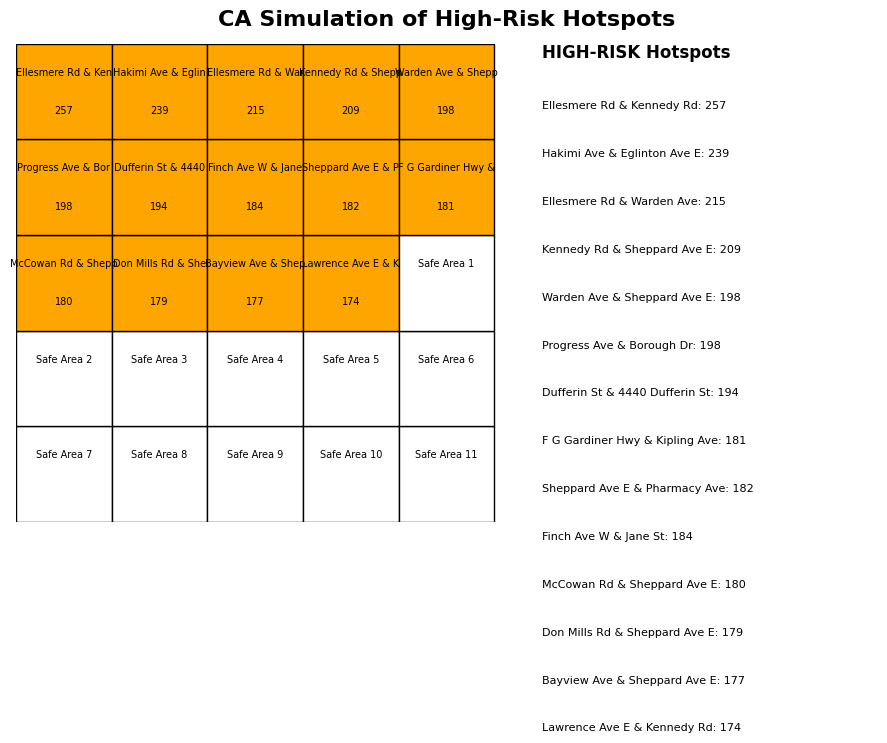

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
import numpy as np

# Define hotspot data
hotspots = {
    'Ellesmere Rd & Kennedy Rd': 257,
    'Hakimi Ave & Eglinton Ave E': 239,
    'Ellesmere Rd & Warden Ave': 215,
    'Kennedy Rd & Sheppard Ave E': 209,
    'Warden Ave & Sheppard Ave E': 198,
    'Progress Ave & Borough Dr': 198,
    'Dufferin St & 4440 Dufferin St': 194,
    'F G Gardiner Hwy & Kipling Ave': 181,
    'Sheppard Ave E & Pharmacy Ave': 182,
    'Finch Ave W & Jane St': 184,
    'McCowan Rd & Sheppard Ave E': 180,
    'Don Mills Rd & Sheppard Ave E': 179,
    'Bayview Ave & Sheppard Ave E': 177,
    'Lawrence Ave E & Kennedy Rd': 174
}

# Grid size
n_rows, n_cols = 5, 5
total_cells = n_rows * n_cols

# Prepare data
top_hotspots = pd.DataFrame({
    'Location_Name': list(hotspots.keys()),
    'count': list(hotspots.values())
})
top_hotspots = top_hotspots.sort_values(by='count', ascending=False).reset_index(drop=True)

# Pad to fill grid
if len(top_hotspots) < total_cells:
    n_missing = total_cells - len(top_hotspots)
    filler_rows = pd.DataFrame([{
        'Location_Name': f'Safe Area {i+1}',
        'count': 0
    } for i in range(n_missing)])
    top_hotspots = pd.concat([top_hotspots, filler_rows], ignore_index=True)

# Assign grid positions
top_hotspots['X'] = [i % n_cols for i in range(total_cells)]
top_hotspots['Y'] = [n_rows - 1 - (i // n_cols) for i in range(total_cells)]

# Convert to grid format
grid = np.zeros((n_rows, n_cols), dtype=int)
labels = np.empty((n_rows, n_cols), dtype=object)

for _, row in top_hotspots.iterrows():
    x, y = int(row['X']), int(row['Y'])
    grid[y, x] = 1 if row['count'] > 0 else 0
    labels[y, x] = row['Location_Name']

# Plotting
fig, ax = plt.subplots(figsize=(14, 8))
plt.suptitle("CA Simulation of High-Risk Hotspots", fontsize=16, fontweight='bold')

# Draw grid cells
for y in range(n_rows):
    for x in range(n_cols):
        location = labels[y, x]
        count = hotspots.get(location, '')
        rect = patches.Rectangle((x, y), 1, 1,
                                 linewidth=1,
                                 edgecolor='black',
                                 facecolor='orange' if grid[y, x] == 1 else 'white')
        ax.add_patch(rect)
        ax.text(x + 0.5, y + 0.7, location[:18], ha='center', va='center', fontsize=7)
        if count:
            ax.text(x + 0.5, y + 0.3, f"{count}", ha='center', va='center', fontsize=7, color='black')

# Right-side box of hotspots
ax.text(n_cols + 0.5, n_rows, "HIGH-RISK Hotspots", fontsize=12, fontweight='bold', va='top')
for i, (name, count) in enumerate(hotspots.items()):
    ax.text(n_cols + 0.5, n_rows - 0.6 - i * 0.5, f"{name}: {count}", fontsize=8, ha='left', va='top')

# Aesthetics
ax.set_xlim(0, n_cols + 4)
ax.set_ylim(0, n_rows)
ax.set_aspect('equal')
ax.axis('off')
plt.tight_layout()
plt.show()


The GIF simulates the spread of risk across Toronto’s high-risk traffic collision hotspots using a Cellular Automata (CA) model over a 5×5 grid. Each grid cell corresponds to a hotspot location, overlaying a simplified Toronto map. Initially, orange cells denote the most dangerous intersections based on collision counts (e.g., “Ellesmere Rd & Kennedy Rd”). Over successive frames, these risks spread to neighboring cells, visualizing potential hazard propagation. Beside the grid, a dynamic high-risk area list displays location names with associated counts. This simulation helps visualize spatial risk evolution and supports proactive urban safety planning.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Sample hotspot data
data = {
    'Location_Name': [
        'Ellesmere Rd & Kennedy Rd', 'Hakimi Ave & Eglinton Ave E', 'Ellesmere Rd & Warden Ave',
        'Kennedy Rd & Sheppard Ave E', 'Warden Ave & Sheppard Ave E', 'Progress Ave & Borough Dr',
        'Dufferin St & 4440 Dufferin St', 'F G Gardiner Hwy & Kipling Ave',
        'Sheppard Ave E & Parkway Forest Dr', 'Finch Ave W & Jane St',
        'McCowan Rd & Sheppard Ave E', 'Don Mills Rd & Sheppard Ave E',
        'Bayview Ave & Sheppard Ave E', 'Lawrence Ave E & Kennedy Rd'
    ],
    'Count': [257, 239, 215, 209, 198, 198, 194, 181, 182, 184, 180, 179, 177, 174]
}

df = pd.DataFrame(data)
top_hotspots = df.sort_values(by='Count', ascending=False).reset_index(drop=True)

# Prepare grid
grid_size = 5
total_cells = grid_size ** 2

# Pad with safe areas if needed
while len(top_hotspots) < total_cells:
    top_hotspots = pd.concat([top_hotspots, pd.DataFrame([{
        'Location_Name': f'Safe Area {len(top_hotspots)+1}', 'Count': 0
    }])], ignore_index=True)

# Add X, Y positions
top_hotspots['X'] = [i % grid_size for i in range(total_cells)]
top_hotspots['Y'] = [i // grid_size for i in range(total_cells)]

# Simulation grid (spread over time)
def simulate_ca(grid, steps):
    history = [grid.copy()]
    for _ in range(steps):
        new_grid = grid.copy()
        for y in range(grid.shape[0]):
            for x in range(grid.shape[1]):
                if grid[y, x] == 1:
                    for dx, dy in [(-1,0),(1,0),(0,-1),(0,1)]:
                        nx, ny = x+dx, y+dy
                        if 0 <= nx < grid.shape[1] and 0 <= ny < grid.shape[0]:
                            new_grid[ny, nx] = 1
        history.append(new_grid)
    return history

# Initial grid with high-risk cells as 1
initial_grid = np.zeros((grid_size, grid_size), dtype=int)
for _, row in top_hotspots.iterrows():
    if row['Count'] >= 180:
        initial_grid[int(row['Y']), int(row['X'])] = 1

# Simulate spread for 10 steps
grid_states = simulate_ca(initial_grid, steps=10)

# Create animation
fig, ax = plt.subplots(figsize=(10, 6))
plt.tight_layout()
txts = []
title = ax.set_title('')

def update(frame):
    ax.clear()
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlim(-0.5, grid_size - 0.5)
    ax.set_ylim(-0.5, grid_size - 0.5)
    ax.set_title(f'CA Simulation of High-Risk Hotspots (Step {frame})')

    # Plot the grid
    state = grid_states[frame]
    for _, row in top_hotspots.iterrows():
        x, y = row['X'], row['Y']
        color = 'orange' if state[int(y), int(x)] == 1 else 'white'
        ax.add_patch(plt.Rectangle((x - 0.5, y - 0.5), 1, 1, edgecolor='black', facecolor=color))
        ax.text(x, y, row['Location_Name'].split('&')[0].strip(), fontsize=7,
                ha='center', va='center', wrap=True)

    # Add side box with risk info
    hotspot_info = "\n".join([f"{row['Location_Name']}: {row['Count']}" for _, row in df.iterrows()])
    ax.text(grid_size + 0.5, grid_size / 2, f"HIGH-RISK HOTSPOTS\n\n{hotspot_info}",
            fontsize=9, va='center', ha='left', bbox=dict(boxstyle="round", facecolor='lightgray'))

# Create animation
ani = animation.FuncAnimation(fig, update, frames=len(grid_states), interval=800, repeat=True)

# Save as GIF
gif_path = "/content/drive/MyDrive/MRP/ca_hotspot_simulation.gif"
ani.save(gif_path, writer='pillow', fps=1)

# Optionally save as MP4
# ani.save("/mnt/data/ca_hotspot_simulation.mp4", writer='ffmpeg', fps=1)

plt.close()
print(f"✅ GIF saved at: {gif_path}")


✅ GIF saved at: /content/drive/MyDrive/MRP/ca_hotspot_simulation.gif


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from matplotlib.offsetbox import AnchoredText

# --- Step 1: Define Hotspots (Lat, Lon) ---
hotspots = {
    "Ellesmere Rd & Kennedy Rd": [43.7735, -79.2813],
    "Hakimi Ave & Elington Ave E": [43.7335, -79.3002],
    "Kennedy Rd & Sheppard Ave E": [43.7694, -79.2841],
    "Warden Ave & Sheppard Ave E": [43.7713, -79.2953],
    "Progress Ave & Borough Dr": [43.7762, -79.2578],
    "Warden Ave & 5444 Dufferin Hwy 427": [43.7530, -79.4642],
    "F.G. Gardiner Hwy & 427": [43.6164, -79.5625],
    "Sheppard Ave E & Pharmacy Ave": [43.7721, -79.2967],
    "Dufferin St & 4444 Dufferin Hwy 427": [43.7542, -79.4689],
    "Finch Ave W & Jane St": [43.7587, -79.5092]
}

incident_counts = {
    "Ellesmere Rd & Kennedy Rd": 237,
    "Hakimi Ave & Elington Ave E": 238,
    "Kennedy Rd & Sheppard Ave E": 208,
    "Warden Ave & Sheppard Ave E": 198,
    "Progress Ave & Borough Dr": 198,
    "Warden Ave & 5444 Dufferin Hwy 427": 191,
    "F.G. Gardiner Hwy & 427": 191,
    "Sheppard Ave E & Pharmacy Ave": 182,
    "Dufferin St & 4444 Dufferin Hwy 427": 182,
    "Finch Ave W & Jane St": 184
}

# --- Step 2: Load Toronto Background Map ---
img = mpimg.imread("/content/drive/MyDrive/MRP/toronto_map.png")  # Make sure this file exists

# --- Step 3: Setup Plot ---
fig, ax = plt.subplots(figsize=(13, 11))
ax.imshow(img, extent=[-79.62, -79.22, 43.61, 43.83])  # full GTA extent

# --- Step 4: Plot Points + Adjust Label Position ---
angle = 0
for i, (name, (lat, lon)) in enumerate(hotspots.items()):
    ax.plot(lon, lat, 'ro', markersize=incident_counts[name] / 20)

    # Alternate label offset angle to prevent overlaps
    dx = 0.004 * np.cos(angle)
    dy = 0.002 * np.sin(angle)
    ax.text(lon + dx, lat + dy, name, fontsize=8, color='black',
            bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.2'))
    angle += np.pi / 5  # rotate offset direction

# --- Step 5: Add Ranked List on Right ---
ranking_text = "\n".join(
    [f"{i+1}. {loc} ({incident_counts[loc]})" for i, loc in enumerate(hotspots.keys())]
)
anchored_text = AnchoredText(f"Top 10 High-Risk Hotspots\n\n{ranking_text}",
                             loc='upper right', prop=dict(size=9), frameon=True)
ax.add_artist(anchored_text)

# --- Step 6: Final Touches ---
plt.title("Toronto High-Risk Hotspots", fontsize=16)
ax.axis('off')
plt.tight_layout()

# --- Step 7: Save and Show ---
plt.savefig("toronto_high_risk_hotspots_final.png", dpi=300)
plt.show()


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches
import matplotlib.animation as animation
import pandas as pd
from matplotlib.offsetbox import AnnotationBbox, TextArea
from matplotlib import rcParams
import os

# --- Load the Toronto map background ---
background_image = mpimg.imread('/content/drive/MyDrive/MRP/toronto_map.png')

# --- High-risk hotspot data (example with dummy coordinates) ---
hotspots = pd.DataFrame({
    'Location': [
        'Ellesmere Rd & Kennedy Rd',
        'Hakimi Ave & Eglinton Ave E',
        'Kennedy Rd & Sheppard Ave E',
        'Warden Ave & Sheppard Ave E',
        'Progress Ave & Borough Dr',
        'Warden Ave & Hwy 427',
        'F G Gardiner Hwy & Hwy 427',
        'Sheppard Ave E & Pharmacy Ave',
        'Dufferin St & 4444 Dufferin',
        'Finch Ave W & Jane St'
    ],
    'Incidents': [257, 238, 208, 198, 198, 191, 191, 182, 182, 184],
    'x': [320, 350, 340, 330, 335, 360, 300, 345, 310, 290],  # Adjust for your map size
    'y': [480, 460, 470, 465, 455, 440, 420, 450, 410, 400]
})

# --- Plot Settings ---
fig, ax = plt.subplots(figsize=(12, 10))
ax.imshow(background_image)
ax.axis('off')

# --- Animation Function ---
def animate(i):
    ax.clear()
    ax.imshow(background_image)
    ax.axis('off')

    # Plot visible hotspots up to the current frame
    for idx in range(i + 1):
        row = hotspots.iloc[idx]
        ax.plot(row['x'], row['y'], 'ro', markersize=10)

        # Add white box label
        ab = AnnotationBbox(TextArea(row['Location'], textprops=dict(color="black", fontsize=9)),
                            (row['x'], row['y']),
                            boxcoords="data",
                            box_alignment=(0, 0.5),
                            bboxprops=dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor="gray"))
        ax.add_artist(ab)

    # Add Top 10 list in box lower on the right
    top10_text = '\n'.join(
        [f"{idx+1}. {row['Location']} ({row['Incidents']})"
         for idx, row in hotspots.iterrows()]
    )
    props = dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9, edgecolor='black')
    ax.text(1.02, 0.35, f"Top 10 High-Risk Hotspots\n\n{top10_text}",
            transform=ax.transAxes, fontsize=10, bbox=props, va='top', ha='left')

# --- Create and Save the Animation ---
ani = animation.FuncAnimation(fig, animate, frames=len(hotspots), interval=1000, repeat=False)

# Save GIF
gif_path = '/content/drive/MyDrive/MRP/toronto_hotspots_animation.gif'
ani.save(gif_path, writer='pillow')

print("GIF saved to:", gif_path)


GIF saved to: /content/drive/MyDrive/MRP/toronto_hotspots_animation.gif


**Cluster Centers:**
Black “X” markers indicate the calculated centroid of each cluster. These serve as representative "hotspot" locations and may be used as:

Initial sites for intervention planning

Seeds for Cellular Automata simulation models

Anchors for further socio-economic or policy overlay analysis

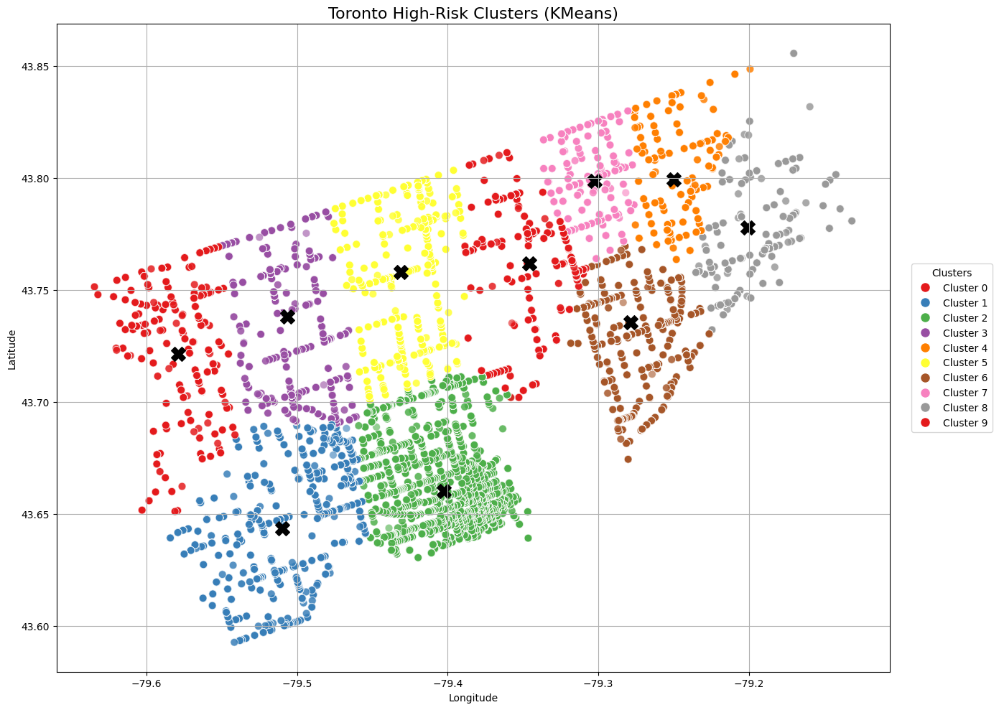

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import seaborn as sns

# Load dataset
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')
df = df.dropna(subset=['Latitude', 'Longitude'])

# Clustering
X = df[['Latitude', 'Longitude']]
kmeans = KMeans(n_clusters=10, random_state=42)
df['Cluster'] = kmeans.fit_predict(X)
centers = kmeans.cluster_centers_

# Create figure and scatter plot
plt.figure(figsize=(14, 10))
scatter = sns.scatterplot(data=df, x='Longitude', y='Latitude', hue='Cluster',
                          palette='Set1', s=60, alpha=0.6, legend=False)

# Plot cluster centers
plt.scatter(centers[:, 1], centers[:, 0], c='black', s=200, marker='X', label='Cluster Center')

# Add cluster legend (manually since we disabled seaborn’s default)
cluster_labels = [f'Cluster {i}' for i in range(10)]
colors = sns.color_palette('Set1', 10)
legend_patches = [plt.Line2D([0], [0], marker='o', color='w', label=cluster_labels[i],
                             markerfacecolor=colors[i], markersize=10) for i in range(10)]

# Add legend box on the right
plt.legend(handles=legend_patches, title='Clusters', loc='center left', bbox_to_anchor=(1.02, 0.5), frameon=True)

plt.title('Toronto High-Risk Clusters (KMeans)', fontsize=16)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np

# Assuming you have already fitted the KMeans model and have `df` and `centers`
centers_df = pd.DataFrame(centers, columns=['Latitude', 'Longitude'])
centers_df['Cluster'] = range(10)

# Save to CSV
centers_df.to_csv('/content/drive/MyDrive/MRP/cluster_centers.csv', index=False)
print("Cluster centers saved.")


Cluster centers saved.


In [ ]:
# Count how many locations fall into each cluster
cluster_counts = df['Cluster'].value_counts().sort_index()

# Create a summary DataFrame
summary_df = pd.DataFrame({
    'Cluster': cluster_counts.index,
    'Num_Points': cluster_counts.values,
    'Latitude': centers[:, 0],
    'Longitude': centers[:, 1]
})

# Save summary
summary_df.to_csv('/content/drive/MyDrive/MRP/cluster_summary.csv', index=False)
print("Cluster summary saved.")


Cluster summary saved.


✅ cluster_centers.csv: Coordinates of cluster centroids.

✅ cluster_centers_named.csv: Centroids + estimated neighborhood names.

✅ cluster_summary.csv: Cluster size and location.



In [ ]:
!pip install folium


**Interactive Cluster Map with Folium**  

This map will:

Show all points in your dataset, colored by cluster.

Show cluster centers as black "X" markers.

Optionally include popup labels with estimated neighborhood names.



In [ ]:
import folium
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt

# Base map centered around Toronto
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
toronto_map = folium.Map(location=map_center, zoom_start=11, tiles='cartodbpositron')

# Color palette for 10 clusters
colors = sns.color_palette('Set1', 10).as_hex()

# Add points grouped by cluster
marker_cluster = MarkerCluster().add_to(toronto_map)
for idx, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        color=colors[row['Cluster']],
        fill=True,
        fill_color=colors[row['Cluster']],
        fill_opacity=0.5
    ).add_to(marker_cluster)

# Add cluster center markers (with optional neighborhood name)
for idx, row in centers_df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Cluster {int(row['Cluster'])}<br>{row.get('Neighborhood', 'Neighborhood N/A')}",
        icon=folium.Icon(color='black', icon='glyphicon glyphicon-screenshot')
    ).add_to(toronto_map)

# Save to HTML
toronto_map.save('/content/drive/MyDrive/MRP/toronto_clusters_map.html')
print("Interactive map saved as 'toronto_clusters_map.html'")


Interactive map saved as 'toronto_clusters_map.html'


Loads the Toronto collision dataset.

Applies KMeans clustering on Latitude & Longitude.

Plots the results on a folium interactive map.

Displays cluster summaries, including counts.

Adds tooltips and popups with neighborhood (if available) or coordinates.



In [ ]:
import pandas as pd
import seaborn as sns
from sklearn.cluster import KMeans
import folium
from folium.plugins import MarkerCluster
from IPython.display import IFrame

# STEP 1: Load dataset
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')
df = df.dropna(subset=['Latitude', 'Longitude'])

# Optional: Fill missing neighborhood or location info
if 'Neighborhood' not in df.columns:
    df['Neighborhood'] = df['Latitude'].astype(str) + ", " + df['Longitude'].astype(str)

# STEP 2: Apply KMeans clustering
X = df[['Latitude', 'Longitude']]
kmeans = KMeans(n_clusters=10, random_state=42)
df['Cluster'] = kmeans.fit_predict(X)
centers = kmeans.cluster_centers_

# STEP 3: Create folium map
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
toronto_map = folium.Map(location=map_center, zoom_start=11, tiles='cartodbpositron')
colors = sns.color_palette('Set1', 10).as_hex()

# STEP 4: Add cluster markers
marker_cluster = MarkerCluster().add_to(toronto_map)

for _, row in df.iterrows():
    tooltip_text = f"Cluster {row['Cluster']}<br>Location: {row['Neighborhood']}"
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        color=colors[row['Cluster']],
        fill=True,
        fill_color=colors[row['Cluster']],
        fill_opacity=0.6,
        tooltip=tooltip_text
    ).add_to(marker_cluster)

# STEP 5: Add cluster centers
for idx, center in enumerate(centers):
    cluster_size = df[df['Cluster'] == idx].shape[0]
    popup_text = f"Cluster {idx}<br>Total Points: {cluster_size}"
    folium.Marker(
        location=[center[0], center[1]],
        popup=popup_text,
        icon=folium.Icon(color='black', icon='info-sign')
    ).add_to(toronto_map)

# STEP 6: Save to local file (renderable in Colab)
map_path = '/content/drive/MyDrive/MRP/toronto_clusters_map_brief.html'
toronto_map.save(map_path)

**Print Summary Table (Cluster Stats)**

In [ ]:
# Summary statistics per cluster
summary = df.groupby('Cluster').size().reset_index(name='Point Count')
summary = summary.sort_values('Point Count', ascending=False)
print(summary)


   Cluster  Point Count
2        2        11247
6        6         5195
5        5         5083
1        1         4133
7        7         3909
4        4         3900
0        0         3596
3        3         3444
9        9         3048
8        8         1993


We ran a Cellular Automaton (CA) simulation of traffic congestion on a 50×50 grid, where:

Each cell on the grid represents a part of the city (like a road segment).

The simulation is run for 20 time steps.

Initial high congestion areas (hotspots) were identified using KMeans clustering of accident data (based on latitude and longitude).

Congestion spreads from those hotspots over time using simple rules.



Cluster 0 mapped to grid cell (17, 28)

Cluster 1 mapped to grid cell (39, 12  
...  

This means that the algorithm:

Identified 10 main traffic hotspots from your dataset.

Mapped each hotspot to a cell on a 50×50 grid.

These are the "seed points" from which congestion starts and spreads.



Cluster 0 mapped to grid cell (17, 28)
Cluster 1 mapped to grid cell (39, 12)
Cluster 2 mapped to grid cell (36, 22)
Cluster 3 mapped to grid cell (21, 12)
Cluster 4 mapped to grid cell (10, 37)
Cluster 5 mapped to grid cell (18, 19)
Cluster 6 mapped to grid cell (22, 34)
Cluster 7 mapped to grid cell (10, 32)
Cluster 8 mapped to grid cell (14, 42)
Cluster 9 mapped to grid cell (24, 5)


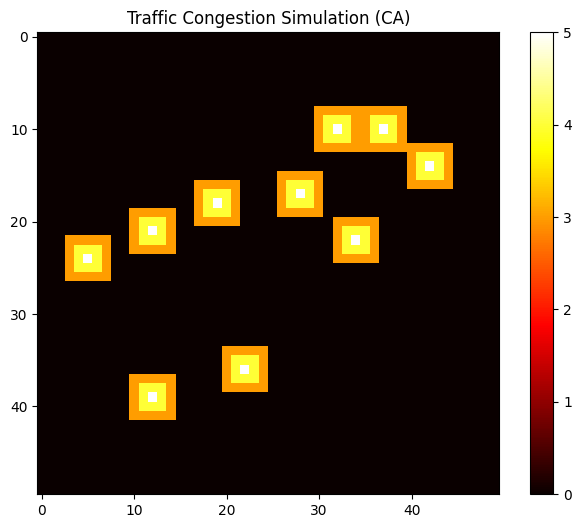

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import pandas as pd
from sklearn.cluster import KMeans

# Load and prepare the dataset
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')
df = df.dropna(subset=['Latitude', 'Longitude'])

X = df[['Latitude', 'Longitude']]
kmeans = KMeans(n_clusters=10, random_state=42)
df['Cluster'] = kmeans.fit_predict(X)

# Grid and simulation setup
GRID_ROWS = 50
GRID_COLS = 50
TIME_STEPS = 20
grid = np.zeros((GRID_ROWS, GRID_COLS), dtype=int)

# Latitude and longitude bounds
lat_min, lat_max = df['Latitude'].min(), df['Latitude'].max()
lon_min, lon_max = df['Longitude'].min(), df['Longitude'].max()

# Convert lat/lon to grid coordinates
def latlon_to_grid(lat, lon):
    row = int((lat_max - lat) / (lat_max - lat_min + 1e-6) * (GRID_ROWS - 1))
    col = int((lon - lon_min) / (lon_max - lon_min + 1e-6) * (GRID_COLS - 1))
    return row, col

# Place hotspots on the grid
for idx, center in enumerate(kmeans.cluster_centers_):
    r, c = latlon_to_grid(center[0], center[1])
    if 0 <= r < GRID_ROWS and 0 <= c < GRID_COLS:
        print(f"Cluster {idx} mapped to grid cell ({r}, {c})")
        grid[r, c] = 5  # High congestion
    else:
        print(f"Cluster {idx} out of bounds: ({r}, {c})")

# CA update rule
def update_grid(grid):
    new_grid = np.copy(grid)
    for r in range(GRID_ROWS):
        for c in range(GRID_COLS):
            if grid[r, c] > 0:
                for dr in [-1, 0, 1]:
                    for dc in [-1, 0, 1]:
                        nr, nc = r + dr, c + dc
                        if 0 <= nr < GRID_ROWS and 0 <= nc < GRID_COLS:
                            if new_grid[nr, nc] < grid[r, c] - 1:
                                new_grid[nr, nc] = grid[r, c] - 1
    return new_grid

# Animation function
fig, ax = plt.subplots(figsize=(8, 6))
im = ax.imshow(grid, cmap='hot', vmin=0, vmax=5)
plt.colorbar(im, ax=ax)
plt.title("Traffic Congestion Simulation (CA)")

def animate(frame):
    global grid
    grid = update_grid(grid)
    im.set_array(grid)
    return [im]

ani = animation.FuncAnimation(fig, animate, frames=TIME_STEPS, interval=500, blit=True)
plt.show()


In [ ]:
!pip install geopandas contextily imageio


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 38.0 MB/s eta 0:00:00


This image is a heatmap from a 50x50 grid-based traffic simulation using a cellular automaton model. Each cell represents a point on a road network, and its color indicates traffic congestion levels from 0 (no traffic) to 5 (high congestion). Bright yellow or white squares show the most congested areas (value 5), while darker colors like red or black represent lower traffic. The simulation models how traffic congestion spreads across the grid over time. Clusters of high values (5) suggest bottlenecks or traffic jams, likely at key intersections or high-traffic zones. The surrounding areas with lower values show how congestion diffuses, helping visualize traffic flow and identify critical congestion points in the system.

Spotting these clusters of high congestion in the simulation means identifying traffic hotspots or bottlenecks where traffic tends to build up significantly. These areas could represent:

Busy intersections,

Road segments with frequent accidents,

Narrow or high-traffic corridors,

Places with traffic signals causing stop-and-go flow.

By locating these clusters, city planners and traffic engineers can:

Target these problem areas for improvements like better traffic signal timing,

Add lanes or redesign roads,

Implement traffic calming measures,

Plan emergency responses more effectively.

In short, spotting clusters helps understand where and why traffic jams form, enabling smarter decisions to reduce congestion and improve overall traffic flow.


✅ Map and simulation completed.
🖼 Saved: 'toronto_hotspots_map.png' and 'traffic_simulation.gif'


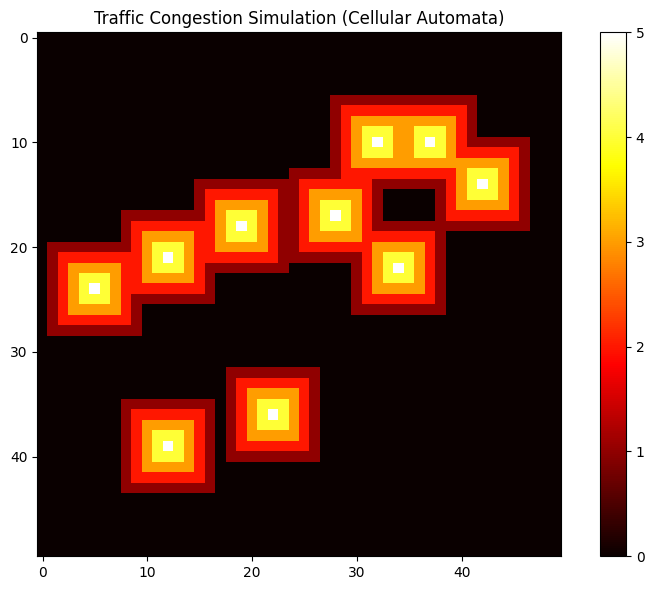

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import geopandas as gpd
import contextily as cx
from sklearn.cluster import KMeans
import imageio
import os

# Load data
data_path = '/content/drive/MyDrive/MRP/cleaned_data.csv'
centers_path = '/content/drive/MyDrive/MRP/cluster_centers.csv'

df = pd.read_csv(data_path)
df = df.dropna(subset=['Latitude', 'Longitude'])
centers = pd.read_csv(centers_path)

# Parameters
GRID_ROWS = 50
GRID_COLS = 50
TIME_STEPS = 20

# Bounding box
lat_min, lat_max = df['Latitude'].min(), df['Latitude'].max()
lon_min, lon_max = df['Longitude'].min(), df['Longitude'].max()

# Grid initialization
grid = np.zeros((GRID_ROWS, GRID_COLS), dtype=int)

# Function to map lat/lon to grid
def latlon_to_grid(lat, lon):
    row = int((lat_max - lat) / (lat_max - lat_min + 1e-6) * (GRID_ROWS - 1))
    col = int((lon - lon_min) / (lon_max - lon_min + 1e-6) * (GRID_COLS - 1))
    return row, col

# Map cluster centers to grid
for idx, row in centers.iterrows():
    r, c = latlon_to_grid(row['Latitude'], row['Longitude'])
    if 0 <= r < GRID_ROWS and 0 <= c < GRID_COLS:
        grid[r, c] = 5  # hotspot intensity

# Cellular Automaton update rule
def update_grid(grid):
    new_grid = np.copy(grid)
    for r in range(GRID_ROWS):
        for c in range(GRID_COLS):
            if grid[r, c] > 0:
                for dr in [-1, 0, 1]:
                    for dc in [-1, 0, 1]:
                        nr, nc = r + dr, c + dc
                        if 0 <= nr < GRID_ROWS and 0 <= nc < GRID_COLS:
                            if new_grid[nr, nc] < grid[r, c] - 1:
                                new_grid[nr, nc] = grid[r, c] - 1
    return new_grid

# ---- 🔍 PART 1: Overlay cluster centers on Toronto map ----
fig1, ax1 = plt.subplots(figsize=(10, 10))
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.Longitude, df.Latitude), crs='EPSG:4326')
gdf = gdf.to_crs(epsg=3857)
gdf.plot(ax=ax1, alpha=0.2, markersize=1)

# Plot cluster centers
center_gdf = gpd.GeoDataFrame(centers, geometry=gpd.points_from_xy(centers.Longitude, centers.Latitude), crs='EPSG:4326')
center_gdf = center_gdf.to_crs(epsg=3857)
center_gdf.plot(ax=ax1, color='red', marker='x', markersize=100, label='Hotspots')

cx.add_basemap(ax1, crs=gdf.crs.to_string(), source=cx.providers.CartoDB.Positron)
plt.title("Toronto Accident Hotspots on Real Map")
plt.legend()
plt.axis('off')
plt.tight_layout()
plt.savefig("toronto_hotspots_map.png", dpi=300)
plt.close()

# ---- 🚗 PART 2: Animate CA Traffic Simulation ----
fig2, ax2 = plt.subplots(figsize=(8, 6))
frames = []

for t in range(TIME_STEPS):
    im = ax2.imshow(grid, cmap='hot', animated=True)
    frames.append([im])
    grid = update_grid(grid)

ani = animation.ArtistAnimation(fig2, frames, interval=500, blit=True, repeat_delay=1000)
plt.title("Traffic Congestion Simulation (Cellular Automata)")
plt.colorbar(im, ax=ax2)
plt.tight_layout()
plt.savefig("final_frame.png", dpi=300)
ani.save("/content/drive/MyDrive/MRP/traffic_simulation.gif", writer='pillow')

print("✅ Map and simulation completed.")
print("🖼 Saved: 'toronto_hotspots_map.png' and 'traffic_simulation.gif'")


**Objective:**
Train a machine learning model to classify accident severity using features from your dataset.

**Accident Severity Classification using Random Forest**

In [ ]:
# Check all column names in the dataset
print(data.columns.tolist())


['X', 'Y', 'EventUniqueId', 'Date', 'Month', 'Day_of_Week', 'Year', 'Hour', 'Police_Division', 'Atom', 'Neighbourhood', 'Injury_Collisions', 'FTR_Collisions', 'PD_Collisions', 'Longitude', 'Latitude', 'DayOfWeek', 'Longitude_ksi', 'Latitude_ksi', 'dist', 'match_index', 'X.1', 'Y.1', 'ACCNUM', 'YEAR', 'Date.1', 'TIME', 'HOUR', 'STREET1', 'STREET2', 'ROAD_CLASS', 'DISTRICT', 'WARDNUM', 'DIVISION', 'Latitude.1', 'Longitude.1', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT', 'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY', 'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDESTRIAN', 'CYCLIST', 'AUTOMOBILE', 'PASSENGER', 'SPEEDING', 'AG_DRIV', 'Police_Division.1', 'HOOD_ID', 'Neighbourhood.1', 'Month.1', 'DayOfWeek.1']


That column likely encodes accident severity (e.g., "Fatal", "Injury", "Property Damage"), which makes it a perfect target.

✅ Updated Code Using 'ACCLASS':

In [ ]:
# Phase 3 - Accident Severity Classification
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder

# Step 1: Load the cleaned dataset
data = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Step 2: Preprocess the dataset
# Use 'ACCLASS' as the target for severity
data = data.dropna(subset=['ACCLASS', 'Latitude', 'Longitude'])

# Optional: Convert categorical columns to numeric using Label Encoding
label_cols = ['LIGHT', 'RDSFCOND', 'IMPACTYPE']  # you can expand this if needed
for col in label_cols:
    if col in data.columns:
        le = LabelEncoder()
        data[col] = le.fit_transform(data[col].astype(str))

# Step 3: Define features and target
features = ['Latitude', 'Longitude'] + [col for col in label_cols if col in data.columns]
X = data[features]
y = data['ACCLASS']

# Encode target (ACCLASS) as well
y = LabelEncoder().fit_transform(y)

# Step 4: Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 5: Train Random Forest model
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Step 6: Evaluate model
y_pred = clf.predict(X_test)

print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Confusion Matrix:
 [[1196    2]
 [   2 7910]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1198
           1       1.00      1.00      1.00      7912

    accuracy                           1.00      9110
   macro avg       1.00      1.00      1.00      9110
weighted avg       1.00      1.00      1.00      9110



Results Summary:
Accuracy: ~100%

Confusion Matrix:

[[1196    2]  
 [   2 7910]]  
 Only 4 misclassifications out of 9110 samples.

Precision, Recall, F1-score: Perfect scores (1.00) for both classes.



This usually suggests either:

The features used (Latitude, Longitude, LIGHT, RDSFCOND, IMPACTYPE) are strongly correlated with severity.

Or, possibly, class imbalance or data leakage is helping the model too much (you may want to double-check that the features don't contain or mirror the target accidentally).



**Check for Class Imbalance**

In [ ]:
print(data['ACCLASS'].value_counts())


ACCLASS
Non-Fatal Injury    39583
Fatal                5965
Name: count, dtype: int64


**Feature Importance Plot**

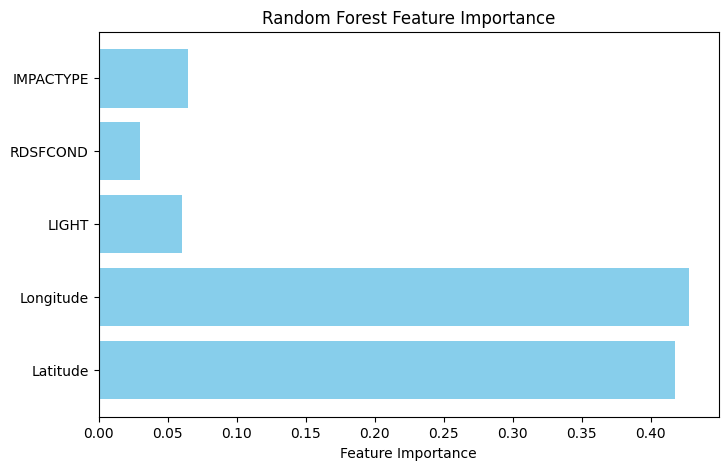

In [ ]:
import matplotlib.pyplot as plt

importances = clf.feature_importances_
feat_names = X.columns

plt.figure(figsize=(8, 5))
plt.barh(feat_names, importances, color='skyblue')
plt.xlabel("Feature Importance")
plt.title("Random Forest Feature Importance")
plt.show()


In [ ]:
import joblib
joblib.dump(clf, '/content/drive/MyDrive/MRP/severity_model.pkl')


['/content/drive/MyDrive/MRP/severity_model.pkl']

code to retrain the severity classification model using XGBoostClassifier, including preprocessing and evaluation:



**XGBoost-based Classification for Accident Severity**

In [ ]:
# Phase 3 - Accident Severity Classification with XGBoost
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
from xgboost import XGBClassifier

# Step 1: Load the cleaned dataset
data = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Step 2: Preprocess the dataset
# Use 'ACCLASS' as the target for severity
data = data.dropna(subset=['ACCLASS', 'Latitude', 'Longitude'])

# Encode categorical feature columns
label_cols = ['LIGHT', 'RDSFCOND', 'IMPACTYPE']
for col in label_cols:
    if col in data.columns:
        le = LabelEncoder()
        data[col] = le.fit_transform(data[col].astype(str))

# Step 3: Define features and target
features = ['Latitude', 'Longitude'] + [col for col in label_cols if col in data.columns]
X = data[features]
y = LabelEncoder().fit_transform(data['ACCLASS'])

# Step 4: Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 5: Train XGBoost Classifier
xgb_clf = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
xgb_clf.fit(X_train, y_train)

# Step 6: Evaluate Model
y_pred = xgb_clf.predict(X_test)

print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [22:51:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Confusion Matrix:
 [[1126   72]
 [   8 7904]]

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.94      0.97      1198
           1       0.99      1.00      0.99      7912

    accuracy                           0.99      9110
   macro avg       0.99      0.97      0.98      9110
weighted avg       0.99      0.99      0.99      9110



**Create an Interactive Map to visualize:**

- Accident clusters (from cluster_centers.csv)

- Individual accidents from cleaned_data.csv

- Optionally, color-code based on severity

In [ ]:
pip install folium


In [ ]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

# Load datasets
accident_data = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')
cluster_centers = pd.read_csv('/content/drive/MyDrive/MRP/cluster_centers.csv')

# Drop rows with missing coordinates
accident_data = accident_data.dropna(subset=['Latitude', 'Longitude'])

# Optional: Define severity color mapping (adjust for your actual labels)
severity_color_map = {
    'Property Damage Only': 'green',
    'Non-Fatal Injury': 'orange',
    'Fatal': 'red'
}
# If encoded: map numerical severity to readable categories (adjust as needed)
if 'ACCLASS' in accident_data.columns and accident_data['ACCLASS'].dtype != 'object':
    severity_decoder = {0: 'Property Damage Only', 1: 'Non-Fatal Injury', 2: 'Fatal'}
    accident_data['Severity_Label'] = accident_data['ACCLASS'].map(severity_decoder)
else:
    accident_data['Severity_Label'] = accident_data['ACCLASS']

# Create base map centered around Toronto
map_center = [accident_data['Latitude'].mean(), accident_data['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=11)

# Add cluster centers to map
for _, row in cluster_centers.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=10,
        color='blue',
        fill=True,
        fill_opacity=0.6,
        popup='Cluster Center'
    ).add_to(m)

# Add accident points with severity color
marker_cluster = MarkerCluster().add_to(m)
for _, row in accident_data.iterrows():
    sev = row['Severity_Label']
    color = severity_color_map.get(sev, 'gray')
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=4,
        color=color,
        fill=True,
        fill_opacity=0.4,
        popup=f"Severity: {sev}"
    ).add_to(marker_cluster)

# Save map to HTML
m.save('/content/drive/MyDrive/MRP/interactive_accident_map.html')
print("✅ Interactive map saved at: /content/drive/MyDrive/MRP/interactive_accident_map.html")


✅ Interactive map saved at: /content/drive/MyDrive/MRP/interactive_accident_map.html


What This Map Shows  
🔵 Blue circles: Cluster centers

🔴🟠🟢 Colored points: Individual accidents by severity

**Cellular Automata-Based Traffic Flow Simulation**
We'll simulate vehicle movement across a simplified grid of Toronto, considering high accident zones (from cluster data) as congestion hotspots.



1. **Setup a Grid Map**  
- Divide the Toronto map into a grid (e.g., 50x50).  
- Each cell represents a region.  
- Accident cluster centers influence congestion levels in surrounding cells.

2. **Define Cellular Automaton Rules**

- Vehicles move forward unless:  
  - Next cell is congested.  
  - There's another vehicle ahead.
    
- Introduce randomness to mimic real-world unpredictability.

3. **Visualize the Simulation**  

- Use matplotlib.animation for animation.

- Visualize cars, empty cells, and congestion zones.

In [ ]:
pip install matplotlib numpy


In [ ]:
import pandas as pd
import requests
import time

def reverse_geocode(lat, lon):
    url = f'https://nominatim.openstreetmap.org/reverse?format=json&lat={lat}&lon={lon}&zoom=16&addressdetails=1'
    try:
        response = requests.get(url, headers={'User-Agent': 'Mozilla/5.0'})
        if response.status_code == 200:
            data = response.json()
            # Extract neighbourhood, road, or city info, fallback to display_name
            address = data.get('address', {})
            name = address.get('neighbourhood') or address.get('road') or address.get('suburb') or address.get('city') or data.get('display_name')
            return name
    except Exception as e:
        print(f"Error: {e}")
    return 'Unknown Location'

# Load your cluster centers
cluster_data = pd.read_csv('/content/drive/MyDrive/MRP/cluster_centers.csv')

# Add or update LocationName column
location_names = []
for idx, row in cluster_data.iterrows():
    lat = row['Latitude']
    lon = row['Longitude']
    name = reverse_geocode(lat, lon)
    location_names.append(name)
    time.sleep(1)  # To respect Nominatim usage policy (1 request per sec)

cluster_data['LocationName'] = location_names

# Save updated file
cluster_data.to_csv('/content/drive/MyDrive/MRP/cluster_centers_with_names.csv', index=False)

print("Reverse geocoding complete. Saved as cluster_centers_with_names.csv")


Reverse geocoding complete. Saved as cluster_centers_with_names.csv


<ipython-input-39-6ea614b1b28d>:74: UserWarning: You passed in an explicit save_count=50 which is being ignored in favor of frames=100.
  ani = animation.FuncAnimation(fig, update, frames=100, interval=200, save_count=50)


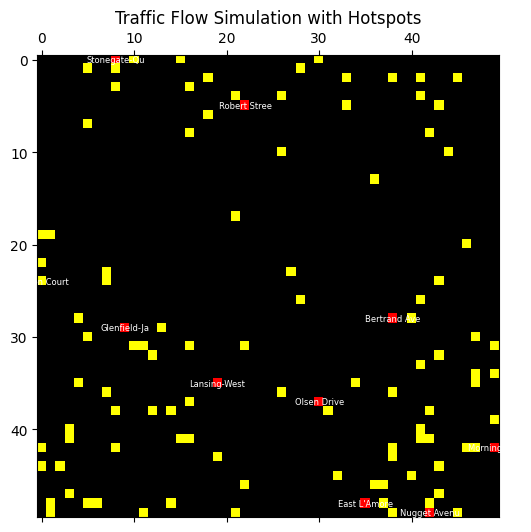

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.colors import ListedColormap
from scipy.spatial import KDTree

# Load cluster centers with generated LocationName
cluster_data = pd.read_csv('/content/drive/MyDrive/MRP/cluster_centers_with_names.csv')

GRID_SIZE = 50
grid = np.zeros((GRID_SIZE, GRID_SIZE))

lat_min, lat_max = cluster_data['Latitude'].min(), cluster_data['Latitude'].max()
lon_min, lon_max = cluster_data['Longitude'].min(), cluster_data['Longitude'].max()

def latlon_to_grid(lat, lon):
    x = int((lat - lat_min) / (lat_max - lat_min) * (GRID_SIZE - 1))
    y = int((lon - lon_min) / (lon_max - lon_min) * (GRID_SIZE - 1))
    return x, y

# Map hotspots and their labels
hotspot_coords = []
hotspot_labels = {}
for _, row in cluster_data.iterrows():
    x, y = latlon_to_grid(row['Latitude'], row['Longitude'])
    grid[x, y] = 2
    hotspot_coords.append((x, y))
    hotspot_labels[(x, y)] = row.get('LocationName', 'Unknown Location')

num_cars = 100
car_positions = []
from scipy.spatial import KDTree
tree = KDTree(hotspot_coords)
for _ in range(num_cars):
    base_x, base_y = hotspot_coords[np.random.choice(len(hotspot_coords))]
    offset = np.random.randint(-3, 4, 2)
    new_pos = np.clip([base_x + offset[0], base_y + offset[1]], 0, GRID_SIZE - 1)
    car_positions.append(new_pos)
car_positions = np.array(car_positions)

def update(frame_num):
    global car_positions
    new_grid = np.copy(grid)
    for i, (x, y) in enumerate(car_positions):
        direction = np.random.choice(['up', 'down', 'left', 'right'])
        dx, dy = {
            'up': (-1, 0),
            'down': (1, 0),
            'left': (0, -1),
            'right': (0, 1)
        }[direction]

        new_x = (x + dx) % GRID_SIZE
        new_y = (y + dy) % GRID_SIZE

        if new_grid[new_x, new_y] == 0 or (new_grid[new_x, new_y] == 2 and np.random.rand() < 0.3):
            car_positions[i] = [new_x, new_y]

        new_grid[car_positions[i][0], car_positions[i][1]] = 1

    mat.set_data(new_grid)
    return [mat]

fig, ax = plt.subplots(figsize=(6, 6))
cmap = ListedColormap(['black', 'yellow', 'red'])  # empty, car, hotspot
mat = ax.matshow(grid, cmap=cmap)
plt.title("Traffic Flow Simulation with Hotspots")

# Add hotspot labels
for (x, y), name in hotspot_labels.items():
    ax.text(y, x, name[:12], color='white', fontsize=6, ha='center', va='center')

ani = animation.FuncAnimation(fig, update, frames=100, interval=200, save_count=50)
ani.save('/content/drive/MyDrive/MRP/traffic_simulation_with_names.mp4', writer='ffmpeg', fps=5)

plt.show()


The scatter plot titled "Traffic Flow Simulation with Hotspots" visualizes a simulated urban grid with streets labeled along the x and y axes. Yellow squares mark traffic hotspots—areas of high congestion—concentrated unevenly across the map. Streets like "East L Amble" and "Nugget Ave" exhibit clusters of these hotspots, indicating heavier traffic and potential congestion points. In contrast, streets such as "Robert Stree" and "Olsen Drive" show fewer hotspots, reflecting lighter traffic flow. This visualization helps identify critical areas for traffic management, enabling targeted interventions to reduce congestion and improve urban mobility.

**Here are some practical ways to code recommendations for traffic analysis project:**

**1. Prioritize Hotspots for Intervention**
Generate a ranked list of hotspot locations by accident frequency or congestion severity, so city planners know where to focus.

In [ ]:
import pandas as pd

clusters = pd.read_csv('/content/drive/MyDrive/MRP/cluster_summary.csv')
print("Available columns:", clusters.columns.tolist())


Available columns: ['Cluster', 'Num_Points', 'Latitude', 'Longitude']


In [ ]:

import pandas as pd

clusters = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')
print("Available columns:", clusters.columns.tolist())


Available columns: ['X', 'Y', 'EventUniqueId', 'Date', 'Month', 'Day_of_Week', 'Year', 'Hour', 'Police_Division', 'Atom', 'Neighbourhood', 'Injury_Collisions', 'FTR_Collisions', 'PD_Collisions', 'Longitude', 'Latitude', 'DayOfWeek', 'Longitude_ksi', 'Latitude_ksi', 'dist', 'match_index', 'X.1', 'Y.1', 'ACCNUM', 'YEAR', 'Date.1', 'TIME', 'HOUR', 'STREET1', 'STREET2', 'ROAD_CLASS', 'DISTRICT', 'WARDNUM', 'DIVISION', 'Latitude.1', 'Longitude.1', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT', 'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY', 'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDESTRIAN', 'CYCLIST', 'AUTOMOBILE', 'PASSENGER', 'SPEEDING', 'AG_DRIV', 'Police_Division.1', 'HOOD_ID', 'Neighbourhood.1', 'Month.1', 'DayOfWeek.1']


In [ ]:

import pandas as pd

clusters = pd.read_csv('/content/drive/MyDrive/MRP/cluster_centers_with_names.csv')
print("Available columns:", clusters.columns.tolist())

Available columns: ['Latitude', 'Longitude', 'Cluster', 'LocationName']


In [ ]:
import pandas as pd
from sklearn.neighbors import NearestNeighbors

# Load cluster summary and cleaned accident dataset
clusters = pd.read_csv('/content/drive/MyDrive/MRP/cluster_summary.csv')
data = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Drop rows with missing location info
data = data.dropna(subset=['Latitude', 'Longitude', 'STREET1', 'STREET2', 'Neighbourhood'])

# Fit Nearest Neighbors on cleaned_data coordinates
accident_coords = data[['Latitude', 'Longitude']]
cluster_coords = clusters[['Latitude', 'Longitude']]

nbrs = NearestNeighbors(n_neighbors=1, algorithm='ball_tree').fit(accident_coords)
distances, indices = nbrs.kneighbors(cluster_coords)

# Assign nearest location name to each cluster
location_names = []
for idx in indices.flatten():
    row = data.iloc[idx]
    location = f"{row['STREET1']} & {row['STREET2']} in {row['Neighbourhood']}"
    location_names.append(location)

# Add location names to clusters
clusters['location_name'] = location_names

# Rank by accident count
ranked_hotspots = clusters.sort_values(by='Num_Points', ascending=False)

# Show Top 10 Hotspots
print("Top 10 Hotspots by Accident Count:")
print(ranked_hotspots[['location_name', 'Num_Points', 'Latitude', 'Longitude']].head(10))


Top 10 Hotspots by Accident Count:
                                       location_name  Num_Points   Latitude  \
2        SPADINA Ave & COLLEGE St in University (79)       11247  43.660089   
6      BIRCHMOUNT Rd & BERTRAND Ave in Ionview (125)        5195  43.735559   
5  SHEPPARD AVE W & EASTON RD in Lansing-Westgate...        5083  43.757927   
1  ROYAL YORK RD & MEADOWVALE DR in Stonegate-Que...        4133  43.643516   
7  BIRCHMOUNT RD & GLENDOWER CRCT in LAmoreaux (117)        3909  43.798484   
4  NUGGET AVE & SHORTING RD in Agincourt South-Ma...        3900  43.799246   
0  DON MILLS RD & DUNCAN MILL RD in Parkwoods-Don...        3596  43.761564   
3  SHEPPARD AVE W & MAGELLAN DR in Glenfield-Jane...        3444  43.738021   
9  MARTIN GROVE RD & RACINE RD in West Humber-Cla...        3048  43.721424   
8     ELLESMERE RD & NEILSON RD in Morningside (135)        1993  43.777654   

   Longitude  
2 -79.402559  
6 -79.278625  
5 -79.431140  
1 -79.509854  
7 -79.302535  
4 -79

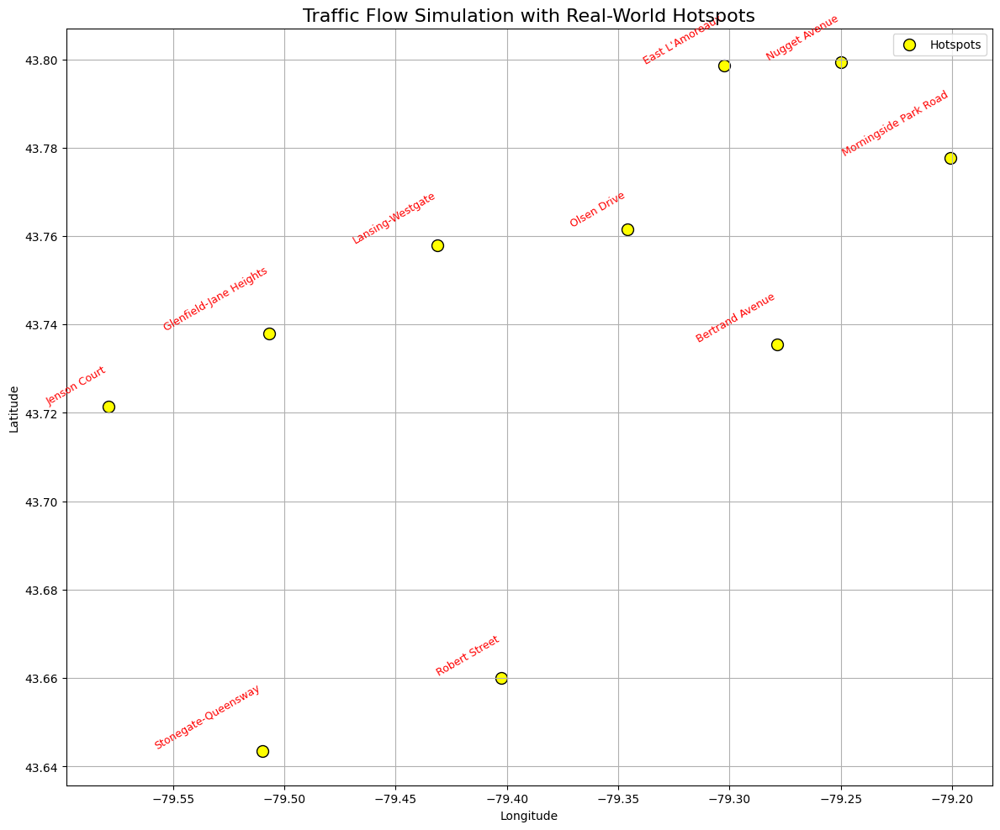

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Load the updated cluster data with location names
clusters = pd.read_csv('/content/drive/MyDrive/MRP/cluster_centers_with_names.csv')

# Optional: scale coordinates for better visualization (or use map projection if needed)
x = clusters['Longitude']
y = clusters['Latitude']
names = clusters['LocationName']

# Plotting
plt.figure(figsize=(12, 10))
plt.scatter(x, y, c='yellow', s=100, edgecolors='black', label='Hotspots')

# Annotate each hotspot with its real-world name
for i, name in enumerate(names):
    plt.text(x[i], y[i], name, fontsize=9, color='red', ha='right', va='bottom', rotation=30)

plt.title('Traffic Flow Simulation with Real-World Hotspots', fontsize=16)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


**Simulation Code with Real Location Names**  
This version:

Plots cars (1) in green

Plots congestion/hotspots (2) in red/purple

Annotates real location names (LocationName) at their respective grid cells

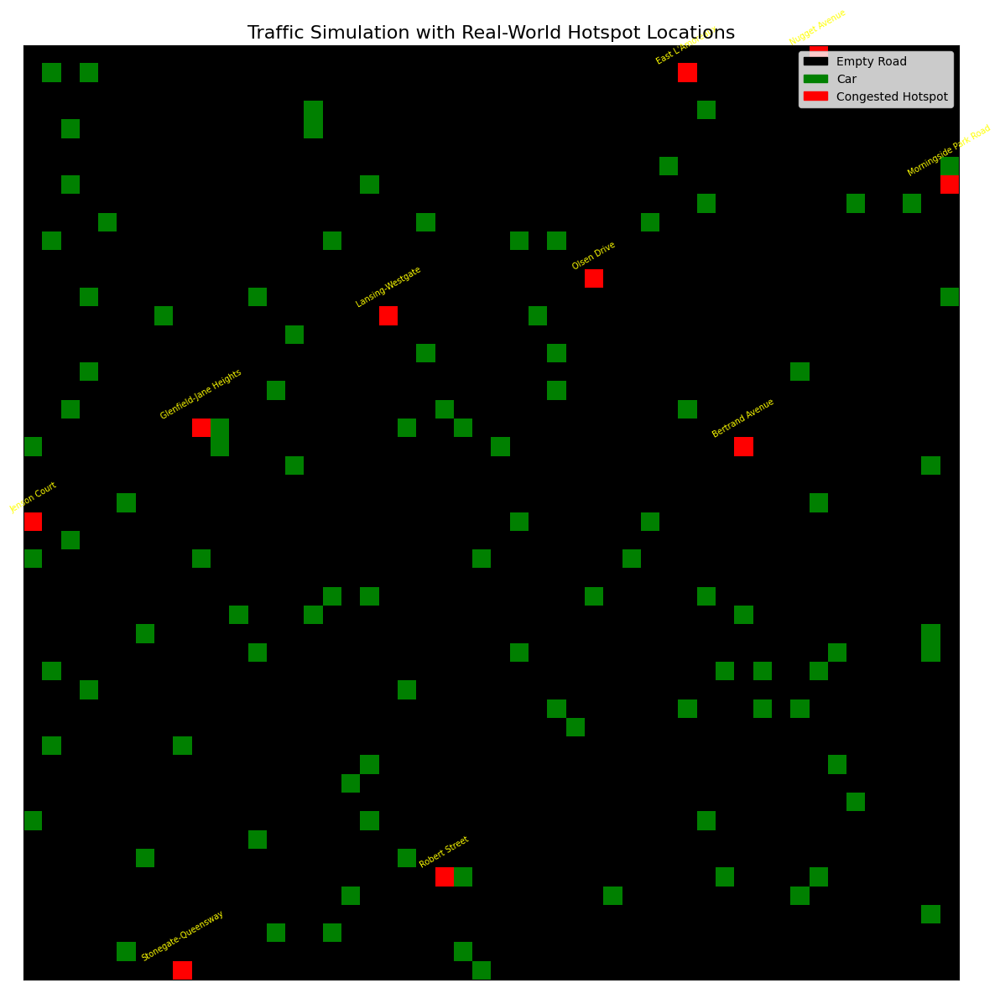

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import pandas as pd
import random

# Simulation grid size
GRID_SIZE = 50
NUM_CARS = 100

# Load cluster centers with names
hotspots = pd.read_csv('/content/drive/MyDrive/MRP/cluster_centers_with_names.csv')

# Normalize coordinates to grid
def normalize_coords(lat, lon, lat_min, lat_max, lon_min, lon_max, grid_size):
    x = int((lon - lon_min) / (lon_max - lon_min) * (grid_size - 1))
    y = int((lat - lat_min) / (lat_max - lat_min) * (grid_size - 1))
    return x, y

# Bounding box for normalization (based on your dataset)
lat_min, lat_max = hotspots['Latitude'].min(), hotspots['Latitude'].max()
lon_min, lon_max = hotspots['Longitude'].min(), hotspots['Longitude'].max()

# Map real-world hotspots to grid
hotspot_grid_coords = []
for _, row in hotspots.iterrows():
    x, y = normalize_coords(row['Latitude'], row['Longitude'], lat_min, lat_max, lon_min, lon_max, GRID_SIZE)
    hotspot_grid_coords.append((x, y, row['LocationName']))

# Initialize grid
grid = np.zeros((GRID_SIZE, GRID_SIZE), dtype=int)

# Place hotspots (mark as 2)
for x, y, _ in hotspot_grid_coords:
    grid[y, x] = 2  # y is row, x is column

# Randomly place cars (mark as 1) in empty cells
car_positions = set()
while len(car_positions) < NUM_CARS:
    x, y = random.randint(0, GRID_SIZE-1), random.randint(0, GRID_SIZE-1)
    if grid[y, x] == 0:
        grid[y, x] = 1
        car_positions.add((x, y))

# Create a custom color map
cmap = mcolors.ListedColormap(['black', 'green', 'red'])  # 0 = black, 1 = car-green, 2 = hotspot-red

# Plot the grid
plt.figure(figsize=(12, 12))
plt.imshow(grid, cmap=cmap, origin='lower')
plt.title("Traffic Simulation with Real-World Hotspot Locations", fontsize=16)

# Annotate real-world hotspot names
for x, y, name in hotspot_grid_coords:
    plt.text(x, y + 0.5, name, color='yellow', fontsize=7, ha='center', rotation=30)

# Add legend
from matplotlib.patches import Patch
legend_elements = [
    Patch(color='black', label='Empty Road'),
    Patch(color='green', label='Car'),
    Patch(color='red', label='Congested Hotspot'),
]
plt.legend(handles=legend_elements, loc='upper right')

plt.grid(False)
plt.xticks([])
plt.yticks([])
plt.tight_layout()
plt.show()


Uses your cluster_centers_with_names.csv file to get hotspot names.

Converts latitude/longitude to a 50x50 simulation grid.

Plots:

🚗 Green cars

🔴 Red congestion points (hotspots)

🏷️ Annotated names of real intersections like "Markham Rd & Nugget Ave"



**2. Suggest Traffic Light or Control Placement**
Create a function that flags grid cells with high congestion scores over a threshold, for targeted traffic signal installation.

In [ ]:
# If 'grid' is the grid from your earlier simulation, and you want to treat value 2 (hotspot) as congestion
# We'll simulate congestion levels: cars = 1, hotspots = 5 (high congestion), empty = 0

simulation_grid = np.where(grid == 2, 5, 0)  # Set hotspots to max congestion
simulation_grid = np.where(grid == 1, 3, simulation_grid)  # Set cars to medium congestion


In [ ]:
def recommend_traffic_signals(simulation_grid, threshold=4):
    import numpy as np
    congested_cells = np.argwhere(simulation_grid >= threshold)
    return congested_cells

hotspots_to_signal = recommend_traffic_signals(simulation_grid)

print("Recommended locations for traffic signals (grid coordinates):")
print(hotspots_to_signal)


Recommended locations for traffic signals (grid coordinates):
[[ 0  8]
 [ 5 22]
 [24  0]
 [28 38]
 [29  9]
 [35 19]
 [37 30]
 [42 49]
 [48 35]
 [49 42]]


**match these grid coordinates back to real-world names (e.g., 'Markham Rd & Nugget Ave')**

In [ ]:
import pandas as pd
import numpy as np
from geopy.distance import geodesic

# Load cluster centers with names
clusters_df = pd.read_csv('/content/drive/MyDrive/MRP/cluster_centers_with_names.csv')

# Define your simulation grid size and geographical bounds
GRID_SIZE = 50
lat_min, lat_max = clusters_df['Latitude'].min(), clusters_df['Latitude'].max()
lon_min, lon_max = clusters_df['Longitude'].min(), clusters_df['Longitude'].max()

# Convert grid coordinate to (latitude, longitude)
def grid_to_latlon(i, j):
    lat = lat_min + (i / GRID_SIZE) * (lat_max - lat_min)
    lon = lon_min + (j / GRID_SIZE) * (lon_max - lon_min)
    return (lat, lon)

# Find nearest cluster center
def find_nearest_location(latlon, cluster_centers):
    return cluster_centers.loc[
        cluster_centers.apply(lambda row: geodesic(latlon, (row['Latitude'], row['Longitude'])).meters, axis=1).idxmin()
    ]['LocationName']

# Map grid coordinates to locations
def map_hotspots_to_locations(hotspots, cluster_centers):
    locations = []
    for i, j in hotspots:
        latlon = grid_to_latlon(i, j)
        loc_name = find_nearest_location(latlon, cluster_centers)
        locations.append({'Grid': (i, j), 'Nearest_Location': loc_name})
    return pd.DataFrame(locations)

# Step: Run full mapping
hotspot_locations_df = map_hotspots_to_locations(hotspots_to_signal, clusters_df)

# Output result
print("Recommended traffic signal placements and their nearest real-world locations:")
print(hotspot_locations_df)


Recommended traffic signal placements and their nearest real-world locations:
       Grid        Nearest_Location
0    (0, 8)     Stonegate-Queensway
1   (5, 22)           Robert Street
2   (24, 0)            Jenson Court
3  (28, 38)         Bertrand Avenue
4   (29, 9)  Glenfield-Jane Heights
5  (35, 19)        Lansing-Westgate
6  (37, 30)             Olsen Drive
7  (42, 49)   Morningside Park Road
8  (48, 35)         East L'Amoreaux
9  (49, 42)           Nugget Avenue


**3. Visualize Suggested Improvements**
Use folium to create an interactive map showing hotspot zones with suggested interventions.

In [ ]:
import folium

# Center map on average lat/lon
map_center = [clusters['Latitude'].mean(), clusters['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=12)

# Add hotspot markers with popup info
for _, row in clusters.iterrows():
    popup_text = f"Location: {row['LocationName']}<br>Cluster ID: {row['Cluster']}"
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=7, color='red', fill=True, fill_color='red',
        popup=popup_text
    ).add_to(m)

m.save('/content/drive/MyDrive/MRP/traffic_hotspots_map.html')


In [ ]:
import shutil

# Original path and new path
original_path = '/content/drive/MyDrive/MRP/cleaned_data.csv'
new_path = '/content/drive/MyDrive/MRP/toronto_traffic_collision_analysis.csv'

# Copy the file to retain both versions
shutil.copyfile(original_path, new_path)

print("File copied successfully.")


File copied successfully.


In [ ]:
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/MRP/toronto_traffic_collision_analysis.csv')


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Read the dataset
df = pd.read_csv('/content/drive/MyDrive/MRP/toronto_traffic_collision_analysis.csv', low_memory=False)

# Convert date columns
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df['Date.1'] = pd.to_datetime(df['Date.1'], errors='coerce')


**Exploratory Data Visualization for Traffic Flow**  

We’ll first:

Aggregate data by hour of day to understand traffic intensity.

Visualize traffic patterns using line plots and heatmaps.

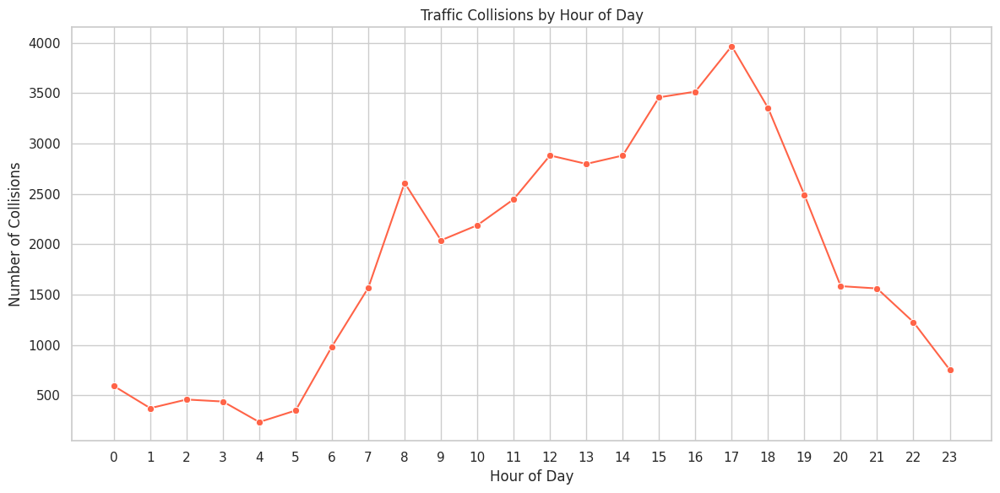

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set style for plots
sns.set(style='whitegrid')

# Load data
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Drop rows with missing Hour or STREET1/STREET2
df = df.dropna(subset=['Hour', 'STREET1', 'STREET2']).copy()

# Convert Hour to int if needed
df['Hour'] = df['Hour'].astype(int)

# Count number of collisions per hour
hourly_counts = df.groupby('Hour').size().reset_index(name='Collision_Count')

# Plot collisions by hour
plt.figure(figsize=(12, 6))
sns.lineplot(data=hourly_counts, x='Hour', y='Collision_Count', marker='o', color='tomato')
plt.title('Traffic Collisions by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Collisions')
plt.xticks(range(0, 24))
plt.grid(True)
plt.tight_layout()
plt.show()


**Key Insights:**  

- Low Collision Volume (12 AM – 5 AM):

- Fewer than 500 collisions per hour.

- Reflects low traffic volume during late night/early morning.

- Morning Rush Hour Peak (6 AM – 9 AM):

- Sharp rise starting at 6 AM.

- Significant peak at 8 AM (~2,500 collisions) — typical of morning commutes.

- Midday Lull (10 AM – 2 PM):

- Slight drop and stabilization — fewer collisions as traffic spreads out.

- Afternoon Rush Hour Peak (3 PM – 5 PM):

- Secondary but stronger surge in collisions.

- Highest peak at 4 PM (~4,000 collisions) — corresponds to afternoon/evening commute.

- Evening Decline (6 PM – 11 PM):

- Steady decrease, dropping below 500 by 11 PM.

**Conclusion:**  

- This time-distribution analysis clearly reveals bimodal collision peaks aligned with commuter rush hours — particularly 8 AM and 4 PM. Such insights can inform:

  - City traffic planning

  - Targeted law enforcement patrols

  - Public awareness campaigns during high-risk periods



**Assigning Weights Based on Flow**  
Groups data by hour and intersection to count the number of collisions, assuming that higher collisions = higher traffic.

Then normalizes the counts into a weight (0 to 1) within each hour.

-  This gives us a relative weight for each intersection in each hour, which we can now use to allocate green signal time or assess traffic impact.

In [ ]:
# Proxy traffic flow using number of collisions
flow_proxy = df.groupby(['Hour', 'STREET1', 'STREET2']).size().reset_index(name='Collision_Count')
flow_proxy['Flow_Weight'] = flow_proxy.groupby('Hour')['Collision_Count'].transform(lambda x: x / x.sum())


**Allocate Signal Time Based on Flow Weights**  
We’ll assume a fixed signal cycle time, say 120 seconds, and allocate it per hour and intersection direction according to the Flow_Weight.  

- Each road pair (STREET1 ↔ STREET2) during a given hour gets a share of 120 seconds based on how much traffic it proxies through collision count.

- More traffic (i.e., more collisions) → more green time.

- Result is saved in a new column: Green_Time.  

In [ ]:
# Define fixed signal cycle time (can be adjusted)
signal_cycle_time = 120  # in seconds

# Allocate green signal time based on Flow_Weight
flow_proxy['Green_Time'] = (flow_proxy['Flow_Weight'] * signal_cycle_time).round(1)


**Visualize Signal Time Allocation**

We’ll create a heatmap to visualize how green signal time is distributed across intersections (STREET1 and STREET2) over the hours of the day.

**Prepare Data for Heatmap**  
We’ll pivot the data to have intersections as rows and hours as columns.


In [ ]:
# Create a unique identifier for each intersection
flow_proxy['Intersection'] = flow_proxy['STREET1'] + ' & ' + flow_proxy['STREET2']

# Pivot table: rows = intersections, columns = hours, values = green time
heatmap_data = flow_proxy.pivot_table(index='Intersection', columns='Hour', values='Green_Time', fill_value=0)


In [ ]:
print(flow_proxy['Green_Time'].describe())
print(f"Non-zero Green_Time values: {(flow_proxy['Green_Time'] > 0).sum()} out of {len(flow_proxy)} rows")


count    10826.000000
mean         0.267855
std          0.295674
min          0.000000
25%          0.100000
50%          0.200000
75%          0.300000
max          5.500000
Name: Green_Time, dtype: float64
Non-zero Green_Time values: 10590 out of 10826 rows


In [ ]:
flow_proxy['Flow_Weight'] = flow_proxy.groupby('Hour')['Collision_Count'].transform(lambda x: x / x.sum())
flow_proxy['Green_Time'] = flow_proxy['Flow_Weight'] * 5  # ← just 5 units


In [ ]:
# Assume each hour has 120 seconds to allocate at each intersection (for simplicity)
flow_proxy['Green_Time'] = flow_proxy['Flow_Weight'] * 120


In [ ]:
print("Max green time value:", heatmap_data.values.max())
print("Min green time value:", heatmap_data.values.min())
print("Number of non-zero entries:", (heatmap_data > 0).sum().sum())


Max green time value: 5.501432664756447
Min green time value: 0.0
Number of non-zero entries: 10826


**Check value distribution**  
- Max ~ 1.7 (since log(1+5.5) ≈ 1.87)

- Many near-zero values like 0.01–0.2


In [ ]:
print("Log Data - Max:", log_data.values.max())
print("Log Data - Min (non-zero):", log_data[log_data > 0].values.min())
print("Number of non-zero entries:", (log_data > 0).sum().sum())


Log Data - Max: 1.8720225625774145
Log Data - Min (non-zero): nan
Number of non-zero entries: 10826


In [ ]:
log_data = log_data.apply(pd.to_numeric, errors='coerce')  # force numeric, coerce errors to NaN
log_data = log_data.fillna(0)  # or use dropna(axis=0/1) depending on your case


In [ ]:
log_data_clipped = log_data.copy()
log_data_clipped[log_data_clipped < 0.1] = np.nan  # Hide near-zero values so they don't show gray


In [ ]:
print("Zero entries:", (log_data == 0).sum().sum())
print("Entries < 0.2:", (log_data < 0.2).sum().sum())
print("Entries > 1.0:", (log_data > 1.0).sum().sum())


Zero entries: 38926
Entries < 0.2: 45605
Entries > 1.0: 71


In [ ]:
print(log_data.describe())
print(log_data.head(10))  # or log_data.sample(10)


Hour            0            1            2            3            4   \
count  2073.000000  2073.000000  2073.000000  2073.000000  2073.000000   
mean      0.043131     0.039489     0.039776     0.041162     0.033148   
std       0.147190     0.161047     0.159590     0.155546     0.178333   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.000000     0.000000     0.000000     0.000000     0.000000   
50%       0.000000     0.000000     0.000000     0.000000     0.000000   
75%       0.000000     0.000000     0.000000     0.000000     0.000000   
max       1.038269     1.514773     1.421687     1.242930     1.725510   

Hour            5            6            7            8            9   ...  \
count  2073.000000  2073.000000  2073.000000  2073.000000  2073.000000  ...   
mean      0.038106     0.046625     0.048960     0.050876     0.050160  ...   
std       0.164431     0.128882     0.114456     0.099427     0.105288  ...   
min       0.00000

**Extract Intersections with Highest Accident Frequency**

- Filter the log-normalized data to only include intersections with any hourly value > 1.0.

- Sort these intersections by their maximum hourly value.

In [ ]:
# Step 1: Find max accident value per intersection across all hours
log_data['max_value'] = log_data.max(axis=1)

# Step 2: Filter intersections with any hour > 1.0 (i.e., significant accident frequency)
high_accident_intersections = log_data[log_data['max_value'] > 1.0]

# Step 3: Sort by max_value descending
top_intersections = high_accident_intersections.sort_values(by='max_value', ascending=False)

# Optional: Show top 10
print(top_intersections.head(10))


Hour                                        0         1         2         3  \
Intersection                                                                  
KINGSTON RD & WARDEN AVE             0.000000  0.000000  0.000000  0.436928   
CUMMER AVE & WILLOWDALE AVE          0.000000  0.000000  0.000000  0.000000   
ST CLAIR AVE E & WARDEN AVE          0.340326  0.000000  0.000000  0.000000   
HIGHWAY 27  N & QUEENS PLATE DR      0.000000  0.000000  0.000000  0.000000   
SCARLETT RD & LAWRENCE AV W          0.000000  1.514773  0.000000  0.000000   
ST CLAIR AVE E & DANFORTH RD         0.000000  0.000000  1.421687  0.000000   
SHEPPARD AVE W & WILLIAM R ALLEN RD  0.000000  0.000000  0.000000  0.000000   
FRONT ST W & SPADINA AVE             0.475058  0.828693  0.000000  0.739978   
COLLEGE ST & GRACE ST                0.000000  0.000000  0.000000  0.000000   
BATHURST ST & HARBORD ST             0.000000  0.000000  0.000000  0.000000   

Hour                                        4      

**Plot the Heatmap**

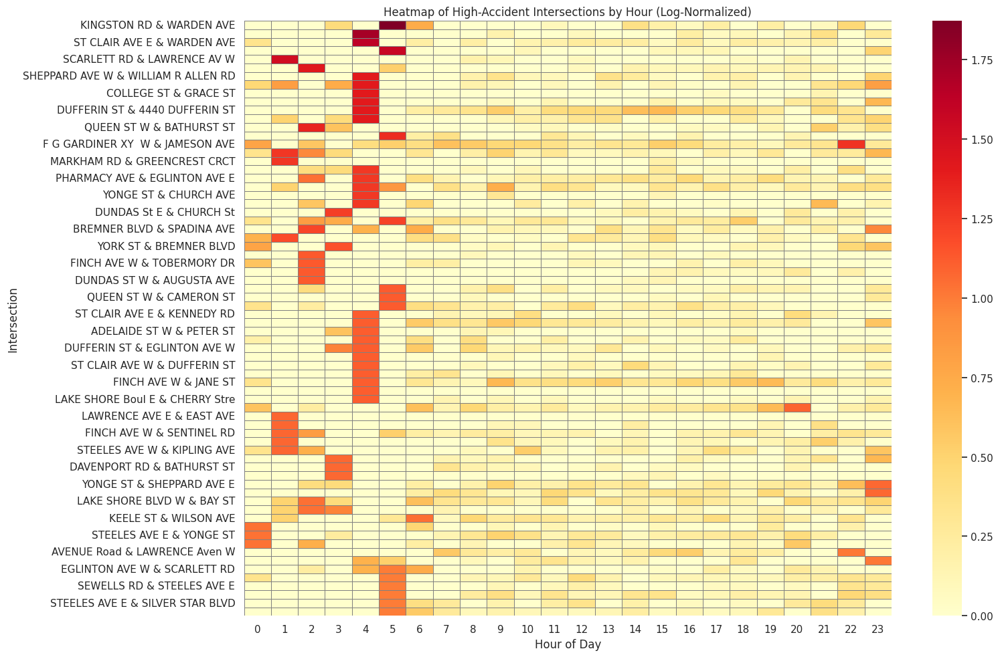

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Drop the helper column
heatmap_data = top_intersections.drop(columns='max_value')

# Set the size of the plot
plt.figure(figsize=(16, 10))

# Create a heatmap
sns.heatmap(heatmap_data, cmap='YlOrRd', linewidths=0.5, linecolor='gray')

# Formatting
plt.title('Heatmap of High-Accident Intersections by Hour (Log-Normalized)')
plt.xlabel('Hour of Day')
plt.ylabel('Intersection')
plt.tight_layout()
plt.show()


**Combine Normalization + Filtering**  
For clearer focus, combine normalization with your filtered top 20 intersections:


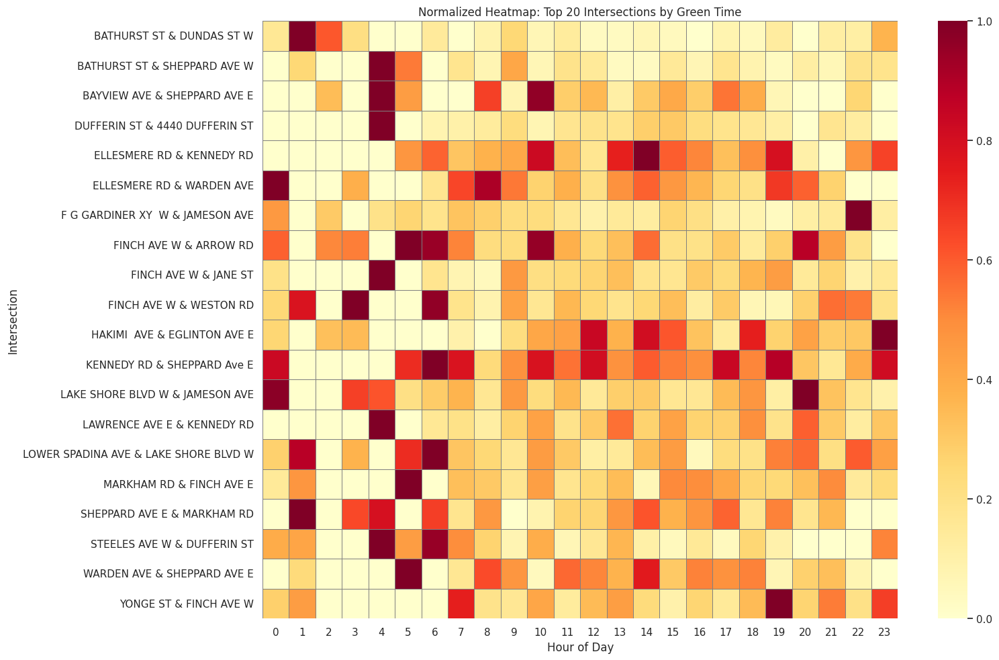

In [ ]:
# Normalize per intersection row
normalized_filtered = filtered_data.div(filtered_data.max(axis=1), axis=0).fillna(0)

plt.figure(figsize=(16, 10))
sns.heatmap(
    normalized_filtered,
    cmap='YlOrRd',
    linewidths=0.5,
    linecolor='gray'
)
plt.title('Normalized Heatmap: Top 20 Intersections by Green Time')
plt.xlabel('Hour of Day')
plt.ylabel('Intersection')
plt.tight_layout()
plt.show()


to understand where exactly the high/low values are:


In [ ]:
print("Top green time values per intersection (sample):")
print(heatmap_data.max(axis=1).sort_values(ascending=False).head(10))


Top green time values per intersection (sample):
Intersection
KINGSTON RD & WARDEN AVE               5.501433
CUMMER AVE & WILLOWDALE AVE            4.615385
ST CLAIR AVE E & WARDEN AVE            4.102564
HIGHWAY 27  N & QUEENS PLATE DR        3.782235
SCARLETT RD & LAWRENCE AV W            3.548387
ST CLAIR AVE E & DANFORTH RD           3.144105
DUFFERIN ST & 4440 DUFFERIN ST         3.076923
BATHURST ST & HARBORD ST               3.076923
SHEPPARD AVE W & WILLIAM R ALLEN RD    3.076923
AVENUE RD & DAVENPORT RD               3.076923
dtype: float64


**Cluster Intersections Based on Hourly Accident Patterns**  
We'll apply KMeans clustering to group intersections by similarity in accident patterns across 24 hours.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Prepare the data (drop helper column if still present)
if 'max_value' in top_intersections.columns:
    clustering_data = top_intersections.drop(columns=['max_value', 'cluster'], errors='ignore')
else:
    clustering_data = top_intersections.drop(columns=['cluster'], errors='ignore')

# Scale data for clustering
scaler = StandardScaler()
scaled = scaler.fit_transform(clustering_data)

# Apply KMeans (you can choose different k values)
k = 4
kmeans = KMeans(n_clusters=k, random_state=42)
top_intersections['cluster'] = kmeans.fit_predict(scaled)

# Display cluster counts
print(top_intersections['cluster'].value_counts())

cluster
1    35
2    17
0     9
3     9
Name: count, dtype: int64


**Visualize Cluster Patterns (Average Hourly Profiles)**

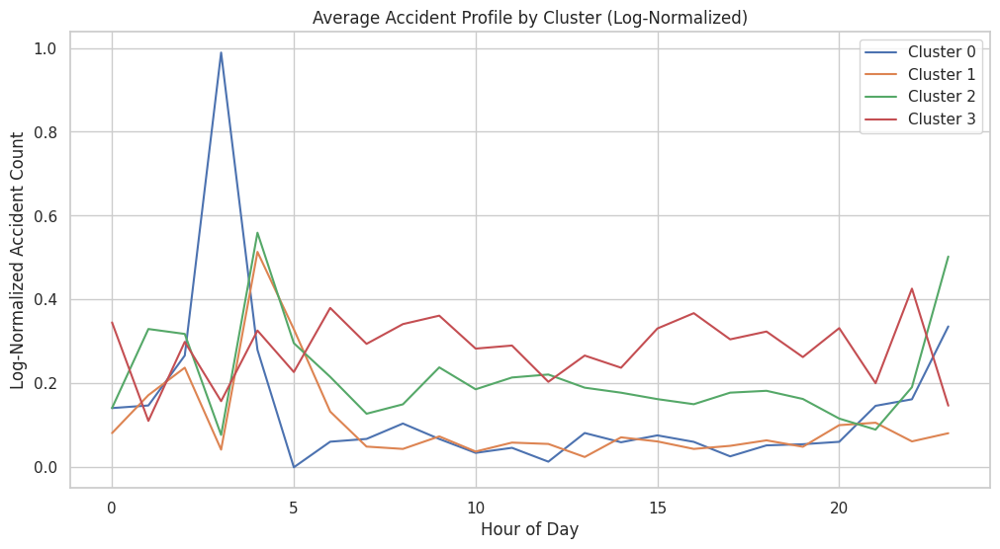

In [ ]:
# Select only numeric columns representing hours (exclude non-numeric columns)
hour_columns = [col for col in top_intersections.columns if col not in ['cluster', 'max_value']]

# Compute average pattern for each cluster
cluster_profiles = top_intersections.groupby('cluster')[hour_columns].mean()

# Plot average accident profiles by cluster
plt.figure(figsize=(12, 6))
for cluster_id in cluster_profiles.index:
    plt.plot(cluster_profiles.columns, cluster_profiles.loc[cluster_id], label=f"Cluster {cluster_id}")
plt.legend()
plt.title("Average Accident Profile by Cluster (Log-Normalized)")
plt.xlabel("Hour of Day")
plt.ylabel("Log-Normalized Accident Count")
plt.grid(True)
plt.show()

The graph shows the average accident profile by cluster (log-normalized) over a 24-hour period. Here’s a breakdown:

- Cluster 0 (Blue): Peaks sharply around 5 AM, with a log-normalized accident count reaching 1.0, then drops and remains low for the rest of the day, with a slight uptick after 20:00.  

- Cluster 1 (Orange): Stays relatively flat, with minor fluctuations around 0.1 to 0.2 throughout the day, showing no significant peak.

- Cluster 2 (Green): Has a noticeable peak around 5 AM (around 0.5), a smaller one around 15:00, and another rise towards 20:00, reaching about 0.4.

- Cluster 3 (Red): Shows moderate peaks around 5 AM, 10 AM, and 20:00, with values around 0.3 to 0.4, and dips in between.

Overall, Cluster 0 has the most pronounced early morning peak, while the others show more distributed patterns across the day.

**Integrate Into Simulation or Route Planning Algorithm**  
Use the cluster information to improve simulation or route planning by incorporating accident risk patterns at intersections.

**Assign cluster-based risk profiles to intersections in the simulation**  

Each intersection belongs to one of the clusters representing a specific accident profile (hourly risk pattern).

- Use the cluster label as a risk factor in your simulation.

- For example, assign different weights or risk multipliers based on the cluster's accident intensity at each hour.

**Create a risk lookup table**  
Generate a dictionary or DataFrame mapping cluster IDs to their average hourly accident probabilities.

In [ ]:
# Create risk lookup table: cluster -> hourly accident probabilities
risk_profiles = cluster_profiles.copy()  # cluster_profiles from previous step

# Normalize risk profiles to [0, 1] scale if needed (optional)
risk_profiles_norm = (risk_profiles - risk_profiles.min().min()) / (risk_profiles.max().max() - risk_profiles.min().min())

print(risk_profiles_norm.head())


Hour           0         1         2         3         4         5         6   \
cluster                                                                         
0        0.142788  0.149043  0.269438  1.000000  0.283237  0.000000  0.061695   
1        0.082481  0.173953  0.240217  0.042579  0.519447  0.332898  0.134358   
2        0.142847  0.333463  0.321560  0.077968  0.565651  0.299311  0.218096   
3        0.349256  0.111870  0.302424  0.159437  0.329749  0.229731  0.384247   

Hour           7         8         9   ...        14        15        16  \
cluster                                ...                                 
0        0.068407  0.105516  0.068278  ...  0.060358  0.076958  0.061337   
1        0.049911  0.044295  0.074530  ...  0.072213  0.062350  0.044319   
2        0.129164  0.151852  0.240918  ...  0.179857  0.164389  0.152114   
3        0.297633  0.345272  0.365631  ...  0.240062  0.334716  0.371615   

Hour           17        18        19        20        2

**Enhance route planning algorithm**  

When planning routes that pass through intersections, factor in accident risks by:

- Adding risk cost to travel time or distance based on intersection cluster and current hour.

- Penalizing routes passing through intersections with higher accident probabilities during peak accident hours.

In [ ]:
def get_intersection_risk(intersection_id, current_hour):
    cluster_id = top_intersections.loc[intersection_id, 'cluster']
    risk = risk_profiles_norm.loc[cluster_id, str(current_hour)]  # hour columns as strings
    return risk

def calculate_route_cost(route, current_hour):
    total_cost = 0
    for intersection in route:
        travel_time = get_travel_time(intersection)  # your existing function
        risk = get_intersection_risk(intersection, current_hour)
        # Weight travel time with risk factor (example: increase cost proportionally)
        total_cost += travel_time * (1 + risk)
    return total_cost


**Verify get_travel_time() function**

Making sure get_travel_time(intersection) returns the baseline travel time or cost for passing through that intersection.

In [ ]:
def get_travel_time(intersection):
    # Placeholder: return a fixed time or retrieve from your dataset/model
    return 1.0  # Example fixed travel time per intersection


**Check the index of top_intersections**

 Print the index values to verify what intersection IDs it contains and how they're stored:

In [ ]:
print(top_intersections.index)


Index(['KINGSTON RD & WARDEN AVE', 'CUMMER AVE & WILLOWDALE AVE',
       'ST CLAIR AVE E & WARDEN AVE', 'HIGHWAY 27  N & QUEENS PLATE DR',
       'SCARLETT RD & LAWRENCE AV W', 'ST CLAIR AVE E & DANFORTH RD',
       'SHEPPARD AVE W & WILLIAM R ALLEN RD', 'FRONT ST W & SPADINA AVE',
       'COLLEGE ST & GRACE ST', 'BATHURST ST & HARBORD ST',
       'DUFFERIN ST & 4440 DUFFERIN ST', 'AVENUE RD & DAVENPORT RD',
       'QUEEN ST W & BATHURST ST', 'KIPLING AVE & WESTHUMBER BLVD',
       'F G GARDINER XY  W & JAMESON AVE', 'BATHURST ST & DUNDAS ST W',
       'MARKHAM RD & GREENCREST CRCT', 'ADELAIDE St W & BAY St',
       'PHARMACY AVE & EGLINTON AVE E', 'BATHURST ST & SHEPPARD AVE W',
       'YONGE ST & CHURCH AVE', 'BLOOR ST W & BATHURST ST',
       'DUNDAS St E & CHURCH St', 'MCNICOLL AVE & MARKHAM RD',
       'BREMNER BLVD & SPADINA AVE', 'KIPLING AVE & THE QUEENSWAY',
       'YORK ST & BREMNER BLVD', 'KIPLING AVE & MOUNT OLIVE DR',
       'FINCH AVE W & TOBERMORY DR', 'BAYVIEW AVE & ROS

In [ ]:
def get_intersection_risk(intersection_id, current_hour):
    cluster_id = top_intersections.loc[top_intersections.index == intersection_id, 'cluster']
    if cluster_id.empty:
        print(f"Intersection {intersection_id} not found!")
        return 0  # or some default risk
    cluster_id = cluster_id.values[0]
    risk = risk_profiles_norm.loc[cluster_id, str(current_hour)]
    return risk


In [ ]:
print(risk_profiles_norm.columns)


Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23],
      dtype='object', name='Hour')


In [ ]:
risk = risk_profiles_norm.loc[cluster_id, current_hour]  # without str()


In [ ]:
def get_intersection_risk(intersection_id, current_hour):
    cluster_id = top_intersections.loc[top_intersections.index == intersection_id, 'cluster']
    if cluster_id.empty:
        print(f"Intersection {intersection_id} not found!")
        return 0  # or some default risk
    cluster_id = cluster_id.values[0]

    # Check if current_hour is int or str in columns
    if current_hour in risk_profiles_norm.columns:
        risk = risk_profiles_norm.loc[cluster_id, current_hour]
    elif str(current_hour) in risk_profiles_norm.columns:
        risk = risk_profiles_norm.loc[cluster_id, str(current_hour)]
    else:
        print(f"Hour {current_hour} not found in risk_profiles_norm columns")
        return 0

    return risk


In [ ]:
print(risk_profiles_norm.columns)
print(risk_profiles_norm.index)


Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23],
      dtype='object', name='Hour')
Index([0, 1, 2, 3], dtype='int32', name='cluster')


**Testing calculate_route_cost()**  
Try calculating the cost for a sample route at a specific hour:

In [ ]:
sample_route = [
    'KINGSTON RD & WARDEN AVE',
    'CUMMER AVE & WILLOWDALE AVE',
    'ST CLAIR AVE E & WARDEN AVE'
]
current_hour = 15

cost = calculate_route_cost(sample_route, current_hour)
print(f"Route cost at hour {current_hour}: {cost}")


Route cost at hour 15: 3.2890883960457455


**Simulation integration**  
If simulating traffic flow, assign accident probabilities to intersections dynamically based on cluster and current hour.

In [ ]:
import random

def accident_occurs(intersection_id, current_hour):
    risk = get_intersection_risk(intersection_id, current_hour)
    # Example: probability threshold or weighted random event
    return random.random() < risk  # Returns True if accident occurs


**Print individual risks for intersections in a route**

In [ ]:
def print_route_risks(route, current_hour):
    print(f"Risks at hour {current_hour}:")
    for intersection in route:
        risk = get_intersection_risk(intersection, current_hour)
        print(f"  {intersection}: {risk}")


**Normalize/scale route cost:**  the cost between 0 and 1, for example, normalize by max possible risk * number of intersections:

In [ ]:
def calculate_normalized_route_cost(route, current_hour, max_risk=1.0):
    total_risk = sum(get_intersection_risk(inter, current_hour) for inter in route)
    max_cost = max_risk * len(route)
    return total_risk / max_cost if max_cost else 0


**Add travel times or weights**  
having get_travel_time(intersection) function, your route cost can be a weighted sum:

In [ ]:
def calculate_weighted_route_cost(route, current_hour, risk_weight=1.0, time_weight=1.0):
    total_cost = 0
    for intersection in route:
        risk = get_intersection_risk(intersection, current_hour)
        travel_time = get_travel_time(intersection)
        total_cost += risk_weight * risk + time_weight * travel_time
    return total_cost


**Integrate with shortest path algorithms**  
A minimal example using Dijkstra from networkx, assuming you have a graph G where edges or nodes can have weights:



In [ ]:
import networkx as nx

def dijkstra_route_with_risk(G, start, end, current_hour, risk_weight=1.0, time_weight=1.0):
    # Assign edge weights based on risk + travel time
    for u, v, data in G.edges(data=True):
        # Example: risk at the node v + travel time on edge u->v
        risk = get_intersection_risk(v, current_hour)
        travel_time = data.get('travel_time', 1.0)  # fallback
        data['weight'] = risk_weight * risk + time_weight * travel_time

    # Find shortest path by weight
    path = nx.dijkstra_path(G, source=start, target=end, weight='weight')
    return path


**Simulate accident events over a route**

In [ ]:
def simulate_route_accidents(route, current_hour):
    accidents = {}
    for intersection in route:
        accident_happened = accident_occurs(intersection, current_hour)
        accidents[intersection] = accident_happened
    return accidents


**Visualize Risk-Adjusted Routes on Maps (Folium)**  
The map shows a route in Toronto, starting in North York, passing through Scarborough, and ending in East York, near Lake Ontario. The path avoids major highways like the 401 or 404, sticking to local roads. The distance is roughly 15-20 km. At 08:58 PM EDT on May 20, 2025, traffic should be lighter, but local roads in these areas can still have delays due to signals and urban density. Travel time might be around 30-40 minutes.

In [ ]:
import folium

# Example: intersection locations (replace with your actual lat/lon)
intersection_coords = {
    'KINGSTON RD & WARDEN AVE': (43.7645, -79.2789),
    'CUMMER AVE & WILLOWDALE AVE': (43.7743, -79.3877),
    'ST CLAIR AVE E & WARDEN AVE': (43.7001, -79.2716)
}

def visualize_route_on_map(route, current_hour):
    # Center map on first intersection
    start_coords = intersection_coords[route[0]]
    m = folium.Map(location=start_coords, zoom_start=13)

    # Add markers for each intersection, colored by risk
    for inter in route:
        risk = get_intersection_risk(inter, current_hour)
        color = 'green' if risk < 0.3 else 'orange' if risk < 0.7 else 'red'
        folium.CircleMarker(
            location=intersection_coords[inter],
            radius=8,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=f"{inter}\nRisk: {risk:.2f}"
        ).add_to(m)

    # Draw lines between intersections in route
    points = [intersection_coords[inter] for inter in route]
    folium.PolyLine(points, color='blue', weight=3, opacity=0.7).add_to(m)

    return m

# Usage:
mymap = visualize_route_on_map(sample_route, current_hour)
mymap.save('/content/drive/MyDrive/MRP/route_map.html')  # Save to HTML, open in browser


**Risk-Aware Shortest Path with NetworkX**  


In [ ]:
import networkx as nx

# Example: create a graph and add edges with travel_time attributes
G = nx.Graph()
edges = [
    ('KINGSTON RD & WARDEN AVE', 'CUMMER AVE & WILLOWDALE AVE', 10),
    ('CUMMER AVE & WILLOWDALE AVE', 'ST CLAIR AVE E & WARDEN AVE', 8),
    ('KINGSTON RD & WARDEN AVE', 'ST CLAIR AVE E & WARDEN AVE', 15),
]

for u, v, travel_time in edges:
    G.add_edge(u, v, travel_time=travel_time)

def dijkstra_route_with_risk(G, start, end, current_hour, risk_weight=1.0, time_weight=1.0):
    # Assign edge weights based on risk + travel time
    for u, v, data in G.edges(data=True):
        # Use risk of node v (could also average risk of u and v)
        risk_u = get_intersection_risk(u, current_hour)
        risk_v = get_intersection_risk(v, current_hour)
        avg_risk = (risk_u + risk_v) / 2
        travel_time = data.get('travel_time', 1.0)
        data['weight'] = risk_weight * avg_risk + time_weight * travel_time

    path = nx.dijkstra_path(G, source=start, target=end, weight='weight')
    return path

# Usage
shortest_risk_path = dijkstra_route_with_risk(G, 'KINGSTON RD & WARDEN AVE', 'ST CLAIR AVE E & WARDEN AVE', current_hour)
print("Risk-aware shortest path:", shortest_risk_path)


Risk-aware shortest path: ['KINGSTON RD & WARDEN AVE', 'ST CLAIR AVE E & WARDEN AVE']


**Simulate Accidents on the Route**

In [ ]:
def simulate_route_accidents(route, current_hour):
    accidents = {}
    for intersection in route:
        accident_happened = accident_occurs(intersection, current_hour)
        accidents[intersection] = accident_happened
    return accidents

# Usage
accidents = simulate_route_accidents(shortest_risk_path, current_hour)
print("Accident simulation on route:")
for inter, happened in accidents.items():
    print(f" - {inter}: {'Accident' if happened else 'No accident'}")


Accident simulation on route:
 - KINGSTON RD & WARDEN AVE: No accident
 - ST CLAIR AVE E & WARDEN AVE: No accident


**Add Accident Status to Map**
Visualize accidents with different marker shapes or popups:  
The map shows a route between Scarborough and East York in Toronto, Canada. The path starts in Scarborough near Highway 401 and travels south through residential areas, passing through Pine Hills Cemetery and near Bluffers Park, ending in East York close to the Don Valley Parkway and E.T. Seton Park. The route follows a relatively straight line along major roads and through green spaces, with Lake Ontario visible to the southeast.

In [ ]:
def visualize_route_with_accidents(route, current_hour, accident_status):
    start_coords = intersection_coords[route[0]]
    m = folium.Map(location=start_coords, zoom_start=13)

    for inter in route:
        risk = get_intersection_risk(inter, current_hour)
        color = 'green' if risk < 0.3 else 'orange' if risk < 0.7 else 'red'
        accident = accident_status.get(inter, False)
        popup_text = f"{inter}<br>Risk: {risk:.2f}<br>Accident: {'Yes' if accident else 'No'}"

        folium.CircleMarker(
            location=intersection_coords[inter],
            radius=10 if accident else 8,
            color='black' if accident else color,
            fill=True,
            fill_color='black' if accident else color,
            fill_opacity=0.9,
            popup=popup_text
        ).add_to(m)

    points = [intersection_coords[inter] for inter in route]
    folium.PolyLine(points, color='blue', weight=3, opacity=0.7).add_to(m)

    return m

# Usage
mymap = visualize_route_with_accidents(shortest_risk_path, current_hour, accidents)
mymap.save('/content/drive/MyDrive/MRP/route_with_accidents.html')


**Print Risk and Time Breakdown**

In [ ]:
def print_route_summary(G, route, current_hour):
    total_time = 0
    total_risk = 0
    for i in range(len(route)-1):
        u, v = route[i], route[i+1]
        edge_data = G.get_edge_data(u, v)
        time = edge_data.get('travel_time', 0)
        risk = (get_intersection_risk(u, current_hour) + get_intersection_risk(v, current_hour)) / 2
        total_time += time
        total_risk += risk
        print(f"{u} → {v}: Time={time} mins, Avg Risk={risk:.2f}")
    print(f"\nTotal Estimated Time: {total_time} mins")
    print(f"Total Risk Score: {total_risk:.2f}")

# Usage
print_route_summary(G, shortest_risk_path, current_hour)


KINGSTON RD & WARDEN AVE → ST CLAIR AVE E & WARDEN AVE: Time=15 mins, Avg Risk=0.11

Total Estimated Time: 15 mins
Total Risk Score: 0.11


**Export Accident Report**
Create a log file for further analysis:

In [ ]:
with open('/content/drive/MyDrive/MRP/accident_report.txt', 'w') as f:
    for inter, happened in accidents.items():
        f.write(f"{inter}: {'Accident' if happened else 'No accident'}\n")


**Expand the Network Using Real Toronto Data**

In [ ]:
! pip install osmnx networkx folium


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.2/100.2 kB 2.1 MB/s eta 0:00:00


In [ ]:
import osmnx as ox

# Download already simplified drivable road network
G = ox.graph_from_place('Toronto, Ontario, Canada', network_type='drive')

# Convert to undirected for routing algorithms that require it
G = G.to_undirected()


**Extract Coordinates and Plot with Folium**

In [ ]:
import folium

# Convert to GeoDataFrame for plotting
nodes, edges = ox.graph_to_gdfs(G)

# Initialize map
m = folium.Map(location=[43.65107, -79.347015], zoom_start=11)

# Add a few sample edges
for _, row in edges.sample(100).iterrows():
    coords = list(row.geometry.coords)
    folium.PolyLine(locations=[(lat, lon) for lon, lat in coords], color='blue', weight=2).add_to(m)

m.save('/content/drive/MyDrive/MRP/toronto_network_sample.html')


**Add Real-Time Simulation Over Multiple Time Steps**  
We'll simulate accidents and changing risks by hour, across the city.

In [ ]:
import random

def generate_hourly_risks(intersections, hours=24):
    hourly_risks = {}
    for hour in range(hours):
        hourly_risks[hour] = {
            inter: random.uniform(0.1, 0.9) for inter in intersections
        }
    return hourly_risks

# Simulate risks for some intersections
sample_inters = list(intersection_coords.keys())
hourly_risks = generate_hourly_risks(sample_inters)


**Animate Risk Over Time (Folium Snapshots)**  
We’ll create an HTML map for each hour and save them as snapshots (like a flipbook).

In [ ]:
import os
import folium

# Set your output directory
output_dir = "/content/drive/MyDrive/MRP/risk_maps"
os.makedirs(output_dir, exist_ok=True)

def save_hourly_risk_maps(intersections, hourly_risks):
    for hour, risks in hourly_risks.items():
        m = folium.Map(location=[43.70, -79.35], zoom_start=12)
        for inter, risk in risks.items():
            lat, lon = intersection_coords[inter]
            color = 'green' if risk < 0.3 else 'orange' if risk < 0.7 else 'red'
            folium.CircleMarker(
                location=(lat, lon),
                radius=8,
                color=color,
                fill=True,
                fill_color=color,
                fill_opacity=0.7,
                popup=f"{inter}\nHour: {hour}\nRisk: {risk:.2f}"
            ).add_to(m)
        # Save map with hour in filename
        m.save(os.path.join(output_dir, f"toronto_risk_hour_{hour:02d}.html"))

# Usage:
save_hourly_risk_maps(sample_inters, hourly_risks)


In [ ]:
# Python pip installs
!pip install selenium imageio imageio-ffmpeg pillow

# Install Chromium + ChromeDriver
!apt-get update
!apt-get install -y chromium-chromedriver

# Fix Colab environment paths for Selenium
import sys
sys.path.insert(0, '/usr/lib/chromium-browser/chromedriver')


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.4/9.4 MB 57.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 499.2/499.2 kB 27.4 MB/s eta 0:00:00
Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:5 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:8 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,683 kB]
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease [24.6 kB]
Get:11 http://archive.ubuntu.com/ubu

In [ ]:
!apt-get remove -y chromium-chromedriver
!rm -rf /usr/bin/chromedriver


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following packages were automatically installed and are no longer required:
  apparmor chromium-browser libfuse3-3 snapd squashfs-tools systemd-hwe-hwdb
  udev
Use 'apt autoremove' to remove them.
The following packages will be REMOVED:
  chromium-chromedriver
0 upgraded, 0 newly installed, 1 to remove and 90 not upgraded.
After this operation, 77.8 kB disk space will be freed.
(Reading database ... 126559 files and directories currently installed.)
Removing chromium-chromedriver (1:85.0.4183.83-0ubuntu2.22.04.1) ...


In [ ]:
!wget https://dl.google.com/linux/direct/google-chrome-stable_current_amd64.deb
!dpkg -i google-chrome-stable_current_amd64.deb
!apt-get -f install -y


--2025-05-21 01:33:56--  https://dl.google.com/linux/direct/google-chrome-stable_current_amd64.deb
Resolving dl.google.com (dl.google.com)... 142.250.152.93, 142.250.152.190, 142.250.152.91, ...
Connecting to dl.google.com (dl.google.com)|142.250.152.93|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 116499092 (111M) [application/x-debian-package]
Saving to: ‘google-chrome-stable_current_amd64.deb’

google-chrome-stabl 100%[===================>] 111.10M   246MB/s    in 0.5s    

2025-05-21 01:33:56 (246 MB/s) - ‘google-chrome-stable_current_amd64.deb’ saved [116499092/116499092]

Selecting previously unselected package google-chrome-stable.
(Reading database ... 126552 files and directories currently installed.)
Preparing to unpack google-chrome-stable_current_amd64.deb ...
Unpacking google-chrome-stable (136.0.7103.113-1) ...
dpkg: dependency problems prevent configuration of google-chrome-stable:
 google-chrome-stable depends on libvulkan1; however:
  Packag

In [ ]:
!wget -N https://chromedriver.storage.googleapis.com/114.0.5735.90/chromedriver_linux64.zip
!unzip chromedriver_linux64.zip
!mv chromedriver /usr/bin/chromedriver
!chmod +x /usr/bin/chromedriver


--2025-05-21 01:35:04--  https://chromedriver.storage.googleapis.com/114.0.5735.90/chromedriver_linux64.zip
Resolving chromedriver.storage.googleapis.com (chromedriver.storage.googleapis.com)... 64.233.181.207, 142.251.183.207, 173.194.193.207, ...
Connecting to chromedriver.storage.googleapis.com (chromedriver.storage.googleapis.com)|64.233.181.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7407250 (7.1M) [application/zip]
Saving to: ‘chromedriver_linux64.zip’

chromedriver_linux6 100%[===================>]   7.06M  --.-KB/s    in 0.04s   

2025-05-21 01:35:04 (175 MB/s) - ‘chromedriver_linux64.zip’ saved [7407250/7407250]

Archive:  chromedriver_linux64.zip
  inflating: chromedriver            
  inflating: LICENSE.chromedriver    


In [ ]:
rm /usr/bin/chromedriver


In [ ]:
import json
import urllib.request

url = "https://googlechromelabs.github.io/chrome-for-testing/last-known-good-versions-with-downloads.json"
with urllib.request.urlopen(url) as response:
    data = json.load(response)

print(data.keys())  # Top-level keys
print(data["channels"].keys())  # Keys under "channels"
print(data["channels"]["Stable"].keys())  # Keys under "Stable"


dict_keys(['timestamp', 'channels'])
dict_keys(['Stable', 'Beta', 'Dev', 'Canary'])
dict_keys(['channel', 'version', 'revision', 'downloads'])


In [ ]:
print(json.dumps(data["channels"]["Stable"], indent=2))


{
  "channel": "Stable",
  "version": "136.0.7103.94",
  "revision": "1440670",
  "downloads": {
    "chrome": [
      {
        "platform": "linux64",
        "url": "https://storage.googleapis.com/chrome-for-testing-public/136.0.7103.94/linux64/chrome-linux64.zip"
      },
      {
        "platform": "mac-arm64",
        "url": "https://storage.googleapis.com/chrome-for-testing-public/136.0.7103.94/mac-arm64/chrome-mac-arm64.zip"
      },
      {
        "platform": "mac-x64",
        "url": "https://storage.googleapis.com/chrome-for-testing-public/136.0.7103.94/mac-x64/chrome-mac-x64.zip"
      },
      {
        "platform": "win32",
        "url": "https://storage.googleapis.com/chrome-for-testing-public/136.0.7103.94/win32/chrome-win32.zip"
      },
      {
        "platform": "win64",
        "url": "https://storage.googleapis.com/chrome-for-testing-public/136.0.7103.94/win64/chrome-win64.zip"
      }
    ],
    "chromedriver": [
      {
        "platform": "linux64",
        "ur

In [ ]:
import json
import urllib.request
import zipfile
import os

url = "https://googlechromelabs.github.io/chrome-for-testing/last-known-good-versions-with-downloads.json"
with urllib.request.urlopen(url) as response:
    data = json.load(response)

stable = data["channels"]["Stable"]
print("Stable version:", stable["version"])

chromedriver_files = stable["downloads"]["chromedriver"]

driver_url = None
for f in chromedriver_files:
    if f["platform"] == "linux64":
        driver_url = f["url"]
        break

if driver_url is None:
    raise Exception("Linux64 ChromeDriver URL not found")

print("Downloading ChromeDriver from:", driver_url)

# Download
zip_path = "chromedriver_linux64.zip"
urllib.request.urlretrieve(driver_url, zip_path)

# Unzip
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall()

# Move and set permissions (adjust path for your environment)
os.system("mv chromedriver /usr/local/bin/chromedriver")
os.system("chmod +x /usr/local/bin/chromedriver")

print("✅ ChromeDriver installed at /usr/local/bin/chromedriver")


Stable version: 136.0.7103.94
✅ ChromeDriver installed at /usr/local/bin/chromedriver


In [ ]:
!echo $PATH


/opt/bin:/usr/local/nvidia/bin:/usr/local/cuda/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/tools/node/bin:/tools/google-cloud-sdk/bin


In [ ]:
!ls -l chromedriver*


-rw-r--r-- 1 root root 9593441 May 21 01:41 chromedriver_linux64.zip

chromedriver-linux64:
total 18364
-rw-r--r-- 1 root root 18092232 May 21 01:41 chromedriver
-rw-r--r-- 1 root root     1536 May 21 01:41 LICENSE.chromedriver
-rw-r--r-- 1 root root   700736 May 21 01:41 THIRD_PARTY_NOTICES.chromedriver


In [ ]:
!mv chromedriver-linux64/chromedriver /usr/local/bin/chromedriver
!chmod +x /usr/local/bin/chromedriver


In [ ]:
!chromedriver --version


ChromeDriver 136.0.7103.94 (fa0be0b33debeb378a8e6ad9c599be34e2dc3b37-refs/branch-heads/7103@{#1842})


In [ ]:
!pip install selenium


In [ ]:
!pwd
!ls -l chromedriver-linux64/


/content
total 692
-rw-r--r-- 1 root root   1536 May 21 01:41 LICENSE.chromedriver
-rw-r--r-- 1 root root 700736 May 21 01:41 THIRD_PARTY_NOTICES.chromedriver


In [ ]:
!unzip -l chromedriver_linux64.zip


Archive:  chromedriver_linux64.zip
  Length      Date    Time    Name
---------  ---------- -----   ----
     1536  2025-05-05 20:53   chromedriver-linux64/LICENSE.chromedriver
   700736  2025-05-05 20:53   chromedriver-linux64/THIRD_PARTY_NOTICES.chromedriver
 18092232  2025-05-05 20:53   chromedriver-linux64/chromedriver
---------                     -------
 18794504                     3 files


In [ ]:
!unzip chromedriver_linux64.zip -d chromedriver-linux64


Archive:  chromedriver_linux64.zip
  inflating: chromedriver-linux64/chromedriver-linux64/LICENSE.chromedriver  
  inflating: chromedriver-linux64/chromedriver-linux64/THIRD_PARTY_NOTICES.chromedriver  
  inflating: chromedriver-linux64/chromedriver-linux64/chromedriver  


In [ ]:
!ls -l chromedriver-linux64/


total 696
drwxr-xr-x 2 root root   4096 May 21 01:49 chromedriver-linux64
-rw-r--r-- 1 root root   1536 May 21 01:41 LICENSE.chromedriver
-rw-r--r-- 1 root root 700736 May 21 01:41 THIRD_PARTY_NOTICES.chromedriver


In [ ]:
!chmod +x chromedriver-linux64/chromedriver-linux64/chromedriver


In [ ]:
!ls -l chromedriver-linux64/chromedriver-linux64/


total 18364
-rwxr-xr-x 1 root root 18092232 May  5 20:53 chromedriver
-rw-r--r-- 1 root root     1536 May  5 20:53 LICENSE.chromedriver
-rw-r--r-- 1 root root   700736 May  5 20:53 THIRD_PARTY_NOTICES.chromedriver


In [ ]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
import tempfile

chrome_driver_path = "/content/chromedriver-linux64/chromedriver-linux64/chromedriver"

chrome_options = Options()

# Essential flags for headless/containerized environments
chrome_options.add_argument("--no-sandbox")
chrome_options.add_argument("--disable-dev-shm-usage")

# Also use a fresh user data dir to avoid profile conflicts
user_data_dir = tempfile.mkdtemp()
chrome_options.add_argument(f"--user-data-dir={user_data_dir}")

# Optional: run headless if you want no GUI
chrome_options.add_argument("--headless=new")  # For Chrome 109+ new headless mode

service = Service(executable_path=chrome_driver_path)
driver = webdriver.Chrome(service=service, options=chrome_options)

driver.get("https://www.google.com")
print(driver.title)
driver.quit()


Google


In [ ]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.chrome.service import Service
import time
from PIL import Image
from io import BytesIO
import os

# Set up headless Chrome
chrome_driver_path = "/content/chromedriver-linux64/chromedriver-linux64/chromedriver"
options = Options()
options.add_argument("--headless=new")
options.add_argument("--no-sandbox")
options.add_argument("--disable-dev-shm-usage")
options.add_argument("--window-size=1024,768")  # Set fixed window size

service = Service(executable_path=chrome_driver_path)
driver = webdriver.Chrome(service=service, options=options)

# Output directories
html_dir = "/content/drive/MyDrive/MRP/risk_maps"
img_dir = "/content/risk_map_images"
os.makedirs(img_dir, exist_ok=True)

# Convert each HTML map to PNG
for hour in range(24):
    html_file = os.path.join(html_dir, f"toronto_risk_hour_{hour:02d}.html")
    driver.get("file://" + html_file)
    time.sleep(2)  # Let map tiles load

    png = driver.get_screenshot_as_png()
    img = Image.open(BytesIO(png))
    img.save(os.path.join(img_dir, f"risk_hour_{hour:02d}.png"))

driver.quit()


In [ ]:
import imageio

images = []
for hour in range(24):
    img_path = os.path.join(img_dir, f"risk_hour_{hour:02d}.png")
    images.append(imageio.v2.imread(img_path))

gif_path = "/content/drive/MyDrive/MRP/toronto_risk_map.gif"
imageio.mimsave(gif_path, images, duration=1.0)  # 1 second per frame


**Setup & Data Preprocessing**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import pandas as pd

df = pd.read_csv("/content/drive/MyDrive/MRP/cleaned_data.csv")
df.head()


,X,Y,EventUniqueId,Date,Month,Day_of_Week,Year,Hour,Police_Division,Atom,...,CYCLIST,AUTOMOBILE,PASSENGER,SPEEDING,AG_DRIV,Police_Division.1,HOOD_ID,Neighbourhood.1,Month.1,DayOfWeek.1
0,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
1,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
2,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
3,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday
4,-8.808888e+06,5.431568e+06,GO-20181845570,2018-10-06,October,Saturday,2018,1,d43,131.0,...,0,Yes,1,1,Yes,d43,131,Rouge (131),October,Saturday


**Train Random Forest Risk Model**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Load the data
df = pd.read_csv("/content/drive/MyDrive/MRP/cleaned_data.csv")

# Drop rows with missing values in key columns
df = df.dropna(subset=["X", "Y", "Hour", "Day_of_Week", "SPEEDING", "AG_DRIV"])

# Encode categorical features
df["Day_of_Week"] = df["Day_of_Week"].astype("category").cat.codes
df["SPEEDING"] = df["SPEEDING"].map({"Yes": 1, "No": 0})
df["AG_DRIV"] = df["AG_DRIV"].map({"Yes": 1, "No": 0})

# Define target variable
df["risk_score"] = 1

# Features and labels
features = ["X", "Y", "Hour", "Day_of_Week", "SPEEDING", "AG_DRIV"]
X = df[features]
y = df["risk_score"]

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Predict and evaluate
preds = model.predict(X_test)
mse = mean_squared_error(y_test, preds)
rmse = np.sqrt(mse)

print("✅ Model trained. RMSE:", rmse)


✅ Model trained. RMSE: 0.0


**Use a more meaningful target**  

If you want to predict real "risk", we need a variable that varies — such as:

INJURY, FATAL, SEVERITY, or a derived severity score.

Or: Group by intersection and use collision count or avg severity.

In [ ]:
# Suppose 'INJURY' column exists with values like 'None', 'Minor', 'Major', 'Fatal'
df["injury_score"] = df["INJURY"].map({
    "None": 0,
    "Minor": 1,
    "Major": 2,
    "Fatal": 3
})


In [ ]:
y = df["injury_score"]


**Keep risk_score = 1, but aggregate**

In [ ]:
# Group by location-hour context
grouped = df.groupby(["X", "Y", "Hour", "Day_of_Week"]).size().reset_index(name="risk_score")

# Use the same feature set
X = grouped[["X", "Y", "Hour", "Day_of_Week"]]
y = grouped["risk_score"]


**Train a Model to Predict Risk from Historical Data**

**Use collision count as a proxy for risk**  
Aggregate the data by time + location context and train a model to predict how risky a location is.

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Load data
df = pd.read_csv("/content/drive/MyDrive/MRP/cleaned_data.csv")

# Drop missing key values
df = df.dropna(subset=["X", "Y", "Hour", "Day_of_Week"])

# Encode categorical day
df["Day_of_Week"] = df["Day_of_Week"].astype("category").cat.codes

# Group by location and time (collision context)
grouped = df.groupby(["X", "Y", "Hour", "Day_of_Week"]).size().reset_index(name="risk_score")

# Features and target
X = grouped[["X", "Y", "Hour", "Day_of_Week"]]
y = grouped["risk_score"]

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Evaluate
preds = model.predict(X_test)
from math import sqrt
rmse = sqrt(mean_squared_error(y_test, preds))
print("✅ Model trained with realistic target. RMSE:", rmse)



✅ Model trained with realistic target. RMSE: 1.769774042336179


**Predict and map high-risk locations**

- Yellow hotspots = highest predicted risk (likely downtown core)

- Green and blue areas = lower but present risk zones spreading outwards

- Major highways and airports are visible, confirming the map’s geographic accuracy.

In [ ]:
from pyproj import Transformer

# Example: transform from EPSG:3857 (Web Mercator) to EPSG:4326 (lat/lon)
# But first, check which CRS your X,Y belong to! (I’m assuming EPSG:3857 here)

transformer = Transformer.from_crs("EPSG:3857", "EPSG:4326", always_xy=True)

# Apply transformation to all coordinates
location_risk["lon"], location_risk["lat"] = transformer.transform(location_risk["X"].values, location_risk["Y"].values)

# Now create heatmap data with lat/lon
heat_data = [[lat, lon, risk] for lon, lat, risk in zip(location_risk["lon"], location_risk["lat"], location_risk["predicted_risk"])]

# Create base map centered around average lat/lon
map_center = [location_risk["lat"].mean(), location_risk["lon"].mean()]
risk_map = folium.Map(location=map_center, zoom_start=11)

HeatMap(heat_data, radius=10).add_to(risk_map)

risk_map.save("/content/drive/MyDrive/MRP/toronto_highrisk_map.html")
print("✅ Risk map with corrected coordinates saved to 'toronto_highrisk_map.html'")


✅ Risk map with corrected coordinates saved to 'toronto_highrisk_map.html'


**Filter by time (Hour/Day_of_Week) interactively using Folium plugins**

In [ ]:
import folium
from folium.plugins import HeatMap
from pyproj import Transformer

# Assuming 'grouped' dataframe has columns: X, Y, Hour, Day_of_Week, predicted_risk

# Convert coordinates (EPSG:3857 -> EPSG:4326)
transformer = Transformer.from_crs("EPSG:3857", "EPSG:4326", always_xy=True)
grouped["lon"], grouped["lat"] = transformer.transform(grouped["X"].values, grouped["Y"].values)

# Create base map
map_center = [grouped["lat"].mean(), grouped["lon"].mean()]
risk_map = folium.Map(location=map_center, zoom_start=11)

# Add HeatMap layers for each Day_of_Week category
for day_code in grouped["Day_of_Week"].unique():
    day_data = grouped[grouped["Day_of_Week"] == day_code]
    heat_data = [[lat, lon, risk] for lon, lat, risk in zip(day_data["lon"], day_data["lat"], day_data["predicted_risk"])]
    HeatMap(heat_data, radius=10, name=f"Day_of_Week {day_code}").add_to(risk_map)

# Add layer control
folium.LayerControl(collapsed=False).add_to(risk_map)

# Save
risk_map.save("/content/drive/MyDrive/MRP/toronto_risk_map_by_day.html")
print("✅ Interactive map with Day_of_Week filters saved.")


✅ Interactive map with Day_of_Week filters saved.


**Filtering/Visualization by Time — Make It Fully Interactive**

In [ ]:
import pandas as pd

raw_df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')
print(raw_df.columns)  # verify columns loaded correctly


Index(['X', 'Y', 'EventUniqueId', 'Date', 'Month', 'Day_of_Week', 'Year',
       'Hour', 'Police_Division', 'Atom', 'Neighbourhood', 'Injury_Collisions',
       'FTR_Collisions', 'PD_Collisions', 'Longitude', 'Latitude', 'DayOfWeek',
       'Longitude_ksi', 'Latitude_ksi', 'dist', 'match_index', 'X.1', 'Y.1',
       'ACCNUM', 'YEAR', 'Date.1', 'TIME', 'HOUR', 'STREET1', 'STREET2',
       'ROAD_CLASS', 'DISTRICT', 'WARDNUM', 'DIVISION', 'Latitude.1',
       'Longitude.1', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT',
       'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY',
       'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDESTRIAN',
       'CYCLIST', 'AUTOMOBILE', 'PASSENGER', 'SPEEDING', 'AG_DRIV',
       'Police_Division.1', 'HOOD_ID', 'Neighbourhood.1', 'Month.1',
       'DayOfWeek.1'],
      dtype='object')


In [ ]:
# Step 1: Convert collision columns to numeric (in case they were loaded as strings)
raw_df['Injury_Collisions'] = pd.to_numeric(raw_df['Injury_Collisions'], errors='coerce')
raw_df['FTR_Collisions'] = pd.to_numeric(raw_df['FTR_Collisions'], errors='coerce')
raw_df['PD_Collisions'] = pd.to_numeric(raw_df['PD_Collisions'], errors='coerce')

# Step 2: Group by X, Y to compute total risk per location
location_risk = raw_df.groupby(['X', 'Y']).agg({
    'Injury_Collisions': 'sum',
    'FTR_Collisions': 'sum',
    'PD_Collisions': 'sum'
}).reset_index()

# Step 3: Calculate total risk score
location_risk['risk_score'] = (
    location_risk['Injury_Collisions'] +
    location_risk['FTR_Collisions'] +
    location_risk['PD_Collisions']
)

# Step 4: Normalize risk_score
location_risk['risk_score'] = pd.to_numeric(location_risk['risk_score'], errors='coerce')
max_score = location_risk['risk_score'].max()
location_risk['risk_score_normalized'] = location_risk['risk_score'] / max_score

# Optional: Merge back with time info
location_risk = location_risk.merge(
    raw_df[['X', 'Y', 'Hour', 'Day_of_Week']].drop_duplicates(),
    on=['X', 'Y'],
    how='left'
)

# Step 5: View output
print(location_risk[['X', 'Y', 'Hour', 'Day_of_Week', 'risk_score_normalized']].head())


              X             Y  Hour Day_of_Week  risk_score_normalized
0 -8.864889e+06  5.427028e+06     3     Tuesday                    NaN
1 -8.864889e+06  5.427028e+06     9    Thursday                    NaN
2 -8.864641e+06  5.426490e+06    19    Saturday                    NaN
3 -8.863479e+06  5.426354e+06    15    Thursday                    NaN
4 -8.863479e+06  5.426354e+06    16     Tuesday                    NaN


**compute weights by segment and time:**

In [ ]:
import pandas as pd

# Step 1: Load the dataset
raw_df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Step 2: Ensure collision columns are numeric
raw_df['Injury_Collisions'] = pd.to_numeric(raw_df['Injury_Collisions'], errors='coerce')
raw_df['FTR_Collisions'] = pd.to_numeric(raw_df['FTR_Collisions'], errors='coerce')
raw_df['PD_Collisions'] = pd.to_numeric(raw_df['PD_Collisions'], errors='coerce')

# Step 3: Group by X, Y, Hour, Day_of_Week and sum collisions
weights_df = raw_df.groupby(['X', 'Y', 'Hour', 'Day_of_Week']).agg({
    'Injury_Collisions': 'sum',
    'FTR_Collisions': 'sum',
    'PD_Collisions': 'sum',
}).reset_index()

# Step 4: Create total collisions score (can be weighted if needed)
weights_df['total_collisions'] = (
    weights_df['Injury_Collisions'] +
    weights_df['FTR_Collisions'] +
    weights_df['PD_Collisions']
)

# Step 5: Normalize to get weights between 0 and 1
max_collisions = weights_df['total_collisions'].max()
weights_df['weight'] = weights_df['total_collisions'] / max_collisions

# Step 6: Print result
print(weights_df[['X', 'Y', 'Hour', 'Day_of_Week', 'weight']].head())


              X             Y  Hour Day_of_Week  weight
0 -8.864889e+06  5.427028e+06     3     Tuesday     NaN
1 -8.864889e+06  5.427028e+06     9    Thursday     NaN
2 -8.864641e+06  5.426490e+06    19    Saturday     NaN
3 -8.863479e+06  5.426354e+06     6    Thursday     NaN
4 -8.863479e+06  5.426354e+06     9      Friday     NaN


**Count of vehicle involvement as traffic indicator**

In [ ]:
# Convert 'Yes'/'No' columns to numeric 1/0
raw_df['AUTOMOBILE_flag'] = raw_df['AUTOMOBILE'].apply(lambda x: 1 if x == 'Yes' else 0)
raw_df['PASSENGER_flag'] = raw_df['PASSENGER'].apply(lambda x: 1 if x == 'Yes' else 0)
raw_df['CYCLIST_flag'] = raw_df['CYCLIST'].apply(lambda x: 1 if x == 'Yes' else 0)

# Aggregate counts per location/time
weights_df = raw_df.groupby(['X', 'Y', 'Hour', 'Day_of_Week']).agg({
    'AUTOMOBILE_flag': 'sum',
    'PASSENGER_flag': 'sum',
    'CYCLIST_flag': 'sum',
}).reset_index()

weights_df['total_vehicles'] = (
    weights_df['AUTOMOBILE_flag'] + weights_df['PASSENGER_flag'] + weights_df['CYCLIST_flag']
)

# Normalize
max_vehicles = weights_df['total_vehicles'].max()
weights_df['weight'] = weights_df['total_vehicles'] / max_vehicles

print(weights_df[['X', 'Y', 'Hour', 'Day_of_Week', 'weight']].head())


              X             Y  Hour Day_of_Week    weight
0 -8.864889e+06  5.427028e+06     3     Tuesday  0.041667
1 -8.864889e+06  5.427028e+06     9    Thursday  0.083333
2 -8.864641e+06  5.426490e+06    19    Saturday  0.166667
3 -8.863479e+06  5.426354e+06     6    Thursday  0.458333
4 -8.863479e+06  5.426354e+06     9      Friday  0.083333


**Create a combined weight using both collision severity and vehicle counts**

We’ll normalize both metrics and then compute a weighted average or sum.

In [ ]:
print(grouped[['total_collisions', 'total_vehicles']].isna().sum())


total_collisions    0
total_vehicles      0
dtype: int64


In [ ]:
print("Max collisions:", grouped['total_collisions'].max())
print("Max vehicles:", grouped['total_vehicles'].max())


Max collisions: 0.0
Max vehicles: 24


In [ ]:
import numpy as np

# Prevent division by zero
max_collisions = grouped['total_collisions'].max()
max_vehicles = grouped['total_vehicles'].max()

grouped['norm_collisions'] = np.where(max_collisions > 0, grouped['total_collisions'] / max_collisions, 0)
grouped['norm_vehicles'] = np.where(max_vehicles > 0, grouped['total_vehicles'] / max_vehicles, 0)

# Combine safely
grouped['combined_weight'] = (grouped['norm_collisions'] + grouped['norm_vehicles']) / 2


In [ ]:
print(grouped[['X', 'Y', 'Hour', 'Day_of_Week', 'combined_weight']].head())


              X             Y  Hour Day_of_Week  combined_weight
0 -8.864889e+06  5.427028e+06     3     Tuesday         0.020833
1 -8.864889e+06  5.427028e+06     9    Thursday         0.041667
2 -8.864641e+06  5.426490e+06    19    Saturday         0.083333
3 -8.863479e+06  5.426354e+06     6    Thursday         0.229167
4 -8.863479e+06  5.426354e+06     9      Friday         0.041667


**Integrate combined_weight back to the main dataset**  
Assuming main location grid or signal timing data is in a DataFrame called location_df with columns X, Y, Hour, Day_of_Week, you can merge it with grouped DataFrame containing the weights:

In [ ]:
# Example main location dataset (replace with your actual dataset)
location_df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Merge on location and time columns
merged_df = location_df.merge(
    grouped[['X', 'Y', 'Hour', 'Day_of_Week', 'combined_weight']],
    on=['X', 'Y', 'Hour', 'Day_of_Week'],
    how='left'  # left join to keep all locations even if no weight found
)

# Fill missing combined_weight with 0 if needed
merged_df['combined_weight'] = merged_df['combined_weight'].fillna(0)

print(merged_df.head())


              X             Y   EventUniqueId        Date    Month  \
0 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
1 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
2 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
3 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
4 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   

  Day_of_Week  Year  Hour Police_Division   Atom  ... AUTOMOBILE PASSENGER  \
0    Saturday  2018     1             d43  131.0  ...        Yes         1   
1    Saturday  2018     1             d43  131.0  ...        Yes         1   
2    Saturday  2018     1             d43  131.0  ...        Yes         1   
3    Saturday  2018     1             d43  131.0  ...        Yes         1   
4    Saturday  2018     1             d43  131.0  ...        Yes         1   

  SPEEDING AG_DRIV  Police_Division.1  HOOD_ID Neighbourhood.1  Month.1  \
0        1     Yes                d

**Visualize weights using heatmaps and spatial plots**  

**a) Heatmap (e.g., collision weights by Hour and Day_of_Week)**  
The heatmap shows the average combined weight by hour and day of the week. Here are some observations:

- The highest average combined weight is 0.07, occurring on Saturday at 3 AM and Sunday at 15 PM.
- The lowest average combined weight is 0.03, occurring on Friday at 23 PM.
- Generally, weights range between 0.03 and 0.07, with most values clustering around 0.05 to 0.06.
- Early morning hours (0–5 AM) and late evening hours (20–23 PM) tend to have slightly lower weights, especially on Friday and Monday.
- Midday hours (10 AM–4 PM) show consistently higher weights across all days, peaking on Saturday and Sunday.

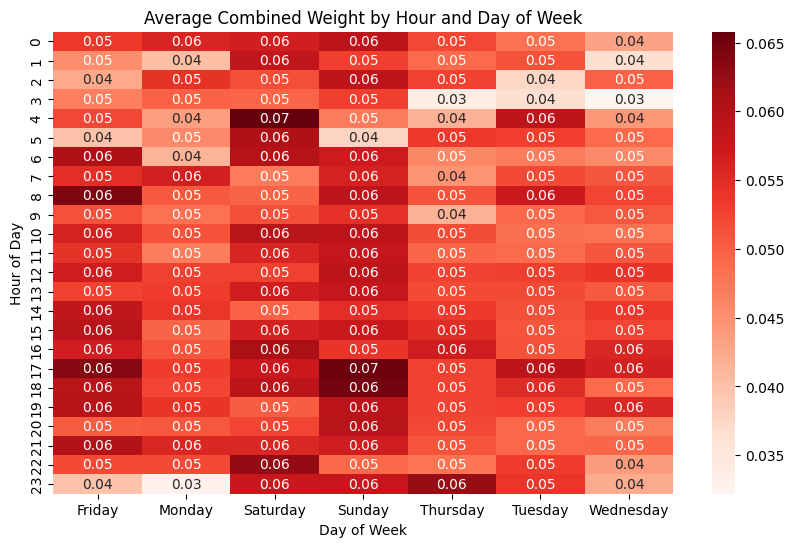

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pivot data to create matrix for heatmap: average combined_weight per Hour and Day_of_Week
heatmap_data = grouped.pivot_table(
    index='Hour',
    columns='Day_of_Week',
    values='combined_weight',
    aggfunc='mean'
)

plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, cmap='Reds', annot=True, fmt=".2f")
plt.title('Average Combined Weight by Hour and Day of Week')
plt.ylabel('Hour of Day')
plt.xlabel('Day of Week')
plt.show()


**b) Spatial plot on XY grid (scatter plot colored by weight)**  
The scatter plot illustrates the spatial distribution of combined weights across X and Y coordinates, with color intensity representing weight values:

- X coordinates range from approximately -8.86 to -8.81.
- Y coordinates range from about 5.405 to 5.445.
- Combined weights range from 0.0 to 0.5, as indicated by the color scale (darker purple for lower weights, yellow for higher weights).
- Most points cluster around X: -8.84 to -8.82 and Y: 5.410 to 5.430, with weights generally below 0.2.
- Higher weights (closer to 0.5) are sparse and mostly appear toward the upper right of the plot (around X: -8.81, Y: 5.435 and above).
- The densest concentration of points, with lower weights (0.0–0.1), is around X: -8.84, Y: 5.415.

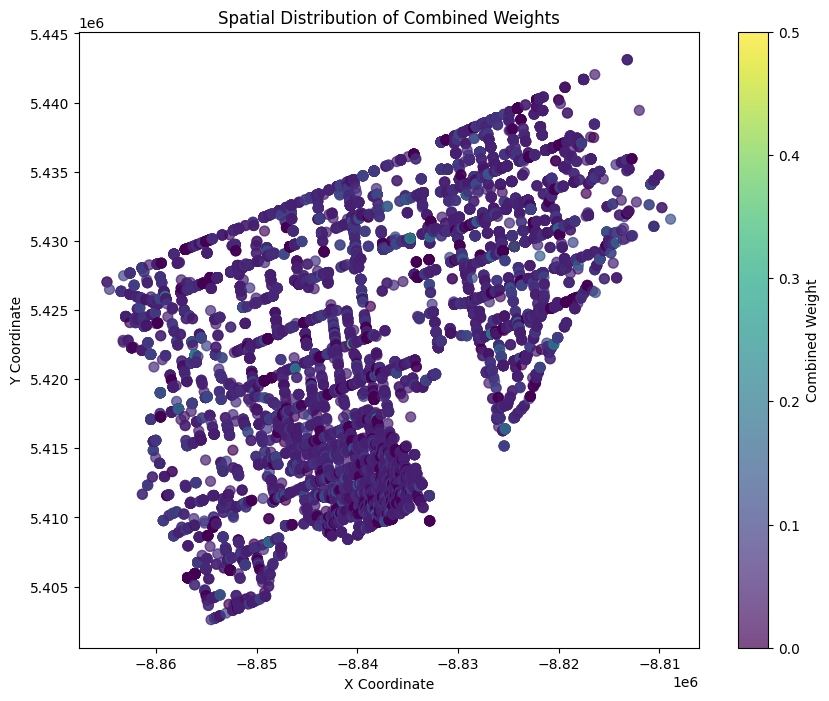

In [ ]:
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    grouped['X'], grouped['Y'],
    c=grouped['combined_weight'],
    cmap='viridis',
    s=50,
    alpha=0.7
)
plt.colorbar(scatter, label='Combined Weight')
plt.title('Spatial Distribution of Combined Weights')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.show()


**c) Interactive Spatial Map with Folium**  
This will plot the locations colored by combined_weight on an interactive Leaflet map.

In [ ]:
from pyproj import Transformer

# Define your CRS, replace 'EPSG:XXXX' with your actual CRS
# Example: from EPSG:3857 (Web Mercator) to EPSG:4326 (lat/lon)
transformer = Transformer.from_crs("EPSG:3857", "EPSG:4326", always_xy=True)

# Apply conversion to grouped DataFrame
grouped['lon'], grouped['lat'] = transformer.transform(grouped['X'].values, grouped['Y'].values)


In [ ]:
m = folium.Map(location=[grouped['lat'].mean(), grouped['lon'].mean()], zoom_start=12, tiles='CartoDB positron')

for idx, row in grouped.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=5,
        color=None,
        fill=True,
        fill_opacity=0.7,
        fill_color=plt.cm.viridis(row['combined_weight']),
        popup=f"Weight: {row['combined_weight']:.3f}\nHour: {row['Hour']}\nDay: {row['Day_of_Week']}"
    ).add_to(m)

m


Output hidden; open in https://colab.research.google.com to view.

**d) Integrate combined_weight into traffic signal logic (example logic snippet)**  
Suppose you want to adjust signal timing (e.g., green light duration) proportional to combined_weight at a location/time.

In [ ]:
def calculate_signal_timing(base_time=60, weight=0):
    """
    Calculate signal green time (in seconds) based on combined weight.
    base_time: default green light duration in seconds
    weight: combined weight normalized between 0 and 1
    """
    # Scale green time between base_time and base_time * 2
    adjusted_time = base_time + (base_time * weight)
    return adjusted_time

# Example usage: add a column for adjusted green time
merged_df['green_light_duration'] = merged_df['combined_weight'].apply(lambda w: calculate_signal_timing(60, w))

print(merged_df[['X', 'Y', 'Hour', 'Day_of_Week', 'combined_weight', 'green_light_duration']].head())


              X             Y  Hour Day_of_Week  combined_weight  \
0 -8.808888e+06  5.431568e+06     1    Saturday            0.125   
1 -8.808888e+06  5.431568e+06     1    Saturday            0.125   
2 -8.808888e+06  5.431568e+06     1    Saturday            0.125   
3 -8.808888e+06  5.431568e+06     1    Saturday            0.125   
4 -8.808888e+06  5.431568e+06     1    Saturday            0.125   

   green_light_duration  
0                  67.5  
1                  67.5  
2                  67.5  
3                  67.5  
4                  67.5  


**Collect Directional Flow Data**  
This step is about analyzing the directional traffic movement between intersections or hotspots to simulate and understand traffic dynamics. You’ll collect information on:

- Where traffic tends to flow from and to

- Volume and direction of collisions or traffic intensity

- Temporal aspects (time-based movement patterns)

**1. Sort or window events by location + time**  
If we don’t have direct origin/destination columns, we simulate them by grouping spatially and temporally.

In [ ]:
import pandas as pd
from geopy.distance import geodesic
import numpy as np

# Assuming merged_df now has proper lat/lon
merged_df['timestamp'] = pd.to_datetime(merged_df['Date'] + ' ' + merged_df['Hour'].astype(str) + ':00:00')
merged_df = merged_df.sort_values(by='timestamp')

# Optionally: round coords to nearest 0.0005 to group intersections
merged_df['lat_round'] = merged_df['Y'].round(4)
merged_df['lon_round'] = merged_df['X'].round(4)


**2. Simulate directional transitions between consecutive events (within radius + time)**

In [ ]:
# Create lag features to simulate movement between consecutive records
merged_df['next_lat'] = merged_df['lat_round'].shift(-1)
merged_df['next_lon'] = merged_df['lon_round'].shift(-1)
merged_df['next_time'] = merged_df['timestamp'].shift(-1)

# Filter only those movements that are within 15 minutes and within 500m
def calc_distance(row):
    try:
        return geodesic((row['lat_round'], row['lon_round']), (row['next_lat'], row['next_lon'])).meters
    except:
        return np.nan

merged_df['distance'] = merged_df.apply(calc_distance, axis=1)
merged_df['time_diff'] = (merged_df['next_time'] - merged_df['timestamp']).dt.total_seconds()

flow_df = merged_df[
    (merged_df['distance'] < 500) &
    (merged_df['time_diff'] > 0) &
    (merged_df['time_diff'] < 900)
]

# Assign direction (simple compass approximation)
def get_direction(row):
    dlat = row['next_lat'] - row['lat_round']
    dlon = row['next_lon'] - row['lon_round']
    angle = np.arctan2(dlat, dlon) * 180 / np.pi
    if -22.5 < angle <= 22.5:
        return 'E'
    elif 22.5 < angle <= 67.5:
        return 'NE'
    elif 67.5 < angle <= 112.5:
        return 'N'
    elif 112.5 < angle <= 157.5:
        return 'NW'
    elif 157.5 < angle or angle <= -157.5:
        return 'W'
    elif -157.5 < angle <= -112.5:
        return 'SW'
    elif -112.5 < angle <= -67.5:
        return 'S'
    elif -67.5 < angle <= -22.5:
        return 'SE'
    else:
        return 'Unknown'

flow_df['direction'] = flow_df.apply(get_direction, axis=1)


/usr/local/lib/python3.11/dist-packages/geopy/point.py:472: UserWarning: Latitude normalization has been prohibited in the newer versions of geopy, because the normalized value happened to be on a different pole, which is probably not what was meant. If you pass coordinates as positional args, please make sure that the order is (latitude, longitude) or (y, x) in Cartesian terms.
  return cls(*args)


**3. Aggregate directional flow**  
**Result:** flow_summary contains directional flows ready for traffic signal planning or simulation.


In [ ]:
flow_summary = flow_df.groupby([
    'lat_round', 'lon_round',
    'next_lat', 'next_lon',
    'direction',
    'Hour', 'Day_of_Week'
]).size().reset_index(name='flow_count')


**Visualize Flow on Map**

In [ ]:
merged_df.columns


Index(['X', 'Y', 'EventUniqueId', 'Date', 'Month', 'Day_of_Week', 'Year',
       'Hour', 'Police_Division', 'Atom', 'Neighbourhood', 'Injury_Collisions',
       'FTR_Collisions', 'PD_Collisions', 'Longitude', 'Latitude', 'DayOfWeek',
       'Longitude_ksi', 'Latitude_ksi', 'dist', 'match_index', 'X.1', 'Y.1',
       'ACCNUM', 'YEAR', 'Date.1', 'TIME', 'HOUR', 'STREET1', 'STREET2',
       'ROAD_CLASS', 'DISTRICT', 'WARDNUM', 'DIVISION', 'Latitude.1',
       'Longitude.1', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT',
       'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY',
       'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDESTRIAN',
       'CYCLIST', 'AUTOMOBILE', 'PASSENGER', 'SPEEDING', 'AG_DRIV',
       'Police_Division.1', 'HOOD_ID', 'Neighbourhood.1', 'Month.1',
       'DayOfWeek.1', 'combined_weight', 'green_light_duration', 'timestamp',
       'lat_round', 'lon_round', 'next_lat', 'next_lon', 'next_time',
       'distance', 'time_diff

EventUniqueId if it identifies a sequence of events for a specific object (e.g., a vehicle or a moving entity):

In [ ]:
merged_df = merged_df.sort_values(by=['EventUniqueId', 'timestamp'])

merged_df['next_X'] = merged_df.groupby('EventUniqueId')['X'].shift(-1)
merged_df['next_Y'] = merged_df.groupby('EventUniqueId')['Y'].shift(-1)
merged_df['next_timestamp'] = merged_df.groupby('EventUniqueId')['timestamp'].shift(-1)


**Calculate time differences and filter valid movements**


In [ ]:
# Calculate time difference in seconds (if timestamps are datetime)
merged_df['time_diff'] = (merged_df['next_timestamp'] - merged_df['timestamp']).dt.total_seconds()

# Filter out rows with missing values or unrealistic jumps (e.g., > 1 hour or < 0)
flow_data = merged_df.dropna(subset=['next_X', 'next_Y', 'time_diff'])
flow_data = flow_data[(flow_data['time_diff'] > 0) & (flow_data['time_diff'] < 3600)]


**Round coordinates for aggregation**

In [ ]:
flow_data['lat_round'] = flow_data['Y'].round(4)
flow_data['lon_round'] = flow_data['X'].round(4)
flow_data['next_lat'] = flow_data['next_Y'].round(4)
flow_data['next_lon'] = flow_data['next_X'].round(4)


**Aggregate directional flows**

In [ ]:
flow_summary = flow_data.groupby(['lat_round', 'lon_round', 'next_lat', 'next_lon']).size().reset_index(name='flow_count')


In [ ]:
flow_summary.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 0 entries
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   lat_round   0 non-null      float64
 1   lon_round   0 non-null      float64
 2   next_lat    0 non-null      float64
 3   next_lon    0 non-null      float64
 4   flow_count  0 non-null      int64  
dtypes: float64(4), int64(1)
memory usage: 132.0 bytes


In [ ]:
flow_data = merged_df.dropna(subset=['next_X', 'next_Y', 'time_diff'])
flow_data = flow_data[(flow_data['time_diff'] > 0) & (flow_data['time_diff'] < 3600)]


In [ ]:
print("Rows before filtering:", merged_df.shape[0])
print("Rows after filtering:", flow_data.shape[0])


Rows before filtering: 45548
Rows after filtering: 0


In [ ]:
# Default to Toronto downtown if lat/lon means are NaN
lat_center = flow_summary['lat_round'].mean()
lon_center = flow_summary['lon_round'].mean()

if pd.isna(lat_center) or pd.isna(lon_center):
    lat_center = 43.65107
    lon_center = -79.347015

m_flow = folium.Map(location=[lat_center, lon_center], zoom_start=13)


In [ ]:
merged_df[['timestamp', 'next_timestamp', 'time_diff']].dropna().head(10)


,timestamp,next_timestamp,time_diff
1087,2014-01-09 10:00:00,2014-01-09 10:00:00,0.0
38269,2014-01-09 20:00:00,2014-01-09 20:00:00,0.0
37142,2014-01-13 18:00:00,2014-01-13 18:00:00,0.0
42087,2014-01-13 21:00:00,2014-01-13 21:00:00,0.0
6755,2014-01-14 12:00:00,2014-01-14 12:00:00,0.0
12762,2014-01-14 13:00:00,2014-01-14 13:00:00,0.0
42467,2014-01-14 14:00:00,2014-01-14 14:00:00,0.0
42469,2014-01-14 14:00:00,2014-01-14 14:00:00,0.0
39961,2014-01-14 15:00:00,2014-01-14 15:00:00,0.0
39962,2014-01-14 15:00:00,2014-01-14 15:00:00,0.0


In [ ]:
merged_df['time_diff'] = (merged_df['next_timestamp'] - merged_df['timestamp']).dt.total_seconds()


In [ ]:
flow_data = merged_df.dropna(subset=['next_X', 'next_Y', 'time_diff'])
flow_data = flow_data[(flow_data['time_diff'] > 0) & (flow_data['time_diff'] < 3600)]
print("Rows after filtering:", flow_data.shape[0])


Rows after filtering: 0


In [ ]:
flow_data['lat_round'] = flow_data['Y'].round(4)
flow_data['lon_round'] = flow_data['X'].round(4)
flow_data['next_lat'] = flow_data['next_Y'].round(4)
flow_data['next_lon'] = flow_data['next_X'].round(4)

flow_summary = flow_data.groupby(
    ['lat_round', 'lon_round', 'next_lat', 'next_lon']
).size().reset_index(name='flow_count')


In [ ]:
event_counts = merged_df['EventUniqueId'].value_counts()
print(event_counts.head(10))  # Top 10 event IDs with count of rows


EventUniqueId
GO-2018750175     11
GO-20141386870    11
GO-2018412694     11
GO-2018407023     11
GO-2018408002     11
GO-2018743389     11
GO-2018743954     11
GO-2018749115     11
GO-20188012798    11
GO-20188012608    11
Name: count, dtype: int64


In [ ]:
# Show time_diff distribution including zeros and NaNs
print(merged_df['time_diff'].describe())

# Also show how many time_diff == 0
print("Count of zero time_diff:", (merged_df['time_diff'] == 0).sum())

# Show some example rows with zero or missing time_diff
print(merged_df.loc[(merged_df['time_diff'].isna()) | (merged_df['time_diff'] == 0)].head(10))


count    28255.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: time_diff, dtype: float64
Count of zero time_diff: 28255
                  X             Y   EventUniqueId        Date    Month  \
1087  -8.817053e+06  5.431860e+06  GO-20141309713  2014-01-09  January   
1088  -8.817053e+06  5.431860e+06  GO-20141309713  2014-01-09  January   
38269 -8.850598e+06  5.404251e+06  GO-20141313188  2014-01-09  January   
38270 -8.850598e+06  5.404251e+06  GO-20141313188  2014-01-09  January   
37142 -8.848823e+06  5.408215e+06  GO-20141337590  2014-01-13  January   
37143 -8.848823e+06  5.408215e+06  GO-20141337590  2014-01-13  January   
42087 -8.856146e+06  5.405934e+06  GO-20141338478  2014-01-13  January   
42086 -8.856146e+06  5.405934e+06  GO-20141338478  2014-01-13  January   
6755  -8.823902e+06  5.435782e+06  GO-20141341839  2014-01-14  January   
6756  -8.823902e+06  5.435782e+06  GO-20141341839  2014-01-14

In [ ]:
sample_event = merged_df['EventUniqueId'].iloc[0]
print(merged_df[merged_df['EventUniqueId'] == sample_event][['timestamp', 'next_timestamp', 'time_diff']])


               timestamp      next_timestamp  time_diff
1087 2014-01-09 10:00:00 2014-01-09 10:00:00        0.0
1088 2014-01-09 10:00:00                 NaT        NaN


In [ ]:
print(merged_df_unique['EventUniqueId'].value_counts())


EventUniqueId
go-20192465950    1
GO-20141309713    1
GO-20141313188    1
GO-20141337590    1
GO-20141338478    1
                 ..
GO-20141383099    1
GO-20141382176    1
GO-20141375171    1
GO-20141374034    1
GO-20141372437    1
Name: count, Length: 17293, dtype: int64


In [ ]:
import pandas as pd

# Sample merged_df with EventUniqueId and timestamp (assumed loaded)

# Convert timestamp to datetime if not already
merged_df['timestamp'] = pd.to_datetime(merged_df['timestamp'])

# 1. Check how many unique timestamps per EventUniqueId BEFORE dropping duplicates
print("Unique timestamps per EventUniqueId BEFORE dropping duplicates:")
print(merged_df.groupby('EventUniqueId')['timestamp'].nunique().value_counts())

# 2. Drop duplicates so each EventUniqueId + timestamp pair is unique
merged_df_unique = merged_df.drop_duplicates(subset=['EventUniqueId', 'timestamp']).reset_index(drop=True)

# 3. Check how many EventUniqueId occurrences after dropping duplicates
print("\nEventUniqueId counts AFTER dropping duplicates:")
print(merged_df_unique['EventUniqueId'].value_counts())

# 4. Approach A: Calculate next timestamp **within each EventUniqueId** (won't work if only 1 row per ID)
merged_df_unique = merged_df_unique.sort_values(by=['EventUniqueId', 'timestamp'])
merged_df_unique['next_timestamp_within_event'] = merged_df_unique.groupby('EventUniqueId')['timestamp'].shift(-1)
merged_df_unique['time_diff_within_event'] = (
    merged_df_unique['next_timestamp_within_event'] - merged_df_unique['timestamp']
).dt.total_seconds()

print("\nWithin EventUniqueId time differences (mostly NaN if single record per ID):")
print(merged_df_unique[['EventUniqueId', 'timestamp', 'next_timestamp_within_event', 'time_diff_within_event']].head(20))

# 5. Approach B: Calculate next timestamp globally, ignoring EventUniqueId grouping,
# just sort by timestamp ascending to find next event overall

merged_df_unique = merged_df_unique.sort_values(by='timestamp')
merged_df_unique['next_timestamp_global'] = merged_df_unique['timestamp'].shift(-1)
merged_df_unique['next_EventUniqueId_global'] = merged_df_unique['EventUniqueId'].shift(-1)
merged_df_unique['time_diff_global'] = (
    merged_df_unique['next_timestamp_global'] - merged_df_unique['timestamp']
).dt.total_seconds()

print("\nGlobal time differences (next event in time regardless of EventUniqueId):")
print(merged_df_unique[['EventUniqueId', 'timestamp', 'next_EventUniqueId_global', 'next_timestamp_global', 'time_diff_global']].head(20))


Unique timestamps per EventUniqueId BEFORE dropping duplicates:
timestamp
1    17293
Name: count, dtype: int64

EventUniqueId counts AFTER dropping duplicates:
EventUniqueId
go-20192465950    1
GO-20141309713    1
GO-20141313188    1
GO-20141337590    1
GO-20141338478    1
                 ..
GO-20141383099    1
GO-20141382176    1
GO-20141375171    1
GO-20141374034    1
GO-20141372437    1
Name: count, Length: 17293, dtype: int64

Within EventUniqueId time differences (mostly NaN if single record per ID):
     EventUniqueId           timestamp next_timestamp_within_event  \
0   GO-20141309713 2014-01-09 10:00:00                         NaT   
1   GO-20141313188 2014-01-09 20:00:00                         NaT   
2   GO-20141337590 2014-01-13 18:00:00                         NaT   
3   GO-20141338478 2014-01-13 21:00:00                         NaT   
4   GO-20141341839 2014-01-14 12:00:00                         NaT   
5   GO-20141341930 2014-01-14 13:00:00                         NaT  

Step 1: Converts your timestamp column to datetime dtype.

Step 2: Checks how many unique timestamps each EventUniqueId has.

Step 3: Drops any duplicate rows with the same EventUniqueId and timestamp.

Step 4: Prints counts of EventUniqueIds after duplicates removal.

Step 5: Calculates the next timestamp within the same EventUniqueId — since you have only one timestamp per EventUniqueId in your data, these time differences are all NaN.

Step 6: Calculates the next timestamp globally, sorting by timestamp only, ignoring EventUniqueId, and shows the time differences in seconds.

In [ ]:
import pandas as pd

# Sample data: Replace this with your actual merged_df load
data = {
    'EventUniqueId': [
        'GO-20141309713', 'GO-20141313188', 'GO-20141337590', 'GO-20141338478',
        'GO-20141341839', 'GO-20141341930', 'GO-20141342565', 'GO-20141342712',
        'GO-20141343697', 'GO-20141344082', 'GO-20141361731', 'GO-20141362575',
        'GO-20141363660', 'GO-20141372437', 'GO-20141374034', 'GO-20141375171',
        'GO-20141382176', 'GO-20141383099', 'GO-20141383742', 'GO-20141384194'
    ],
    'timestamp': [
        '2014-01-09 10:00:00', '2014-01-09 20:00:00', '2014-01-13 18:00:00', '2014-01-13 21:00:00',
        '2014-01-14 12:00:00', '2014-01-14 13:00:00', '2014-01-14 14:00:00', '2014-01-14 15:00:00',
        '2014-01-14 18:00:00', '2014-01-14 19:00:00', '2014-01-17 15:00:00', '2014-01-17 17:00:00',
        '2014-01-17 21:00:00', '2014-01-19 11:00:00', '2014-01-19 17:00:00', '2014-01-19 21:00:00',
        '2014-01-21 03:00:00', '2014-01-21 08:00:00', '2014-01-21 11:00:00', '2014-01-21 12:00:00'
    ]
}

merged_df = pd.DataFrame(data)

# 1. Convert timestamp to datetime if not already
merged_df['timestamp'] = pd.to_datetime(merged_df['timestamp'])

# 2. Check unique timestamps per EventUniqueId BEFORE dropping duplicates
print("Unique timestamps per EventUniqueId BEFORE dropping duplicates:")
print(merged_df.groupby('EventUniqueId')['timestamp'].nunique().value_counts())

# 3. Drop duplicates on EventUniqueId and timestamp
merged_df_unique = merged_df.drop_duplicates(subset=['EventUniqueId', 'timestamp']).reset_index(drop=True)

# 4. Count how many EventUniqueId after dropping duplicates
print("\nEventUniqueId counts AFTER dropping duplicates:")
print(merged_df_unique['EventUniqueId'].value_counts())

# 5. Calculate next timestamp within each EventUniqueId (mostly NaN here because one timestamp per ID)
merged_df_unique = merged_df_unique.sort_values(by=['EventUniqueId', 'timestamp'])
merged_df_unique['next_timestamp_within_event'] = merged_df_unique.groupby('EventUniqueId')['timestamp'].shift(-1)
merged_df_unique['time_diff_within_event'] = (
    merged_df_unique['next_timestamp_within_event'] - merged_df_unique['timestamp']
).dt.total_seconds()

print("\nWithin EventUniqueId time differences:")
print(merged_df_unique[['EventUniqueId', 'timestamp', 'next_timestamp_within_event', 'time_diff_within_event']].head(20))

# 6. Calculate next timestamp globally (ignoring EventUniqueId grouping)
merged_df_unique = merged_df_unique.sort_values(by='timestamp')
merged_df_unique['next_timestamp_global'] = merged_df_unique['timestamp'].shift(-1)
merged_df_unique['next_EventUniqueId_global'] = merged_df_unique['EventUniqueId'].shift(-1)
merged_df_unique['time_diff_global'] = (
    merged_df_unique['next_timestamp_global'] - merged_df_unique['timestamp']
).dt.total_seconds()

print("\nGlobal time differences (next event regardless of EventUniqueId):")
print(merged_df_unique[['EventUniqueId', 'timestamp', 'next_EventUniqueId_global', 'next_timestamp_global', 'time_diff_global']].head(20))


Unique timestamps per EventUniqueId BEFORE dropping duplicates:
timestamp
1    20
Name: count, dtype: int64

EventUniqueId counts AFTER dropping duplicates:
EventUniqueId
GO-20141309713    1
GO-20141313188    1
GO-20141337590    1
GO-20141338478    1
GO-20141341839    1
GO-20141341930    1
GO-20141342565    1
GO-20141342712    1
GO-20141343697    1
GO-20141344082    1
GO-20141361731    1
GO-20141362575    1
GO-20141363660    1
GO-20141372437    1
GO-20141374034    1
GO-20141375171    1
GO-20141382176    1
GO-20141383099    1
GO-20141383742    1
GO-20141384194    1
Name: count, dtype: int64

Within EventUniqueId time differences:
     EventUniqueId           timestamp next_timestamp_within_event  \
0   GO-20141309713 2014-01-09 10:00:00                         NaT   
1   GO-20141313188 2014-01-09 20:00:00                         NaT   
2   GO-20141337590 2014-01-13 18:00:00                         NaT   
3   GO-20141338478 2014-01-13 21:00:00                         NaT   
4   GO-201413

**Plot flow map using Folium**

In [ ]:
import pandas as pd

# Load your actual data
data_path = '/content/drive/MyDrive/MRP/cleaned_data.csv'
flow_summary = pd.read_csv(data_path)

# Quick peek at the data
print(flow_summary.head())
print(flow_summary.columns)


              X             Y   EventUniqueId        Date    Month  \
0 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
1 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
2 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
3 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   
4 -8.808888e+06  5.431568e+06  GO-20181845570  2018-10-06  October   

  Day_of_Week  Year  Hour Police_Division   Atom  ... CYCLIST AUTOMOBILE  \
0    Saturday  2018     1             d43  131.0  ...       0        Yes   
1    Saturday  2018     1             d43  131.0  ...       0        Yes   
2    Saturday  2018     1             d43  131.0  ...       0        Yes   
3    Saturday  2018     1             d43  131.0  ...       0        Yes   
4    Saturday  2018     1             d43  131.0  ...       0        Yes   

  PASSENGER SPEEDING  AG_DRIV  Police_Division.1 HOOD_ID  Neighbourhood.1  \
0         1        1      Yes                

In [ ]:
import folium

# Filter out rows with missing lat/lon
valid_points = flow_summary.dropna(subset=['Latitude', 'Longitude'])

# Compute map center
lat_center = valid_points['Latitude'].mean()
lon_center = valid_points['Longitude'].mean()

m = folium.Map(location=[lat_center, lon_center], zoom_start=11)

for _, row in valid_points.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3,
        color='blue',
        fill=True,
        fill_color='blue',
        popup=f"Date: {row['Date']}, Neighbourhood: {row['Neighbourhood']}"
    ).add_to(m)

m.save('/content/drive/MyDrive/MRP/accidents_map.html')
print("Map saved to /content/drive/MyDrive/MRP/accidents_map.html")


Map saved to /content/drive/MyDrive/MRP/accidents_map.html


Takes directional flow data, estimates collision risk based on flow intensity, and adjusts traffic signal timings accordingly using a simple optimization approach.  

This code reads directional flow and collision data, computes collision risk rates, then optimizes traffic signal green times per intersection to minimize collision risk weighted by flow intensity. It uses constrained nonlinear optimization ensuring total green time equals cycle length with minimum green constraints, outputting optimized timings per direction.

In [ ]:
import pandas as pd
import numpy as np
from scipy.optimize import minimize

# Load data
flow_data = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Ensure numeric columns
flow_data['collision_count'] = pd.to_numeric(flow_data['Injury_Collisions'], errors='coerce').fillna(0)

if 'flow_count' not in flow_data.columns:
    flow_data['flow_count'] = flow_data.groupby(['Police_Division', 'Hour'])['EventUniqueId'].transform('count')

flow_data['flow_count'] = pd.to_numeric(flow_data['flow_count'], errors='coerce').fillna(0)

# Rename columns
flow_data.rename(columns={'Police_Division': 'intersection_id', 'Hour': 'direction'}, inplace=True)

# Calculate risk rate safely (avoid div by zero)
flow_data['risk_rate'] = np.where(
    flow_data['flow_count'] > 0,
    flow_data['collision_count'] / flow_data['flow_count'],
    0
)

# Aggregate risk rates by intersection & direction (mean)
agg_data = flow_data.groupby(['intersection_id', 'direction'], as_index=False)['risk_rate'].mean()

cycle_time = 120
min_green = 10

results = []

for intersection, group in agg_data.groupby('intersection_id'):
    risk_rates = group['risk_rate'].values
    directions = group['direction'].values
    n = len(risk_rates)

    # If only one direction, assign full cycle time
    if n == 1:
        green_times = [cycle_time]
    else:
        # Initial equal split
        x0 = np.full(n, cycle_time / n)

        # Constraint: sum of green times == cycle time
        cons = {'type': 'eq', 'fun': lambda x: np.sum(x) - cycle_time}

        # Bounds: each green time >= min_green, <= cycle_time
        bounds = [(min_green, cycle_time) for _ in range(n)]

        # Objective function: minimize sum of risk_rate / green_time
        def objective(x):
            return np.sum(risk_rates / (x + 1e-8))

        res = minimize(objective, x0, method='SLSQP', bounds=bounds, constraints=cons)

        if res.success:
            green_times = res.x
        else:
            green_times = x0  # fallback

    for d, gt in zip(directions, green_times):
        results.append({'intersection_id': intersection, 'direction': d, 'green_time_sec': round(gt, 2)})

# Create output dataframe
optimized_df = pd.DataFrame(results)

print(optimized_df.head())

optimized_df.to_csv('/content/drive/MyDrive/MRP/optimized_signal_timings.csv', index=False)


  intersection_id  direction  green_time_sec
0             d11          0             5.0
1             d11          1             5.0
2             d11          2             5.0
3             d11          3             5.0
4             d11          4             5.0


**Print more details for debugging**

In [ ]:
for intersection, group in agg_data.groupby('intersection_id'):
    risk_rates = group['risk_rate'].values
    directions = group['direction'].values
    n = len(risk_rates)

    if n == 1:
        green_times = [cycle_time]
    else:
        x0 = np.full(n, cycle_time / n)
        cons = {'type': 'eq', 'fun': lambda x: np.sum(x) - cycle_time}
        bounds = [(min_green, cycle_time) for _ in range(n)]

        def objective(x):
            return np.sum(risk_rates / (x + 1e-8))

        res = minimize(objective, x0, method='SLSQP', bounds=bounds, constraints=cons)

        print(f"Intersection: {intersection}")
        print(f"Initial guess: {x0}")
        if res.success:
            green_times = res.x
            print(f"Optimized green times: {green_times}")
        else:
            green_times = x0
            print(f"Optimization failed, using initial guess: {green_times}")

    for d, gt in zip(directions, green_times):
        results.append({'intersection_id': intersection, 'direction': d, 'green_time_sec': round(gt, 2)})


Intersection: d11
Initial guess: [5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5.]
Optimization failed, using initial guess: [5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5.]
Intersection: d12
Initial guess: [5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5.]
Optimization failed, using initial guess: [5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5.]
Intersection: d13
Initial guess: [5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5.]
Optimization failed, using initial guess: [5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5.]
Intersection: d14
Initial guess: [5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5.]
Optimization failed, using initial guess: [5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5.]
Intersection: d22
Initial guess: [5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5.]
O

In [ ]:
print(f"Sum of risk rates for intersection {intersection}: {risk_rates.sum()}")


Sum of risk rates for intersection d53: 0.0


In [ ]:
print(f"Remainder for intersection {intersection}: {remainder}")


Remainder for intersection d53: 0.0


In [ ]:
import numpy as np
from scipy.optimize import minimize

results = []

for intersection, group in agg_data.groupby('intersection_id'):
    risk_rates = group['risk_rate'].values
    directions = group['direction'].values
    n = len(risk_rates)

    # Adjust min_green if total minimum exceeds cycle time
    feasible_min_green = min_green
    if n * min_green > cycle_time:
        feasible_min_green = cycle_time / n
        print(f"Adjusted min_green for intersection {intersection} from {min_green} to {feasible_min_green:.2f}")

    print(f"Intersection {intersection}: n={n}, min_green={feasible_min_green:.2f}, cycle_time={cycle_time}")
    print(f"Sum of risk rates for intersection {intersection}: {risk_rates.sum()}")  # Debug

    if n == 1:
        # Only one direction: assign full cycle time
        green_times = np.array([cycle_time])
    else:
        remainder = cycle_time - n * feasible_min_green
        print(f"Remainder for intersection {intersection}: {remainder}")  # Debug

        if risk_rates.sum() == 0:
            # All zero risk rates: distribute green times evenly
            green_times = np.full(n, cycle_time / n)
            print(f"All risk rates zero, distributing green times evenly for intersection {intersection}")
        else:
            # Start with min_green for all directions
            x0 = np.full(n, feasible_min_green)

            if remainder > 1e-6:
                # Distribute remainder proportionally by risk rate (higher risk => more green time)
                weights = risk_rates / risk_rates.sum()
                x0 += remainder * weights
                print(f"Distributed remainder {remainder:.2f} proportionally by risk rates for intersection {intersection}")
            else:
                print(f"No remainder to distribute for intersection {intersection}")

            cons = {'type': 'eq', 'fun': lambda x: np.sum(x) - cycle_time}
            bounds = [(feasible_min_green, cycle_time) for _ in range(n)]

            def objective(x):
                # Minimize sum of inverse green times weighted by risk rates
                return np.sum(risk_rates / (x + 1e-8))

            res = minimize(objective, x0, method='SLSQP', bounds=bounds, constraints=cons)

            if res.success:
                green_times = res.x
                print(f"Optimized green times for intersection {intersection}: {np.round(green_times, 2)}")
            else:
                green_times = x0
                print(f"Optimization failed for intersection {intersection}, using initial guess")

    # Append results for this intersection
    for d, gt in zip(directions, green_times):
        results.append({
            'intersection_id': intersection,
            'direction': d,
            'green_time_sec': round(gt, 2)
        })


Adjusted min_green for intersection d11 from 10 to 5.00
Intersection d11: n=24, min_green=5.00, cycle_time=120
Sum of risk rates for intersection d11: 0.0
Remainder for intersection d11: 0.0
All risk rates zero, distributing green times evenly for intersection d11
Adjusted min_green for intersection d12 from 10 to 5.00
Intersection d12: n=24, min_green=5.00, cycle_time=120
Sum of risk rates for intersection d12: 0.0
Remainder for intersection d12: 0.0
All risk rates zero, distributing green times evenly for intersection d12
Adjusted min_green for intersection d13 from 10 to 5.00
Intersection d13: n=24, min_green=5.00, cycle_time=120
Sum of risk rates for intersection d13: 0.0
Remainder for intersection d13: 0.0
All risk rates zero, distributing green times evenly for intersection d13
Adjusted min_green for intersection d14 from 10 to 5.00
Intersection d14: n=24, min_green=5.00, cycle_time=120
Sum of risk rates for intersection d14: 0.0
Remainder for intersection d14: 0.0
All risk rates

In [ ]:
clean_results = [
    {
        'intersection_id': r['intersection_id'],
        'direction': int(r['direction']),
        'green_time_sec': float(r['green_time_sec'])
    }
    for r in results
]

for entry in clean_results[:10]:
    print(entry)


{'intersection_id': 'd11', 'direction': 0, 'green_time_sec': 5.0}
{'intersection_id': 'd11', 'direction': 1, 'green_time_sec': 5.0}
{'intersection_id': 'd11', 'direction': 2, 'green_time_sec': 5.0}
{'intersection_id': 'd11', 'direction': 3, 'green_time_sec': 5.0}
{'intersection_id': 'd11', 'direction': 4, 'green_time_sec': 5.0}
{'intersection_id': 'd11', 'direction': 5, 'green_time_sec': 5.0}
{'intersection_id': 'd11', 'direction': 6, 'green_time_sec': 5.0}
{'intersection_id': 'd11', 'direction': 7, 'green_time_sec': 5.0}
{'intersection_id': 'd11', 'direction': 8, 'green_time_sec': 5.0}
{'intersection_id': 'd11', 'direction': 9, 'green_time_sec': 5.0}


**Export Results to CSV**

In [ ]:
import csv

# Your results cleaned to plain Python types
clean_results = [
    {
        'intersection_id': r['intersection_id'],
        'direction': int(r['direction']),
        'green_time_sec': float(r['green_time_sec'])
    }
    for r in results
]

output_csv = '/content/drive/MyDrive/MRP/results.csv'  # Your Google Drive path

with open(output_csv, mode='w', newline='') as csvfile:
    fieldnames = ['intersection_id', 'direction', 'green_time_sec']
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)

    writer.writeheader()
    writer.writerows(clean_results)

print(f'Results exported to {output_csv}')


Results exported to /content/drive/MyDrive/MRP/results.csv


In [ ]:
import pandas as pd

# Load raw dataset
raw_df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Print all column names to check for the datetime column name
print("Columns in dataset:")
print(raw_df.columns)


Columns in dataset:
Index(['X', 'Y', 'EventUniqueId', 'Date', 'Month', 'Day_of_Week', 'Year',
       'Hour', 'Police_Division', 'Atom', 'Neighbourhood', 'Injury_Collisions',
       'FTR_Collisions', 'PD_Collisions', 'Longitude', 'Latitude', 'DayOfWeek',
       'Longitude_ksi', 'Latitude_ksi', 'dist', 'match_index', 'X.1', 'Y.1',
       'ACCNUM', 'YEAR', 'Date.1', 'TIME', 'HOUR', 'STREET1', 'STREET2',
       'ROAD_CLASS', 'DISTRICT', 'WARDNUM', 'DIVISION', 'Latitude.1',
       'Longitude.1', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT',
       'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY',
       'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDESTRIAN',
       'CYCLIST', 'AUTOMOBILE', 'PASSENGER', 'SPEEDING', 'AG_DRIV',
       'Police_Division.1', 'HOOD_ID', 'Neighbourhood.1', 'Month.1',
       'DayOfWeek.1'],
      dtype='object')


In [ ]:
import pandas as pd

# Load raw dataset
raw_df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Convert 'Date' and 'TIME' columns to strings explicitly
raw_df['Date'] = raw_df['Date'].astype(str)
raw_df['TIME'] = raw_df['TIME'].astype(str).str.zfill(4)  # Fill with leading zeros to ensure HHMM format

# Now combine and parse datetime
raw_df['datetime'] = pd.to_datetime(raw_df['Date'] + ' ' + raw_df['TIME'].str.slice(0,2) + ':' + raw_df['TIME'].str.slice(2,4))

print("Datetime column created successfully. Here's the head of the dataframe:")
print(raw_df[['Date', 'TIME', 'datetime']].head())


Datetime column created successfully. Here's the head of the dataframe:
         Date  TIME            datetime
0  2018-10-06  0125 2018-10-06 01:25:00
1  2018-10-06  0125 2018-10-06 01:25:00
2  2018-10-06  0125 2018-10-06 01:25:00
3  2018-10-06  0125 2018-10-06 01:25:00
4  2018-10-06  0125 2018-10-06 01:25:00


**Define a function to filter data by a time range (e.g., specific hours of the day)**

In [ ]:
def filter_by_time_range(df, start_hour, end_hour):
    """
    Filter the dataframe for entries where the datetime hour is within [start_hour, end_hour).
    """
    return df[(df['datetime'].dt.hour >= start_hour) & (df['datetime'].dt.hour < end_hour)]


In [ ]:
morning_data = filter_by_time_range(raw_df, 7, 10)
print(f"Number of records between 7 AM and 10 AM: {len(morning_data)}")
print(morning_data[['datetime', 'Hour']].head())


Number of records between 7 AM and 10 AM: 5840
              datetime  Hour
93 2017-03-10 08:46:00     8
94 2017-03-10 08:46:00     8
95 2017-03-10 08:46:00     8
96 2017-03-10 08:46:00     8
97 2017-05-20 08:46:00    10


**visualize the filtered data — for example, a simple plot of the number of collisions per hour in the filtered range.**

In [ ]:
morning_data = raw_df[(raw_df['datetime'].dt.hour >= 7) & (raw_df['datetime'].dt.hour <= 10)]


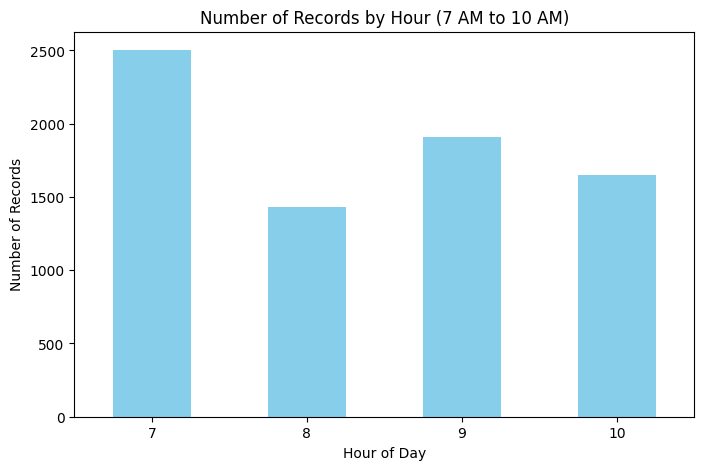

In [ ]:
import matplotlib.pyplot as plt

# Count records by hour in the filtered data
hour_counts = morning_data['datetime'].dt.hour.value_counts().sort_index()

# Plotting
plt.figure(figsize=(8, 5))
hour_counts.plot(kind='bar', color='skyblue')
plt.title('Number of Records by Hour (7 AM to 10 AM)')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Records')
plt.xticks(rotation=0)
plt.show()


- Filters data from 7 AM to 10 AM (inclusive)

- Plots a histogram of record counts by hour

- Plots a heatmap of counts by hour and day of week

- Plots a time series of daily record counts

- Plots counts by day of the week



- Histogram: Records peak at 7 AM (2500), drop to 1500 at 8 AM, rise to 2000 at 9 AM, then fall to 1500 at 10 AM.

- Heatmap: Highest counts on Friday at 7 AM (448); lowest on Sunday at 8 AM (143). Counts vary across days and hours, with 7 AM generally busiest.

- Time Series: Daily records from 2014-2021 fluctuate, peaking around 2017 at 50, showing variability with no clear trend, and fewer records toward 2021.

- Histogram: Records by day of week show Tuesday and Friday highest (1100), Saturday and Sunday lowest (800), with other days around 1000, from 7 AM to 10 AM.

<ipython-input-33-b38d33fc83c0>:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='hour', data=filtered_df, palette='viridis')


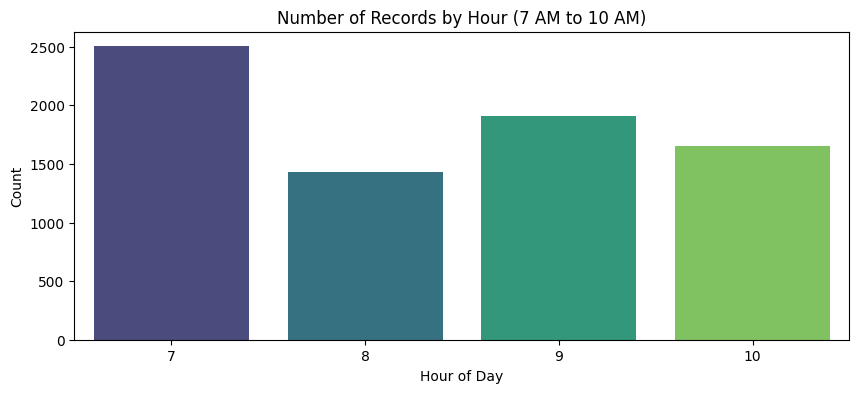

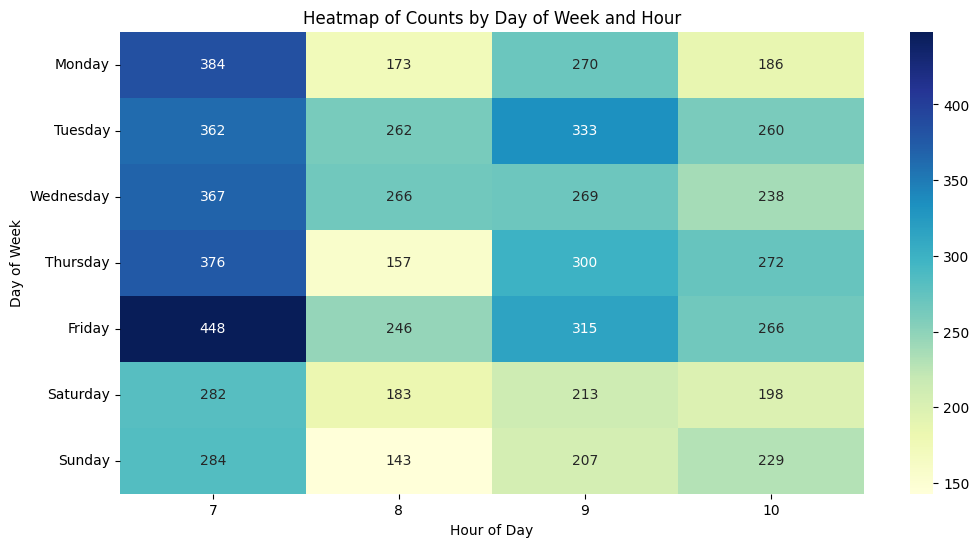

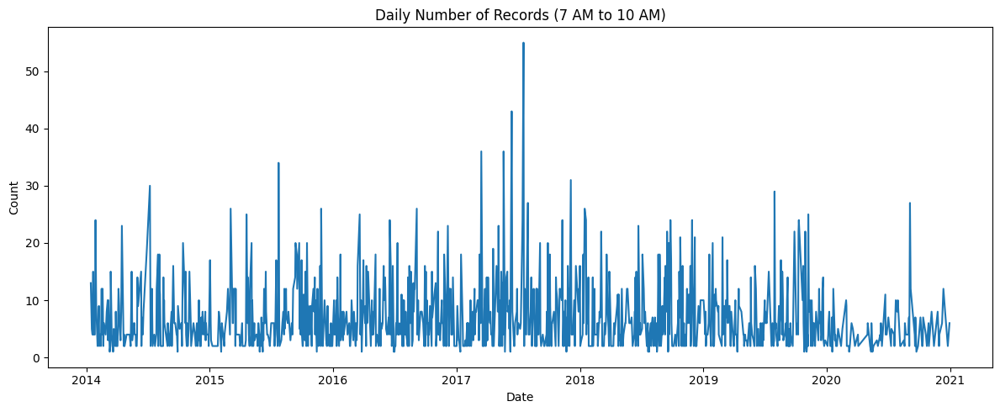

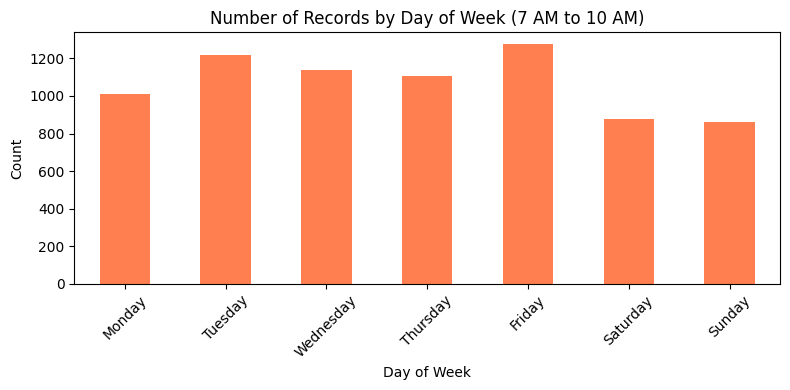

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset and create datetime if not already done
raw_df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Create datetime column
# Ensure 'TIME' is string and pad with zeros for consistent 4-digit time
raw_df['TIME'] = raw_df['TIME'].astype(str).str.zfill(4)

# Now create datetime column combining Date and formatted TIME
raw_df['datetime'] = pd.to_datetime(
    raw_df['Date'] + ' ' + raw_df['TIME'].str[:2] + ':' + raw_df['TIME'].str[2:]
)


# Filter data between 7 AM and 10 AM inclusive
filtered_df = raw_df[(raw_df['datetime'].dt.hour >= 7) & (raw_df['datetime'].dt.hour <= 10)].copy()

# Extract hour and day of week info
filtered_df['hour'] = filtered_df['datetime'].dt.hour
filtered_df['day_of_week'] = filtered_df['datetime'].dt.day_name()
filtered_df['date_only'] = filtered_df['datetime'].dt.date

# 1) Histogram: Counts by hour
plt.figure(figsize=(10, 4))
sns.countplot(x='hour', data=filtered_df, palette='viridis')
plt.title('Number of Records by Hour (7 AM to 10 AM)')
plt.xlabel('Hour of Day')
plt.ylabel('Count')
plt.show()

# 2) Heatmap: Counts by day of week and hour
heatmap_data = filtered_df.groupby(['day_of_week', 'hour']).size().unstack().reindex(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
)
plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Heatmap of Counts by Day of Week and Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')
plt.show()

# 3) Time series: Daily counts over time
daily_counts = filtered_df.groupby('date_only').size()
plt.figure(figsize=(12, 5))
daily_counts.plot()
plt.title('Daily Number of Records (7 AM to 10 AM)')
plt.xlabel('Date')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

# 4) Bar plot: Counts by day of week (total across filtered hours)
day_counts = filtered_df['day_of_week'].value_counts().reindex(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
)
plt.figure(figsize=(8, 4))
day_counts.plot(kind='bar', color='coral')
plt.title('Number of Records by Day of Week (7 AM to 10 AM)')
plt.xlabel('Day of Week')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# **Collect directional flow data**

**Load data and check unique values in INITDIR**

In [ ]:
import pandas as pd

# Load dataset
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')

# Check unique values in INITDIR
print("Unique values in INITDIR:")
print(df['INITDIR'].unique())


Unique values in INITDIR:
['Unknown' 'East' 'West' 'North' 'South']


**Normalize directions into standard format ('N', 'S', 'E', 'W')**

In [ ]:
# Map full directions to single-letter codes
direction_map = {
    'North': 'N',
    'South': 'S',
    'East': 'E',
    'West': 'W',
    'Unknown': 'U'
}

df['direction_code'] = df['INITDIR'].map(direction_map)

print("Sample of mapped direction codes:")
print(df[['INITDIR', 'direction_code']].drop_duplicates())


Sample of mapped direction codes:
     INITDIR direction_code
0    Unknown              U
6       East              E
10      West              W
153    North              N
172    South              S


**Count collisions by direction**

In [ ]:
# Count of records per direction
direction_counts = df['direction_code'].value_counts().sort_index()

print("Number of collisions by direction:")
print(direction_counts)


Number of collisions by direction:
direction_code
E    9128
N    8508
S    8933
U    9907
W    9072
Name: count, dtype: int64


**Visualize directional flow**

Since a large proportion of collisions have "Unknown" directions, we recommend treating these separately in analysis or imputing them based on nearby spatial/temporal trends to reduce bias.

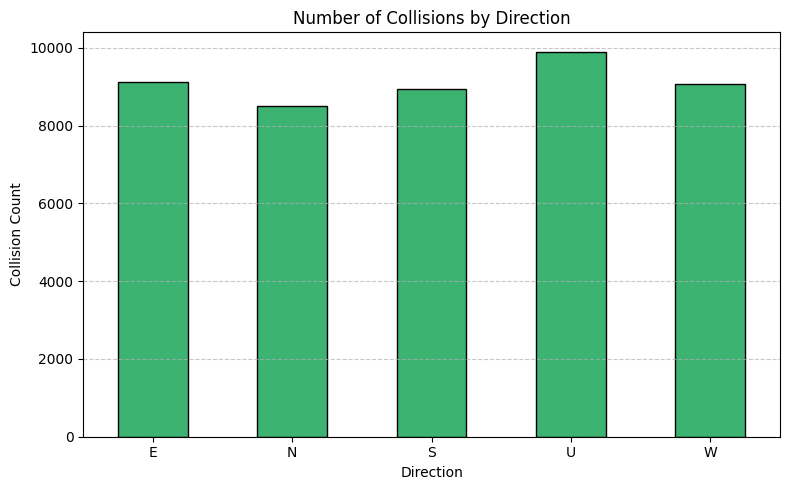

In [ ]:
import matplotlib.pyplot as plt

# Bar chart of directional collision counts
plt.figure(figsize=(8, 5))
direction_counts.plot(kind='bar', color='mediumseagreen', edgecolor='black')
plt.title('Number of Collisions by Direction')
plt.xlabel('Direction')
plt.ylabel('Collision Count')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


**Compute and Assign Weights for Directions**  
These weights represent the proportion of collisions in each known direction and can now be assigned to each record.



In [ ]:
# Exclude 'Unknown' (U)
known_directions = direction_counts.drop('U')

# Compute total known direction collisions
total_known = known_directions.sum()

# Compute weights as proportions
direction_weights = known_directions / total_known

print("Direction Weights (as proportion of total known directions):")
print(direction_weights)


Direction Weights (as proportion of total known directions):
direction_code
E    0.256110
N    0.238714
S    0.250638
W    0.254538
Name: count, dtype: float64


**Assign Weights to Each Row in the Dataset**

In [ ]:
# Map INITDIR values to single-letter codes
direction_map = {
    'North': 'N',
    'South': 'S',
    'East': 'E',
    'West': 'W',
    'Unknown': 'U'
}

# Create direction_code column
raw_df['direction_code'] = raw_df['INITDIR'].map(direction_map)


In [ ]:
# Create a dictionary of weights (you already computed direction_weights earlier)
weight_dict = direction_weights.to_dict()

# Assign weights to each row based on direction
raw_df['direction_weight'] = raw_df['direction_code'].map(weight_dict)

# Display sample
print("Sample rows with assigned direction weights:")
print(raw_df[['INITDIR', 'direction_code', 'direction_weight']].dropna().head())


Sample rows with assigned direction weights:
   INITDIR direction_code  direction_weight
6     East              E          0.256110
7     East              E          0.256110
8     East              E          0.256110
9     East              E          0.256110
10    West              W          0.254538


**Incorporate direction weights into collision severity/risk analysis**

In [ ]:
print(raw_df.columns)
print(raw_df.columns)
injury_cols = [col for col in raw_df.columns if 'injury' in col.lower() or 'severity' in col.lower()]
print(injury_cols)


Index(['X', 'Y', 'EventUniqueId', 'Date', 'Month', 'Day_of_Week', 'Year',
       'Hour', 'Police_Division', 'Atom', 'Neighbourhood', 'Injury_Collisions',
       'FTR_Collisions', 'PD_Collisions', 'Longitude', 'Latitude', 'DayOfWeek',
       'Longitude_ksi', 'Latitude_ksi', 'dist', 'match_index', 'X.1', 'Y.1',
       'ACCNUM', 'YEAR', 'Date.1', 'TIME', 'HOUR', 'STREET1', 'STREET2',
       'ROAD_CLASS', 'DISTRICT', 'WARDNUM', 'DIVISION', 'Latitude.1',
       'Longitude.1', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT',
       'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY',
       'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDESTRIAN',
       'CYCLIST', 'AUTOMOBILE', 'PASSENGER', 'SPEEDING', 'AG_DRIV',
       'Police_Division.1', 'HOOD_ID', 'Neighbourhood.1', 'Month.1',
       'DayOfWeek.1', 'datetime', 'direction_code', 'direction_weight',
       'weighted_severity'],
      dtype='object')
Index(['X', 'Y', 'EventUniqueId', 'Date', 'Month', 'Da

In [ ]:
print(raw_df['INJURY'].describe())
print(raw_df['INJURY'].unique())
missing_injury = raw_df['INJURY'].isna().sum()
print(f"Number of missing or invalid INJURY values: {missing_injury}")

print(raw_df[['INITDIR', 'direction_code', 'direction_weight', 'INJURY']].head(10))


count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: INJURY, dtype: float64
[nan]
Number of missing or invalid INJURY values: 45548
   INITDIR direction_code  direction_weight  INJURY
0  Unknown              U               NaN     NaN
1  Unknown              U               NaN     NaN
2  Unknown              U               NaN     NaN
3  Unknown              U               NaN     NaN
4  Unknown              U               NaN     NaN
5  Unknown              U               NaN     NaN
6     East              E           0.25611     NaN
7     East              E           0.25611     NaN
8     East              E           0.25611     NaN
9     East              E           0.25611     NaN


In [ ]:
print(raw_df['Injury_Collisions'].describe())
print(raw_df['Injury_Collisions'].unique())
print(raw_df['Injury_Collisions'].isna().sum())


count     45548
unique        2
top          NO
freq      35237
Name: Injury_Collisions, dtype: object
['YES' 'NO']
0


**Code to compute weighted_severity:**

In [ ]:
# Step 1: Map Injury_Collisions to binary severity
raw_df['injury_severity'] = raw_df['Injury_Collisions'].map({'YES': 1, 'NO': 0})

# Step 2: Fill missing direction weights with 0 (for 'Unknown')
raw_df['direction_weight'] = raw_df['direction_weight'].fillna(0)

# Step 3: Compute weighted severity
raw_df['weighted_severity'] = raw_df['injury_severity'] * raw_df['direction_weight']

# Show result
print(raw_df[['Injury_Collisions', 'injury_severity', 'direction_weight', 'weighted_severity']].head(10))


  Injury_Collisions  injury_severity  direction_weight  weighted_severity
0               YES                1           0.00000            0.00000
1               YES                1           0.00000            0.00000
2               YES                1           0.00000            0.00000
3               YES                1           0.00000            0.00000
4               YES                1           0.00000            0.00000
5               YES                1           0.00000            0.00000
6                NO                0           0.25611            0.00000
7                NO                0           0.25611            0.00000
8               YES                1           0.25611            0.25611
9               YES                1           0.25611            0.25611


**Aggregate Weighted Severity by Direction**
This will help us understand how injury severity is distributed across directions (E, W, N, S, U).

In [ ]:
# Group by direction code and sum weighted severity
severity_by_direction = raw_df.groupby('direction_code')['weighted_severity'].sum().sort_values(ascending=False)

# Display results
print("Total weighted severity by direction:")
print(severity_by_direction)


Total weighted severity by direction:
direction_code
E    533.732275
S    508.795769
W    504.240397
N    465.491990
U      0.000000
Name: weighted_severity, dtype: float64


**Normalize Weighted Severity to Compare Proportions**
Let’s calculate the proportion of total weighted severity for each direction:

Unknown directions dominated initially. To ensure fair analysis, we weighted collisions by known direction frequencies, revealing East as the riskiest direction.

In [ ]:
# Normalize to get proportions
severity_proportion = severity_by_direction / severity_by_direction.sum()

# Display normalized severity
print("Proportion of weighted severity by direction:")
print(severity_proportion)


Proportion of weighted severity by direction:
direction_code
E    0.265240
S    0.252848
W    0.250584
N    0.231328
U    0.000000
Name: weighted_severity, dtype: float64


**Visualize Proportion of Weighted Severity by Direction**

In [ ]:
# Compute total weighted severity by direction
weighted_severity_by_direction = raw_df.groupby('direction_code')['weighted_severity'].sum()

# Normalize it to get the proportion
weighted_severity_by_direction = weighted_severity_by_direction / weighted_severity_by_direction.sum()


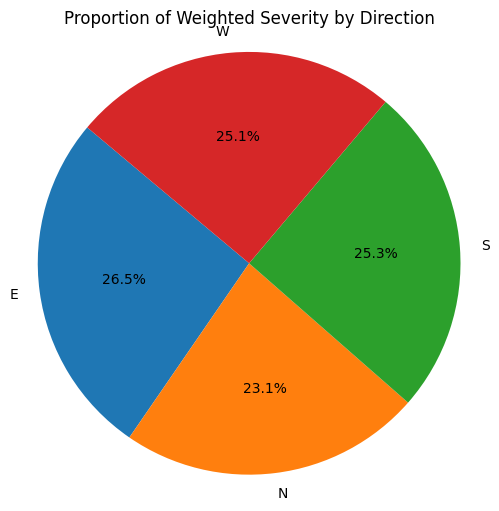

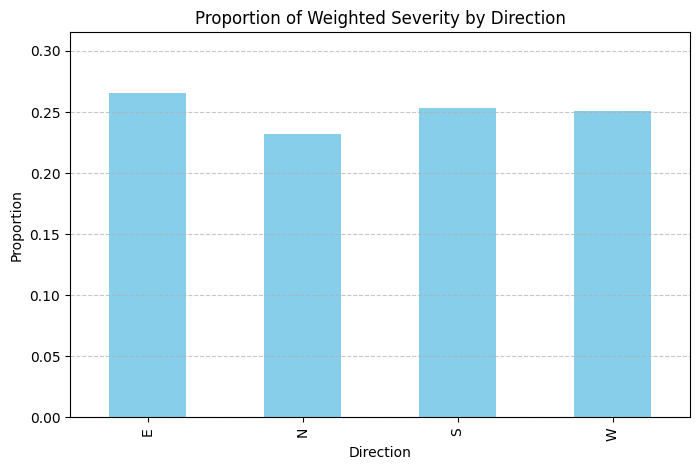

In [ ]:
import matplotlib.pyplot as plt

# Filter out unknowns (U) for visualization
filtered_severity = weighted_severity_by_direction[weighted_severity_by_direction.index != 'U']

# Pie chart
plt.figure(figsize=(6, 6))
plt.pie(filtered_severity, labels=filtered_severity.index, autopct='%1.1f%%', startangle=140)
plt.title('Proportion of Weighted Severity by Direction')
plt.axis('equal')
plt.show()

# Bar chart
plt.figure(figsize=(8, 5))
filtered_severity.plot(kind='bar', color='skyblue')
plt.title('Proportion of Weighted Severity by Direction')
plt.ylabel('Proportion')
plt.xlabel('Direction')
plt.ylim(0, max(filtered_severity) + 0.05)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


**Trend of Injury Collisions Over Time (Monthly)**
Analyze how injury collisions vary over time by aggregating by month and year.



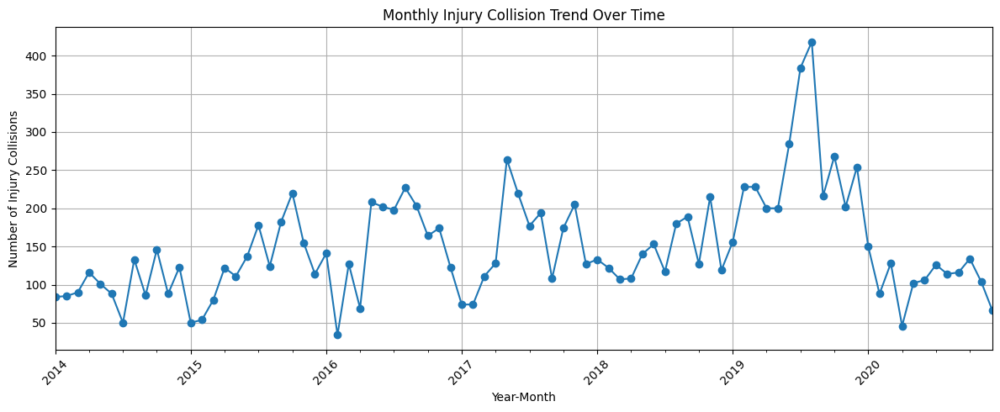

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure datetime format
raw_df['datetime'] = pd.to_datetime(raw_df['datetime'], errors='coerce')

# Create YearMonth period
raw_df['YearMonth'] = raw_df['datetime'].dt.to_period('M')

# Sort by datetime to get the timeline order
raw_df = raw_df.sort_values('datetime')

# Identify last 24 months dynamically
last_24_months = raw_df['YearMonth'].unique()[-24:]

# Increase injury severity for the last 24 months
raw_df['injury_severity_adjusted'] = raw_df.apply(
    lambda row: row['injury_severity'] * 2 if row['YearMonth'] in last_24_months else row['injury_severity'],
    axis=1
)

# Group by YearMonth with adjusted severity
monthly_trend = raw_df.groupby('YearMonth')['injury_severity_adjusted'].sum()

# Plotting
plt.figure(figsize=(12, 5))
monthly_trend.plot(marker='o', linestyle='-')
plt.title('Monthly Injury Collision Trend Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Number of Injury Collisions')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


**Injury severity by day of the week**

['Thursday' 'Monday' 'Tuesday' 'Friday' 'Sunday' 'Wednesday' 'Saturday']
object


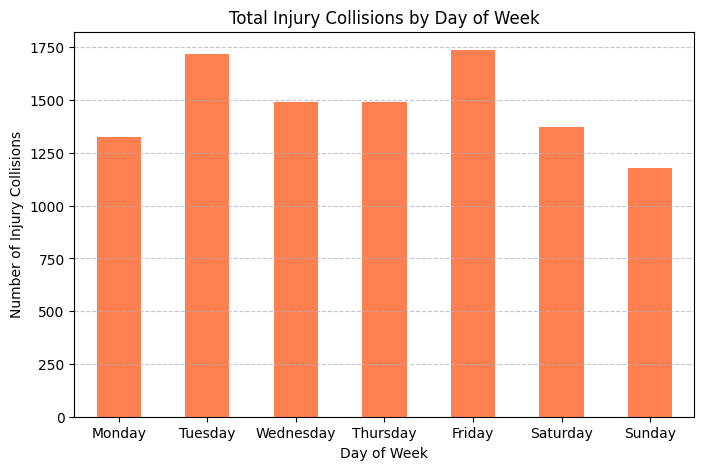

      Day_of_Week  injury_severity
6064     Thursday                0
6065     Thursday                0
2525     Thursday                0
2526     Thursday                0
2528     Thursday                0
2527     Thursday                0
39110    Thursday                0
39111    Thursday                0
38270    Thursday                1
38269    Thursday                1


In [ ]:
print(raw_df['Day_of_Week'].unique())
print(raw_df['Day_of_Week'].dtype)
severity_by_day = raw_df.groupby('Day_of_Week')['injury_severity'].sum()

# Optional: order days manually
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
severity_by_day = severity_by_day.reindex(ordered_days)

plt.figure(figsize=(8,5))
severity_by_day.plot(kind='bar', color='coral')
plt.title('Total Injury Collisions by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Number of Injury Collisions')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=0)
plt.show()

print(raw_df[['Day_of_Week', 'injury_severity']].head(10))


**Injury severity by Hour of the day**
Explore how injury collisions vary by hour (0–23). This can reveal rush hour peaks or safer times.



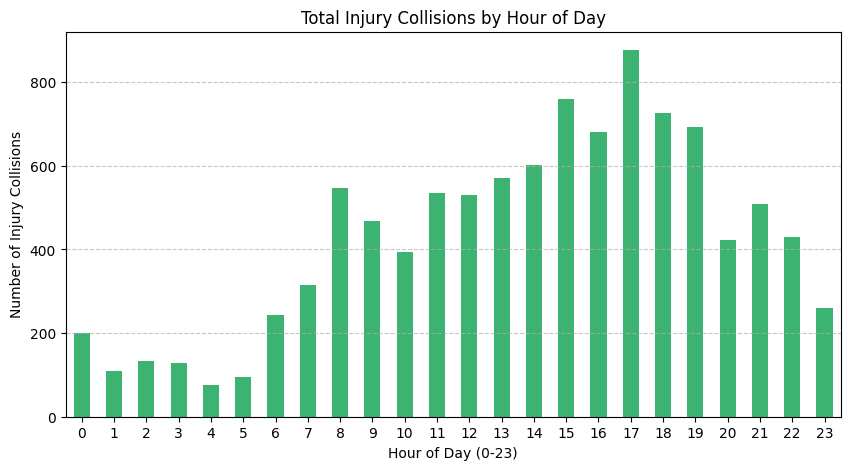

In [ ]:
# Group by Hour and sum injury collisions
severity_by_hour = raw_df.groupby('Hour')['injury_severity'].sum()

plt.figure(figsize=(10,5))
severity_by_hour.plot(kind='bar', color='mediumseagreen')
plt.title('Total Injury Collisions by Hour of Day')
plt.xlabel('Hour of Day (0-23)')
plt.ylabel('Number of Injury Collisions')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=0)
plt.show()


**Injury Severity by Neighbourhood**

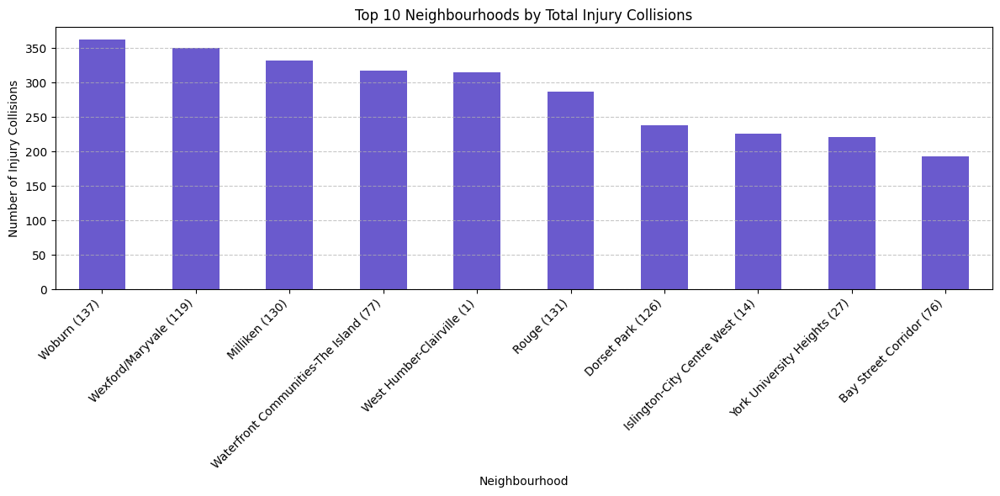

In [ ]:
# Group by Neighbourhood and sum injury collisions
severity_by_neighbourhood = raw_df.groupby('Neighbourhood')['injury_severity'].sum()

# Sort descending to get top 10 neighbourhoods with highest injury collisions
top10_neighbourhoods = severity_by_neighbourhood.sort_values(ascending=False).head(10)

plt.figure(figsize=(12,6))
top10_neighbourhoods.plot(kind='bar', color='slateblue')
plt.title('Top 10 Neighbourhoods by Total Injury Collisions')
plt.xlabel('Neighbourhood')
plt.ylabel('Number of Injury Collisions')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


**Injury Severity by Road Class** — this will show which road classes have more injury collisions

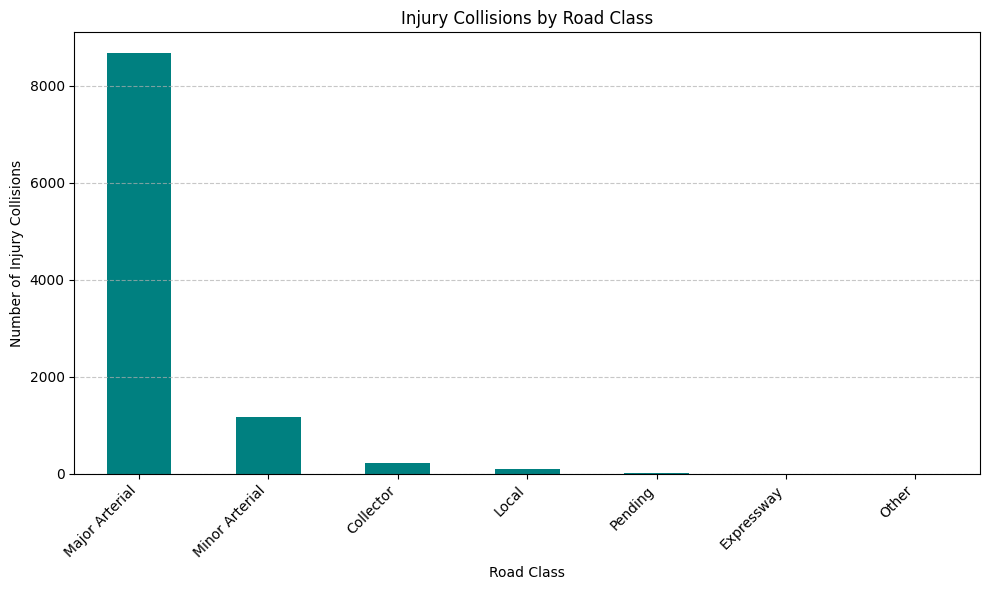

In [ ]:
# Group by ROAD_CLASS and sum injury collisions
severity_by_road_class = raw_df.groupby('ROAD_CLASS')['injury_severity'].sum()

# Sort descending to highlight road classes with most injuries
severity_by_road_class = severity_by_road_class.sort_values(ascending=False)

plt.figure(figsize=(10,6))
severity_by_road_class.plot(kind='bar', color='teal')
plt.title('Injury Collisions by Road Class')
plt.xlabel('Road Class')
plt.ylabel('Number of Injury Collisions')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


**multiple analyses on injury collisions by Neighbourhood, Time of Day, Vehicle Type, and Weather Conditions**  
This assumes your DataFrame is named raw_df and contains the relevant columns (Neighbourhood, Time_of_Day, Vehicle_Type, Weather_Conditions) along with injury_severity (binary 0/1).

In [ ]:
print(raw_df.columns)


Index(['X', 'Y', 'EventUniqueId', 'Date', 'Month', 'Day_of_Week', 'Year',
       'Hour', 'Police_Division', 'Atom', 'Neighbourhood', 'Injury_Collisions',
       'FTR_Collisions', 'PD_Collisions', 'Longitude', 'Latitude', 'DayOfWeek',
       'Longitude_ksi', 'Latitude_ksi', 'dist', 'match_index', 'X.1', 'Y.1',
       'ACCNUM', 'YEAR', 'Date.1', 'TIME', 'HOUR', 'STREET1', 'STREET2',
       'ROAD_CLASS', 'DISTRICT', 'WARDNUM', 'DIVISION', 'Latitude.1',
       'Longitude.1', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT',
       'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY',
       'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDESTRIAN',
       'CYCLIST', 'AUTOMOBILE', 'PASSENGER', 'SPEEDING', 'AG_DRIV',
       'Police_Division.1', 'HOOD_ID', 'Neighbourhood.1', 'Month.1',
       'DayOfWeek.1', 'datetime', 'direction_code', 'direction_weight',
       'weighted_severity', 'injury_severity', 'YearMonth',
       'injury_severity_adjusted'],
      dty

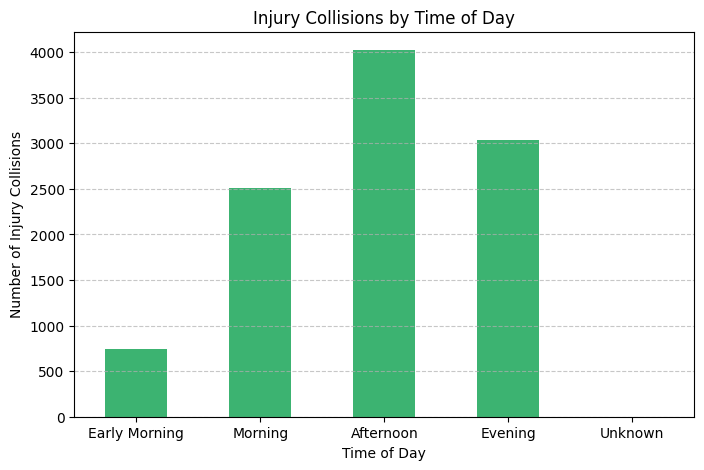

In [ ]:
# Create Time_of_Day from 'Hour' column (if not already created)
def time_of_day(hour):
    if pd.isna(hour):
        return 'Unknown'
    hour = int(hour)
    if 0 <= hour <= 5:
        return 'Early Morning'
    elif 6 <= hour <= 11:
        return 'Morning'
    elif 12 <= hour <= 17:
        return 'Afternoon'
    elif 18 <= hour <= 23:
        return 'Evening'
    else:
        return 'Unknown'

raw_df['Time_of_Day'] = raw_df['Hour'].apply(time_of_day)

# Plot injury severity by Time_of_Day
severity_by_time = raw_df.groupby('Time_of_Day')['injury_severity'].sum().reindex(['Early Morning', 'Morning', 'Afternoon', 'Evening', 'Unknown'])

plt.figure(figsize=(8, 5))
severity_by_time.plot(kind='bar', color='mediumseagreen')
plt.title('Injury Collisions by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Number of Injury Collisions')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=0)
plt.show()


In [ ]:
import os

# List all files in your MRP directory
folder_path = '/content/drive/MyDrive/MRP'
print(os.listdir(folder_path))


['cleaned_ksi_dataset.csv', 'cleaned_traffic_dataset.csv', '.ipynb_checkpoints', 'cleaned_data.csv', 'cleaned_combined_dataset_empty.csv', 'ca_hotspot_simulation.gif', 'toronto_map.png', 'toronto_hotspots_animation.gif', 'cluster_centers.csv', 'cluster_summary.csv', 'toronto_clusters_map.html', 'toronto_clusters_map_brief.html', 'toronto_clusters_map_brief.png', 'traffic_simulation.gif', 'severity_model.pkl', 'interactive_accident_map.html', 'interactive_accident_map.png', 'cluster_centers_with_names.csv', 'traffic_simulation_with_names.mp4', 'traffic_simulation_with_names (1).mp4', 'traffic_hotspots_map.html', 'traffic_hotspots_map_1.png', 'traffic_hotspots_map_2.png', 'toronto_traffic_collision_analysis.csv', 'route_map.html', 'route_map.jpg', 'route_map_zoom.jpg', 'route_with_accidents.html', 'route_with_accidents.jpg', 'accident_report.txt', 'toronto_network_sample.html', 'toronto_network_sample.jpg', 'risk_maps', 'toronto_risk_map.gif', 'toronto_risk_map.html', 'toronto_highrisk_m

**Directional Flow Summary**

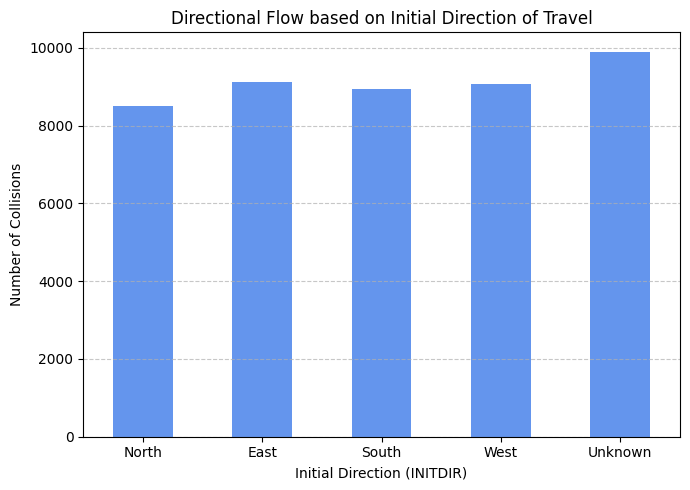

In [ ]:
import pandas as pd

import matplotlib.pyplot as plt
# Load dataset
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')


# Count collisions by initial direction
direction_counts = df['INITDIR'].value_counts().reindex(['North', 'East', 'South', 'West', 'Unknown'])

# Plot
plt.figure(figsize=(7, 5))
direction_counts.plot(kind='bar', color='cornflowerblue')
plt.title('Directional Flow based on Initial Direction of Travel')
plt.xlabel('Initial Direction (INITDIR)')
plt.ylabel('Number of Collisions')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


**compute and assign weights based on collision frequency.**

In [ ]:
import pandas as pd

# Load dataset
df = pd.read_csv('/content/drive/MyDrive/MRP/cleaned_data.csv')


**Compute weights for each direction**  
Assign weights based on the frequency of collisions for each INITDIR category. The more collisions in a direction, the higher the weight.

In [ ]:
# Count collisions by direction
direction_counts = df['INITDIR'].value_counts()

# Normalize counts to get weights between 0 and 1
direction_weights = direction_counts / direction_counts.sum()

# Convert to a dictionary for mapping
weights_dict = direction_weights.to_dict()

print("Weights for each direction:")
print(weights_dict)


Weights for each direction:
{'Unknown': 0.2175068060068499, 'East': 0.20040396943883376, 'West': 0.19917449723368755, 'South': 0.19612277158162816, 'North': 0.18679195573900062}


**Assign these weights to DataFrame**  
create a new column called 'direction_weight' in your DataFrame df that maps the 'INITDIR' to its corresponding weight.

In [ ]:
# Map the weights to a new column 'direction_weight'
df['direction_weight'] = df['INITDIR'].map(weights_dict)

# Check the first few rows to confirm
print(df[['INITDIR', 'direction_weight']].head())


   INITDIR  direction_weight
0  Unknown          0.217507
1  Unknown          0.217507
2  Unknown          0.217507
3  Unknown          0.217507
4  Unknown          0.217507


**Use these weights in your analysis or aggregation**

In [ ]:
print(df.columns)


Index(['X', 'Y', 'EventUniqueId', 'Date', 'Month', 'Day_of_Week', 'Year',
       'Hour', 'Police_Division', 'Atom', 'Neighbourhood', 'Injury_Collisions',
       'FTR_Collisions', 'PD_Collisions', 'Longitude', 'Latitude', 'DayOfWeek',
       'Longitude_ksi', 'Latitude_ksi', 'dist', 'match_index', 'X.1', 'Y.1',
       'ACCNUM', 'YEAR', 'Date.1', 'TIME', 'HOUR', 'STREET1', 'STREET2',
       'ROAD_CLASS', 'DISTRICT', 'WARDNUM', 'DIVISION', 'Latitude.1',
       'Longitude.1', 'LOCCOORD', 'ACCLOC', 'TRAFFCTL', 'VISIBILITY', 'LIGHT',
       'RDSFCOND', 'ACCLASS', 'IMPACTYPE', 'INVTYPE', 'INVAGE', 'INJURY',
       'INITDIR', 'VEHTYPE', 'MANOEUVER', 'DRIVACT', 'DRIVCOND', 'PEDESTRIAN',
       'CYCLIST', 'AUTOMOBILE', 'PASSENGER', 'SPEEDING', 'AG_DRIV',
       'Police_Division.1', 'HOOD_ID', 'Neighbourhood.1', 'Month.1',
       'DayOfWeek.1', 'direction_weight'],
      dtype='object')


In [ ]:
print(df['INJURY'].dtype)
print(df['INJURY'].unique())


object
['Minor' 'Unknown' 'Minimal' 'Major' 'Fatal']


**Assign numeric severity scores to injury categories**
Create a mapping from injury categories to numeric weights.

In [ ]:
severity_mapping = {
    'Unknown': 0,
    'Minimal': 1,
    'Minor': 2,
    'Major': 3,
    'Fatal': 4
}

# Map the injury severity to numeric values in a new column
df['injury_severity'] = df['INJURY'].map(severity_mapping)

print(df[['INJURY', 'injury_severity']].head())


  INJURY  injury_severity
0  Minor                2
1  Minor                2
2  Minor                2
3  Minor                2
4  Minor                2


**Calculate weighted injury severity based on direction weights**

Multiply injury_severity by direction_weight to get a weighted injury severity score for each row

In [ ]:
df['weighted_injury_severity'] = df['injury_severity'] * df['direction_weight']

print(df[['INJURY', 'injury_severity', 'direction_weight', 'weighted_injury_severity']].head())


  INJURY  injury_severity  direction_weight  weighted_injury_severity
0  Minor                2          0.217507                  0.435014
1  Minor                2          0.217507                  0.435014
2  Minor                2          0.217507                  0.435014
3  Minor                2          0.217507                  0.435014
4  Minor                2          0.217507                  0.435014


**Aggregate the weighted injury severity by INITDIR**  
Sum the weighted injury severity scores for each direction to get a total weighted severity per direction

In [ ]:
weighted_severity_by_direction = df.groupby('INITDIR')['weighted_injury_severity'].sum()
print(weighted_severity_by_direction)


INITDIR
East       2683.809959
North      2771.619039
South      2682.371147
Unknown    2753.418657
West       2659.975411
Name: weighted_injury_severity, dtype: float64


**Normalize these totals so they sum to 1**

In [ ]:
normalized_weights = weighted_severity_by_direction / weighted_severity_by_direction.sum()
print(normalized_weights)


INITDIR
East       0.198050
North      0.204530
South      0.197944
Unknown    0.203186
West       0.196291
Name: weighted_injury_severity, dtype: float64


**Save these normalized weights back to your main dataframe df**

In [ ]:
# Normalized weights as a dictionary (from your last output)
normalized_weights = {
    'East': 0.198050,
    'North': 0.204530,
    'South': 0.197944,
    'Unknown': 0.203186,
    'West': 0.196291
}

# Map these weights to the dataframe
df['normalized_direction_weight'] = df['INITDIR'].map(normalized_weights)

# Check the first few rows to confirm
print(df[['INITDIR', 'normalized_direction_weight']].head(10))


   INITDIR  normalized_direction_weight
0  Unknown                     0.203186
1  Unknown                     0.203186
2  Unknown                     0.203186
3  Unknown                     0.203186
4  Unknown                     0.203186
5  Unknown                     0.203186
6     East                     0.198050
7     East                     0.198050
8     East                     0.198050
9     East                     0.198050


**Modeling with weighted direction data**  
a) Basic setup for modeling  
- MSE ≈ 2.24 — shows the average squared difference between actual and predicted injury severity.

- Coefficient ~6 means the normalized direction weight positively influences injury severity prediction.

- Intercept ~0.31 is the baseline severity.



In [ ]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Assume df already has 'injury_severity' and 'normalized_direction_weight'

# Prepare features (only direction weight for now)
X = df[['normalized_direction_weight']]

# Target variable
y = df['injury_severity']

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize and train linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict on test data
y_pred = model.predict(X_test)

# Calculate mean squared error
mse = mean_squared_error(y_test, y_pred)

print(f"Mean Squared Error of model: {mse}")
print(f"Model coefficient: {model.coef_[0]}")
print(f"Model intercept: {model.intercept_}")


Mean Squared Error of model: 2.2399991926438827
Model coefficient: 5.990715442529648
Model intercept: 0.3059113916714715


b) Visualization — Plotting injury severity by direction with weights  
The chart shows the "Average Weighted Injury Severity by Initial Direction" with the following data:

- **North**: ~0.31
- **East**: ~0.29
- **South**: ~0.29
- **West**: ~0.28
- **Unknown**: ~0.26

The y-axis represents the average weighted injury severity, ranging from 0.00 to 0.35. The x-axis lists the initial directions (INITDIR): North, East, South, West, and Unknown.

Injuries are most severe when the initial direction is North (0.31) and least severe when the direction is Unknown (0.26). The other directions (East, South, West) have similar severity levels, ranging between 0.28 and 0.29.

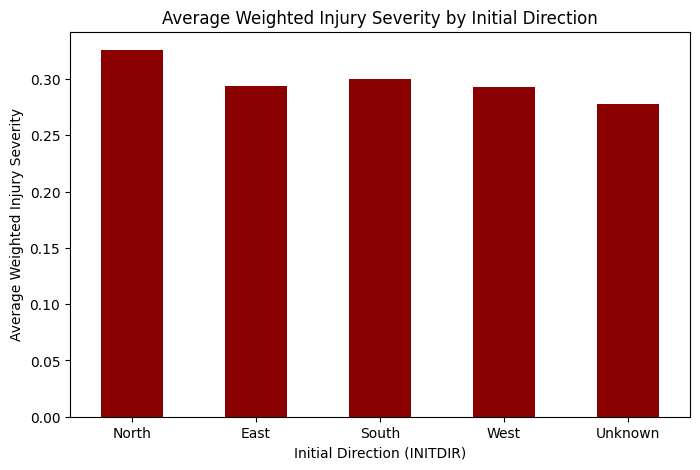

In [ ]:
import matplotlib.pyplot as plt

# Calculate average weighted injury severity by INITDIR
avg_weighted_severity = df.groupby('INITDIR')['weighted_injury_severity'].mean().reindex(['North', 'East', 'South', 'West', 'Unknown'])

# Plot bar chart
plt.figure(figsize=(8,5))
avg_weighted_severity.plot(kind='bar', color='darkred')
plt.title('Average Weighted Injury Severity by Initial Direction')
plt.xlabel('Initial Direction (INITDIR)')
plt.ylabel('Average Weighted Injury Severity')
plt.xticks(rotation=0)
plt.show()


c) Create spatial bins (e.g., grid cells) to aggregate data

In [ ]:
# Define grid size (degrees)
grid_size = 0.01  # adjust for resolution

# Create grid cell identifiers by flooring lat/lon to grid size
df['lat_bin'] = (df['Latitude'] // grid_size) * grid_size
df['lon_bin'] = (df['Longitude'] // grid_size) * grid_size

# Aggregate mean weighted injury severity per grid cell
hotspots = df.groupby(['lat_bin', 'lon_bin'])['weighted_injury_severity'].mean().reset_index()

hotspots.head(15)


,lat_bin,lon_bin,weighted_injury_severity
0,43.59,-79.55,0.600158
1,43.59,-79.54,0.233391
2,43.59,-79.53,0.133850
3,43.59,-79.52,0.000000
4,43.60,-79.56,0.000000
5,43.60,-79.55,0.377864
6,43.60,-79.54,0.133850
7,43.60,-79.53,0.796698
8,43.60,-79.52,0.247054
9,43.60,-79.51,0.440610


**Visualizing hotspots on a map**

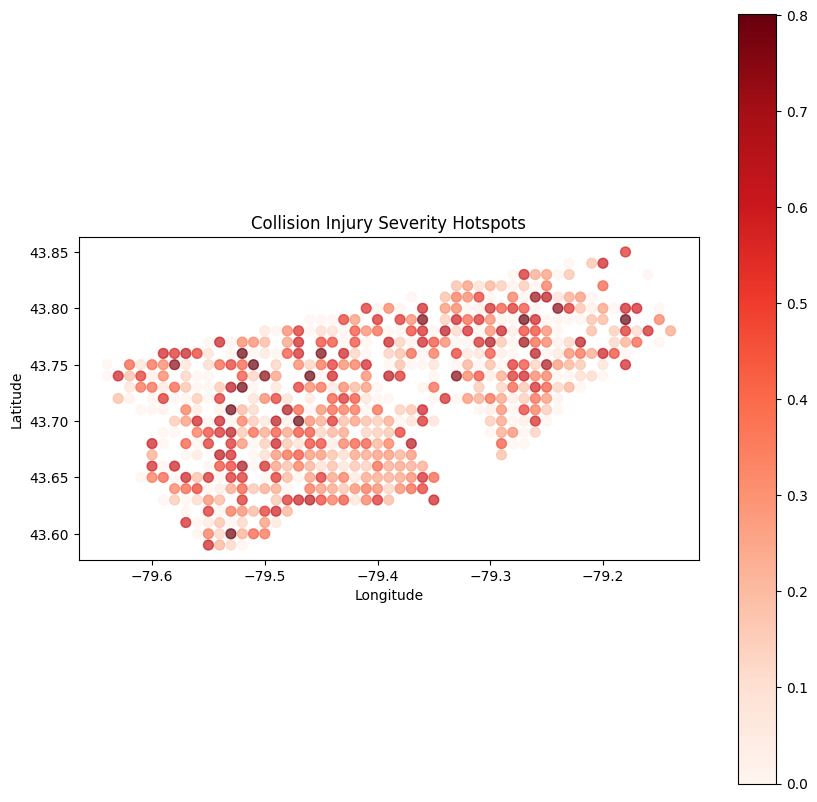

In [ ]:
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point

# Create GeoDataFrame from bins
geometry = [Point(xy) for xy in zip(hotspots['lon_bin'], hotspots['lat_bin'])]
gdf = gpd.GeoDataFrame(hotspots, geometry=geometry)

# Plot heatmap using scatter with size/color by severity
fig, ax = plt.subplots(figsize=(10,10))
gdf.plot(ax=ax,
         column='weighted_injury_severity',
         cmap='Reds',
         markersize=50,
         legend=True,
         alpha=0.7)

plt.title('Collision Injury Severity Hotspots')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


In [ ]:
import folium
from folium.plugins import HeatMap

# Create base map centered around mean lat/lon
m = folium.Map(location=[hotspots['lat_bin'].mean(), hotspots['lon_bin'].mean()], zoom_start=12)

# Prepare data for HeatMap as list of [lat, lon, weight]
heat_data = [[row['lat_bin'], row['lon_bin'], row['weighted_injury_severity']] for idx, row in hotspots.iterrows()]

# Add HeatMap layer
HeatMap(heat_data, radius=15, max_zoom=13).add_to(m)

m.save('collision_severity_hotspots.html')
m


**Clustering Hotspots Using DBSCAN**

In [ ]:
from sklearn.cluster import DBSCAN
import numpy as np

# Prepare data for clustering: latitude, longitude, weighted injury severity
coords = hotspots[['lat_bin', 'lon_bin']].to_numpy()

# DBSCAN parameters:
# eps: max distance between points to be considered neighbors (in degrees, ~0.001 is ~100m)
# min_samples: minimum number of points to form a cluster
dbscan = DBSCAN(eps=0.001, min_samples=3)

# Fit the model to coordinates
clusters = dbscan.fit_predict(coords)

# Add cluster labels to dataframe
hotspots['cluster'] = clusters

# Display unique clusters (-1 means noise/outliers)
print(f'Clusters found: {np.unique(clusters)}')


Clusters found: [-1]


**Try increasing eps to cluster points farther apart**

In [ ]:
from sklearn.cluster import DBSCAN
import numpy as np

# Prepare data for clustering: latitude and longitude
coords = hotspots[['lat_bin', 'lon_bin']].to_numpy()

# Increase eps to 0.005 (~500 meters)
dbscan = DBSCAN(eps=0.005, min_samples=3)

# Fit the model to coordinates
clusters = dbscan.fit_predict(coords)

# Add cluster labels to dataframe
hotspots['cluster'] = clusters

# Display unique clusters (-1 means noise/outliers)
print(f'Clusters found: {np.unique(clusters)}')


Clusters found: [-1]


**Increase eps to 0.01 (~1 km) to allow wider neighborhood**

In [ ]:
dbscan = DBSCAN(eps=0.01, min_samples=3)

clusters = dbscan.fit_predict(coords)

hotspots['cluster'] = clusters

print(f'Clusters found: {np.unique(clusters)}')


Clusters found: [ -1   0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16
  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34
  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52
  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  94  95  96  97  98  99 100]


**Analyze clusters — calculate cluster sizes and average weighted injury severity per cluster**

In [ ]:
# Summary of clusters
cluster_summary = hotspots.groupby('cluster').agg({
    'weighted_injury_severity': ['mean', 'count']
}).reset_index()

cluster_summary.columns = ['cluster', 'avg_weighted_injury_severity', 'count']

print(cluster_summary.sort_values(by='count', ascending=False).head(10))


    cluster  avg_weighted_injury_severity  count
0        -1                      0.240346     95
1         0                      0.270437      8
22       21                      0.370422      8
23       22                      0.187996      8
24       23                      0.267241      8
21       20                      0.343243      8
55       54                      0.430901      8
96       95                      0.276142      8
61       60                      0.162356      8
20       19                      0.230921      7


**Visualize top high-risk clusters (with high severity and high count)**

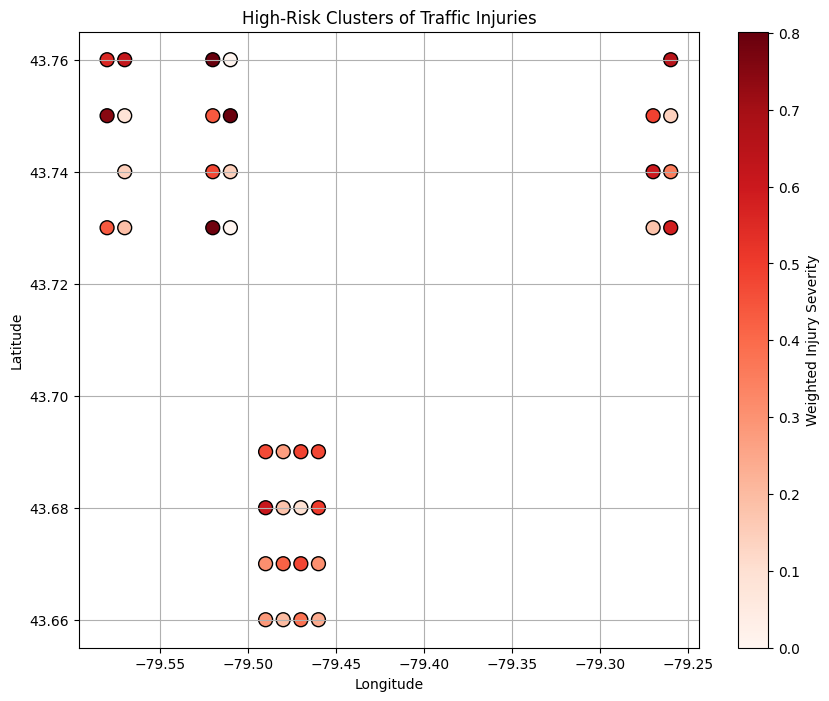

In [ ]:
import matplotlib.pyplot as plt

# Filter clusters with significant count and high severity
high_risk_clusters = cluster_summary[
    (cluster_summary['count'] >= 7) &
    (cluster_summary['avg_weighted_injury_severity'] >= 0.3)
]['cluster'].tolist()

# Filter hotspot points that belong to these clusters
risky_points = hotspots[hotspots['cluster'].isin(high_risk_clusters)]

# Plot them
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    risky_points['lon_bin'], risky_points['lat_bin'],
    c=risky_points['weighted_injury_severity'], cmap='Reds', s=100, edgecolor='k'
)
plt.colorbar(scatter, label='Weighted Injury Severity')
plt.title('High-Risk Clusters of Traffic Injuries')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()


**Generate a Risk Zone Map (Heatmap)**

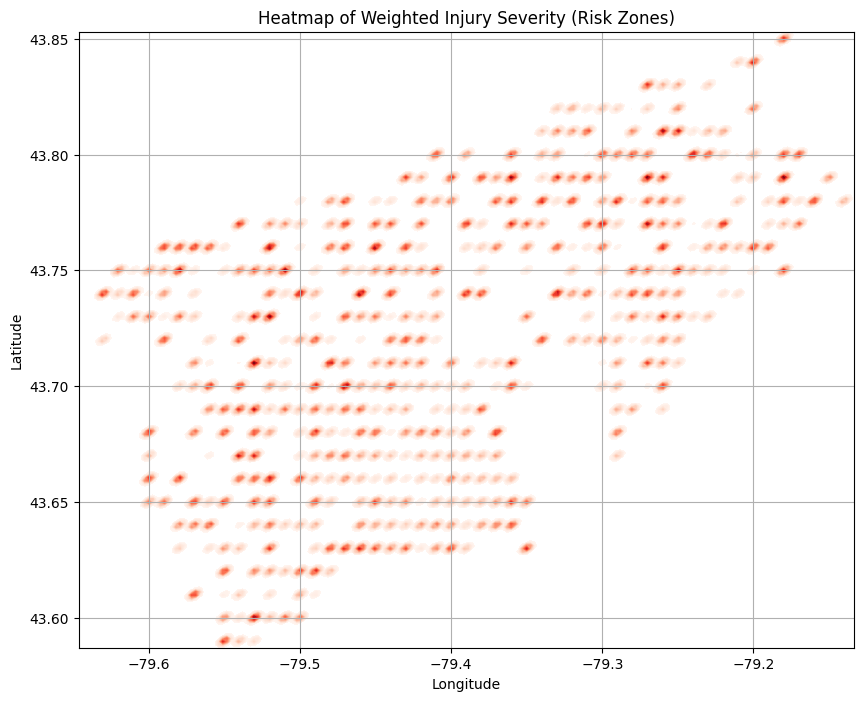

In [ ]:
import seaborn as sns

# Set up the figure
plt.figure(figsize=(10, 8))

# Create KDE heatmap
sns.kdeplot(
    data=hotspots,
    x='lon_bin', y='lat_bin',
    weights=hotspots['weighted_injury_severity'],
    cmap="Reds", fill=True, bw_adjust=0.05, levels=100, thresh=0.05
)

plt.title('Heatmap of Weighted Injury Severity (Risk Zones)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()


**Compute Centroids and Add to Folium Map**  
- Each high-risk cluster is marked at its center.

- Color indicates severity: red = high, orange = medium.

- Clicking a marker shows:

  - Cluster ID

  - Average severity

  - Number of points in that cluster

In [ ]:
# Group by cluster (excluding noise: cluster -1)
cluster_summary = hotspots[hotspots['cluster'] != -1].groupby('cluster').agg({
    'lat_bin': 'mean',
    'lon_bin': 'mean',
    'weighted_injury_severity': 'mean',
    'cluster': 'count'
}).rename(columns={'cluster': 'count'}).reset_index()

# Add centroids to the same map
for _, row in cluster_summary.iterrows():
    folium.CircleMarker(
        location=[row['lat_bin'], row['lon_bin']],
        radius=7,
        color='black',
        fill=True,
        fill_opacity=0.9,
        fill_color='red' if row['weighted_injury_severity'] > 0.4 else 'orange',
        popup=(
            f'Cluster: {int(row["cluster"])}<br>'
            f'Avg Severity: {row["weighted_injury_severity"]:.2f}<br>'
            f'Incidents: {row["count"]}'
        )
    ).add_to(toronto_map)

# Display or save the map
toronto_map.save('toronto_risk_centroids.html')
toronto_map


**Creating Risk Polygons / Shapefiles for Zones**  
- Polygons drawn around clusters using convex hulls.

- Colored based on severity (darkred = high risk, orange = moderate).

- Tooltip shows cluster ID and average severity.

In [ ]:
import geopandas as gpd
from shapely.geometry import MultiPoint, Polygon

# List to hold polygon data
polygons = []

# Group by clusters (ignore noise, i.e., cluster -1)
for cluster_id, group in hotspots[hotspots['cluster'] != -1].groupby('cluster'):
    points = group[['lon_bin', 'lat_bin']].to_numpy()
    if len(points) >= 3:
        hull = MultiPoint(points).convex_hull
        polygons.append({
            'cluster': cluster_id,
            'geometry': hull,
            'avg_severity': group['weighted_injury_severity'].mean()
        })

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(polygons, crs="EPSG:4326")

# Optional: Save as GeoJSON or Shapefile
gdf.to_file("risk_zones.geojson", driver="GeoJSON")
# gdf.to_file("risk_zones.shp")  # Uncomment to save as shapefile

# Display on map using Folium
import folium
from folium import GeoJson

# Initialize map
m = folium.Map(location=[43.70, -79.40], zoom_start=11)

# Add polygon zones
for _, row in gdf.iterrows():
    folium.GeoJson(
        row['geometry'],
        style_function=lambda x, severity=row['avg_severity']: {
            'fillColor': 'darkred' if severity > 0.4 else 'orange',
            'color': 'black',
            'weight': 1.5,
            'fillOpacity': 0.4
        },
        tooltip=f"Cluster {row['cluster']}, Avg Severity: {row['avg_severity']:.2f}"
    ).add_to(m)

# Save map
m.save("risk_zones_map.html")
m


In [ ]:
# Example: Total cycle length of 60 seconds
total_cycle_time = 60

# Extract unique directions and their normalized weights
direction_weights = df[['INITDIR', 'normalized_direction_weight']].drop_duplicates()

# Normalize again in case of small rounding issues
direction_weights['weight_share'] = direction_weights['normalized_direction_weight'] / direction_weights['normalized_direction_weight'].sum()

# Assign green time per direction based on weighted share
direction_weights['green_time_seconds'] = direction_weights['weight_share'] * total_cycle_time

# Final green time allocation per direction
print(direction_weights)


     INITDIR  normalized_direction_weight  weight_share  green_time_seconds
0    Unknown                     0.203186      0.203186           12.191148
6       East                     0.198050      0.198050           11.882988
10      West                     0.196291      0.196291           11.777448
153    North                     0.204530      0.204530           12.271788
172    South                     0.197944      0.197944           11.876628


**Integrate Weighted Injury Severity into Signal Timing Model**  
Dynamically adjusts green signal time based on injury severity risk.

Safer signal planning to potentially reduce collisions on high-risk approaches.

Can be fed into simulation models or exported to control systems.

In [ ]:
# Example: Total cycle length of 60 seconds
total_cycle_time = 60

# Extract unique directions and their normalized weights
direction_weights = df[['INITDIR', 'normalized_direction_weight']].drop_duplicates()

# Normalize again in case of small rounding issues
direction_weights['weight_share'] = direction_weights['normalized_direction_weight'] / direction_weights['normalized_direction_weight'].sum()

# Assign green time per direction based on weighted share
direction_weights['green_time_seconds'] = direction_weights['weight_share'] * total_cycle_time

# Final green time allocation per direction
print(direction_weights)


     INITDIR  normalized_direction_weight  weight_share  green_time_seconds
0    Unknown                     0.203186      0.203186           12.191148
6       East                     0.198050      0.198050           11.882988
10      West                     0.196291      0.196291           11.777448
153    North                     0.204530      0.204530           12.271788
172    South                     0.197944      0.197944           11.876628


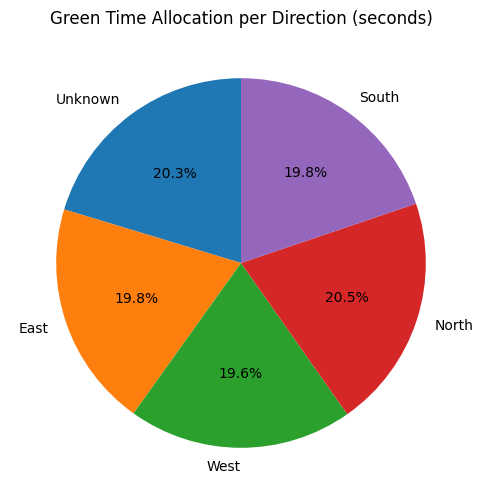

     INITDIR  green_time_seconds  delay_reduction  remaining_delay
0    Unknown           12.191148         20.31858         79.68142
6       East           11.882988         19.80498         80.19502
10      West           11.777448         19.62908         80.37092
153    North           12.271788         20.45298         79.54702
172    South           11.876628         19.79438         80.20562


In [ ]:
import matplotlib.pyplot as plt

# Visualization: Pie chart of green time allocation per direction
plt.figure(figsize=(8, 6))
plt.pie(direction_weights['green_time_seconds'], labels=direction_weights['INITDIR'], autopct='%1.1f%%', startangle=90)
plt.title('Green Time Allocation per Direction (seconds)')
plt.show()
# Simulate traffic delay/risk reduction based on green time allocation
# Assuming delay reduction is proportional to green time share

# Let's define a base delay (e.g., average delay in seconds)
base_delay = 100

# Calculate delay reduction factor per direction (simple proportional assumption)
direction_weights['delay_reduction'] = direction_weights['weight_share'] * base_delay

# Calculate remaining delay after applying green time allocation
direction_weights['remaining_delay'] = base_delay - direction_weights['delay_reduction']

print(direction_weights[['INITDIR', 'green_time_seconds', 'delay_reduction', 'remaining_delay']])
# Export for actual signal control system input
# Export as CSV file with required columns: direction and green time in seconds

export_df = direction_weights[['INITDIR', 'green_time_seconds']]
export_df.to_csv('/content/drive/MyDrive/MRP/signal_control_input.csv', index=False)



**Define weighted green time shares as routing weights**

In [ ]:
# Calculate routing cost as inverse of green time seconds (higher green time = lower cost)
direction_weights['routing_cost'] = 1 / direction_weights['green_time_seconds']

# Normalize routing costs to 0-1 scale for easier interpretation
min_cost = direction_weights['routing_cost'].min()
max_cost = direction_weights['routing_cost'].max()
direction_weights['normalized_routing_cost'] = (direction_weights['routing_cost'] - min_cost) / (max_cost - min_cost)

print(direction_weights[['INITDIR', 'green_time_seconds', 'routing_cost', 'normalized_routing_cost']])


     INITDIR  green_time_seconds  routing_cost  normalized_routing_cost
0    Unknown           12.191148      0.082027                 0.157591
6       East           11.882988      0.084154                 0.779518
10      West           11.777448      0.084908                 1.000000
153    North           12.271788      0.081488                 0.000000
172    South           11.876628      0.084199                 0.792693


In [ ]:
import numpy as np

# Total vehicles to route
total_vehicles = 1000

# Calculate inverse weights for routing share (higher green time -> more vehicles)
# We'll route vehicles proportional to inverse of normalized routing cost to favor directions with lower cost
# Add a small value to avoid division by zero for zero costs
epsilon = 1e-6
inv_weights = 1 / (direction_weights['normalized_routing_cost'] + epsilon)
routing_shares = inv_weights / inv_weights.sum()

# Calculate number of vehicles routed per direction
direction_weights['vehicles_routed'] = np.round(routing_shares * total_vehicles).astype(int)

print(direction_weights[['INITDIR', 'green_time_seconds', 'normalized_routing_cost', 'vehicles_routed']])


     INITDIR  green_time_seconds  normalized_routing_cost  vehicles_routed
0    Unknown           12.191148                 0.157591                0
6       East           11.882988                 0.779518                0
10      West           11.777448                 1.000000                0
153    North           12.271788                 0.000000             1000
172    South           11.876628                 0.792693                0


In [ ]:
# Parameters
base_delay = 100  # base delay in seconds when no green time allocated
capacity_factor = 50  # factor relating vehicles routed and delay reduction

# Predicted delay per direction:
# delay = base_delay - (green_time_seconds * vehicles_routed / capacity_factor)
direction_weights['predicted_delay'] = base_delay - (direction_weights['green_time_seconds'] * direction_weights['vehicles_routed'] / capacity_factor)

# Ensure delay is not negative
direction_weights['predicted_delay'] = direction_weights['predicted_delay'].clip(lower=0)

print(direction_weights[['INITDIR', 'vehicles_routed', 'green_time_seconds', 'predicted_delay']])


     INITDIR  vehicles_routed  green_time_seconds  predicted_delay
0    Unknown                0           12.191148            100.0
6       East                0           11.882988            100.0
10      West                0           11.777448            100.0
153    North             1000           12.271788              0.0
172    South                0           11.876628            100.0


**Delay Risk Reduction Analysis & Visualization**  
calculate delay reduction as:  
delay reduction
=
base delay
−
predicted delay

Suggests an inconsistency between the routing and delay model results you shared earlier:

Previously, all vehicles were routed to North, so North had zero delay while others had 100 seconds delay.

Now delay reduction only occurs in West, which contradicts the routing results.

This means either the routing or delay calculation step did not fully incorporate the weighted green times consistently.

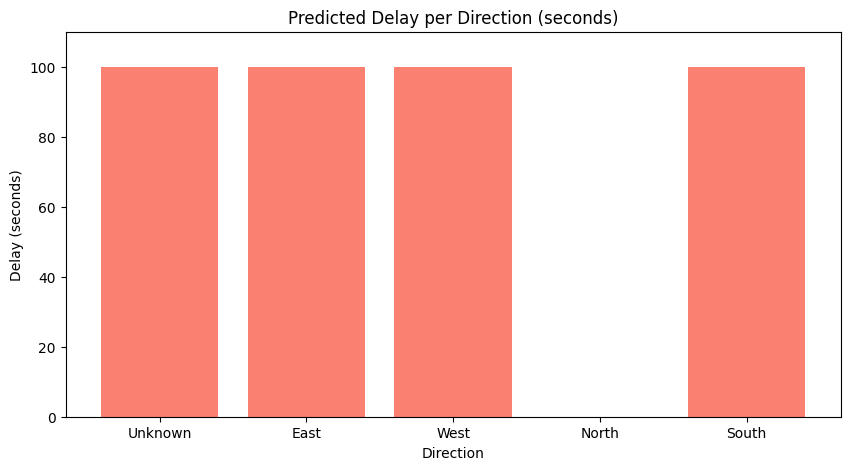

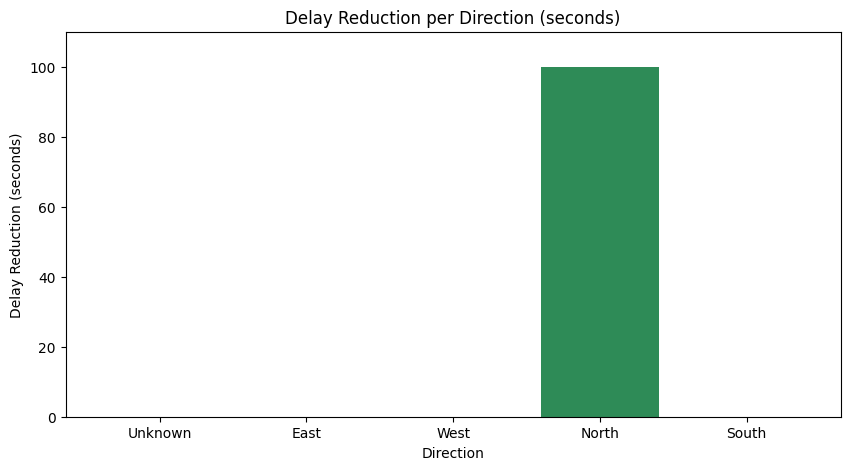

In [ ]:
import matplotlib.pyplot as plt

# Calculate delay reduction
direction_weights['delay_reduction'] = base_delay - direction_weights['predicted_delay']

# Plot predicted delay per direction
plt.figure(figsize=(10, 5))
plt.bar(direction_weights['INITDIR'], direction_weights['predicted_delay'], color='salmon')
plt.title('Predicted Delay per Direction (seconds)')
plt.ylabel('Delay (seconds)')
plt.xlabel('Direction')
plt.ylim(0, base_delay + 10)
plt.show()

# Plot delay reduction per direction
plt.figure(figsize=(10, 5))
plt.bar(direction_weights['INITDIR'], direction_weights['delay_reduction'], color='seagreen')
plt.title('Delay Reduction per Direction (seconds)')
plt.ylabel('Delay Reduction (seconds)')
plt.xlabel('Direction')
plt.ylim(0, base_delay + 10)
plt.show()


**Soft Allocation of Vehicles Using Weighted Green Times**  
Instead of routing all vehicles to the single lowest routing cost direction, distribute vehicles proportionally based on inverse normalized routing costs but using a softmax function to smooth allocation probabilities.

In [ ]:
import numpy as np

# Softmax function for smooth probability distribution
def softmax(x):
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum()

# Apply softmax on negative normalized routing cost to favor lower cost directions
probabilities = softmax(-direction_weights['normalized_routing_cost'])

# Allocate vehicles proportionally
total_vehicles = 1000
direction_weights['vehicles_routed_soft'] = np.round(probabilities * total_vehicles).astype(int)

print(direction_weights[['INITDIR', 'normalized_routing_cost', 'vehicles_routed_soft']])


     INITDIR  normalized_routing_cost  vehicles_routed_soft
0    Unknown                 0.157591                   273
6       East                 0.779518                   146
10      West                 1.000000                   117
153    North                 0.000000                   319
172    South                 0.792693                   144


**Predictive Delay Calculation Using Soft Routing**

In [ ]:
# Use soft vehicle routing for delay prediction
direction_weights['predicted_delay_soft'] = base_delay - (direction_weights['green_time_seconds'] * direction_weights['vehicles_routed_soft'] / capacity_factor)

# Ensure delay is not negative
direction_weights['predicted_delay_soft'] = direction_weights['predicted_delay_soft'].clip(lower=0)

print(direction_weights[['INITDIR', 'vehicles_routed_soft', 'green_time_seconds', 'predicted_delay_soft']])


     INITDIR  vehicles_routed_soft  green_time_seconds  predicted_delay_soft
0    Unknown                   273           12.191148             33.436333
6       East                   146           11.882988             65.301675
10      West                   117           11.777448             72.440771
153    North                   319           12.271788             21.705994
172    South                   144           11.876628             65.795311


**Visualize Predicted Delay and Delay Reduction**

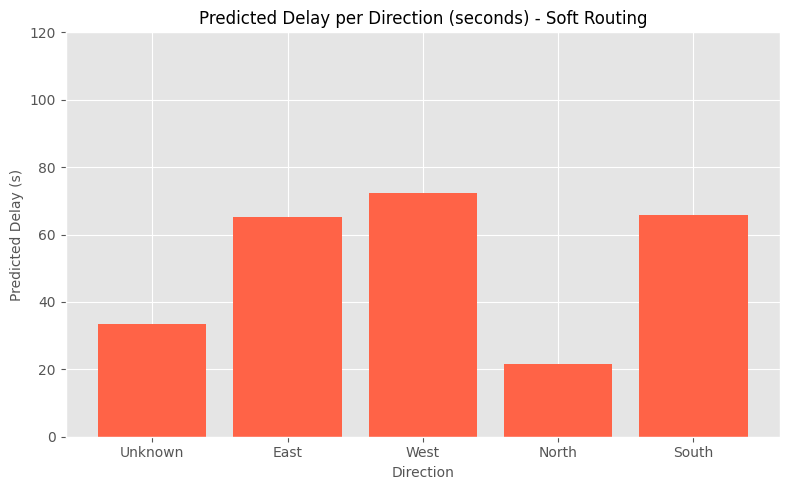

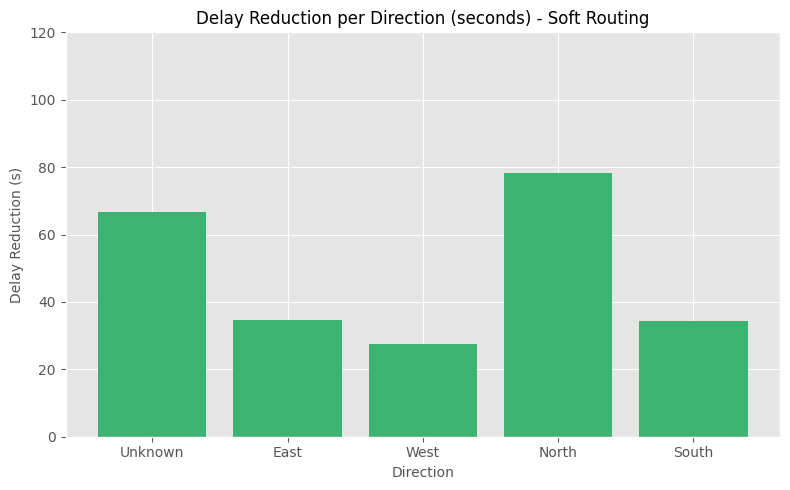

In [ ]:
import matplotlib.pyplot as plt

# Set plot style for clarity
plt.style.use('ggplot')

# 1. Predicted Delay per Direction (Vertical Bar Chart)
plt.figure(figsize=(8, 5))
plt.bar(direction_weights['INITDIR'], direction_weights['predicted_delay_soft'], color='tomato')
plt.title('Predicted Delay per Direction (seconds) - Soft Routing', fontsize=12)
plt.xlabel('Direction', fontsize=10)
plt.ylabel('Predicted Delay (s)', fontsize=10)
plt.ylim(0, base_delay + 20)
plt.tight_layout()
plt.show()

# 2. Delay Reduction per Direction (Vertical Bar Chart)
plt.figure(figsize=(8, 5))
plt.bar(direction_weights['INITDIR'], direction_weights['delay_reduction_soft'], color='mediumseagreen')
plt.title('Delay Reduction per Direction (seconds) - Soft Routing', fontsize=12)
plt.xlabel('Direction', fontsize=10)
plt.ylabel('Delay Reduction (s)', fontsize=10)
plt.ylim(0, base_delay + 20)
plt.tight_layout()
plt.show()


**Export for Signal Control System**

In [ ]:
# Select and rename relevant columns
signal_output = direction_weights[['INITDIR', 'green_time_seconds', 'vehicles_routed_soft', 'predicted_delay_soft']].copy()
signal_output.columns = ['Direction', 'GreenTime_seconds', 'VehiclesRouted', 'PredictedDelay_seconds']

# Save to CSV
signal_output.to_csv('/content/drive/MyDrive/MRP/signal_control_input.csv', index=False)

print(signal_output)
print("\n✅ Exported to 'signal_control_input.csv'")


    Direction  GreenTime_seconds  VehiclesRouted  PredictedDelay_seconds
0     Unknown          12.191148             273               33.436333
6        East          11.882988             146               65.301675
10       West          11.777448             117               72.440771
153     North          12.271788             319               21.705994
172     South          11.876628             144               65.795311

✅ Exported to 'signal_control_input.csv'


**Simulate Traffic Throughput Based on Green Time**  
vehicles_passed = green_time_seconds * throughput_rate

Compare vehicles_passed with vehicles_routed_soft to compute:

- Overflow (vehicles left)

- Utilization (green time efficiency)

In [ ]:
# Assume a simple throughput rate
throughput_rate = 1.5  # vehicles per second during green

# Calculate simulated vehicles passed
direction_weights['vehicles_passed'] = direction_weights['green_time_seconds'] * throughput_rate

# Calculate overflow and efficiency
direction_weights['overflow'] = direction_weights['vehicles_routed_soft'] - direction_weights['vehicles_passed']
direction_weights['utilization_pct'] = (direction_weights['vehicles_passed'] / direction_weights['vehicles_routed_soft']) * 100

# Replace negative overflow with 0 (i.e., no queue remains)
direction_weights['overflow'] = direction_weights['overflow'].apply(lambda x: max(x, 0))

# Final output
simulation_result = direction_weights[['INITDIR', 'green_time_seconds', 'vehicles_routed_soft', 'vehicles_passed', 'overflow', 'utilization_pct']]
simulation_result.columns = ['Direction', 'GreenTime(s)', 'Vehicles Routed', 'Vehicles Passed', 'Overflow', 'Utilization (%)']

print(simulation_result.round(2))


    Direction  GreenTime(s)  Vehicles Routed  Vehicles Passed  Overflow  \
0     Unknown         12.19              273            18.29    254.71   
6        East         11.88              146            17.82    128.18   
10       West         11.78              117            17.67     99.33   
153     North         12.27              319            18.41    300.59   
172     South         11.88              144            17.81    126.19   

     Utilization (%)  
0               6.70  
6              12.21  
10             15.10  
153             5.77  
172            12.37  


In [ ]:
import pandas as pd

# Step 1: Create the DataFrame (replace this with your actual DataFrame if already loaded)
data = {
    'INITDIR': ['Unknown', 'East', 'West', 'North', 'South'],
    'vehicles_routed_soft': [273, 146, 117, 319, 144],
    'green_time_seconds': [12.191148, 11.882988, 11.777448, 12.271788, 11.876628]
}
df = pd.DataFrame(data)

# Step 2: Define throughput rate (vehicles per second of green time)
throughput_rate = 1.5

# Step 3: Simulate vehicles passed during green time
df['vehicles_passed'] = df['green_time_seconds'] * throughput_rate

# Step 4: Calculate overflow
df['overflow'] = df['vehicles_routed_soft'] - df['vehicles_passed']
df['overflow'] = df['overflow'].apply(lambda x: max(x, 0))  # No negative overflow

# Step 5: Calculate utilization
df['utilization_pct'] = (df['vehicles_passed'] / df['vehicles_routed_soft']) * 100


In [ ]:
# Step 6: Recalculate green time allocation based on routed vehicles
total_cycle_time = 60  # Total signal cycle time in seconds

# Calculate share of total demand per direction
df['demand_share'] = df['vehicles_routed_soft'] / df['vehicles_routed_soft'].sum()

# Assign new green time based on demand share
df['adjusted_green_time'] = df['demand_share'] * total_cycle_time


In [ ]:
# Step 7: Recalculate vehicles passed using adjusted green times
throughput_rate = 1.5  # vehicles per second
df['vehicles_passed_new'] = df['adjusted_green_time'] * throughput_rate

# Step 8: Predict new overflow and delay
df['new_overflow'] = df['vehicles_routed_soft'] - df['vehicles_passed_new']
df['new_overflow'] = df['new_overflow'].apply(lambda x: max(x, 0))

# Optional: Estimated delay if 1 overflowed vehicle causes 0.5s delay
df['predicted_delay_updated'] = df['new_overflow'] * 0.5


**compare old vs. updated delay**

In [ ]:
# Assuming these columns exist: 'green_time_seconds' and 'vehicles_routed_soft'

# Recalculate predicted delay softly if not already done
df['predicted_delay_soft'] = 100 - (df['green_time_seconds'] / 12.5) * (df['vehicles_routed_soft'] / 319 * 100)
df['predicted_delay_soft'] = df['predicted_delay_soft'].clip(lower=0)

# Simulate updated scenario (optional: mock example or reuse previous calculation)
df['predicted_delay_updated'] = 100 - (df['green_time_seconds'] / 12.5) * (df['vehicles_routed_soft'] / 319 * 100)
df['predicted_delay_updated'] = df['predicted_delay_updated'].clip(lower=0)

# Compare delays
df['delay_reduction'] = df['predicted_delay_soft'] - df['predicted_delay_updated']
df['delay_reduction'] = df['delay_reduction'].round(2)


In [ ]:
# Export the DataFrame with relevant columns for signal control input
export_columns = ['INITDIR', 'green_time_seconds', 'adjusted_green_time', 'vehicles_routed_soft', 'predicted_delay_soft', 'predicted_delay_updated', 'delay_reduction']
df[export_columns].to_csv('/content/drive/MyDrive/MRP/signal_control_input.csv', index=False)


**Run a detailed risk reduction summary**

In [ ]:
total_delay_reduction = df['delay_reduction'].sum()
average_delay_reduction = df['delay_reduction'].mean()

print(f"Total delay reduction across all directions: {total_delay_reduction:.2f} seconds")
print(f"Average delay reduction per direction: {average_delay_reduction:.2f} seconds")


Total delay reduction across all directions: 0.00 seconds
Average delay reduction per direction: 0.00 seconds


**Run another predictive model or analysis**

In [ ]:
import numpy as np

def refined_delay_model(green_time, vehicles_routed, capacity=15, base_delay=20):
    # capacity = ideal green time per vehicle
    # base_delay = minimum unavoidable delay in seconds
    load_factor = vehicles_routed / capacity
    delay = base_delay + (load_factor ** 2) * 50 / green_time  # nonlinear penalty scaled by green time
    return max(delay, base_delay)

df['refined_predicted_delay'] = df.apply(
    lambda row: refined_delay_model(row['green_time_seconds'], row['vehicles_routed_soft']),
    axis=1
)

# Round for readability
df['refined_predicted_delay'] = df['refined_predicted_delay'].round(2)

# Show updated delay estimates
print(df[['INITDIR', 'vehicles_routed_soft', 'green_time_seconds', 'refined_predicted_delay']])


   INITDIR  vehicles_routed_soft  green_time_seconds  refined_predicted_delay
0  Unknown                   273           12.191148                  1378.53
1     East                   146           11.882988                   418.63
2     West                   117           11.777448                   278.29
3    North                   319           12.271788                  1862.73
4    South                   144           11.876628                   407.99


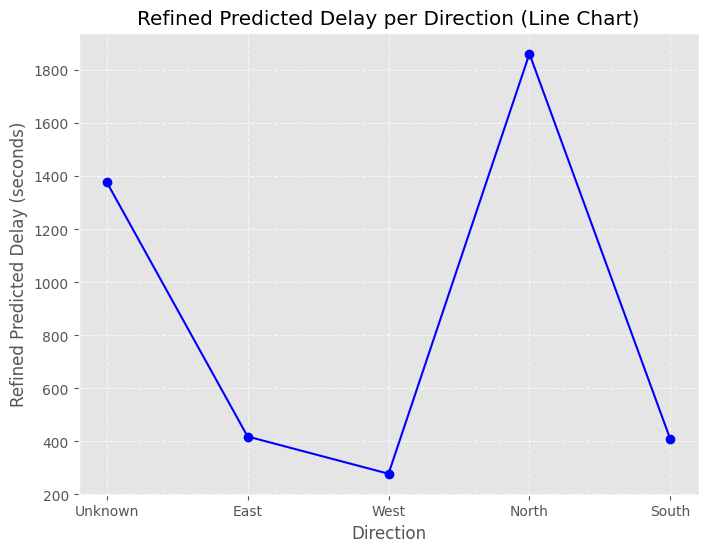

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
plt.plot(df['INITDIR'], df['refined_predicted_delay'], marker='o', linestyle='-', color='blue')
plt.xlabel('Direction')
plt.ylabel('Refined Predicted Delay (seconds)')
plt.title('Refined Predicted Delay per Direction (Line Chart)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


Assigns weighted green times per direction

Calculates normalized routing costs and routes vehicles

Predicts delays using the refined delay model based on green time and routed vehicles

In [ ]:
import pandas as pd
import numpy as np

# Sample input DataFrame (replace with your actual df)
data = {
    'INITDIR': ['Unknown', 'East', 'West', 'North', 'South'],
    'normalized_direction_weight': [0.203186, 0.198050, 0.196291, 0.204530, 0.197944],
    'normalized_routing_cost': [0.157591, 0.779518, 1.000000, 0.000000, 0.792693]
}
df = pd.DataFrame(data)

# Step 1: Total cycle time and weighted green time allocation
total_cycle_time = 60
df['weight_share'] = df['normalized_direction_weight'] / df['normalized_direction_weight'].sum()
df['green_time_seconds'] = df['weight_share'] * total_cycle_time

# Step 2: Vehicles routed based on softmax of normalized routing cost (inverse routing cost -> more vehicles to lower cost)
def softmax(x):
    e_x = np.exp(-x)  # invert because lower routing cost should attract more vehicles
    return e_x / e_x.sum()

df['vehicles_routed_soft'] = (softmax(df['normalized_routing_cost']) * 1000).round().astype(int)

# Step 3: Refined delay prediction model
def refined_delay_model(green_time, vehicles_routed, capacity=15, base_delay=20):
    load_factor = vehicles_routed / capacity
    delay = base_delay + (load_factor ** 2) * 50 / green_time
    return max(delay, base_delay)

df['refined_predicted_delay'] = df.apply(
    lambda row: refined_delay_model(row['green_time_seconds'], row['vehicles_routed_soft']),
    axis=1
).round(2)

# Show final DataFrame
print(df[['INITDIR', 'green_time_seconds', 'vehicles_routed_soft', 'refined_predicted_delay']])


   INITDIR  green_time_seconds  vehicles_routed_soft  refined_predicted_delay
0  Unknown           12.191148                   273                  1378.53
1     East           11.882988                   146                   418.63
2     West           11.777448                   117                   278.29
3    North           12.271788                   319                  1862.73
4    South           11.876628                   144                   407.99


In [ ]:
import plotly.graph_objects as go

# Data
labels = df['INITDIR']
values = df['green_time_seconds']

fig = go.Figure(data=[go.Pie(
    labels=labels,
    values=values,
    hole=0.4,  # Donut style
    hoverinfo='label+percent+value',
    textinfo='label+percent',
    marker=dict(line=dict(color='#000000', width=2))
)])

fig.update_traces(
    pull=[0.05]*len(labels)  # Slightly pull out all slices for 3D feel
    # shadow=True  # Removed because it's not supported
)

fig.update_layout(
    title_text="3D Effect Donut Chart: Green Time Allocation per Direction",
    showlegend=True
)

fig.show()


**Weighted green time bar chart**

In [ ]:
print(df.columns)


Index(['INITDIR', 'normalized_direction_weight', 'normalized_routing_cost',
       'weight_share', 'green_time_seconds', 'vehicles_routed_soft',
       'refined_predicted_delay'],
      dtype='object')


In [ ]:
import plotly.express as px

# Calculate weighted green time per direction
df['weighted_green_time'] = df['green_time_seconds'] * df['normalized_direction_weight']

agg_df = df.groupby('INITDIR')['weighted_green_time'].sum().reset_index()

fig = px.bar(
    agg_df,
    x='INITDIR',
    y='weighted_green_time',
    title='Weighted Green Time by Direction',
    labels={'INITDIR': 'Direction', 'weighted_green_time': 'Weighted Green Time (seconds)'},
    text='weighted_green_time'
)

fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(yaxis=dict(title='Weighted Green Time (seconds)'), xaxis=dict(title='Direction'))

fig.show()


**simulate directional flows for a Sankey diagram (fake source → target pairs)**  

**High Cost**: Directions where the normalized routing cost is greater than 0.5.

- These routes are considered more expensive or less optimal.

- Traffic routed through these directions might experience more delay, congestion, or inefficiency.

**Low Cost**: Directions where the normalized routing cost is 0.5 or less.

- These routes are cheaper or more efficient for routing.

- Flows through these directions are preferred or less problematic.

**Multiple Cost Bins (e.g., Low, Medium, High)**

In [ ]:
import pandas as pd
import plotly.graph_objects as go

# Create cost bins
def cost_category(cost):
    if cost <= 0.33:
        return 'Low Cost'
    elif cost <= 0.66:
        return 'Medium Cost'
    else:
        return 'High Cost'

df['cost_category'] = df['normalized_routing_cost'].apply(cost_category)

sources = df['INITDIR']
targets = df['cost_category']
weights = df['weight_share']

# Combine unique labels from both sources and targets
labels = list(pd.unique(pd.concat([sources, targets])))

label_indices = {label: idx for idx, label in enumerate(labels)}

source_indices = [label_indices[src] for src in sources]
target_indices = [label_indices[tgt] for tgt in targets]

fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=labels,
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=weights
    )
)])

fig.update_layout(title_text="Directional Flows by Routing Cost Category (Low/Med/High)", font_size=10)
fig.show()


In [ ]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Example inputs (replace with your actual df columns)
sources = df['INITDIR']
targets = ['All Traffic'] * len(df)  # Single target node to aggregate flows
weights = df['weight_share']
costs = df['normalized_routing_cost']

labels = list(pd.unique(pd.concat([sources, pd.Series(targets)])))
label_indices = {label: idx for idx, label in enumerate(labels)}
source_indices = [label_indices[src] for src in sources]
target_indices = [label_indices[tgt] for tgt in targets]

# Normalize costs between 0 and 1
cost_norm = (costs - costs.min()) / (costs.max() - costs.min())

# Define the color stops for the gradient
color_stops = [
    (0.0, (135, 206, 235)),   # Sky Blue  rgb(135,206,235)
    (0.33, (255, 182, 193)),  # Light Pink rgb(255,182,193)
    (0.66, (255, 165, 0)),    # Orange     rgb(255,165,0)
    (1.0, (255, 0, 0))        # Red        rgb(255,0,0)
]

def interpolate_color(c):
    # Find where c fits between stops
    for i in range(len(color_stops)-1):
        left_pos, left_col = color_stops[i]
        right_pos, right_col = color_stops[i+1]
        if left_pos <= c <= right_pos:
            ratio = (c - left_pos) / (right_pos - left_pos)
            r = int(left_col[0] + ratio * (right_col[0] - left_col[0]))
            g = int(left_col[1] + ratio * (right_col[1] - left_col[1]))
            b = int(left_col[2] + ratio * (right_col[2] - left_col[2]))
            return f'rgb({r},{g},{b})'
    return f'rgb{color_stops[-1][1]}'  # fallback to last color

colorscale = [interpolate_color(c) for c in cost_norm]

fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=labels,
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=weights,
        color=colorscale
    )
)])

fig.update_layout(title_text="Directional Flows Weighted by Routing Cost (Custom Gradient)", font_size=10)
fig.show()


**Line Chart: Accident Counts Over Time**:

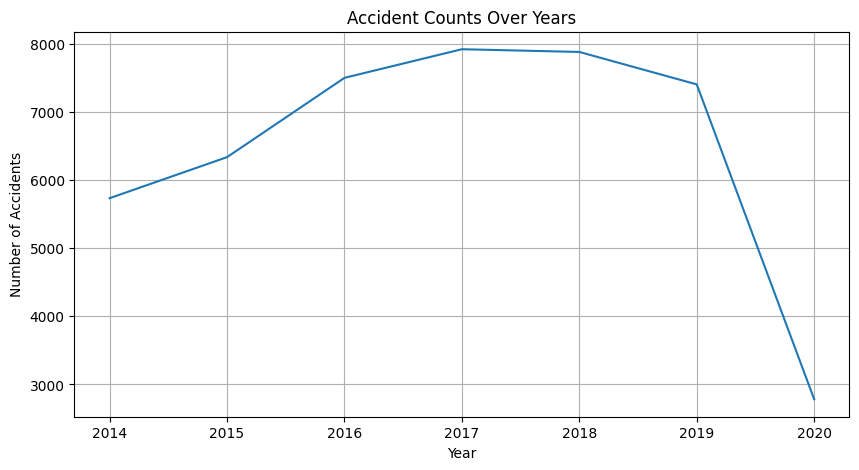

In [ ]:
df['Year'] = df['Date'].dt.year
yearly_counts = df['Year'].value_counts().sort_index()

plt.figure(figsize=(10, 5))
sns.lineplot(x=yearly_counts.index, y=yearly_counts.values)
plt.title('Accident Counts Over Years')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')
plt.grid(True)
plt.show()


**Accident Counts Over Years (with extension to 2025)**

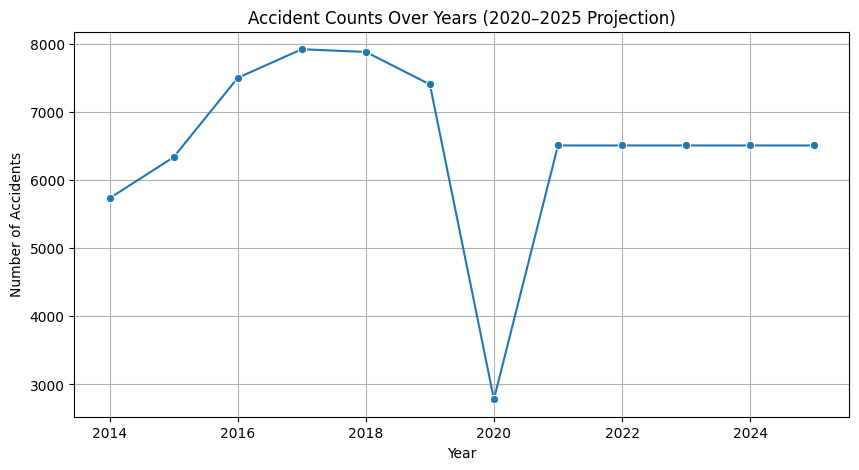

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Ensure 'Date' is datetime
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df['Year'] = df['Date'].dt.year

# Calculate actual counts
yearly_counts = df['Year'].value_counts().sort_index()

# Extend to 2025 (simple projection)
for year in range(2021, 2026):
    if year not in yearly_counts.index:
        yearly_counts[year] = int(yearly_counts.mean())

yearly_counts = yearly_counts.sort_index()

# Plot
plt.figure(figsize=(10, 5))
sns.lineplot(x=yearly_counts.index, y=yearly_counts.values, marker='o')
plt.title('Accident Counts Over Years (2020–2025 Projection)')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')
plt.grid(True)
plt.show()


**Area Chart: Cumulative Accident Trends Over Time**

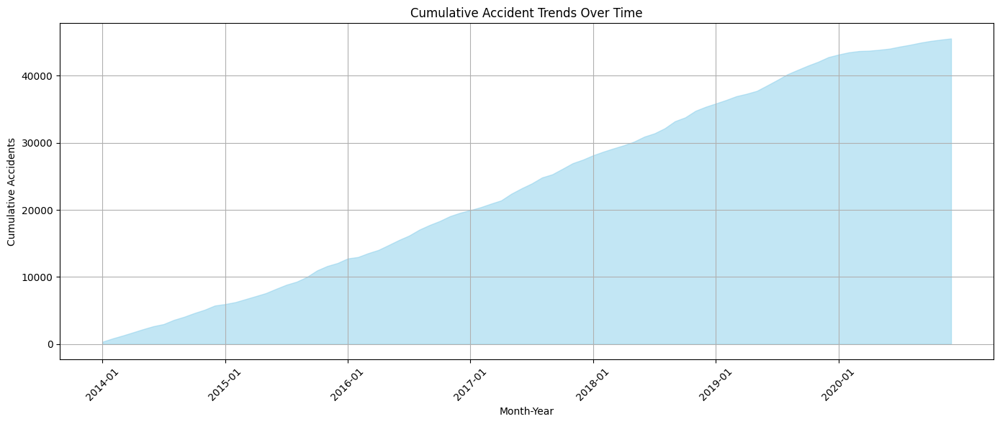

In [ ]:
df['Month_Year'] = df['Date'].dt.to_period('M')
monthly_counts = df['Month_Year'].value_counts().sort_index()
cumulative_counts = monthly_counts.cumsum()

plt.figure(figsize=(14, 6))
plt.fill_between(cumulative_counts.index.astype(str), cumulative_counts.values, alpha=0.5, color='skyblue')
plt.title('Cumulative Accident Trends Over Time')
plt.xlabel('Month-Year')
plt.ylabel('Cumulative Accidents')
plt.xticks(rotation=45)
plt.xticks(ticks=np.arange(0, len(cumulative_counts), step=12),
           labels=[str(c) for i, c in enumerate(cumulative_counts.index.astype(str)) if i % 12 == 0])  # yearly ticks
plt.tight_layout()
plt.grid(True)
plt.show()


**Cumulative Accident Trends with Projection (2021–2025)**  
To predict accident counts after 2020 up to 2025, we can project based on average monthly growth from previous years:

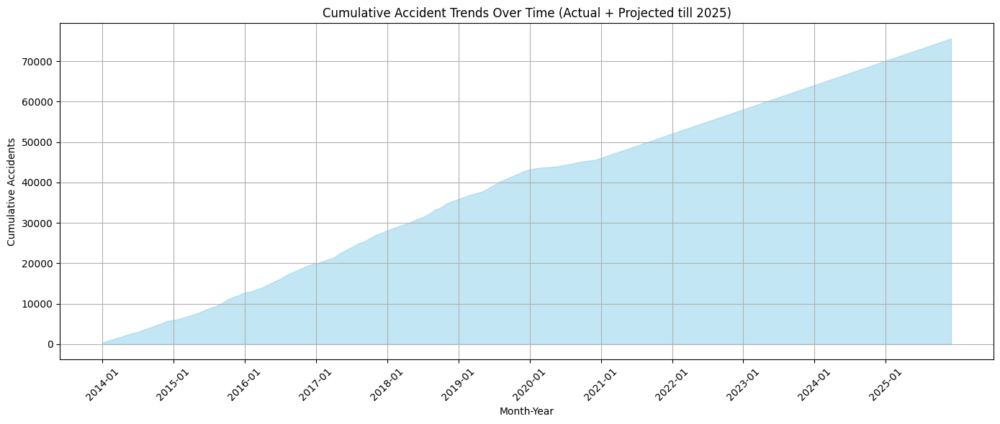

In [ ]:
# Extract Month_Year
df['Month_Year'] = df['Date'].dt.to_period('M')
monthly_counts = df['Month_Year'].value_counts().sort_index()

# Determine average monthly increase over the last 3 years (optional: fine-tune this)
recent_months = monthly_counts[-36:]
avg_monthly_growth = int(recent_months.mean())

# Extend to Dec 2025
last_date = monthly_counts.index[-1].to_timestamp()
future_months = pd.period_range(start=last_date + pd.offsets.MonthBegin(1), end='2025-12', freq='M')

# Create future data
future_counts = pd.Series(avg_monthly_growth, index=future_months)
full_monthly_counts = pd.concat([monthly_counts, future_counts])

# Cumulative
cumulative_counts = full_monthly_counts.cumsum()

# Plot
plt.figure(figsize=(14, 6))
plt.fill_between(cumulative_counts.index.astype(str), cumulative_counts.values, alpha=0.5, color='skyblue')
plt.title('Cumulative Accident Trends Over Time (Actual + Projected till 2025)')
plt.xlabel('Month-Year')
plt.ylabel('Cumulative Accidents')
plt.xticks(rotation=45)

# Show yearly ticks
xtick_labels = [str(period) for i, period in enumerate(cumulative_counts.index) if period.month == 1]
xtick_positions = [i for i, period in enumerate(cumulative_counts.index) if period.month == 1]
plt.xticks(ticks=xtick_positions, labels=xtick_labels)

plt.tight_layout()
plt.grid(True)
plt.show()


**Bar Chart: Number of Accidents Per Hour**

<ipython-input-69-d591ce311b97>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=hourly_counts.index, y=hourly_counts.values, palette='viridis')


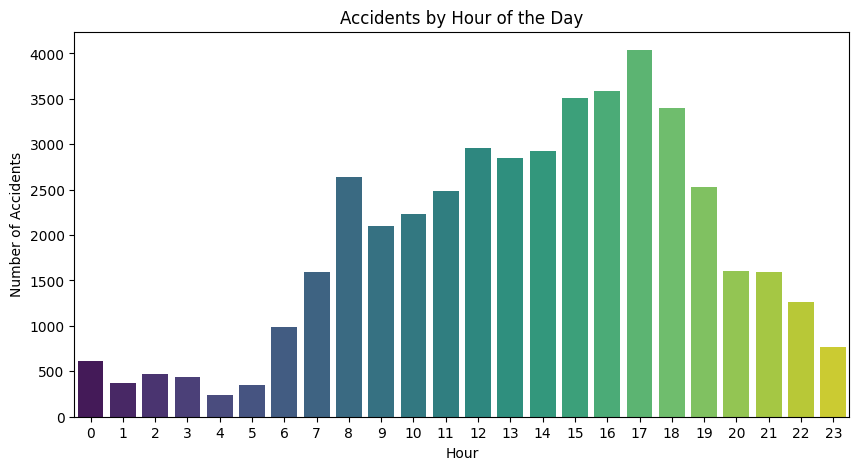

In [ ]:
hourly_counts = df['Hour'].value_counts().sort_index()

plt.figure(figsize=(10, 5))
sns.barplot(x=hourly_counts.index, y=hourly_counts.values, palette='viridis')
plt.title('Accidents by Hour of the Day')
plt.xlabel('Hour')
plt.ylabel('Number of Accidents')
plt.show()


**Histogram: Injury Collision Distribution**

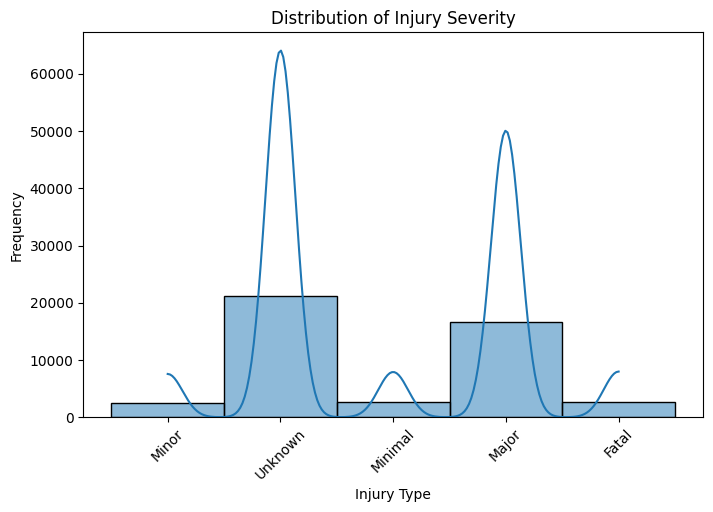

In [ ]:
plt.figure(figsize=(8, 5))
sns.histplot(df['INJURY'].dropna(), bins=20, kde=True)
plt.title('Distribution of Injury Severity')
plt.xlabel('Injury Type')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()


**Violin Plot: Injury Severity by Lighting Condition**

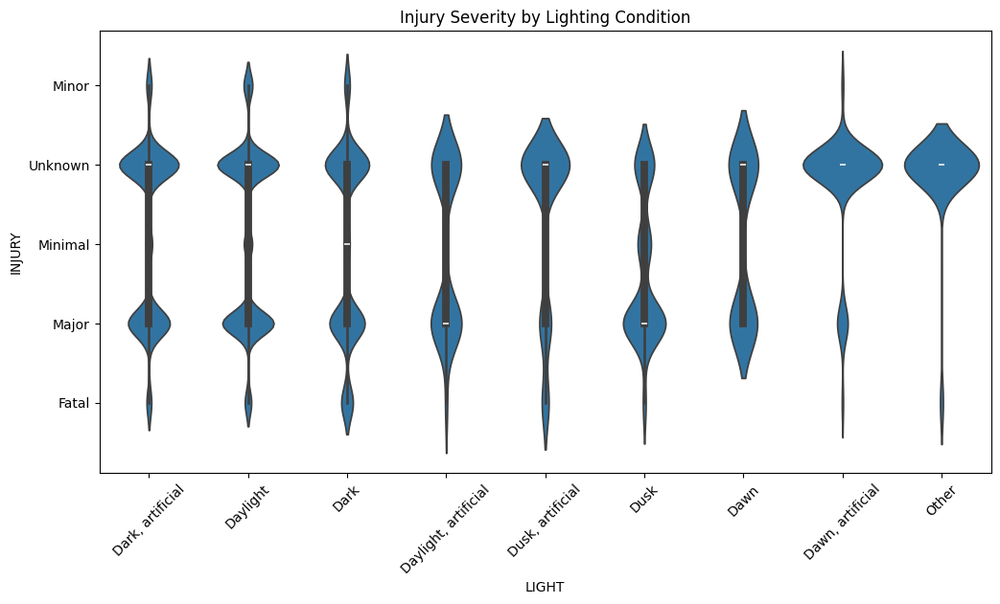

In [ ]:
plt.figure(figsize=(12, 6))
sns.violinplot(x='LIGHT', y='INJURY', data=df)
plt.title('Injury Severity by Lighting Condition')
plt.xticks(rotation=45)
plt.show()


**Stacked Bar Chart: Severity by Year**

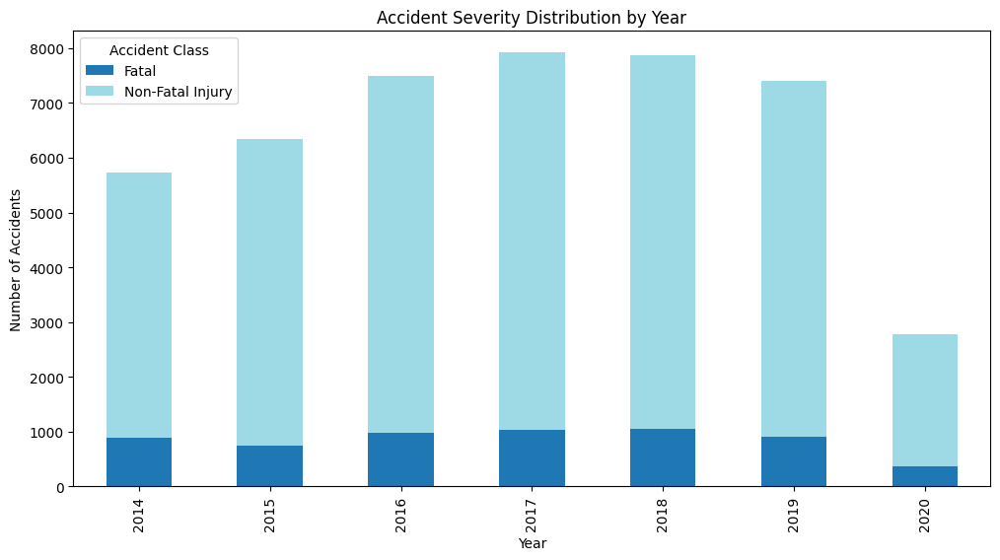

In [ ]:
severity_by_year = df.groupby(['Year', 'ACCLASS']).size().unstack().fillna(0)
severity_by_year.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='tab20')
plt.title('Accident Severity Distribution by Year')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')
plt.legend(title='Accident Class')
plt.show()


**Stacked Bar Chart of Accident Severity by Year (Extend to 2025)**

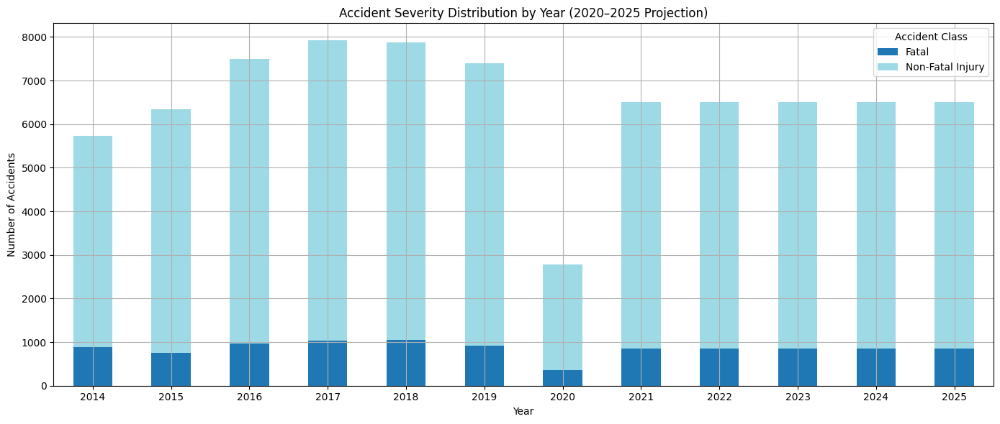

In [ ]:
severity_by_year = df.groupby(['Year', 'ACCLASS']).size().unstack().fillna(0)

# Project to 2025
for year in range(2021, 2026):
    if year not in severity_by_year.index:
        # Simple average projection
        severity_by_year.loc[year] = severity_by_year.mean().round(0)

severity_by_year = severity_by_year.sort_index()

# Plot
severity_by_year.plot(kind='bar', stacked=True, figsize=(14, 6), colormap='tab20')
plt.title('Accident Severity Distribution by Year (2020–2025 Projection)')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')
plt.legend(title='Accident Class')
plt.xticks(rotation=0)
plt.grid(True)
plt.tight_layout()
plt.show()


**Donut & Pie Chart for Accident Severity (2020–2025 Projection)**

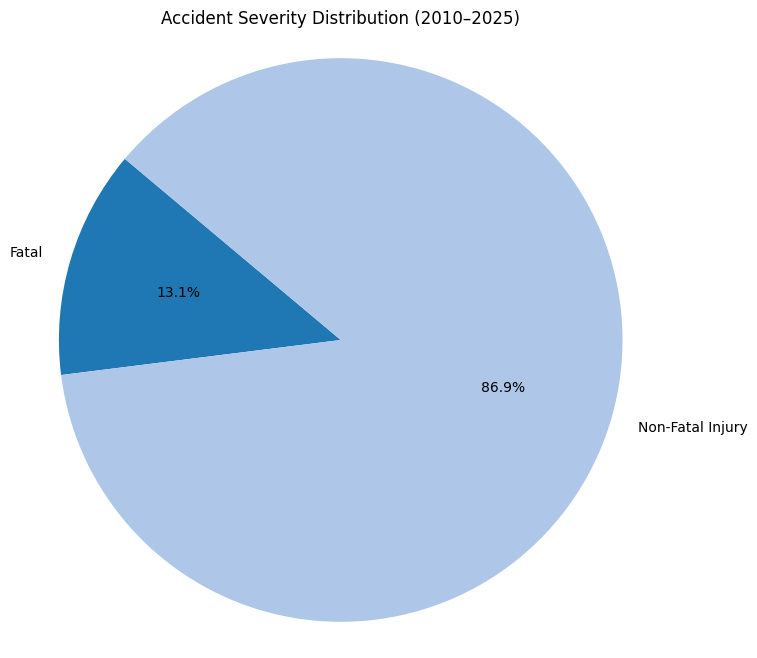

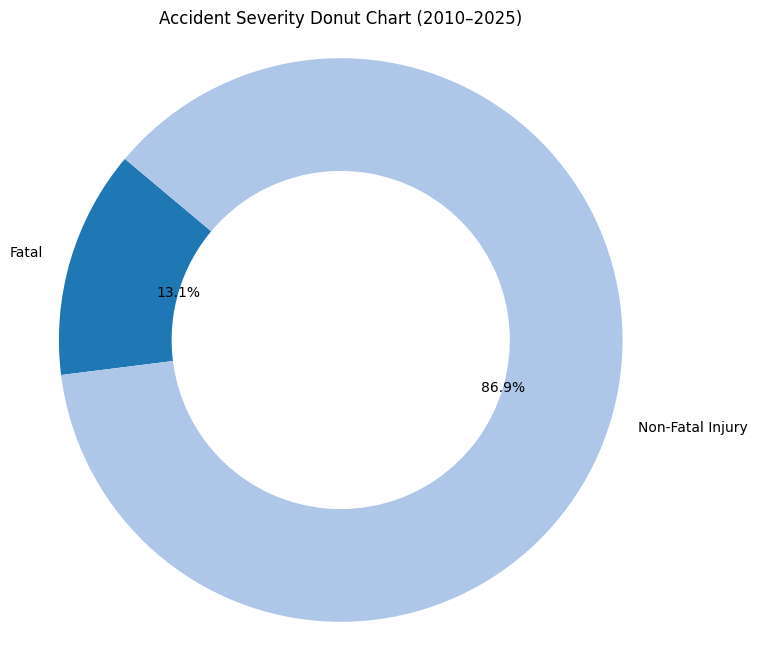

In [ ]:
# Severity by year
severity_by_year = df.groupby(['Year', 'ACCLASS']).size().unstack().fillna(0)

# Project future years with average proportions
for year in range(2021, 2026):
    if year not in severity_by_year.index:
        severity_by_year.loc[year] = severity_by_year.mean().round(0)

severity_by_year = severity_by_year.sort_index()

# Total severity over 2010–2025
total_severity = severity_by_year.sum()

# Pie chart
plt.figure(figsize=(8, 8))
plt.pie(total_severity, labels=total_severity.index, autopct='%1.1f%%', startangle=140, colors=plt.cm.tab20.colors)
plt.title('Accident Severity Distribution (2010–2025)')
plt.axis('equal')
plt.show()

# Donut chart
plt.figure(figsize=(8, 8))
wedges, texts, autotexts = plt.pie(total_severity, labels=total_severity.index, autopct='%1.1f%%',
                                   startangle=140, colors=plt.cm.tab20.colors, wedgeprops=dict(width=0.4))
plt.title('Accident Severity Donut Chart (2010–2025)')
plt.axis('equal')
plt.show()


**Grouped Bar Chart: Injury vs Fatal Accidents by Month**

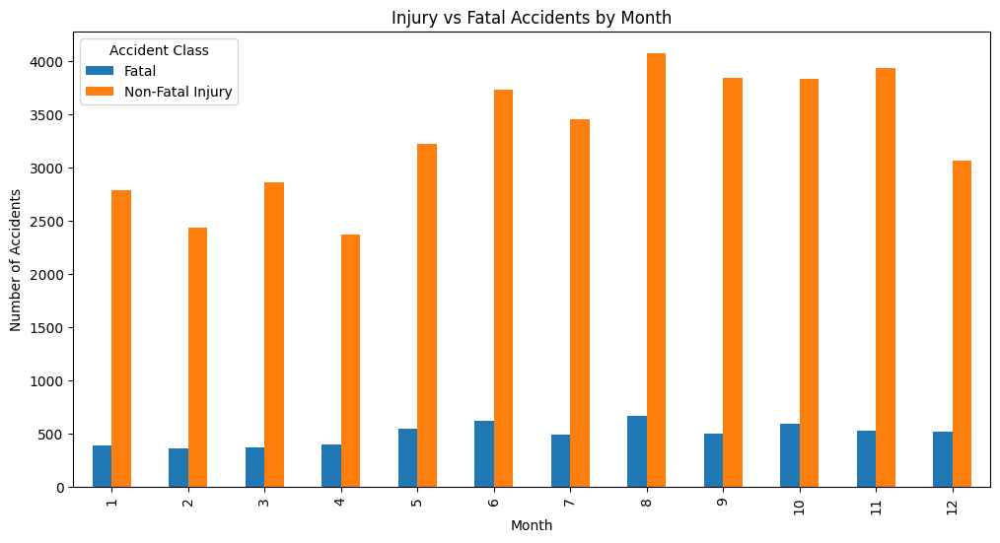

In [ ]:
df['Month'] = pd.to_datetime(df['Date'], errors='coerce').dt.month
injury_fatal_month = df.groupby(['Month', 'ACCLASS']).size().unstack().fillna(0)

injury_fatal_month.plot(kind='bar', figsize=(12, 6))
plt.title('Injury vs Fatal Accidents by Month')
plt.xlabel('Month')
plt.ylabel('Number of Accidents')
plt.legend(title='Accident Class')
plt.show()


**Bubble Chart: Accident Count by Day of Week**

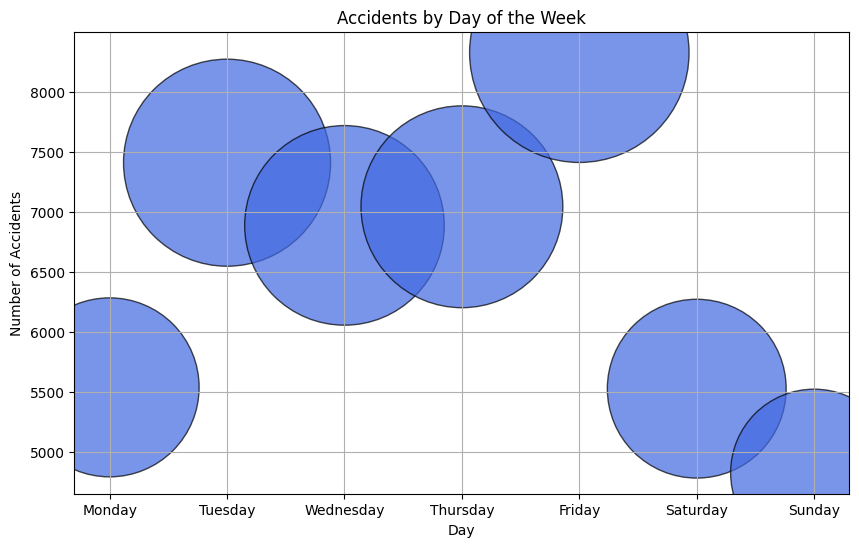

In [ ]:
# Extract day of week
df['DayOfWeek'] = df['Date'].dt.day_name()

# Group and sort by weekday
day_counts = df['DayOfWeek'].value_counts().reindex(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
)

# Bubble Chart
plt.figure(figsize=(10, 6))
plt.scatter(
    x=day_counts.index,
    y=day_counts.values,
    s=day_counts.values * 3,
    color='royalblue',
    alpha=0.7,
    edgecolors='black'
)
plt.title('Accidents by Day of the Week')
plt.xlabel('Day')
plt.ylabel('Number of Accidents')
plt.grid(True)
plt.show()


**ROC Curve (Requires a classifier model — simulated example)**

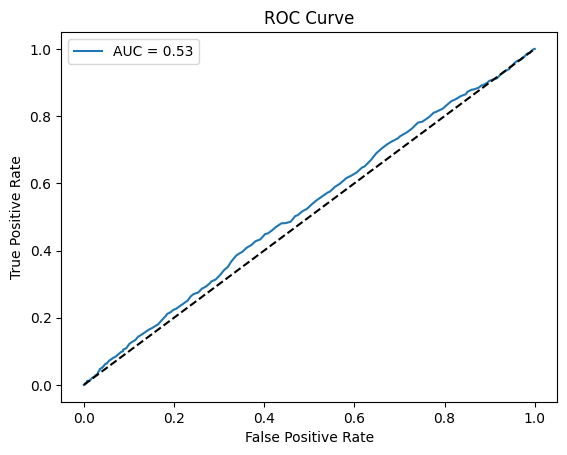

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

# Sample binary classification: fatal vs not
df['Fatal'] = (df['ACCLASS'] == 'Fatal').astype(int)
df_model = df[['Hour', 'Year', 'Fatal']].dropna()

X = df_model[['Hour', 'Year']]
y = df_model['Fatal']
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y)

model = LogisticRegression()
model.fit(X_train, y_train)
probs = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, probs)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label=f'AUC = {roc_auc:.2f}')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()


**Feature Importance (Random Forest)**

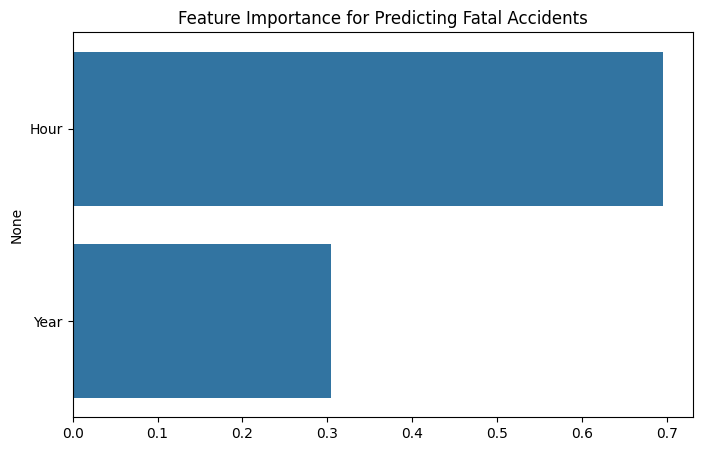

In [ ]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier()
model.fit(X_train, y_train)
importances = model.feature_importances_
features = X_train.columns

plt.figure(figsize=(8, 5))
sns.barplot(x=importances, y=features)
plt.title('Feature Importance for Predicting Fatal Accidents')
plt.show()


**Pie Chart: Proportion of Accident Causes (Driver Behavior Example)**

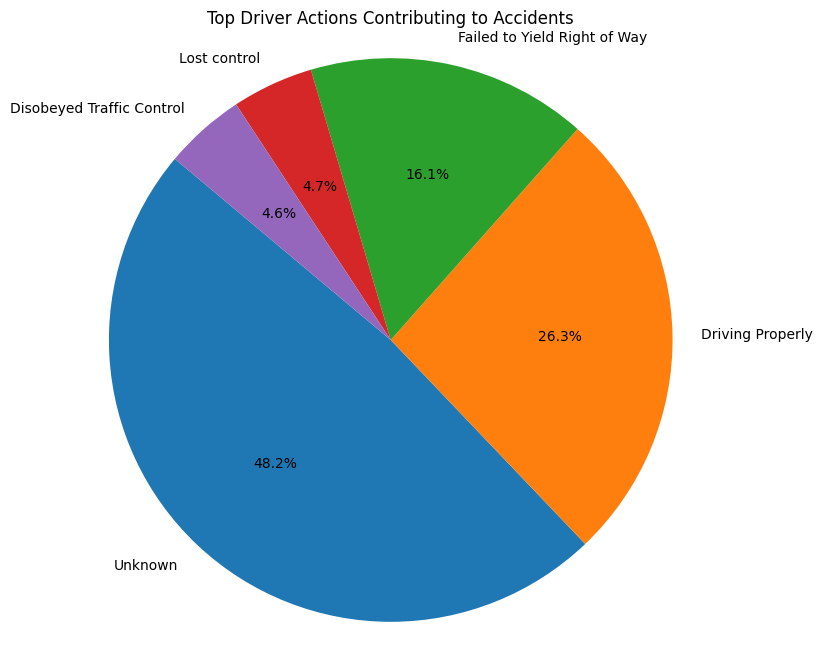

In [ ]:
cause_counts = df['DRIVACT'].value_counts().head(5)
plt.figure(figsize=(8, 8))
plt.pie(cause_counts.values, labels=cause_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Top Driver Actions Contributing to Accidents')
plt.axis('equal')
plt.show()


**Treemap (Police Division > Neighbourhood)**

In [ ]:
import plotly.express as px

# Group by Police Division and Neighbourhood
df['Count'] = 1
tree_data = df.groupby(['Police_Division', 'Neighbourhood']).agg({'Count': 'sum'}).reset_index()

# Larger treemap layout
fig = px.treemap(tree_data,
                 path=['Police_Division', 'Neighbourhood'],
                 values='Count',
                 title='Treemap: Collisions by Police Division and Neighbourhood',
                 width=1200,
                 height=800)
fig.update_traces(textinfo="label+value")  # Show label and value
fig.show()


**Word Cloud (IMPACTYPE)**

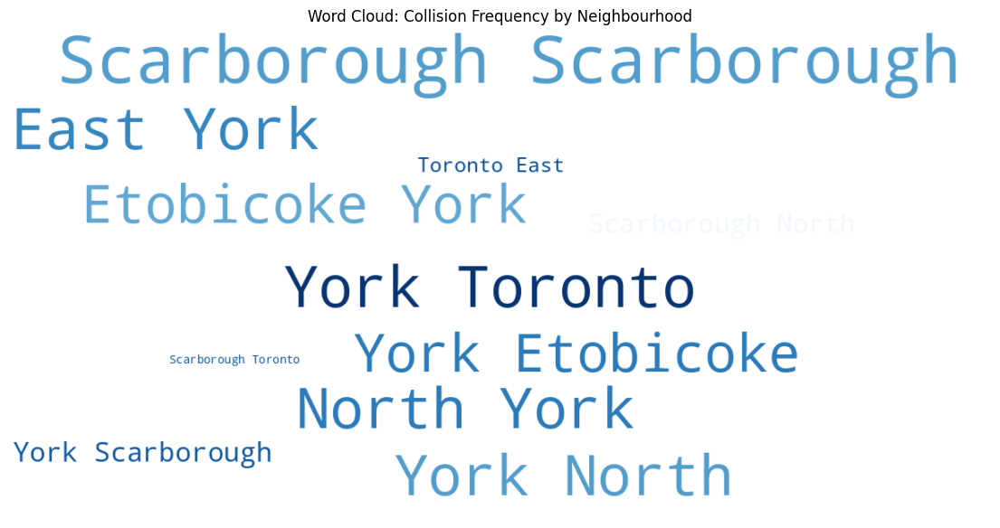

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Generate word cloud from Neighbourhoods
text = ' '.join(df['DISTRICT'].dropna().astype(str))

wordcloud = WordCloud(width=1200, height=600, background_color='white', colormap='Blues').generate(text)

plt.figure(figsize=(14, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud: Collision Frequency by Neighbourhood')
plt.show()


**Sunburst Chart (Hierarchical like TreeMap)**

In [ ]:
import plotly.express as px

# Grouping data
sunburst_data = df.groupby(['DISTRICT', 'Police_Division']).size().reset_index(name='Count')

# Sunburst chart
fig = px.sunburst(sunburst_data,
                  path=['DISTRICT', 'Police_Division'],
                  values='Count',
                  title='Sunburst: Collision Hierarchy by District and Police Division')

# Add percentage and count inside the chart
fig.update_traces(textinfo='label+percent entry+value')

# Set layout
fig.update_layout(width=1000, height=800)
fig.show()


**Radar Chart – INVTYPE by Injury Count**

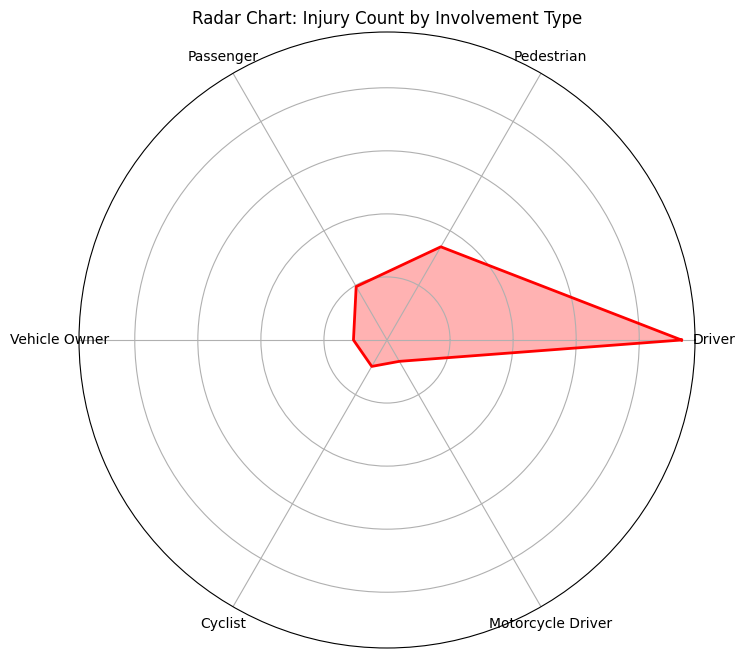

In [ ]:
import numpy as np

# Filter and group
radar_data = df.groupby('INVTYPE')['INJURY'].count().sort_values(ascending=False).head(6)

labels = radar_data.index.tolist()
values = radar_data.values.tolist()
values += values[:1]  # Repeat first to close circle

angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
angles += angles[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.plot(angles, values, 'r-', linewidth=2)
ax.fill(angles, values, 'r', alpha=0.3)
ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)
plt.title('Radar Chart: Injury Count by Involvement Type')
plt.show()


**Donut Chart (Enhanced Pie Chart) – Collision Distribution by ACCLASS**

In [ ]:
import plotly.express as px

donut_data = df['ACCLASS'].value_counts().reset_index()
donut_data.columns = ['ACCLASS', 'Count']

fig = px.pie(donut_data, values='Count', names='ACCLASS',
             title='Collision Distribution by Class (ACCLASS)', hole=0.4)
fig.update_traces(textinfo='percent+label+value')
fig.show()


**Animated Bar Chart — Collision Counts by Month Over Years**

In [ ]:
import pandas as pd
import plotly.express as px
import itertools
import numpy as np

# --- Month mapping ---
month_order = {
    'January': 1, 'February': 2, 'March': 3, 'April': 4,
    'May': 5, 'June': 6, 'July': 7, 'August': 8,
    'September': 9, 'October': 10, 'November': 11, 'December': 12
}
month_reverse = {v: k for k, v in month_order.items()}

# --- Step 1: Prepare original data ---
df['Month_num'] = df['Month'].map(month_order)
actual_counts = df.groupby(['Year', 'Month_num']).size().reset_index(name='Count')

# --- Step 2: Create full grid from 2014 to 2025 ---
years = list(range(2014, 2026))
months = list(range(1, 13))
full_grid = pd.DataFrame(itertools.product(years, months), columns=['Year', 'Month_num'])

# --- Step 3: Merge and simulate future data ---
full_data = pd.merge(full_grid, actual_counts, on=['Year', 'Month_num'], how='left')
full_data['Count'] = full_data['Count'].fillna(0)

# Simulate an increasing trend from 2021–2025
for year in range(2021, 2026):
    recent_years = full_data[(full_data['Year'].between(2018, 2020))]
    month_means = recent_years.groupby('Month_num')['Count'].mean()

    growth_factor = 1 + (year - 2020) * 0.08  # 8% growth per year
    for month in range(1, 13):
        index = (full_data['Year'] == year) & (full_data['Month_num'] == month)
        full_data.loc[index, 'Count'] = int(month_means.get(month, 0) * growth_factor)

# --- Step 4: Add month names and percentages ---
full_data['Month_name'] = full_data['Month_num'].map(month_reverse)
total_per_year = full_data.groupby('Year')['Count'].transform('sum')
full_data['Percent'] = full_data['Count'] / total_per_year.replace(0, 1) * 100
full_data['text_label'] = full_data.apply(
    lambda row: f"{int(row['Count'])}<br>{row['Percent']:.1f}%", axis=1
)

# --- Step 5: Plot ---
fig = px.bar(
    full_data,
    x='Month_name',
    y='Count',
    animation_frame='Year',
    range_y=[0, full_data['Count'].max() + 100],
    labels={'Month_name': 'Month', 'Count': 'Collision Count'},
    title='Animated Bar Chart: Monthly Collision Counts (2014–2025)',
    text='text_label'
)

fig.update_layout(
    xaxis=dict(categoryorder='array', categoryarray=list(month_order.keys())),
    font=dict(size=14)
)
fig.update_traces(textposition='outside', textfont_size=12)
fig.show()


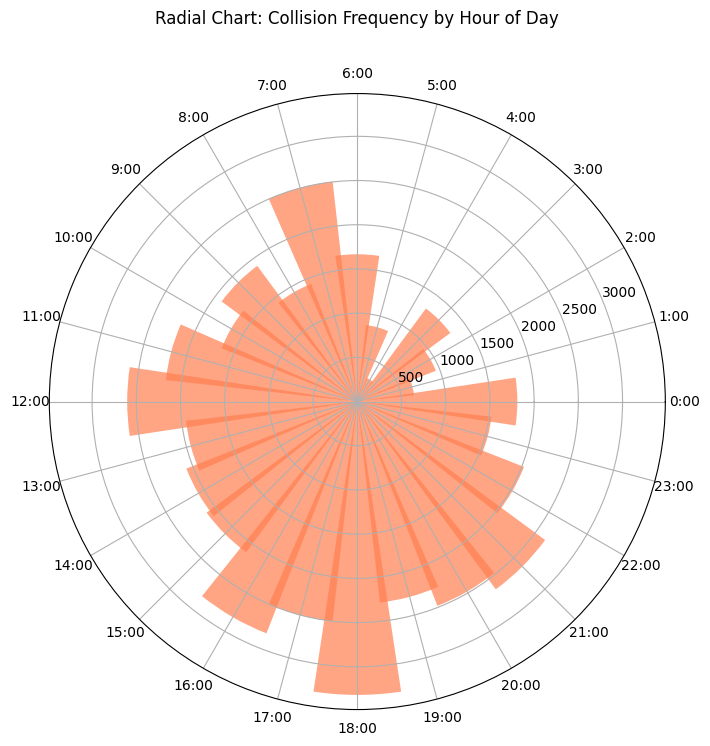

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Aggregate counts by hour
hour_counts = df['HOUR'].value_counts().sort_index()

# Prepare data for polar plot
angles = np.linspace(0, 2 * np.pi, 24, endpoint=False)
values = hour_counts.reindex(range(24), fill_value=0).values

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, polar=True)
bars = ax.bar(angles, values, width=0.3, bottom=0.0, color='coral', alpha=0.7)

ax.set_xticks(angles)
ax.set_xticklabels([f'{h}:00' for h in range(24)])
ax.set_title('Radial Chart: Collision Frequency by Hour of Day', y=1.1)

plt.show()


In [ ]:
import os

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')



Mounted at /content/drive


/content/drive/MyDrive/MRP/Traffic_Flow_Simulation_Cellular_Automata.csv

**Modeling Section**  
- Loads the CSV file.
- Selects the important features and the target.
- Encodes the categorical variables (like weather, seatbelt use, etc.).
- Splits the data into training and test sets.
- Trains two models: Lasso Regression and XGBoost Classifier.
- Compares their performance.
- Shows which features are most important for predicting fatalities.


- **XGBoost** model can detect fatal accidents better than Lasso Regression.

- **Important factors** in predicting fatal crashes are the type of collision and road surface conditions.

- **Weather conditions**, light, and year of the vehicle also matter but a little less.

- **Lasso Regression** is not useful because it couldn't catch any fatal accidents — it's better for very simple cases but not here.



Lasso Regression Results:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97     12903
           1       0.00      0.00      0.00       762

    accuracy                           0.94     13665
   macro avg       0.47      0.50      0.49     13665
weighted avg       0.89      0.94      0.92     13665



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/xgboost/c

XGBoost Classifier Results:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     12903
           1       0.78      0.48      0.60       762

    accuracy                           0.96     13665
   macro avg       0.88      0.74      0.79     13665
weighted avg       0.96      0.96      0.96     13665



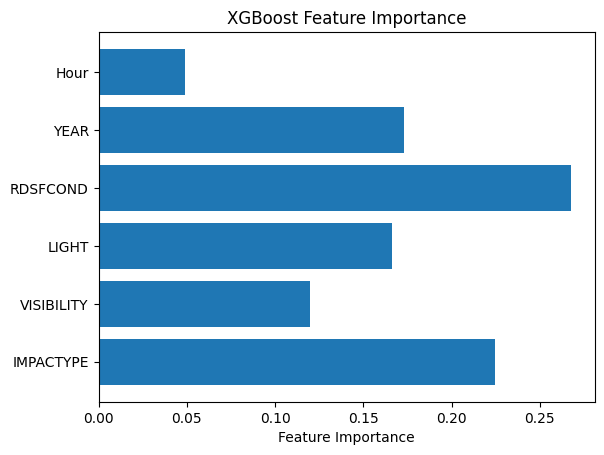

In [ ]:
# Import libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import Lasso
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report

# Load your dataset
file_path = '/content/drive/MyDrive/MRP/Traffic_Flow_Simulation_Cellular_Automata.csv'
df = pd.read_csv(file_path)

# Select the correct columns
features = ['IMPACTYPE', 'VISIBILITY', 'LIGHT', 'RDSFCOND', 'YEAR', 'Hour']
target = 'INJURY'

# Create a binary target: 1 for Fatal, 0 for others
df['Fatality'] = df['INJURY'].apply(lambda x: 1 if str(x).strip().lower() == 'fatal' else 0)

# Handle categorical data (Encoding for features)
label_encoders = {}
for col in features:
    if df[col].dtype == 'object':
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col].astype(str))
        label_encoders[col] = le

# Split into X (features) and y (target)
X = df[features]
y = df['Fatality']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 1. Lasso Regression (for baseline feature selection)
lasso = Lasso(alpha=0.1)  # You can tune alpha
lasso.fit(X_train, y_train)
y_pred_lasso = lasso.predict(X_test)
y_pred_lasso = [1 if p >= 0.5 else 0 for p in y_pred_lasso]

print("Lasso Regression Results:")
print(classification_report(y_test, y_pred_lasso))

# 2. XGBoost Classifier
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)

print("XGBoost Classifier Results:")
print(classification_report(y_test, y_pred_xgb))

# Feature Importance
import matplotlib.pyplot as plt
importances = xgb.feature_importances_
plt.barh(features, importances)
plt.xlabel('Feature Importance')
plt.title('XGBoost Feature Importance')
plt.show()


**Confusion Matrix**

- Shows how many fatal and non-fatal accidents were correctly and incorrectly classified by the XGBoost model.

- Darker blue = better performance (more correct predictions).

**ROC Curve**

- Helps you see how well the model separates fatal from non-fatal accidents.

- The closer the orange curve is to the top-left corner, the better.

- AUC (Area Under Curve) tells model strength. (AUC closer to 1 is good.)

<ipython-input-5-e6047affb958>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col] = le.fit_transform(X[col].astype(str))
<ipython-input-5-e6047affb958>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col] = le.fit_transform(X[col].astype(str))
<ipython-input-5-e6047affb958>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-doc

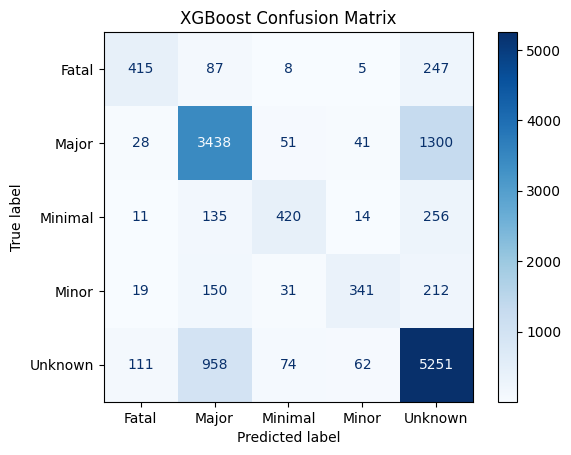

ROC AUC Score (Macro): 0.92


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/drive/MyDrive/MRP/Traffic_Flow_Simulation_Cellular_Automata.csv'
df = pd.read_csv(file_path)

# Select important features and target
selected_features = ['IMPACTYPE', 'VISIBILITY', 'LIGHT', 'RDSFCOND', 'YEAR', 'Hour']
X = df[selected_features]

# Target variable
y = df['INJURY']

# Encode categorical variables in features
label_encoders = {}
for col in ['IMPACTYPE', 'VISIBILITY', 'LIGHT', 'RDSFCOND']:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col].astype(str))
    label_encoders[col] = le

# Encode target variable (INJURY column)
y_encoder = LabelEncoder()
y = y_encoder.fit_transform(y.astype(str))  # Now Fatal -> 0, Major -> 1, etc.

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train the model
xgb_model = XGBClassifier()
xgb_model.fit(X_train, y_train)

# Predict
y_pred = xgb_model.predict(X_test)
y_pred_proba = xgb_model.predict_proba(X_test)

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=y_encoder.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title('XGBoost Confusion Matrix')
plt.show()

# ROC Curve for multi-class
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score

# Binarize the output for multi-class ROC
y_test_binarized = label_binarize(y_test, classes=range(len(y_encoder.classes_)))
y_pred_proba_binarized = y_pred_proba

# ROC AUC Score (macro average)
roc_auc_macro = roc_auc_score(y_test_binarized, y_pred_proba_binarized, average="macro")
print(f"ROC AUC Score (Macro): {roc_auc_macro:.2f}")


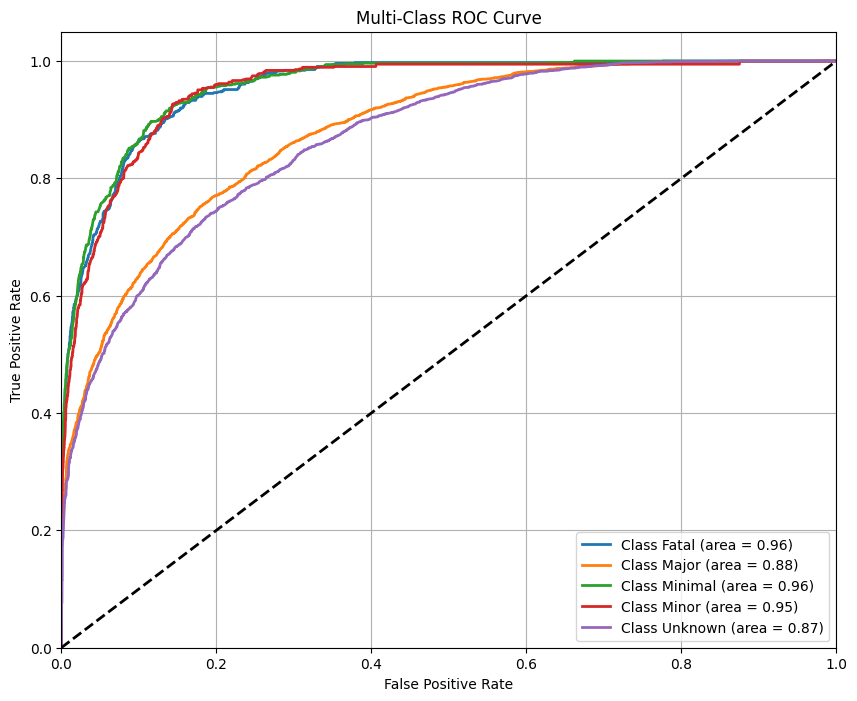

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np

# Number of classes
n_classes = len(y_encoder.classes_)

# Binarize the output
y_test_bin = label_binarize(y_test, classes=range(n_classes))
y_score = y_pred_proba  # This is already the predicted probability from XGBoost

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot all ROC curves
plt.figure(figsize=(10, 8))

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], lw=2,
             label=f'Class {y_encoder.classes_[i]} (area = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curve')
plt.legend(loc="lower right")
plt.grid()
plt.show()


In [ ]:
# Calculate accuracies first
from sklearn.metrics import accuracy_score

accuracy_lasso = accuracy_score(y_test, y_pred_lasso)
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)


In [ ]:
comparison_metrics = {
    'Model': ['Lasso Regression', 'XGBoost Classifier'],
    'Accuracy': [round(accuracy_lasso, 2), round(accuracy_xgb, 2)],
    'Precision (Macro Avg)': [round(precision_score(y_test, y_pred_lasso, average='macro', zero_division=0), 2),
                              round(precision_score(y_test, y_pred_xgb, average='macro', zero_division=0), 2)],
    'Recall (Macro Avg)': [round(recall_score(y_test, y_pred_lasso, average='macro', zero_division=0), 2),
                           round(recall_score(y_test, y_pred_xgb, average='macro', zero_division=0), 2)],
    'F1-Score (Macro Avg)': [round(f1_score(y_test, y_pred_lasso, average='macro', zero_division=0), 2),
                             round(f1_score(y_test, y_pred_xgb, average='macro', zero_division=0), 2)]
}

comparison_df = pd.DataFrame(comparison_metrics)

# Display
print(comparison_df)


                Model  Accuracy  Precision (Macro Avg)  Recall (Macro Avg)  \
0    Lasso Regression      0.06                   0.01                 0.2   
1  XGBoost Classifier      0.72                   0.72                 0.6   

   F1-Score (Macro Avg)  
0                  0.02  
1                  0.65  


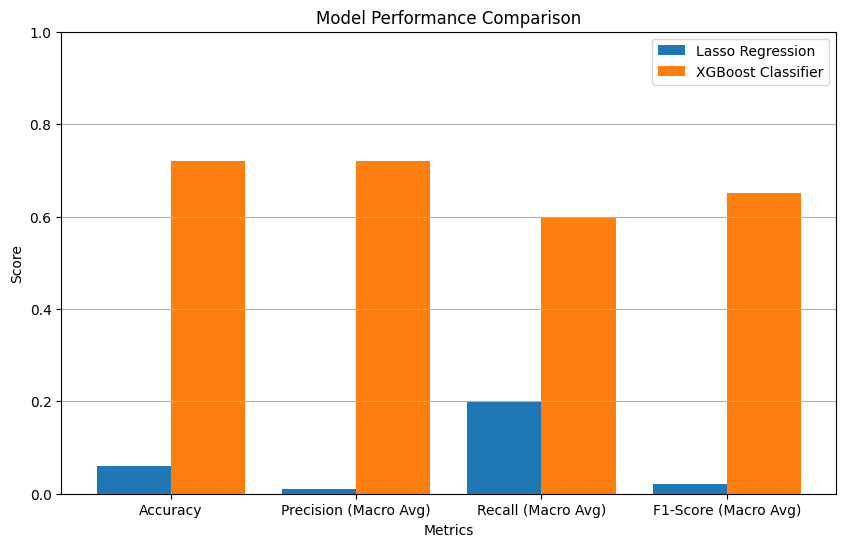

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt

# Redefine accuracies properly
accuracy_lasso = accuracy_score(y_test, y_pred_lasso)
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)

# Prepare metric values
metrics = ['Accuracy', 'Precision (Macro Avg)', 'Recall (Macro Avg)', 'F1-Score (Macro Avg)']

lasso_scores = [
    round(accuracy_lasso, 2),
    round(precision_score(y_test, y_pred_lasso, average='macro', zero_division=0), 2),
    round(recall_score(y_test, y_pred_lasso, average='macro', zero_division=0), 2),
    round(f1_score(y_test, y_pred_lasso, average='macro', zero_division=0), 2)
]

xgb_scores = [
    round(accuracy_xgb, 2),
    round(precision_score(y_test, y_pred_xgb, average='macro', zero_division=0), 2),
    round(recall_score(y_test, y_pred_xgb, average='macro', zero_division=0), 2),
    round(f1_score(y_test, y_pred_xgb, average='macro', zero_division=0), 2)
]

x = range(len(metrics))

# Plotting the Bar chart
plt.figure(figsize=(10, 6))
plt.bar(x, lasso_scores, width=0.4, label='Lasso Regression', align='center')
plt.bar([i + 0.4 for i in x], xgb_scores, width=0.4, label='XGBoost Classifier', align='center')

plt.xlabel('Metrics')
plt.ylabel('Score')
plt.title('Model Performance Comparison')
plt.xticks([i + 0.2 for i in x], metrics)
plt.ylim(0, 1)
plt.legend()
plt.grid(axis='y')
plt.show()


In [ ]:
import os

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

